# Tau PT Regression + JetID Classification Merge

In this notebook we will implement a NN that merges the regression and classification NN that we developed for pT regression and jetID, respectively.

In [1]:
import uproot4
import numpy as np
import awkward as ak
from scipy.stats import norm
from scipy.optimize import curve_fit
import os
import copy

import tensorflow.keras as keras
import tensorflow as tf
import tensorflow_model_optimization as tfmot

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential, load_model

from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.model_selection import train_test_split

import optparse
import importlib
import pathlib
from keras import optimizers
from qkeras.quantizers import quantized_bits, quantized_relu
from qkeras.qlayers import QDense, QActivation
from qkeras import QConv1D
from qkeras.utils import load_qmodel

import hist
from hist import Hist

import random

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.pyplot import cm
import mplhep as hep
plt.style.use(hep.style.ROOT)

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'medium'}
pylab.rcParams.update(params)

#line thickness
import matplotlib as mpl
mpl.rcParams['lines.linewidth'] = 5

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=500)])
    except RuntimeError as e:
        print(e)

2023-11-06 23:01:25.378935: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-06 23:01:25.527067: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-11-06 23:01:25.527097: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-11-06 23:01:28.389467: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

# Create training/testing data set

The important aspect of $\tau$ leptons is that a $\tau$ can decay to neutrinos, and either an electron and a neutrino, a muon and a neutrino, or quarks. Electrons, muons and quarks can be reconstructed in a collider detector. However, the neutrinos cannot. Neutrinos are very weakly interacting and they will just escape the detector. 

The one constraint we have for neutrinos is what we call missing transverse energy. Missing transverse energy is a constraint that originates from the fact that when we collider protons along a specific axis, the momentum transverse to that axis is conserved, or in other words. 

$$
\begin{equation}
\sum_{i=1}^{N}\vec{p_{T,i}} = 0 \\
\sum_{i\neq {\rm neutrino}}^{N}\vec{p_{T,i}} + \sum_{i= {\rm neutrino}}^{N}\vec{p_{T,i}} = 0 \\
\sum_{i= {\rm neutrino}}^{N}\vec{p_{T,i}} = -\sum_{i\neq {\rm neutrino}}^{N}\vec{p_{T,i}} \\
\rm{\vec{MET}}  = -\sum_{i\neq {\rm neutrino}}^{N}\vec{p_{T,i}} \\
\end{equation}
$$

This is what we call the MET or missing transverse energy. This is our only constraint on the neutrinos and it gives us a vector in the plane perpendicular to the collision axis along the beam.  

Here, instead of training directly for the tau's gen (truth) pT, we want to train for the ratio between the reconstructed pT and the gen pT. This is because the range of pT is so large that it makes training very uneffective. If we train for the ratio, we constrain the output better and the network is more likely to converge. It is also unitless, which means that if there is an invrance against momentum, like lorentz invariance, we can capture it in this quantity  

A technical detail here is the fact that the tau gen $p_T$ here does not include the neutrino's $p_T$.

In [2]:
seed = 1111
random.seed(seed)
tf.random.set_seed(seed)
np.random.seed(seed)


ntuples_dataset_path = "../../ntuples/Jan_25_2023"

def create_train_test_data(dir_path, test_index=400000, train = True):
        
    #Might have to change the version for other ntuple files
    sig = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    bkg = uproot4.open(dir_path+"/test_bkg_v12_emseed.root")
    qcd = uproot4.open(dir_path+"/test_qcd_v12_emseed.root")
    
    if train:
        sig_input = sig['ntuplePupSingle']['tree']['m_inputs'].array()[:test_index]
        bkg_input = bkg['ntuplePupSingle']['tree']['m_inputs'].array()[:test_index]
        qcd_input = qcd['ntuplePupSingle']['tree']['m_inputs'].array()

        truth_pt_sig = np.asarray(sig['ntuplePupSingle']['tree']['genpt1'].array()[:test_index])
        truth_pt_bkg = np.asarray(bkg['ntuplePupSingle']['tree']['genpt1'].array()[:test_index])
        truth_pt_qcd = np.asarray(qcd['ntuplePupSingle']['tree']['genpt1'].array())

        reco_pt_sig = sig['ntuplePupSingle']['tree']['pt'].array()[:test_index]
        deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[:test_index]
        eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[:test_index]
        selection_sig = (reco_pt_sig > 0.) & (abs(deltaR_sig) < 0.4) & (abs(eta_sig) < 2.4)
        y_sig_pT = truth_pt_sig[selection_sig]

        reco_pt_bkg = bkg['ntuplePupSingle']['tree']['pt'].array()[:test_index]
    else:
        sig_input = sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
        bkg_input = bkg['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
        qcd_input = qcd['ntuplePupSingle']['tree']['m_inputs'].array()

        truth_pt_sig = np.asarray(sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:])
        truth_pt_bkg = np.asarray(bkg['ntuplePupSingle']['tree']['genpt1'].array()[test_index:])
        truth_pt_qcd = np.asarray(qcd['ntuplePupSingle']['tree']['genpt1'].array())
        reco_pt_sig = sig['ntuplePupSingle']['tree']['pt'].array()[test_index:]
        deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
        eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]
        selection_sig = (reco_pt_sig > 0.) & (abs(deltaR_sig) < 0.4) & (abs(eta_sig) < 2.4)
        y_sig_pT = truth_pt_sig[selection_sig]

        reco_pt_bkg = bkg['ntuplePupSingle']['tree']['pt'].array()[test_index:]
        
    
    selection_bkg = reco_pt_bkg > 11.5
    y_bkg_pT = truth_pt_bkg[selection_bkg]
    reco_pt_qcd = qcd['ntuplePupSingle']['tree']['pt'].array()
    selection_qcd = reco_pt_qcd > 11
    y_qcd_pT = truth_pt_qcd[selection_qcd]
        
    #Inputs: pt, eta, phi, particle id(one hot encoded)
    X_sig = np.nan_to_num(np.asarray(sig_input[selection_sig]))
    y_sig = np.full(X_sig.shape[0], 1.)
    sig_pt = np.asarray(reco_pt_sig[selection_sig])
    
    X_bkg = np.nan_to_num(np.asarray(bkg_input)[selection_bkg])
    y_bkg = np.full(X_bkg.shape[0], 0.)
    bkg_pt = np.asarray(reco_pt_bkg[selection_bkg])
    
    X_qcd = np.nan_to_num(np.asarray(qcd_input)[selection_qcd])
    y_qcd = np.full(X_qcd.shape[0], 0.)
    qcd_pt = np.asarray(reco_pt_qcd[selection_qcd])
    
    background_pt = np.concatenate([bkg_pt, qcd_pt])
    
    #print(y_sig, y_bkg, y_qcd)
    
    if train:
        X_bkg = list(X_bkg)
        y_bkg = list(y_bkg)
        y_bkg_pT = list(y_bkg_pT)
        percent = 0.64
        for _ in range(int(percent*len(X_bkg))):
            n = len(X_bkg)
            random_ind = random.randint(0, n - 1)
            del X_bkg[random_ind]
            del y_bkg[random_ind]
            del y_bkg_pT[random_ind]
        X_bkg = np.asarray(X_bkg)
        y_bkg = np.asarray(y_bkg)
        y_bkg_pT = np.asarray(y_bkg_pT)
        
        X_qcd = list(X_qcd)
        y_qcd = list(y_qcd)
        y_qcd_pT = list(y_qcd_pT)
        for _ in range(int(percent*len(X_qcd))):
            n = len(X_qcd)
            random_ind = random.randint(0, n - 1)
            del X_qcd[random_ind]
            del y_qcd[random_ind]
            del y_qcd_pT[random_ind]
        X_qcd = np.asarray(X_qcd)
        y_qcd = np.asarray(y_qcd)
        y_qcd_pT = np.asarray(y_qcd_pT)

    X_train = np.concatenate([X_sig, X_bkg, X_qcd])
    print("bob")
    print(len(X_sig) / len(X_train))
    print((len(X_bkg) + len(X_qcd)) / len(X_train))

    y_train_jetID = np.concatenate([y_sig, y_bkg, y_qcd])
    MinBias_pT_1 = [1 for i in y_bkg_pT]
    qcd_pT_1 = [1 for i in y_qcd_pT]
#     y_train_pT = np.concatenate([y_sig_pT / sig_pt, y_bkg_pT / bkg_pT, y_qcd_pT / qcd_pt])
    y_train_pT = np.concatenate([y_sig_pT / sig_pt, MinBias_pT_1, qcd_pT_1])
    pt_array = np.concatenate([sig_pt, bkg_pt, qcd_pt])
    
    X_train[abs(X_train) > 1e+9] = 0.
    
    assert not np.any(np.isnan(X_train))
    assert not np.any(np.isnan(y_train_jetID))
    assert not np.any(np.isnan(y_train_pT))
    
    return X_train, y_train_jetID, y_train_pT

X_train_jetID, y_train_jetID,y_train_pT_regress = create_train_test_data(ntuples_dataset_path, train=True)
X_test_jetID, y_test_jetID, y_test_pT_regress = create_train_test_data(ntuples_dataset_path, train=False)
X_train = X_train_jetID
y_train = y_train_pT_regress
X_test = X_test_jetID
y_test = y_test_pT_regress

bob
0.48803825490353586
0.5119617450964642
bob
0.19763209133016482
0.8023679086698352


### Analyzing Performance

In [3]:
# LOADING IN MODELS

model_jetID_separate_name = '../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5'
model_jetID_separate = load_model(model_jetID_separate_name) # This is the ID model that Duc trained previously (separate tagger)

model_pt_regress_separate_name = "../models/pt_regress_v1_bestest.h5"
model_pt_regress_separate = load_model("../models/pt_regress_v1_bestest.h5") # separate pT regressor (the one trained by Orion)

model_merged_name = "../models/new_merged.h5"
model_merged = load_model(model_merged_name)

model_merged_quantized_name = "../models/quantized_merged_new_gamma30.h5"
model_merged_quantized = load_qmodel(model_merged_quantized_name) # This is the intermediate model to our final model (merged and quantized, but not pruned)

model_merged_quantized_pruned_name = "../models/quantized_merged_pruned_gamma30.h5"
model_merged_quantized_pruned = load_qmodel(model_merged_quantized_pruned_name) # Merged, quantized, pruned model (final model)

2023-11-06 23:01:53.796372: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [4]:
def plot_pt_eff_puppi(Official_Model,
                      DataPath,
                      TreeName='ntuplePupSingle',
                      test_indx=400000,
                      corrected_pt_cut=34.,
                      cut_point = 0.22):
    '''
    cut_point = 0.22. We accept anything larger than this. 
    The corresponding corrected pT cut is 34 GeV.
    '''

    sig = uproot4.open(DataPath)
    truth_tau_pt = sig[TreeName]['tree']['genpt1'].array()[test_indx:]

    reco_tau_pt = sig[TreeName]['tree']['pt'].array()[test_indx:]

    #Load model and select out the tau
    #0 index is id, 1 is pT regression
    model = Official_Model

    #Get all the inputs
    sig_input = sig[TreeName]['tree']['m_inputs'].array()[test_indx:]

    reco_pt_sig = sig[TreeName]['tree']['pt'].array()[test_indx:]
    deltaR_sig = sig[TreeName]['tree']['gendr1'].array()[test_indx:]
    eta_sig = sig[TreeName]['tree']['geneta1'].array()[test_indx:]
    
    selection_deno = (truth_tau_pt > 1.) & (abs(eta_sig) < 2.1) #"genpt1 > 1. && abs(geneta1) < 2.1 "
       
    ratio_predict = model.predict(np.asarray(sig_input))[1].flatten()
    corrected_pt_sig = np.multiply(reco_pt_sig, ratio_predict)
    selection_num_corrected = selection_deno & (abs(deltaR_sig) < 0.4) & (corrected_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    
    selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (reco_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    
    #PUPPI only pT
    puppi_pT = truth_tau_pt[selection_num]
    
    #corrected pT
    truth_tau_pt_select = truth_tau_pt[selection_num_corrected]

    X_sig = np.asarray(sig_input[selection_num_corrected])
    y_sig = model.predict(np.nan_to_num(X_sig))[0]

    nn_cut = y_sig.flatten() > cut_point
    tau_pt_nn = np.asarray(truth_tau_pt_select)[nn_cut]

    #Fill two plots and divide the two.
    pT_egdes = np.linspace(0, 150, 100) #200?
    pT_egdes = list(pT_egdes)
    pT_axis = hist.axis.Variable(pT_egdes, name = r"$ \tau_h$ $p_T^{gen}$")

    hist_all_tau = Hist(pT_axis)
    hist_selected_puppi = Hist(pT_axis)
    hist_selected_tau = Hist(pT_axis)

    hist_all_tau.fill(truth_tau_pt[selection_deno])
    hist_selected_puppi.fill(puppi_pT)
    hist_selected_tau.fill(tau_pt_nn)

    %matplotlib inline
    fig = plt.figure(figsize=(10, 12))
    _, eff_new_nn_artists = hist_selected_tau.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (New NN Score > {})".format(cut_point),
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    fig = plt.figure(figsize=(10, 12))
    _, eff_puppi_artists = hist_selected_puppi.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (PUPPI)",
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    #The real efficiency plot
    fig = plt.figure()

    eff_new_nn_x = [eff_new_nn_artists.bar.patches[i].get_x() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_y = [eff_new_nn_artists.bar.patches[i].get_y() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_err = [eff_new_nn_artists.bar.patches[i].get_height() for i in range(len(eff_new_nn_artists.bar.patches))]

    eff_puppi_x = [eff_puppi_artists.bar.patches[i].get_x() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_y = [eff_puppi_artists.bar.patches[i].get_y() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_err =  [eff_puppi_artists.bar.patches[i].get_height() for i in range(len(eff_puppi_artists.bar.patches))]
    plt.plot([],[], 'none', label=r'$p_T^{{corrected}}$ cut: {} [GeV]'.format(round(corrected_pt_cut)))
    plt.errorbar(eff_new_nn_x, eff_new_nn_y, yerr=eff_new_nn_err,
                fmt='o',
                linewidth=2,
                label = 'Merged Tau NN (NN Score > {})'.format(cut_point))

    plt.errorbar(eff_puppi_x, eff_puppi_y, yerr=eff_puppi_err,
                fmt='o',
                linewidth=2,
                label = r'PUPPI $\epsilon$ (no $p_T$ correction)')

    plt.hlines(1, 0, 150, linestyles='dashed', color='black', linewidth=3)
    plt.ylim([0.,1.1])
    plt.xlim([0,150])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$\tau_h$ $p_T^{gen}$ [GeV]")
    plt.ylabel(r"$\epsilon$(Di-$\tau_h$ trigger rate at 28 kHz)")
    plt.legend(loc = 'best', fontsize=20)
    plt.show()
    return (eff_new_nn_x, eff_new_nn_y)




# ========================================================= NO NN

def plot_pt_eff_puppi_no_nn(ModelName,
                      Model_Regress,
                      DataPath,
                      TreeName='ntuplePupSingle',
                      test_indx=400000,
                      corrected_pt_cut=1.,
                      cut_point = 0.28):
    '''
    cut_point = 0.28. We accept anything larger than this. 
    The corresponding corrected pT cut is 30 GeV.

    dir_path: directory path where the data is saved,
    '''

    sig = uproot4.open(DataPath)
    truth_tau_pt = sig[TreeName]['tree']['genpt1'].array()[test_indx:]
    reco_tau_pt = sig[TreeName]['tree']['pt'].array()[test_indx:]

    #Load model and select out the tau
    model_id = load_model(ModelName)
    model_pt_regress = load_model(Model_Regress)

    #Get all the inputs
    sig_input = sig[TreeName]['tree']['m_inputs'].array()[test_indx:]

    reco_pt_sig = sig[TreeName]['tree']['pt'].array()[test_indx:]
    deltaR_sig = sig[TreeName]['tree']['gendr1'].array()[test_indx:]
    eta_sig = sig[TreeName]['tree']['geneta1'].array()[test_indx:]

    ratio_predict = model_pt_regress.predict(np.asarray(sig_input))[1].flatten()
    corrected_pt_sig = np.multiply(reco_pt_sig, ratio_predict)

    selection_deno = (truth_tau_pt > 1.) & (abs(eta_sig) < 2.1) #"genpt1 > 1. && abs(geneta1) < 2.1 "
    selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (reco_pt_sig > corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    #Originally (reco_pt_sig>1.) 

    #Selected out the tau pt with the basic cuts first
    truth_tau_pt_select = truth_tau_pt[selection_num]

    X_sig = np.asarray(sig_input[selection_num])
    y_sig = model_id.predict(np.nan_to_num(X_sig))

    nn_cut = y_sig.flatten() > cut_point
    tau_pt_nn = np.asarray(truth_tau_pt_select)[nn_cut]

    #Fill two plots and divide the two.
    pT_egdes = np.linspace(0, 150, 100) #200?
    pT_egdes = list(pT_egdes)
    pT_axis = hist.axis.Variable(pT_egdes, name = r"$ \tau_h$ $p_T^{gen}$")

    hist_all_tau = Hist(pT_axis)
    hist_selected_puppi = Hist(pT_axis)
    hist_selected_tau = Hist(pT_axis)

    hist_all_tau.fill(truth_tau_pt[selection_deno])
    hist_selected_puppi.fill(truth_tau_pt_select)
    hist_selected_tau.fill(tau_pt_nn)

    %matplotlib inline
    fig = plt.figure(figsize=(10, 12))
    _, eff_new_nn_artists = hist_selected_tau.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (New NN Score > {})".format(cut_point),
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    fig = plt.figure(figsize=(10, 12))
    _, eff_puppi_artists = hist_selected_puppi.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (PUPPI)",
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    #The real efficiency plot
    fig = plt.figure()

    eff_new_nn_x = [eff_new_nn_artists.bar.patches[i].get_x() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_y = [eff_new_nn_artists.bar.patches[i].get_y() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_err = [eff_new_nn_artists.bar.patches[i].get_height() for i in range(len(eff_new_nn_artists.bar.patches))]

    eff_puppi_x = [eff_puppi_artists.bar.patches[i].get_x() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_y = [eff_puppi_artists.bar.patches[i].get_y() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_err =  [eff_puppi_artists.bar.patches[i].get_height() for i in range(len(eff_puppi_artists.bar.patches))]
    plt.plot([],[], 'none', label=r'$p_T^{{corrected}}$ cut: {} [GeV]'.format(round(corrected_pt_cut)))
    plt.errorbar(eff_new_nn_x, eff_new_nn_y, yerr=eff_new_nn_err,
                fmt='o',
                linewidth=2,
                label = 'Retrained Tau NN (> {})'.format(cut_point))

    plt.errorbar(eff_puppi_x, eff_puppi_y, yerr=eff_puppi_err,
                fmt='o',
                linewidth=2,
                label = 'PUPPI')

    plt.hlines(1, 0, 150, linestyles='dashed', color='black', linewidth=3)
    plt.ylim([0.,1.1])
    plt.xlim([0,150])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$\tau_h$ $p_T^{gen}$ [GeV]")
    plt.ylabel(r"$\epsilon$(Di-$\tau_h$ trigger rate at 11 kHz)")
    plt.legend(loc = 'center right')
    plt.show()
    return (eff_new_nn_x, eff_new_nn_y)


# =============================================== SEPARATE NN
def plot_pt_eff_puppi_separate(Official_Model_regress,
                      Official_Model_id,
                      DataPath,
                      TreeName='ntuplePupSingle',
                      test_indx=400000,
                      corrected_pt_cut=34.,
                      cut_point = 0.22):
    '''
    cut_point = 0.22. We accept anything larger than this. 
    The corresponding corrected pT cut is 34 GeV.
    '''

    sig = uproot4.open(DataPath)
    truth_tau_pt = sig[TreeName]['tree']['genpt1'].array()[test_indx:]

    reco_tau_pt = sig[TreeName]['tree']['pt'].array()[test_indx:]

    #Load model and select out the tau
    #0 index is id, 1 is pT regression
    model_regress = Official_Model_regress
    model_id = Official_Model_id

    #Get all the inputs
    sig_input = sig[TreeName]['tree']['m_inputs'].array()[test_indx:]

    reco_pt_sig = sig[TreeName]['tree']['pt'].array()[test_indx:]
    deltaR_sig = sig[TreeName]['tree']['gendr1'].array()[test_indx:]
    eta_sig = sig[TreeName]['tree']['geneta1'].array()[test_indx:]
    
    selection_deno = (truth_tau_pt > 1.) & (abs(eta_sig) < 2.1) #"genpt1 > 1. && abs(geneta1) < 2.1 "
       
    ratio_predict = model_regress.predict(np.asarray(sig_input)).flatten()
    corrected_pt_sig = np.multiply(reco_pt_sig, ratio_predict)
    selection_num_corrected = selection_deno & (abs(deltaR_sig) < 0.4) & (corrected_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    
    selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (reco_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    
    #PUPPI only pT
    puppi_pT = truth_tau_pt[selection_num]
    
    #corrected pT
    truth_tau_pt_select = truth_tau_pt[selection_num_corrected]

    X_sig = np.asarray(sig_input[selection_num_corrected])
    y_sig = model_id.predict(np.nan_to_num(X_sig))

    nn_cut = y_sig.flatten() > cut_point
    tau_pt_nn = np.asarray(truth_tau_pt_select)[nn_cut]

    #Fill two plots and divide the two.
    pT_egdes = np.linspace(0, 150, 100) #200?
    pT_egdes = list(pT_egdes)
    pT_axis = hist.axis.Variable(pT_egdes, name = r"$ \tau_h$ $p_T^{gen}$")

    hist_all_tau = Hist(pT_axis)
    hist_selected_puppi = Hist(pT_axis)
    hist_selected_tau = Hist(pT_axis)

    hist_all_tau.fill(truth_tau_pt[selection_deno])
    hist_selected_puppi.fill(puppi_pT)
    hist_selected_tau.fill(tau_pt_nn)

    %matplotlib inline
    fig = plt.figure(figsize=(10, 12))
    _, eff_new_nn_artists = hist_selected_tau.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (New NN Score > {})".format(cut_point),
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    fig = plt.figure(figsize=(10, 12))
    _, eff_puppi_artists = hist_selected_puppi.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (PUPPI)",
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    #The real efficiency plot
    fig = plt.figure()

    eff_new_nn_x = [eff_new_nn_artists.bar.patches[i].get_x() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_y = [eff_new_nn_artists.bar.patches[i].get_y() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_err = [eff_new_nn_artists.bar.patches[i].get_height() for i in range(len(eff_new_nn_artists.bar.patches))]

    eff_puppi_x = [eff_puppi_artists.bar.patches[i].get_x() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_y = [eff_puppi_artists.bar.patches[i].get_y() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_err =  [eff_puppi_artists.bar.patches[i].get_height() for i in range(len(eff_puppi_artists.bar.patches))]
    plt.plot([],[], 'none', label=r'$p_T^{{corrected}}$ cut: {} [GeV]'.format(round(corrected_pt_cut)))
    plt.errorbar(eff_new_nn_x, eff_new_nn_y, yerr=eff_new_nn_err,
                fmt='o',
                linewidth=2,
                label = 'Merged Tau NN (NN Score > {})'.format(cut_point))

    plt.errorbar(eff_puppi_x, eff_puppi_y, yerr=eff_puppi_err,
                fmt='o',
                linewidth=2,
                label = r'PUPPI $\epsilon$ (no $p_T$ correction)')

    plt.hlines(1, 0, 150, linestyles='dashed', color='black', linewidth=3)
    plt.ylim([0.,1.1])
    plt.xlim([0,150])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$\tau_h$ $p_T^{gen}$ [GeV]")
    plt.ylabel(r"$\epsilon$(Di-$\tau_h$ trigger rate at 28 kHz)")
    plt.legend(loc = 'best', fontsize=20)
    plt.show()
    return (eff_new_nn_x, eff_new_nn_y)

# MAKING 95% PLOT

1905/1905 [==============================] - 2s 954us/step


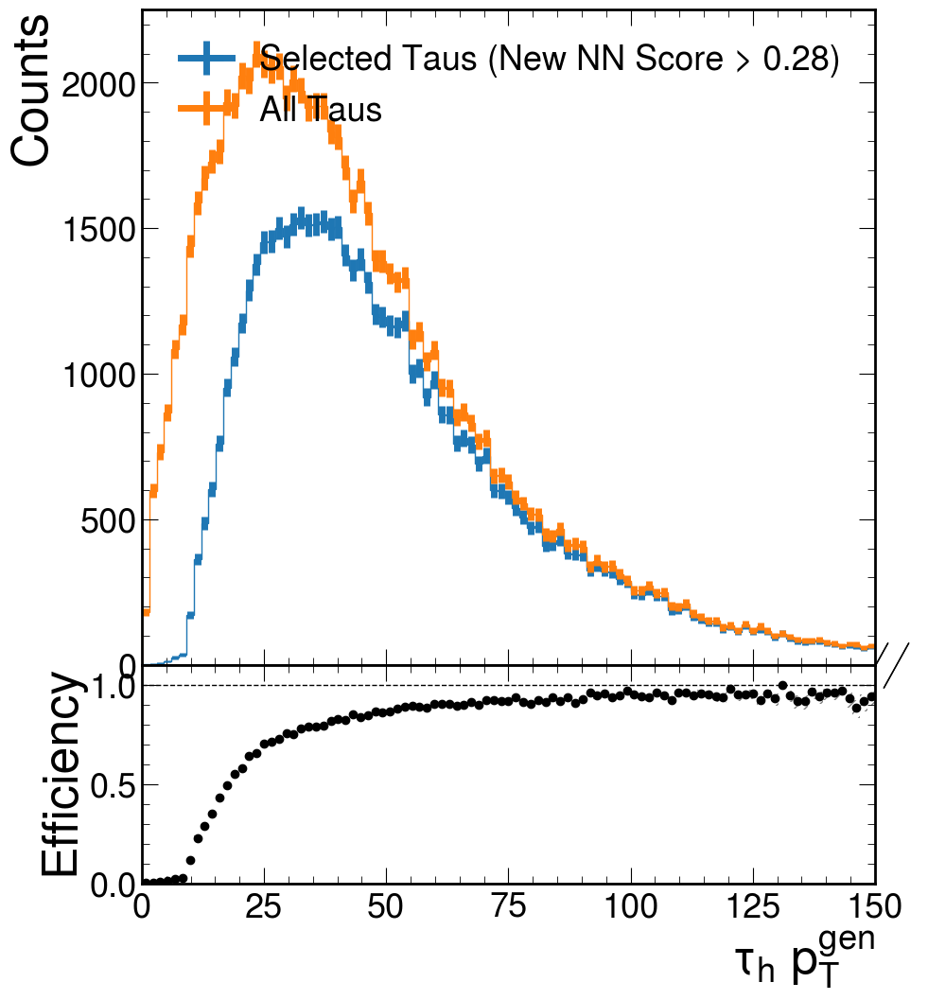

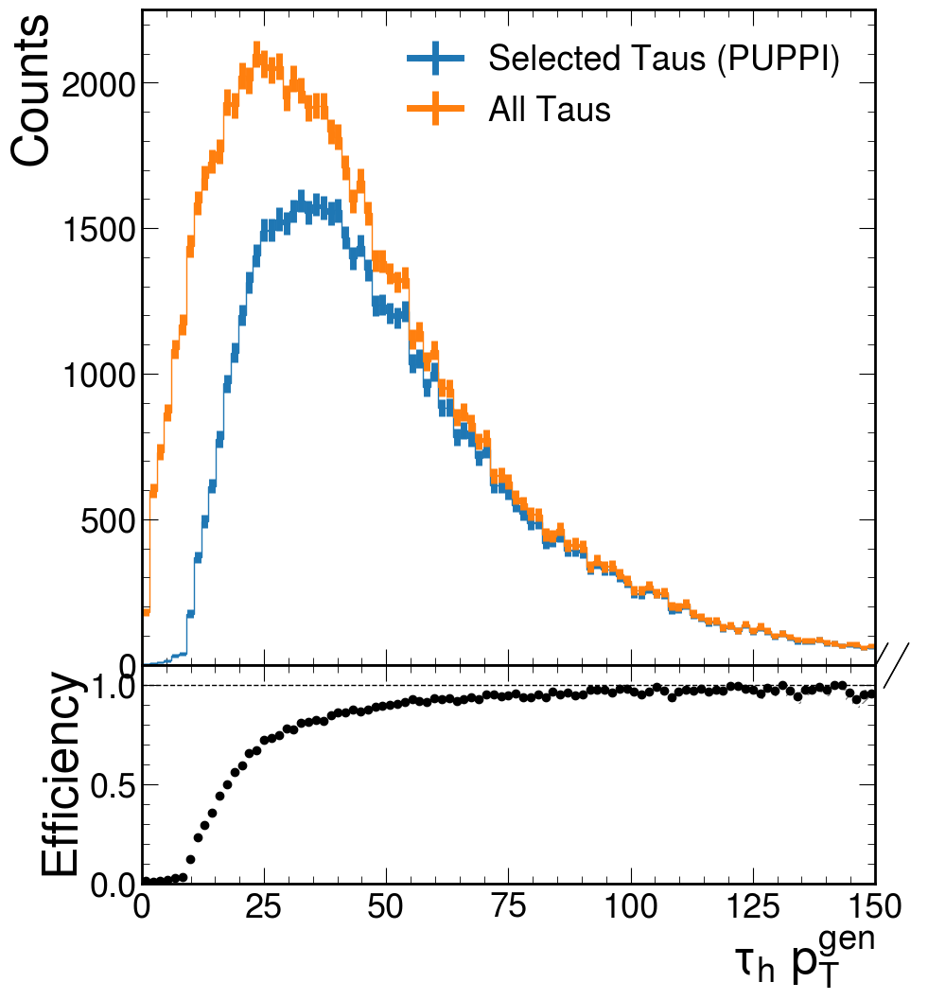

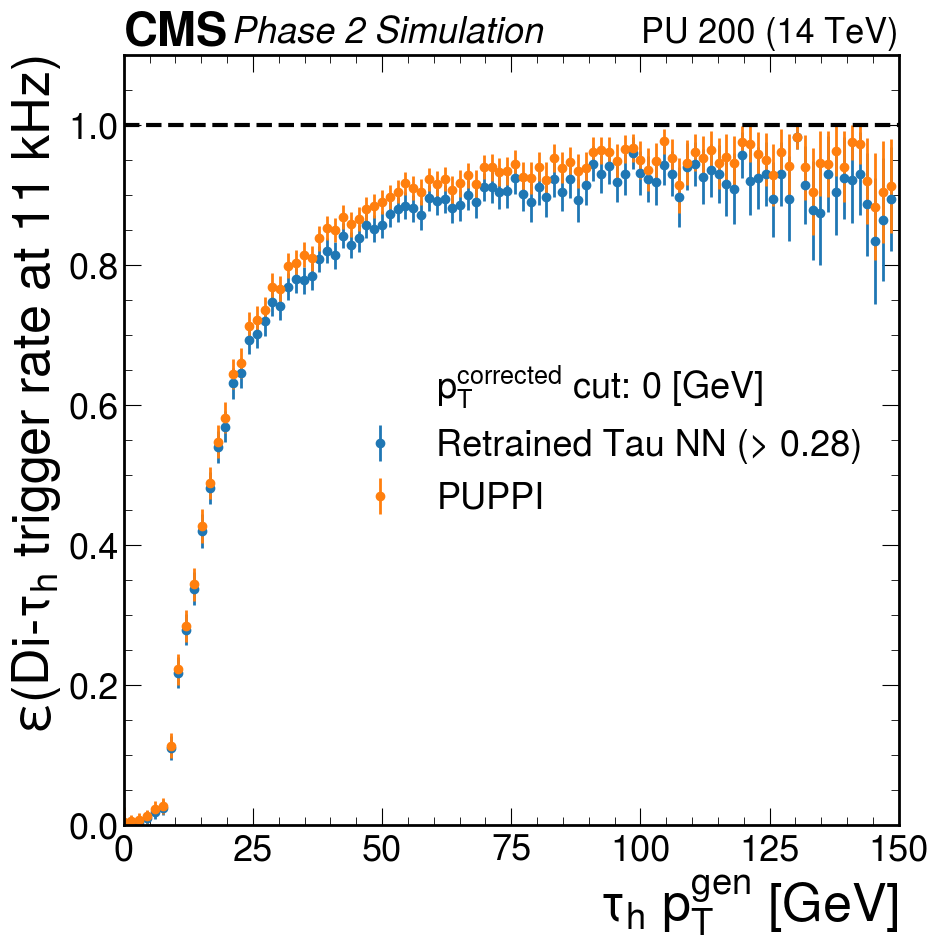

1743/1743 [==============================] - 2s 853us/step


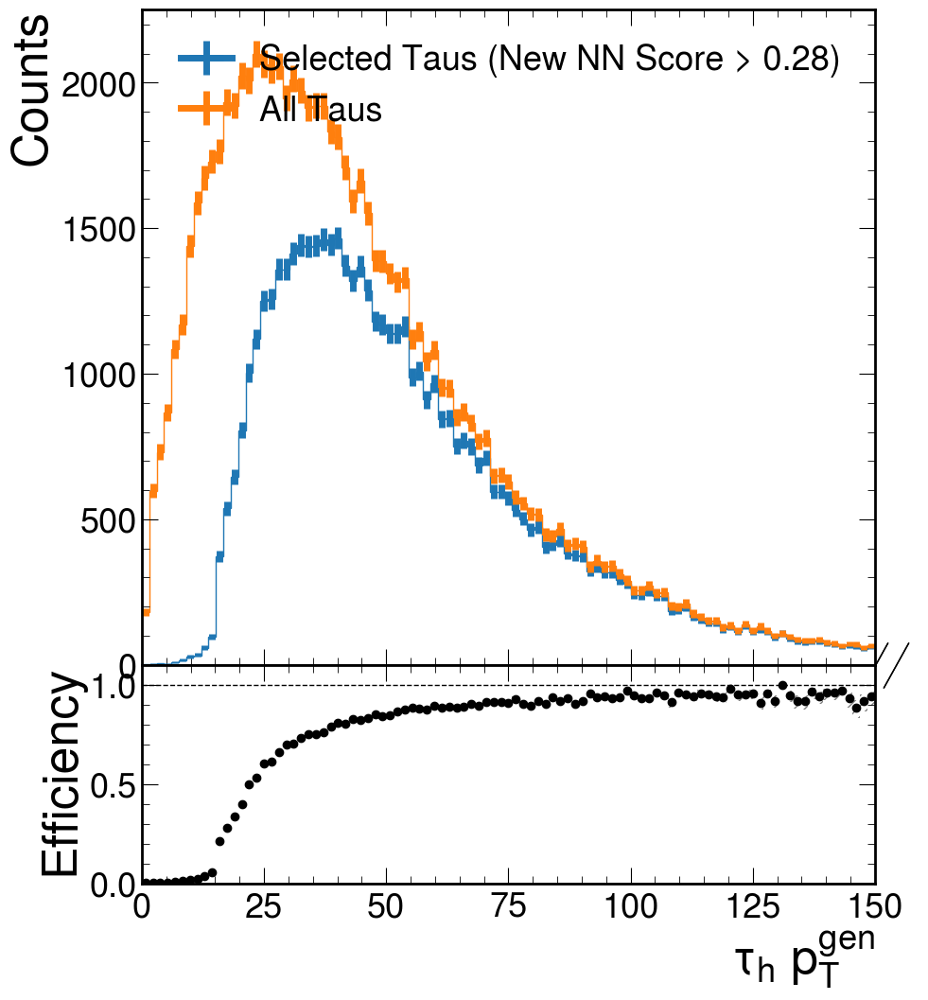

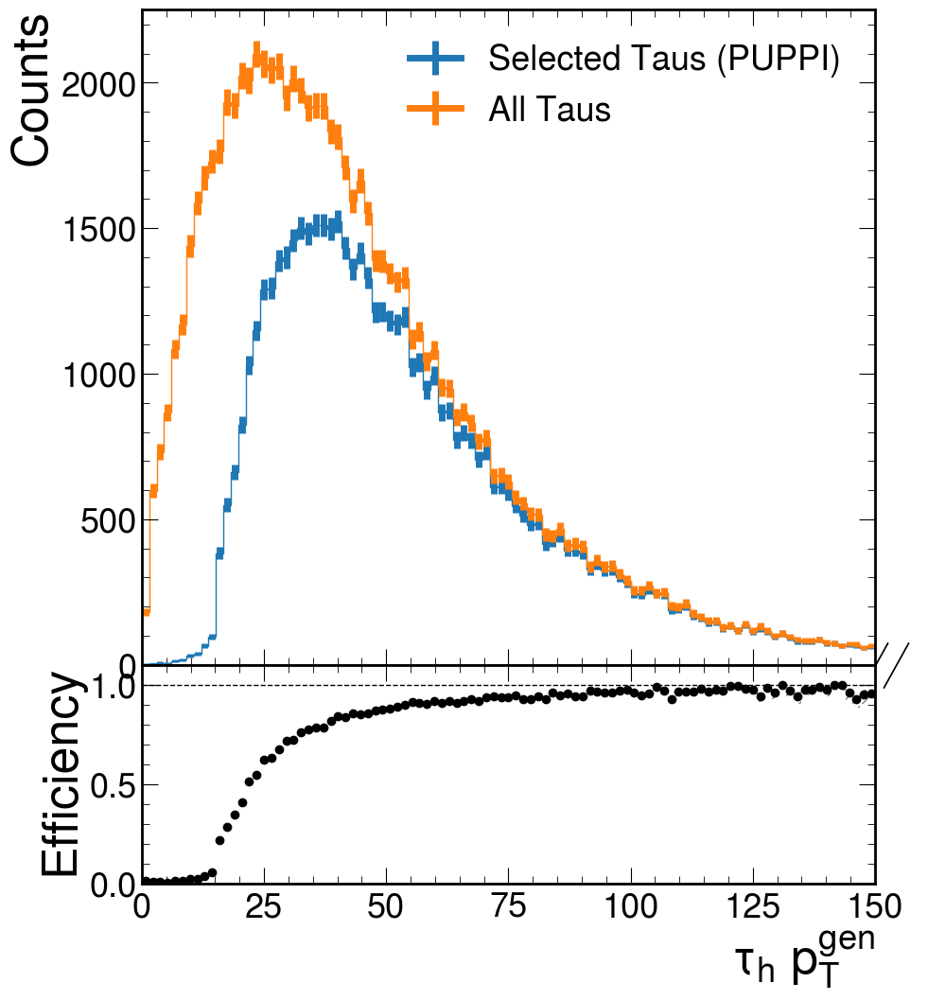

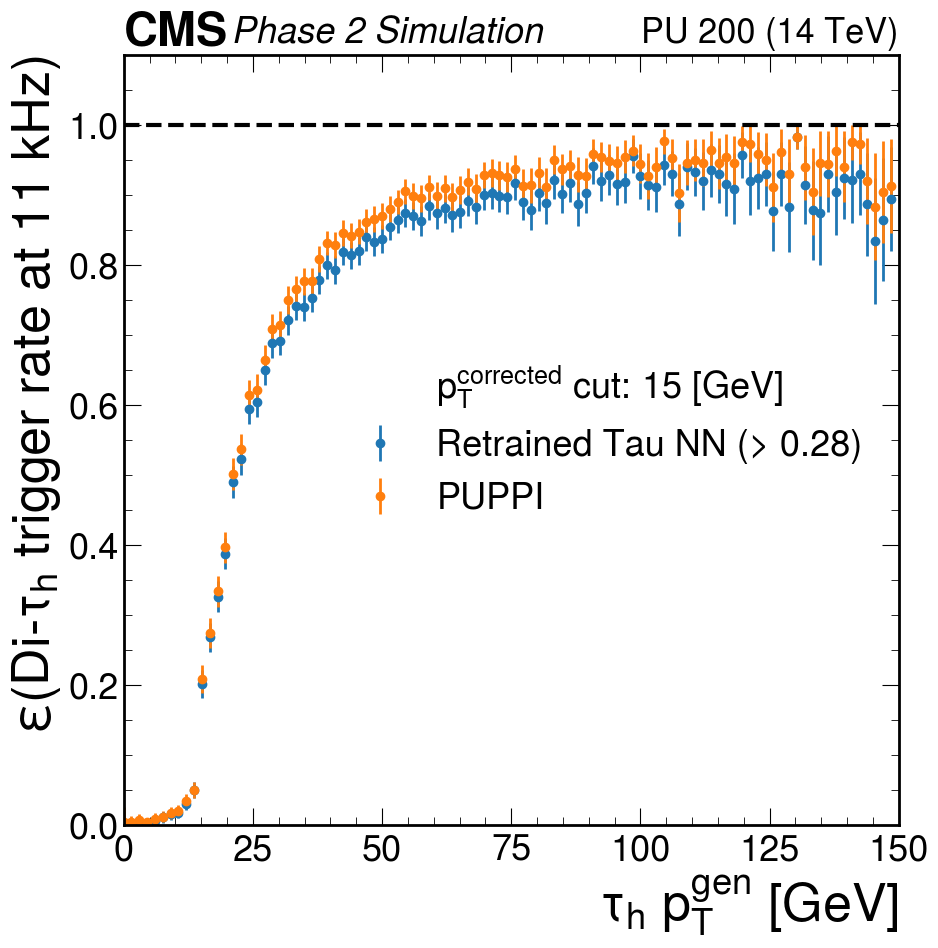

[1.         0.5177983  0.73418389 0.15910602 0.31622655 0.42671831
 0.13870902 0.07918877 0.1083452  0.14667606 0.48075465 0.55623416
 0.60345026 0.68065746 0.77565383 0.80942149 0.85714783 0.86091398
 0.90444505 0.92133143 0.93224309 0.93723179 0.95100642 0.95110827
 0.95950562 0.96287633 0.97396526 0.97362209 0.97252711 0.98146564
 0.97874334 0.97930024 0.97826957 0.9768138  0.98023251 0.98322902
 0.9874272  0.98768769 0.98975291 0.98710939 0.98039848 0.98526373
 0.98751263 0.98915351 0.9901868  0.99233091 0.98813545 0.99105065
 0.99462349 0.99070247 0.99193335 0.98728663 0.98855978 0.99091136
 0.98939006 0.99735037 0.99746589 0.99427322 0.99426126 0.98839861
 0.99649288 0.99014149 0.986004   0.99650123 0.98858055 0.99583853
 0.99529509 0.99059704 0.99116905 1.         1.         0.98788511
 1.         0.98845033 0.9929863  1.         1.         1.
 1.         1.         1.         1.         1.         0.98104266
 1.         0.98723305 1.         1.         1.         1.
 1.        

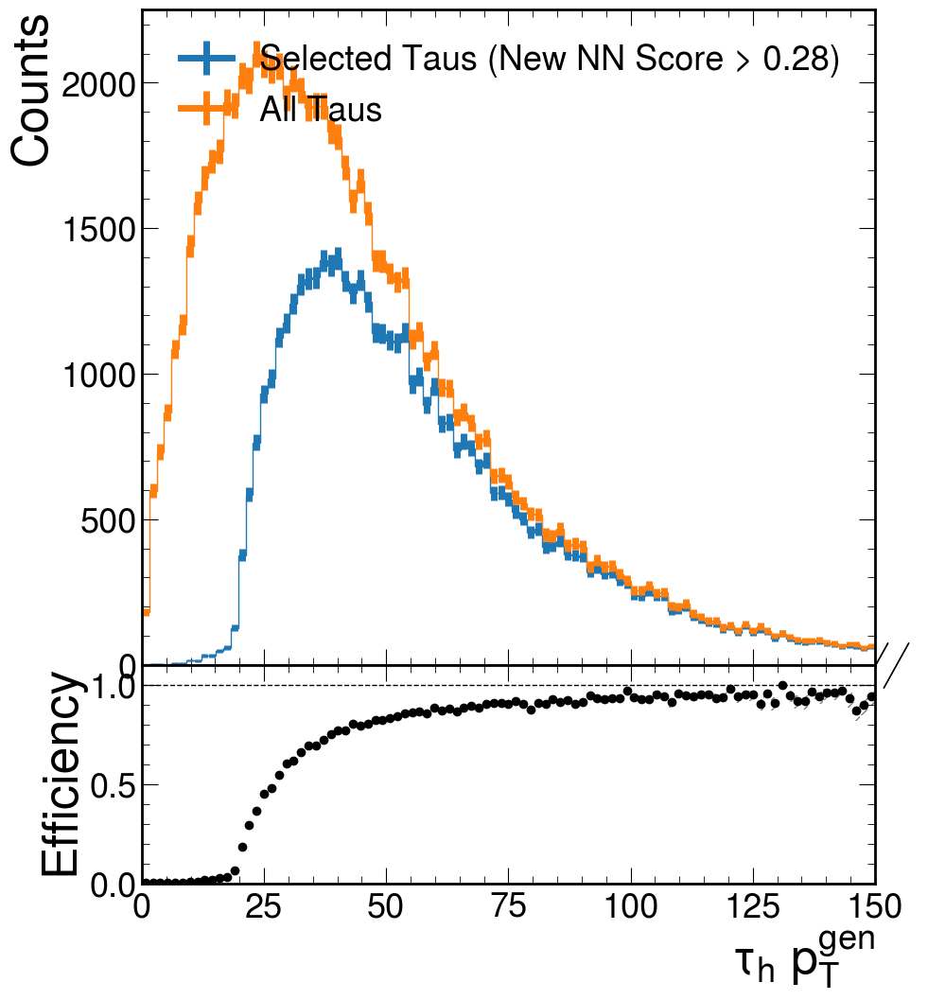

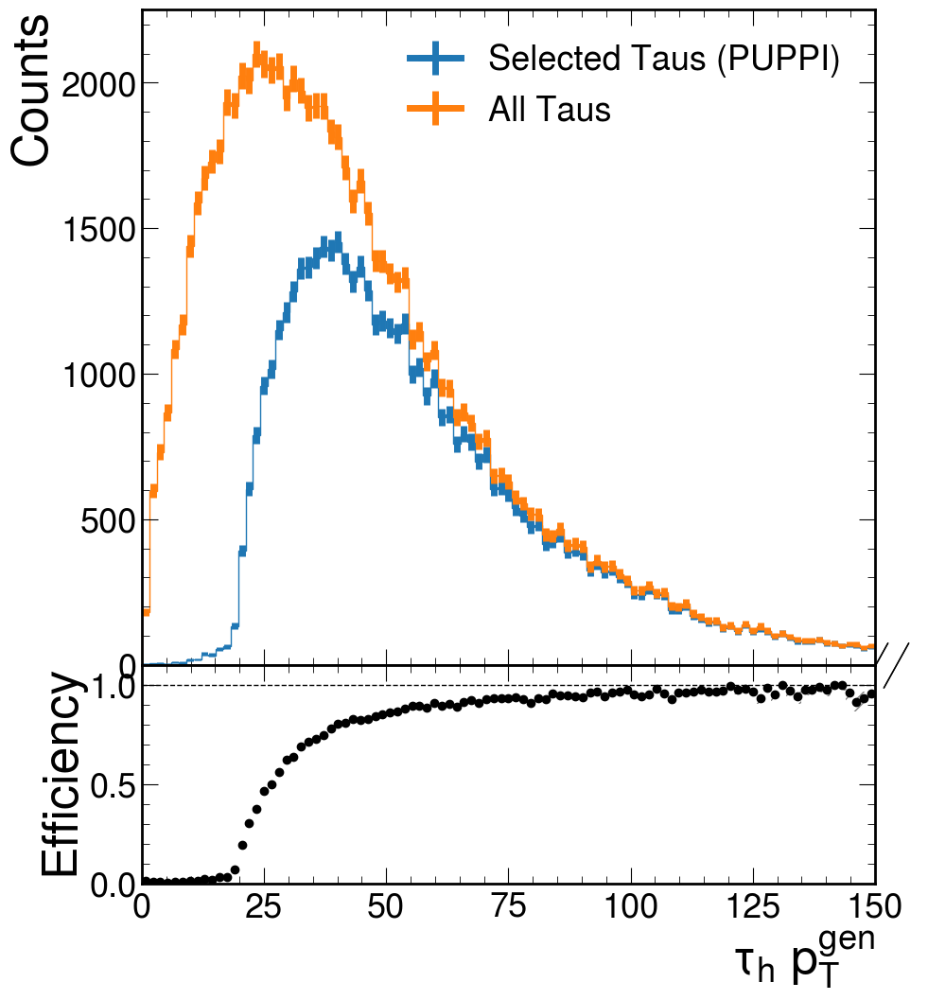

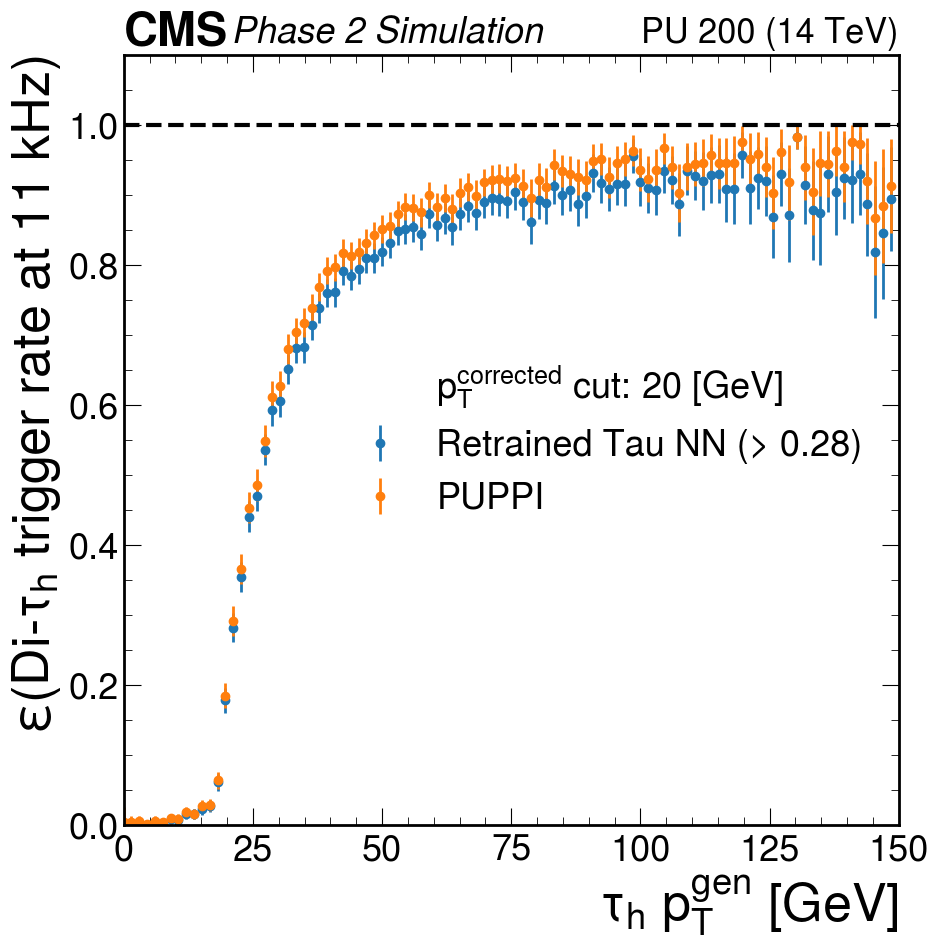

[1.         0.5177983  0.48121536 0.02009324 0.18896319 0.12819086
 0.07092525 0.02988478 0.05665289 0.0453095  0.05438923 0.05532855
 0.11206454 0.3121127  0.44617673 0.54788112 0.63468669 0.67019629
 0.74546643 0.79309687 0.81614391 0.84674992 0.87504441 0.87665306
 0.91036086 0.91351957 0.92613755 0.93488128 0.93980466 0.94670035
 0.94733003 0.94491093 0.95139725 0.95546822 0.95247023 0.96386415
 0.96236668 0.96926864 0.96817719 0.97532432 0.96209343 0.96935337
 0.96815081 0.98644598 0.98179628 0.98314731 0.97631565 0.98213045
 0.98925677 0.9851381  0.97789011 0.98728663 0.96806209 0.9795976
 0.98939006 0.98942597 0.99493449 0.98287552 0.99426126 0.98262216
 0.98604853 0.98687037 0.96529832 0.99650123 0.98479544 0.99583853
 0.98594472 0.98592007 0.98677333 0.99028186 0.99041153 0.98788511
 0.99380179 0.98273697 0.9929863  0.99242102 1.         0.99184982
 1.         1.         0.98931622 1.         0.98919063 0.97164876
 1.         0.97459075 1.         1.         1.         1.
 1. 

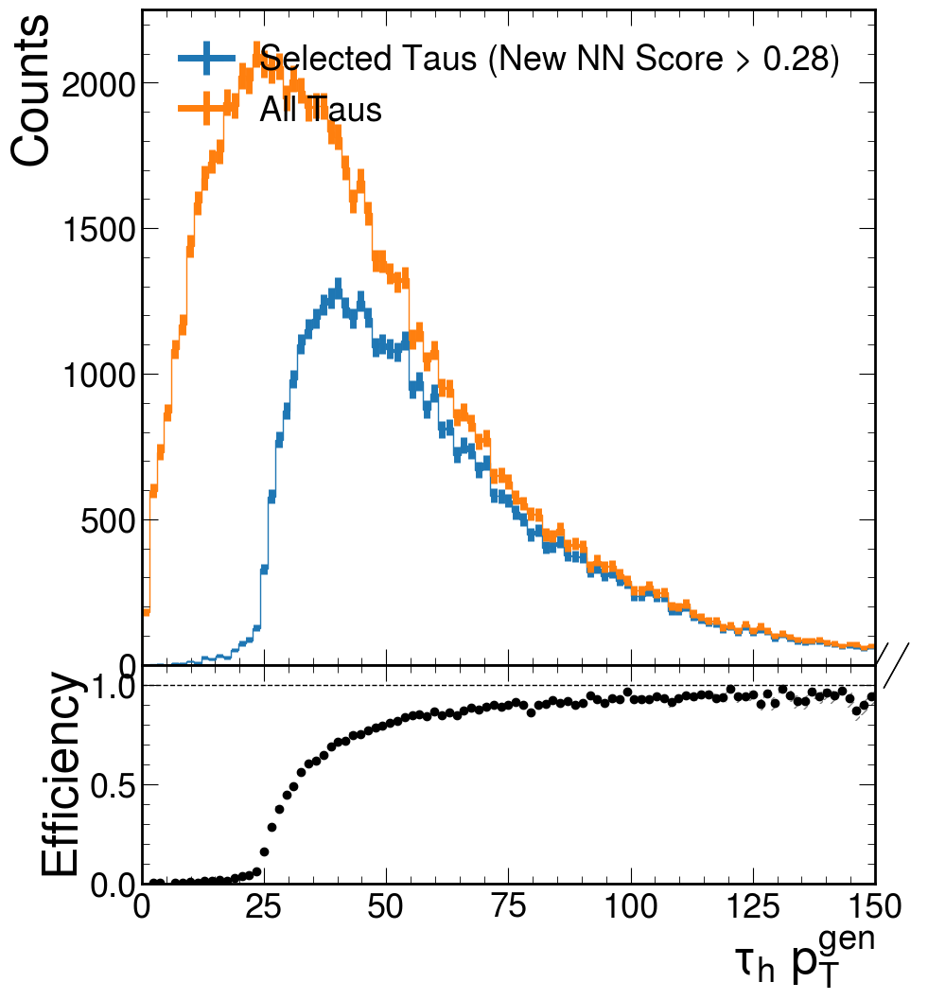

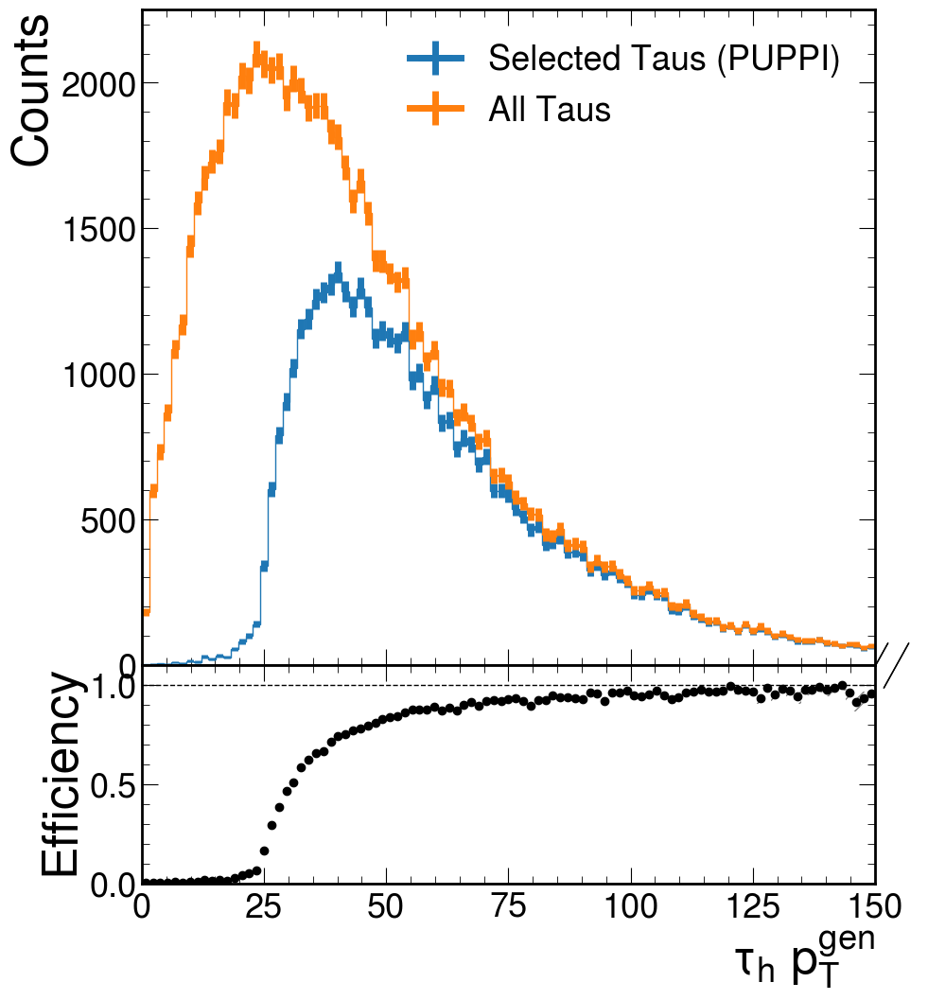

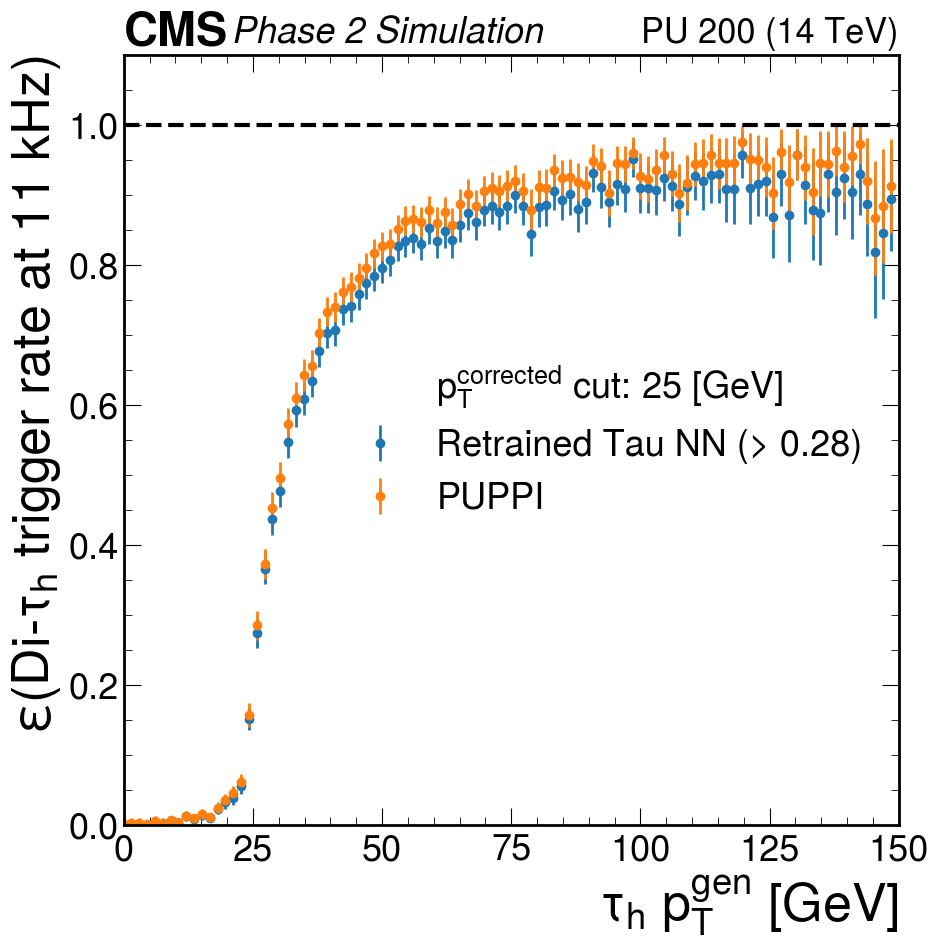

[0.         0.1262619  0.24918539 0.         0.18896319 0.12819086
 0.04909822 0.0128112  0.04302673 0.02521074 0.03323254 0.02060658
 0.04153959 0.05611162 0.0600495  0.08572306 0.21825406 0.38942025
 0.50852721 0.58501554 0.64221612 0.71163556 0.75955223 0.78224428
 0.80906621 0.8370089  0.85669716 0.86785558 0.87460565 0.8936133
 0.90504804 0.9029392  0.92114125 0.92885266 0.92479797 0.94016594
 0.94259547 0.9519204  0.95232307 0.9518309  0.93656254 0.94861933
 0.94747932 0.96753456 0.97063567 0.9678834  0.96453449 0.96968513
 0.96965298 0.97773401 0.97389275 0.98095049 0.94992928 0.96832945
 0.98674407 0.98153473 0.98735568 0.97720145 0.98567562 0.97398436
 0.98604853 0.98034821 0.9448425  0.99650123 0.97725325 0.99170856
 0.97666287 0.98592007 0.98677333 0.98066707 0.98089955 0.98788511
 0.96943491 0.98273697 0.9929863  0.99242102 1.         0.99184982
 1.         1.         0.98931622 0.99110074 0.98919063 0.97164876
 1.         0.97459075 0.97379898 1.         1.         1.
 1. 

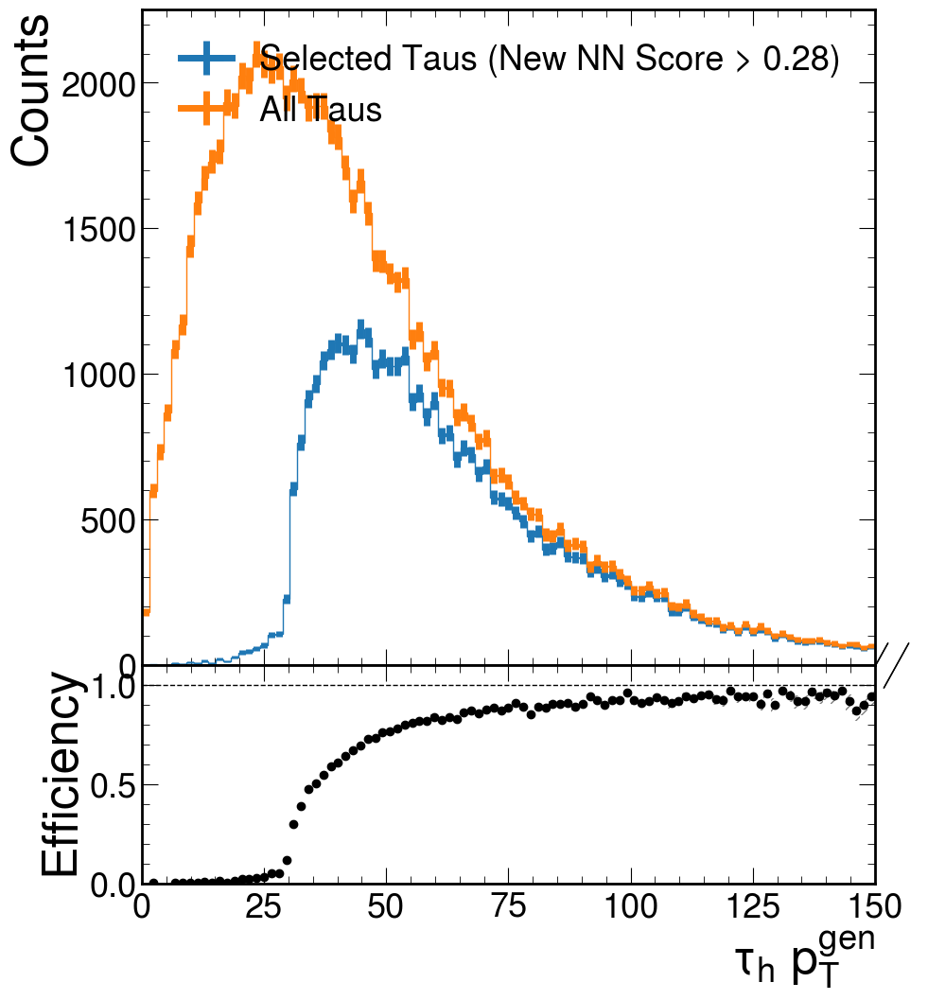

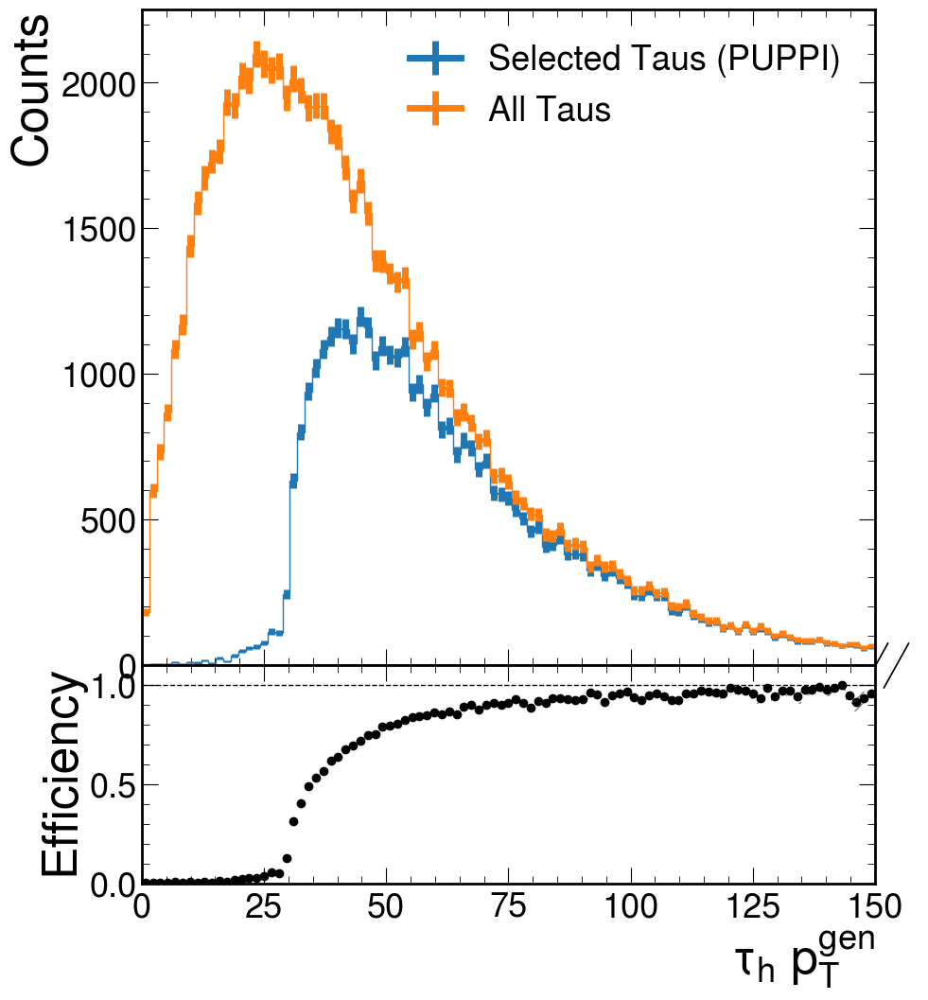

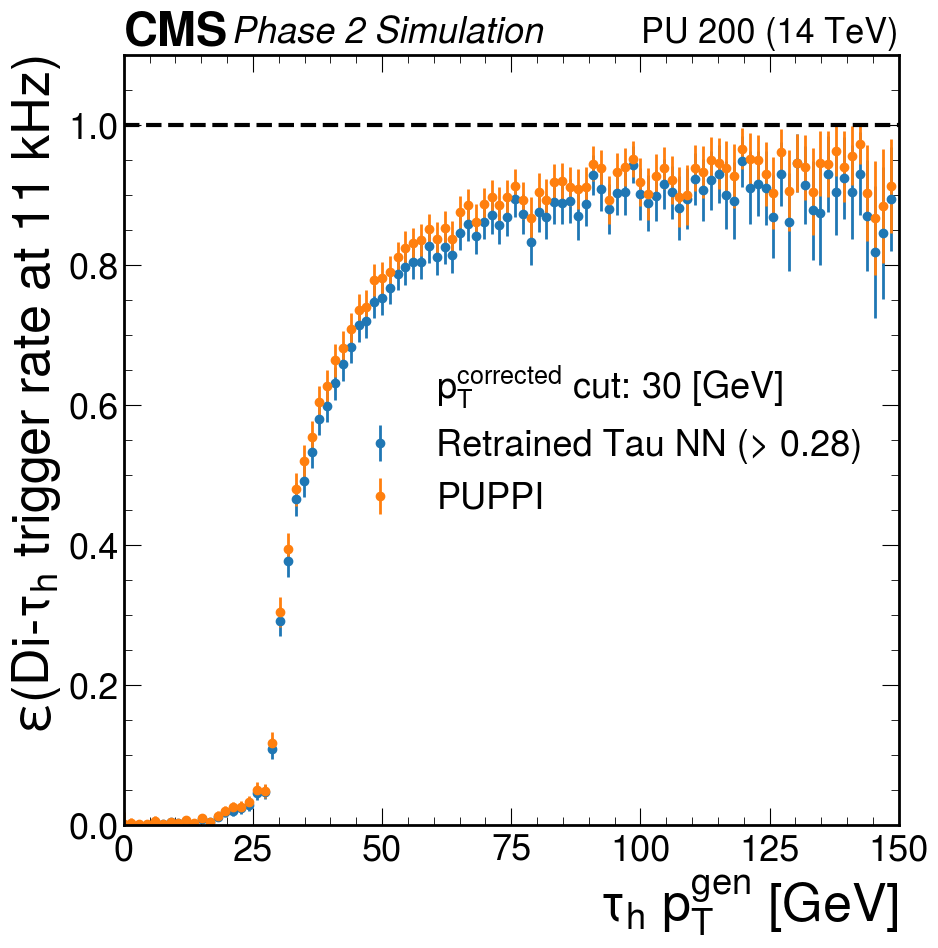

[0.         0.1262619  0.         0.         0.18896319 0.04840201
 0.0332046  0.00823417 0.02026876 0.00487483 0.02106149 0.0083256
 0.0202347  0.03091799 0.0310694  0.03591534 0.04119982 0.06491665
 0.06490688 0.14581252 0.39155093 0.48918593 0.59696149 0.63122303
 0.68019504 0.71731679 0.7293305  0.77498978 0.78180824 0.8238282
 0.8519771  0.83981403 0.87718884 0.87757248 0.88032165 0.89469816
 0.90009878 0.91226717 0.92296442 0.92311489 0.91112603 0.92431451
 0.92413005 0.95541185 0.95394552 0.94659109 0.94546074 0.95551544
 0.94837989 0.95929088 0.96790787 0.96831462 0.93637633 0.96158807
 0.96828676 0.96323088 0.98231517 0.96589655 0.97426629 0.97111176
 0.98258943 0.97709647 0.93468742 0.98257955 0.97349507 0.98352731
 0.96743951 0.96273737 0.97801715 0.97113618 0.97145221 0.981858
 0.9514882  0.97705798 0.97909858 0.98491156 1.         0.98375692
 0.98065738 0.99051765 0.98931622 0.99110074 0.97852634 0.97164876
 1.         0.96205601 0.96184918 1.         1.         1.
 1.    

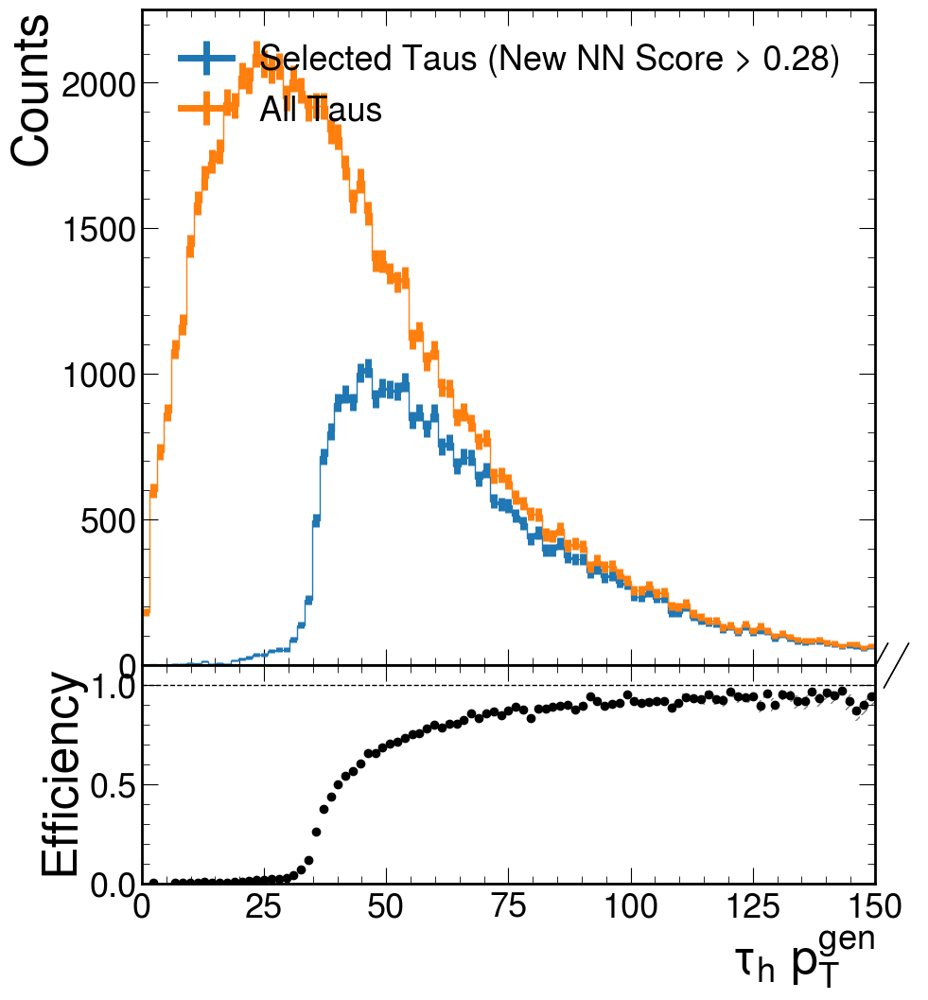

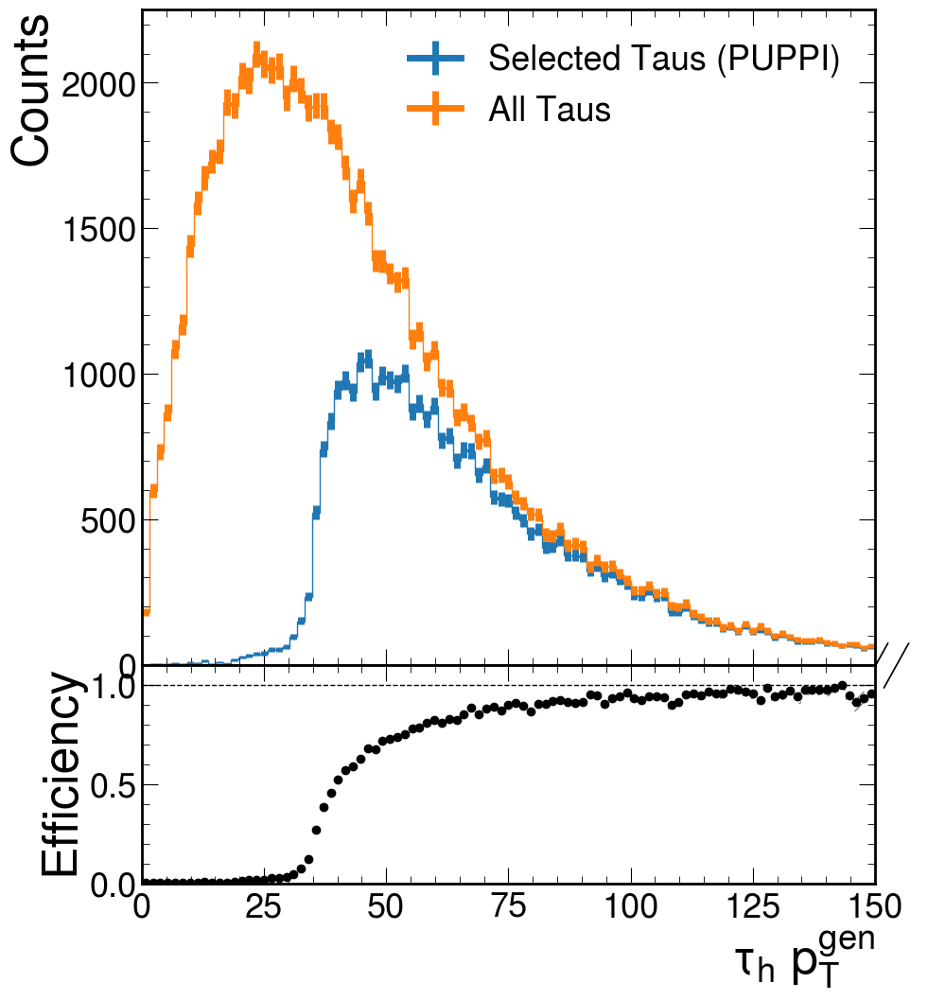

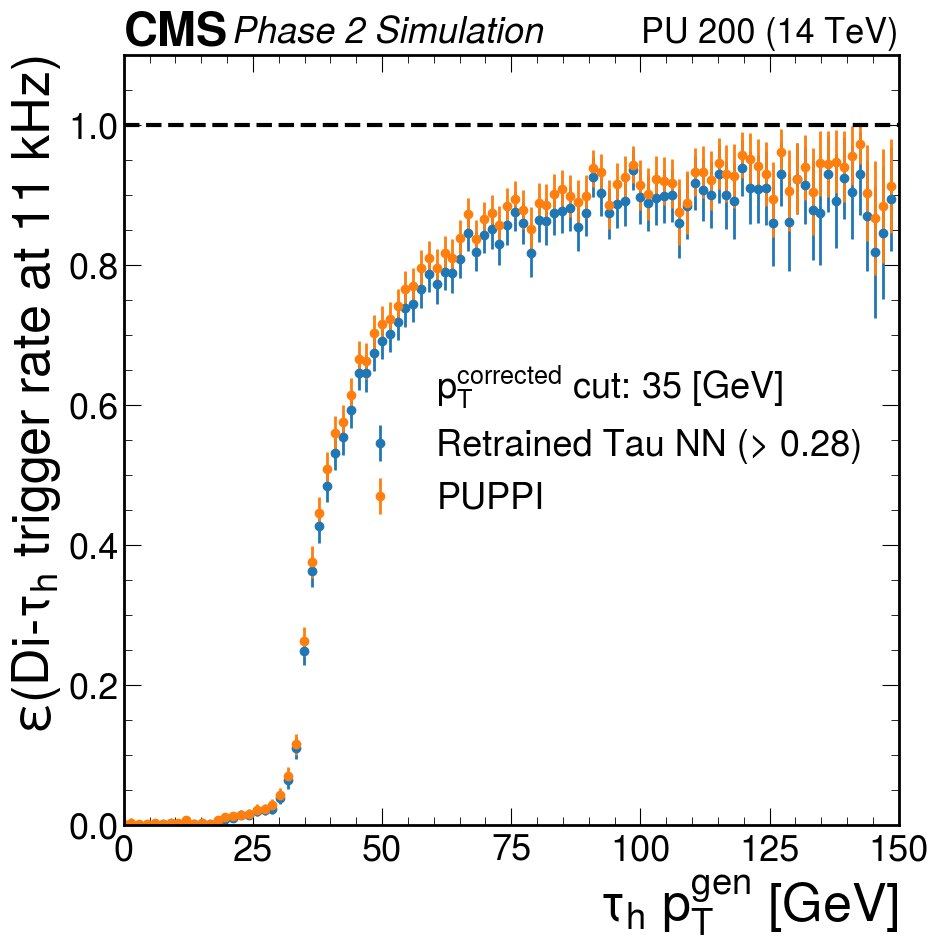

[0.         0.1262619  0.         0.         0.0713465  0.04840201
 0.02297315 0.00604595 0.018429   0.00121515 0.00489539 0.00147118
 0.01079397 0.0143054  0.01514282 0.02085596 0.01973431 0.02805567
 0.02973232 0.03090535 0.05218521 0.08221069 0.14014218 0.31914396
 0.46190149 0.52738081 0.59053854 0.65295567 0.6579912  0.71413505
 0.77034482 0.75237026 0.79053246 0.80627575 0.80418495 0.81642388
 0.83412445 0.84451953 0.87797888 0.87865014 0.86649802 0.88438324
 0.8940192  0.91382883 0.93869318 0.92083907 0.92500301 0.93435196
 0.91840542 0.94643074 0.9480438  0.95362742 0.91836083 0.94814459
 0.96040783 0.94764327 0.96975208 0.95464274 0.95722474 0.95679391
 0.97914017 0.97061015 0.92794044 0.96531682 0.95853808 0.97543192
 0.9628473  0.96273737 0.97365526 0.95227446 0.96674991 0.95792222
 0.93964039 0.97140961 0.97909858 0.96271157 1.         0.98375692
 0.98065738 0.98123713 0.98931622 0.98228443 0.97852634 0.962304
 1.         0.96205601 0.93891269 1.         1.         1.
 1.  

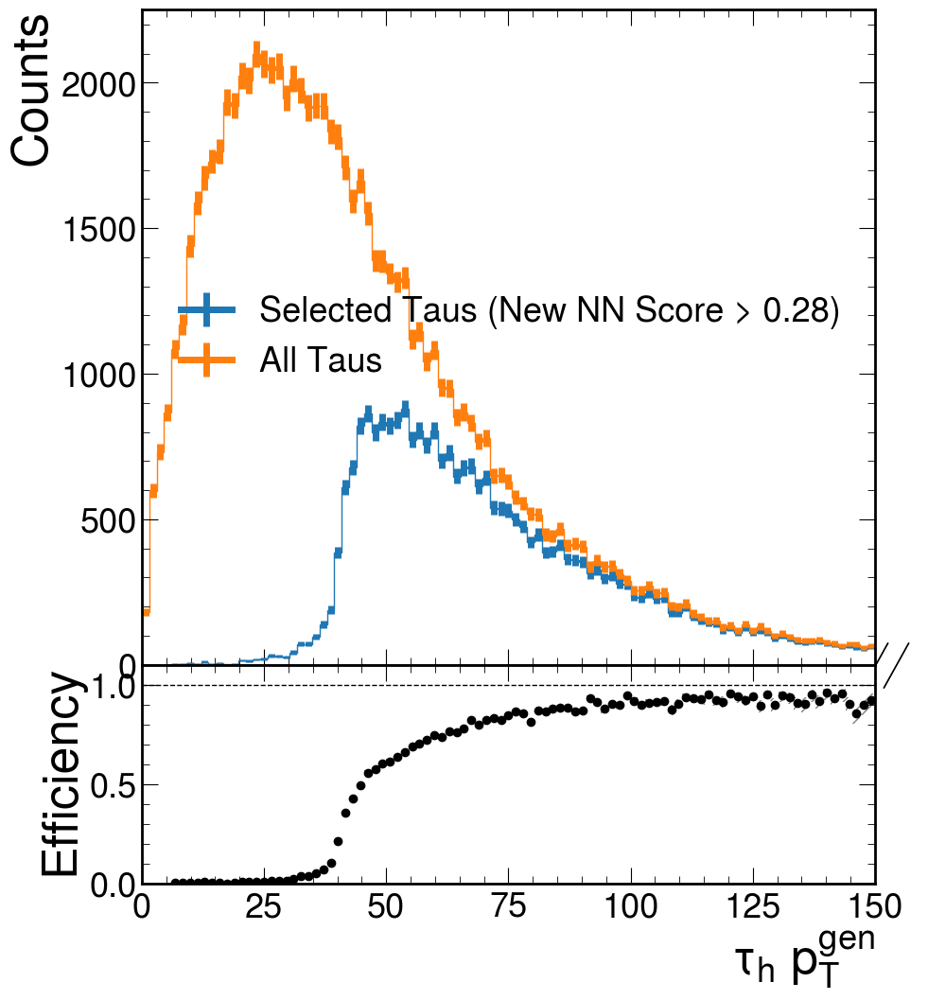

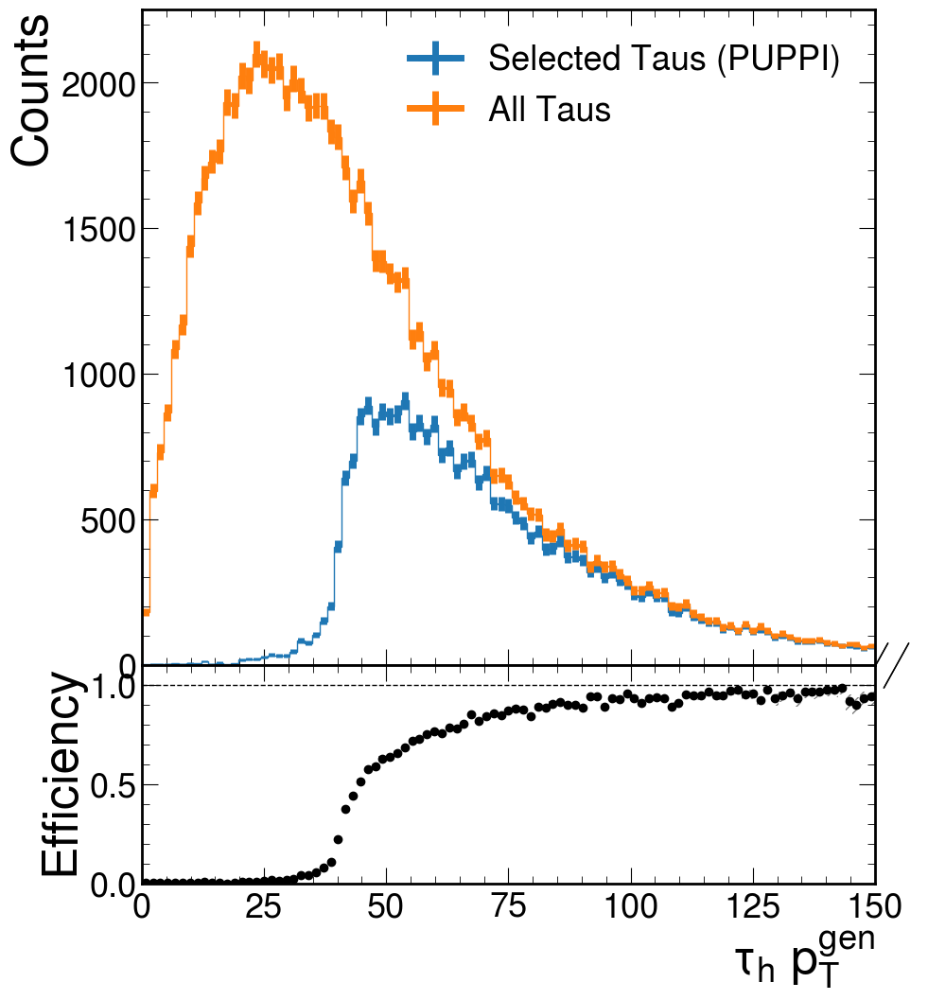

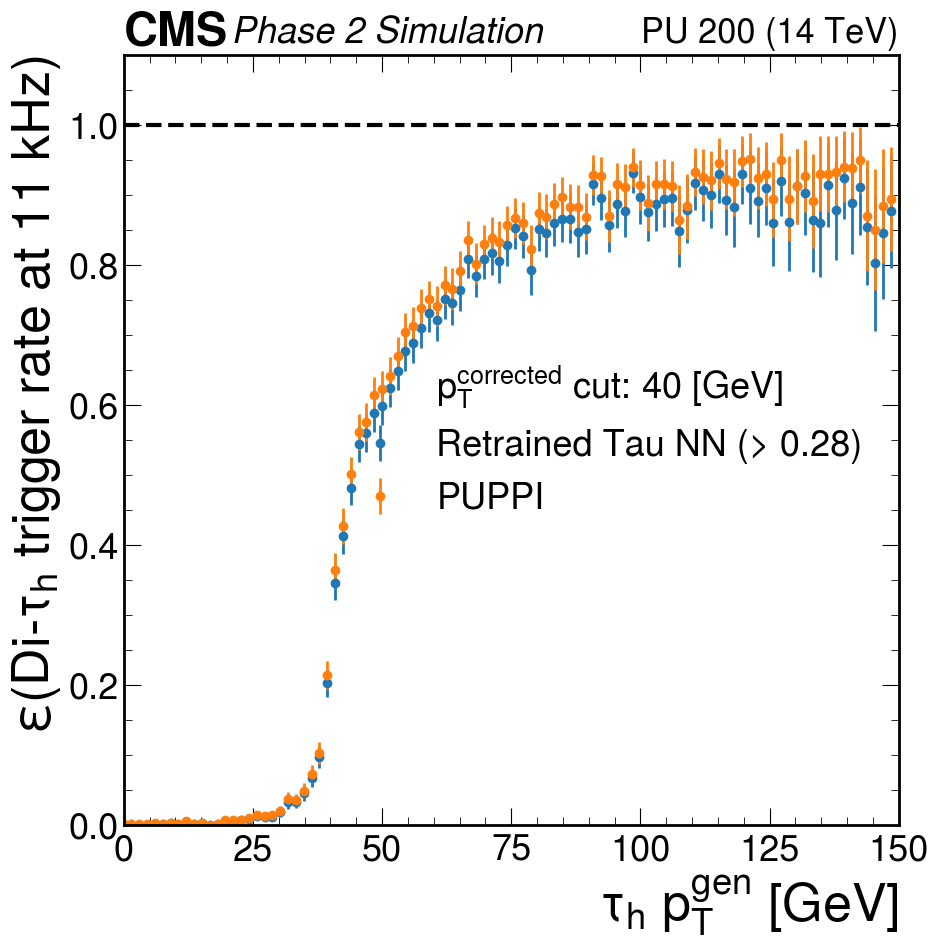

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 7.13464989e-02 4.84020054e-02 1.80233717e-02 2.05249583e-03
 1.47923228e-02 1.21515405e-03 4.89538983e-03 1.85840687e-04
 1.32043502e-03 9.71009305e-03 7.46897127e-03 1.02008202e-02
 1.15119435e-02 1.71433380e-02 1.60144375e-02 1.44294376e-02
 2.38585591e-02 4.13460279e-02 4.20814519e-02 5.78720058e-02
 8.48639502e-02 1.18874563e-01 2.47039558e-01 4.24227602e-01
 4.90215499e-01 5.81009653e-01 6.48884309e-01 6.53531049e-01
 6.90672755e-01 6.97707395e-01 7.16114694e-01 7.36837839e-01
 7.65427213e-01 7.81153704e-01 8.14183619e-01 8.16517955e-01
 8.08894069e-01 8.41021505e-01 8.44962700e-01 8.63151938e-01
 8.98661582e-01 8.81634611e-01 8.87196753e-01 8.95782595e-01
 8.92087238e-01 9.15342026e-01 9.22383876e-01 9.32733816e-01
 8.91441849e-01 9.34748144e-01 9.42087338e-01 9.32133261e-01
 9.57237937e-01 9.37844396e-01 9.48733112e-01 9.31185536e-01
 9.68845124e-01 9.64144987e-01 9.11144546e-01 9.65316823e-01
 9.43685624e-01 9.714111

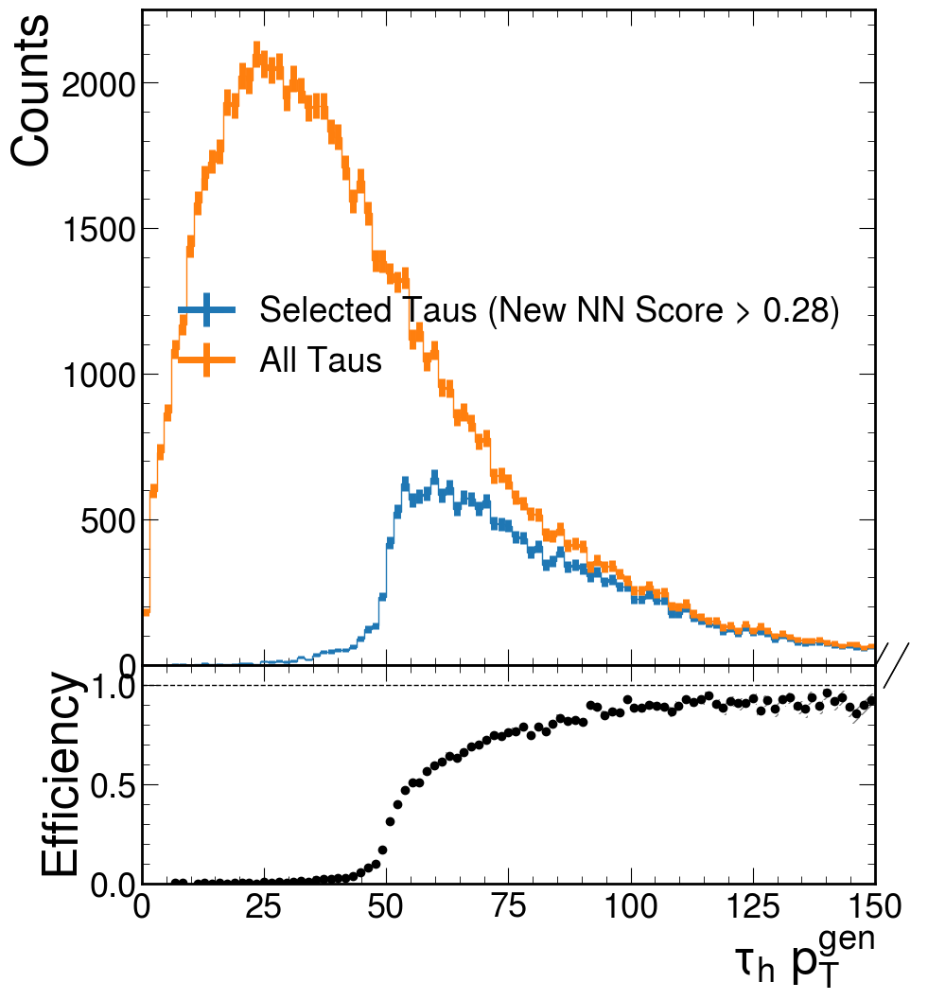

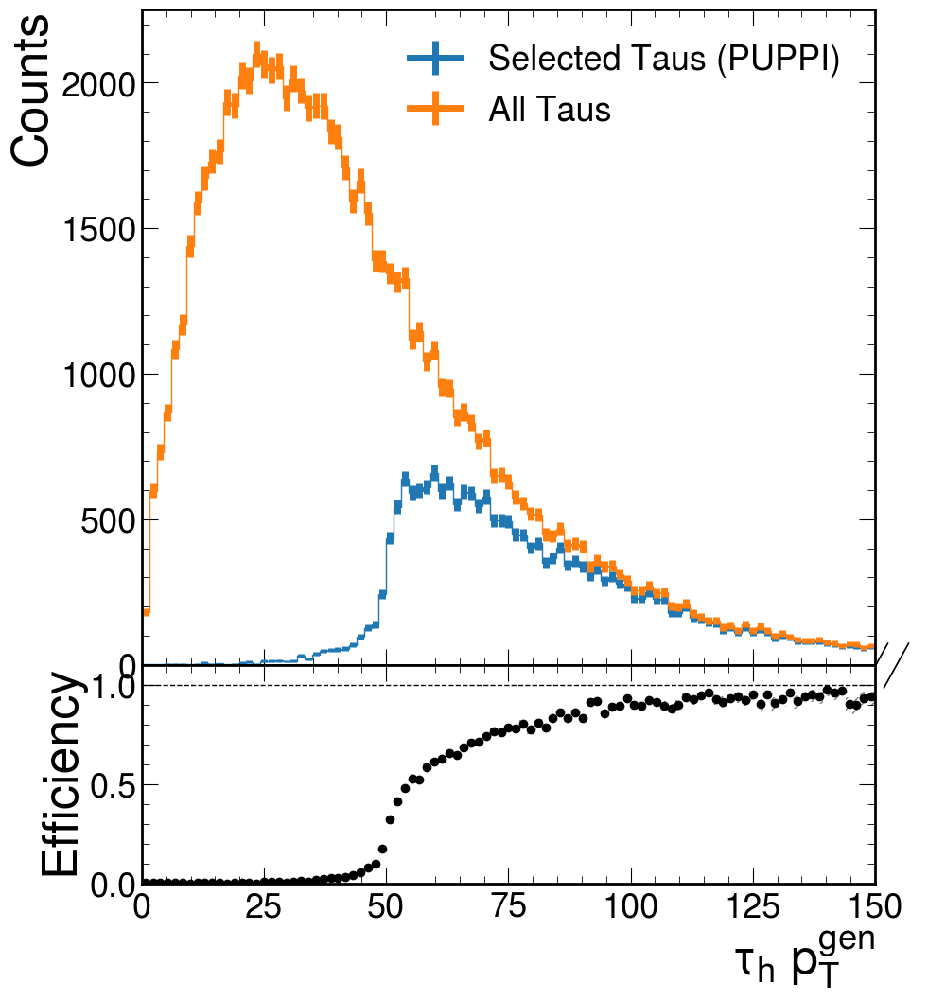

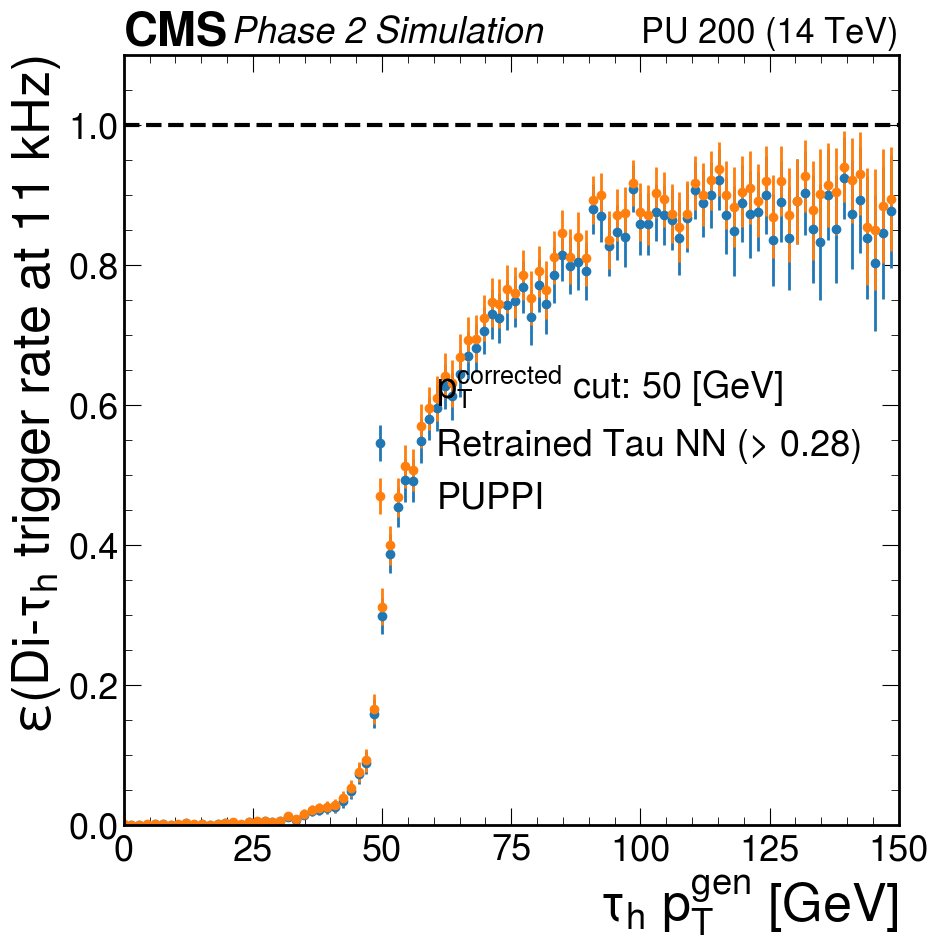

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.69478325e-02 2.50659736e-02 0.00000000e+00 5.00609698e-04
 7.76884972e-03 2.96383171e-04 1.84859034e-03 1.85840687e-04
 6.83853574e-04 3.14562445e-03 2.86296513e-03 1.27621602e-04
 6.00453377e-03 4.80876817e-03 6.39138964e-03 4.74765534e-03
 6.33259330e-03 1.38159457e-02 9.26537710e-03 1.82941803e-02
 2.42914133e-02 2.59363589e-02 2.89310830e-02 3.09474441e-02
 4.04983924e-02 5.86284258e-02 8.57117114e-02 1.03252626e-01
 1.86313682e-01 3.47957459e-01 4.43866178e-01 5.16289427e-01
 5.56004016e-01 5.57820568e-01 6.28850169e-01 6.48398480e-01
 6.68355157e-01 7.01175576e-01 6.94985958e-01 7.28287174e-01
 7.44392235e-01 7.66494305e-01 7.74831462e-01 8.00301647e-01
 8.01564657e-01 8.21179570e-01 8.09395881e-01 8.52000217e-01
 8.15723972e-01 8.46341076e-01 8.28417411e-01 8.50368163e-01
 9.00167718e-01 8.65900517e-01 9.00918443e-01 8.66457538e-01
 9.31611798e-01 9.35270929e-01 8.77809921e-01 9.20969595e-01
 9.03257915e-01 9.475771

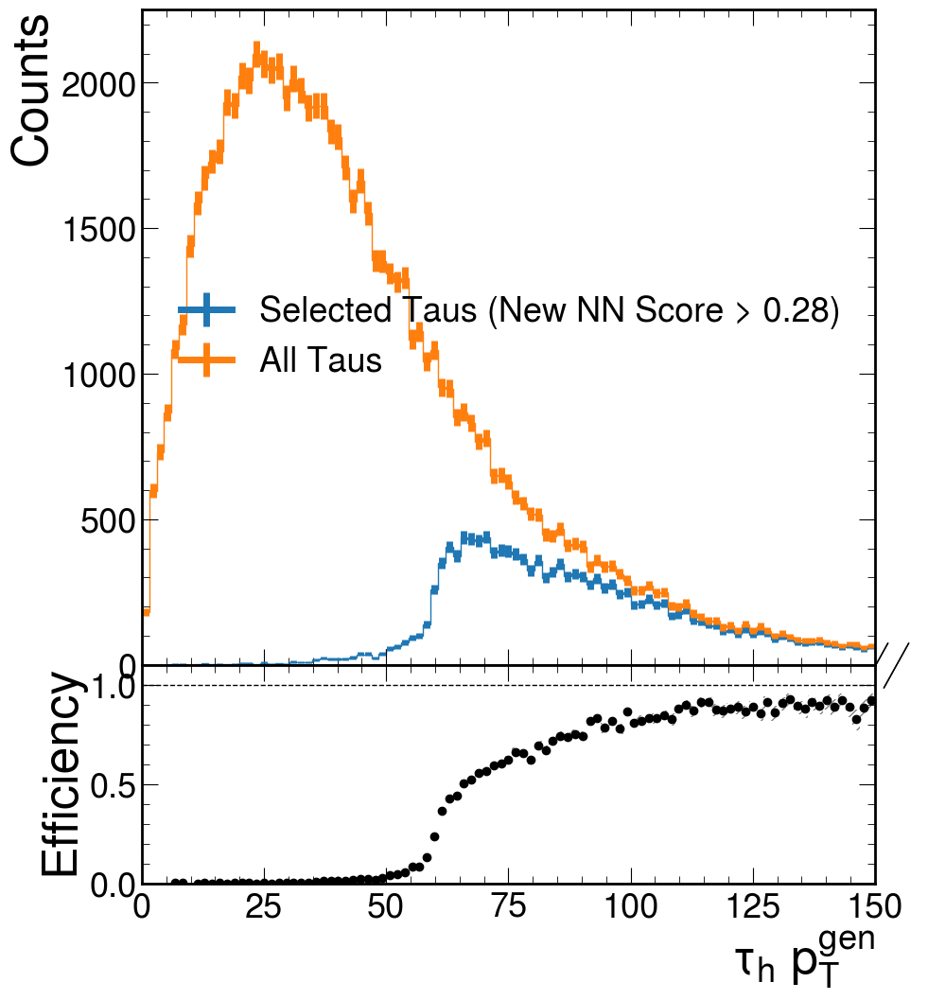

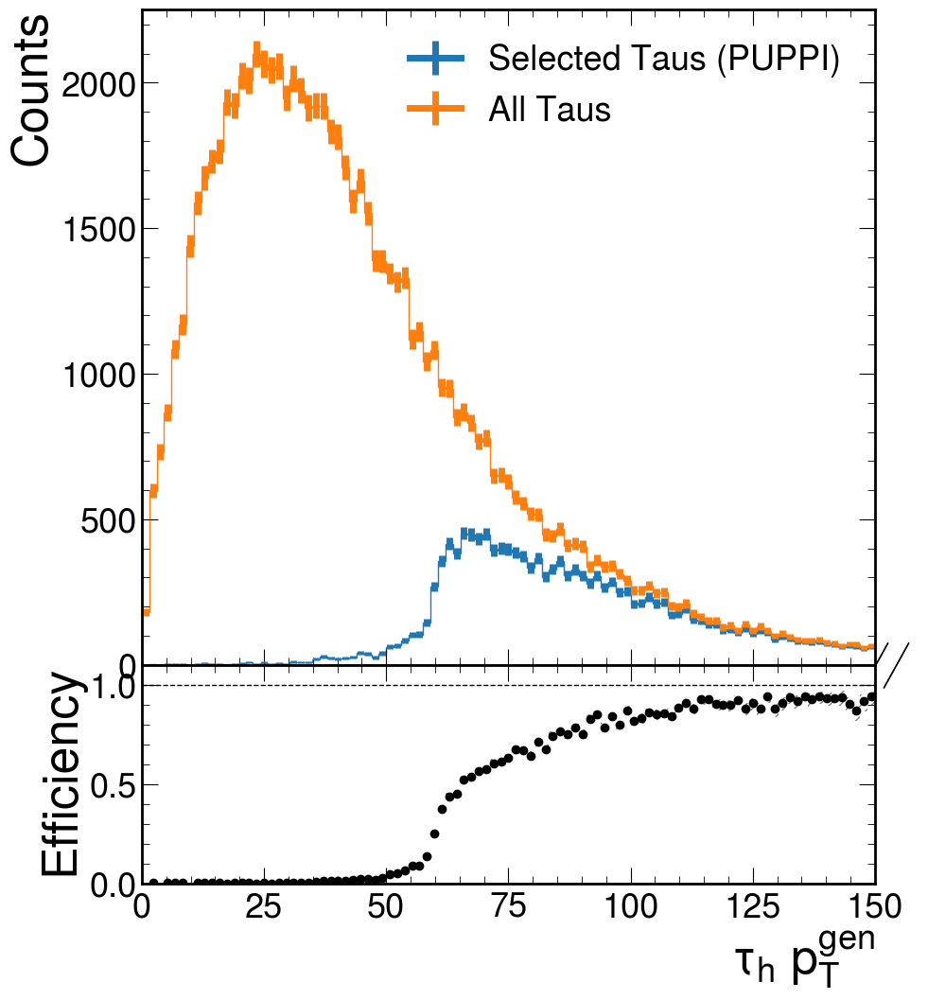

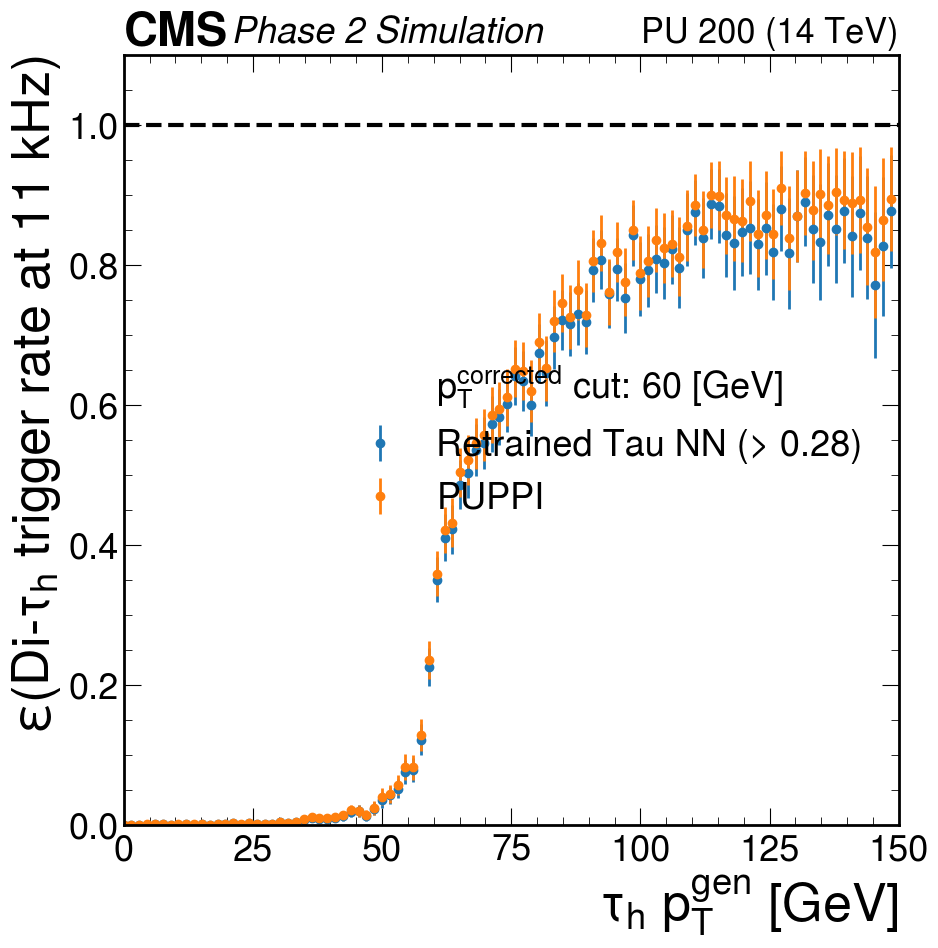

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.69478325e-02 2.50659736e-02 0.00000000e+00 5.00609698e-04
 4.47530891e-03 2.96383171e-04 1.84859034e-03 1.85840687e-04
 6.83853574e-04 2.46792506e-03 2.86296513e-03 1.27621602e-04
 3.08988428e-03 4.93953397e-04 1.41133891e-03 4.87664975e-04
 4.62169005e-03 3.99501291e-03 4.06589107e-03 8.65757897e-03
 1.21434950e-02 1.05296505e-02 1.04766351e-02 1.18464616e-02
 1.49699361e-02 2.18374951e-02 2.31540614e-02 1.45897248e-02
 2.70468088e-02 4.14366802e-02 4.81786357e-02 5.85703240e-02
 8.46506554e-02 8.86666029e-02 1.39700050e-01 2.51969745e-01
 3.93196693e-01 4.59134416e-01 4.78745355e-01 5.49114383e-01
 5.58470229e-01 6.02357527e-01 5.98409666e-01 6.29004128e-01
 6.45053247e-01 6.63962345e-01 6.94171953e-01 7.03034832e-01
 6.74851428e-01 7.39517388e-01 7.19010152e-01 7.54689843e-01
 7.97401407e-01 7.75935274e-01 8.17500355e-01 7.85875856e-01
 8.38996467e-01 8.68894863e-01 8.05369830e-01 8.63791589e-01
 8.09340902e-01 8.779077

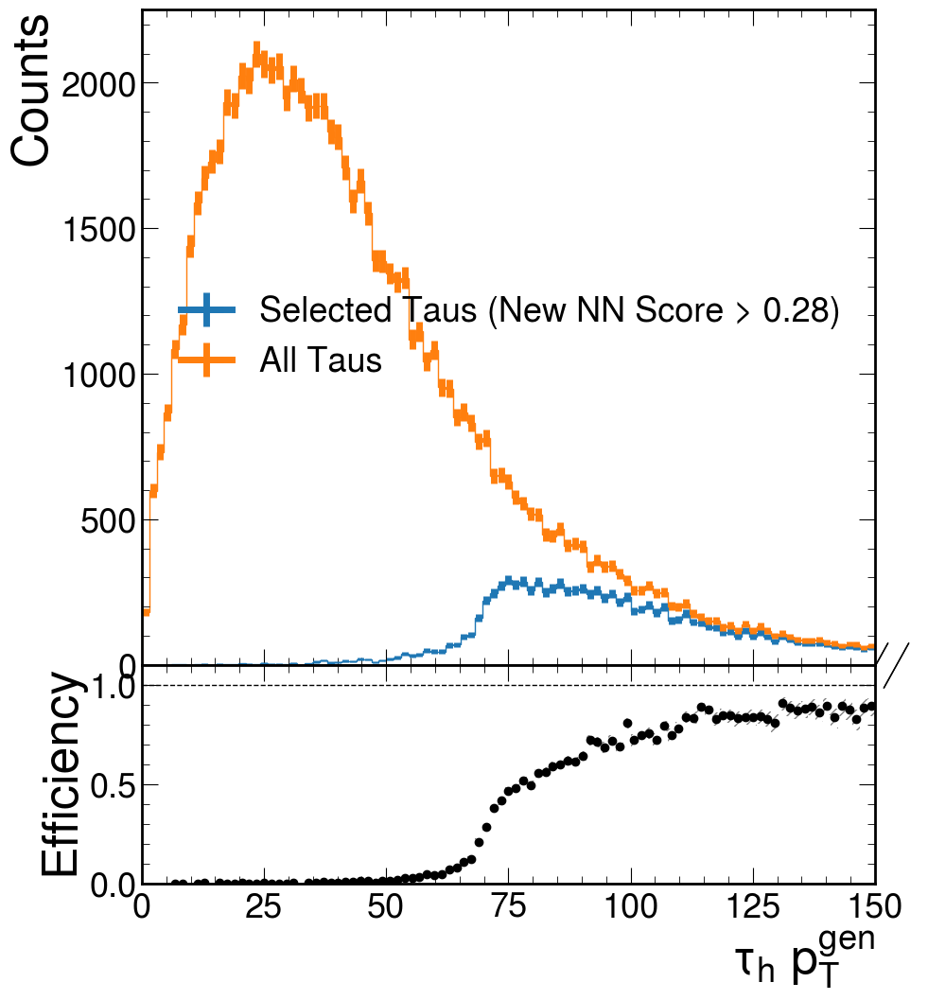

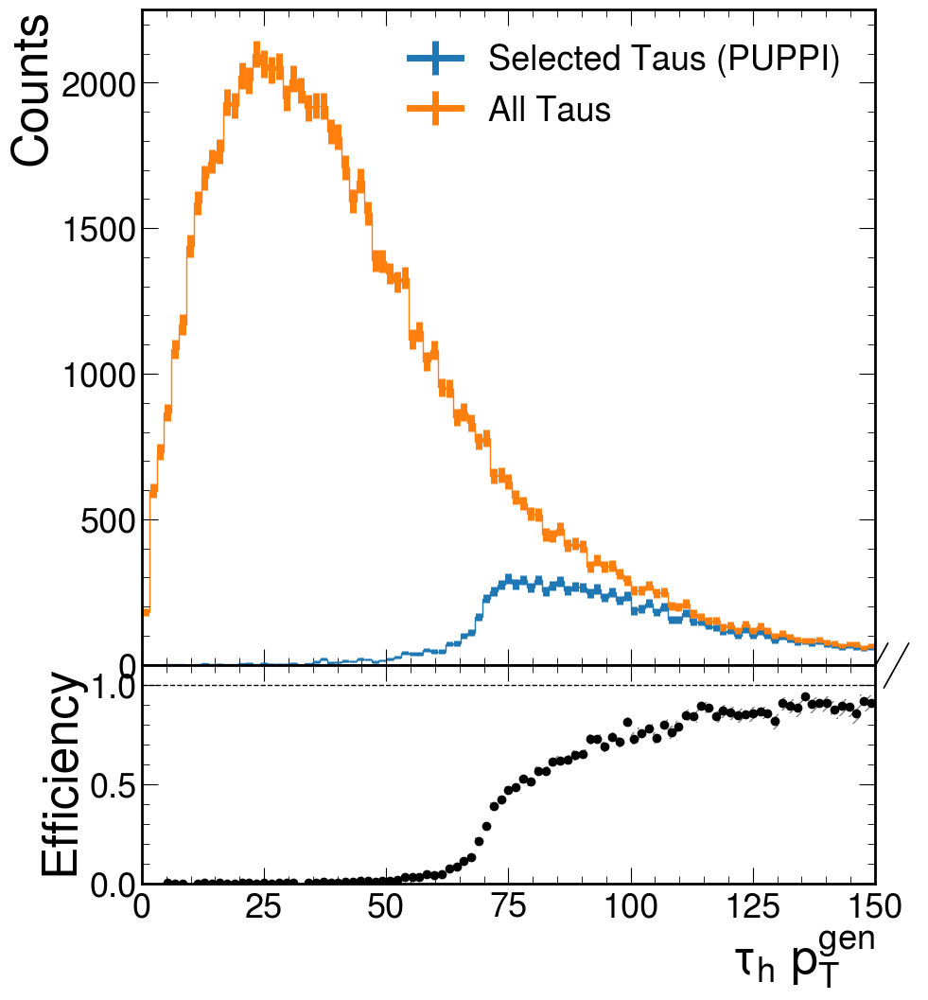

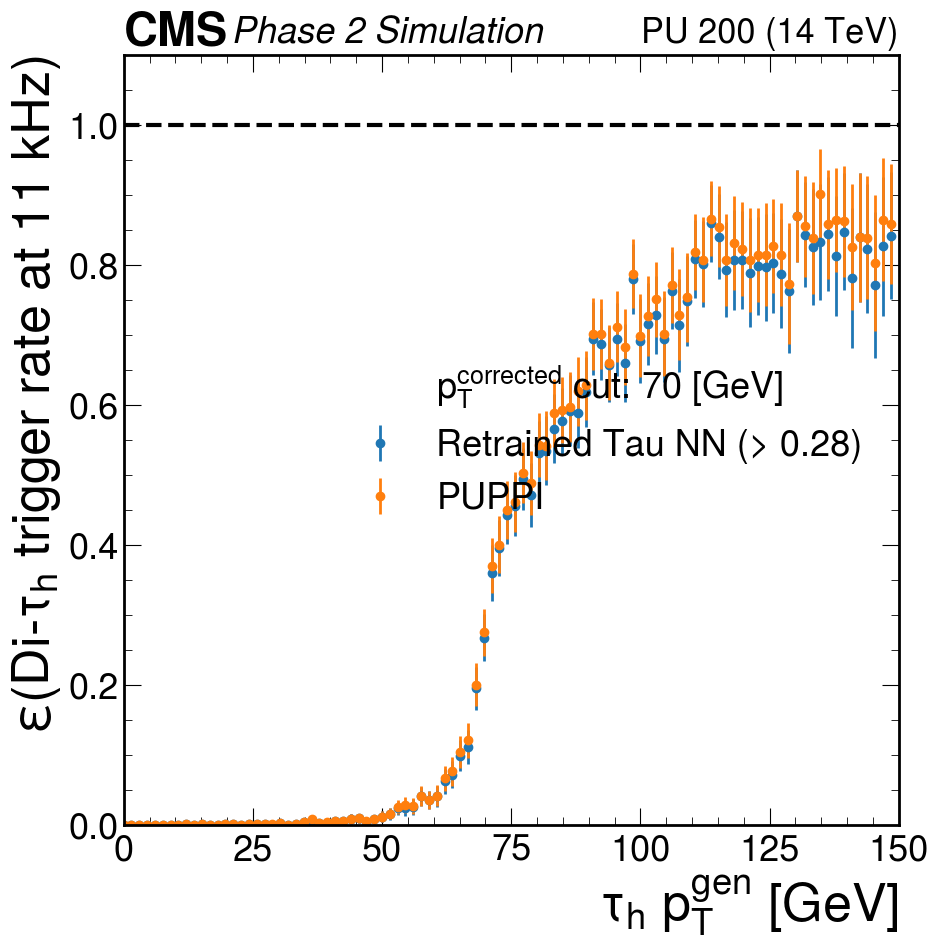

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 9.01107122e-03 6.11334257e-03 0.00000000e+00 5.00609698e-04
 2.93362799e-03 0.00000000e+00 9.57377801e-04 1.85840687e-04
 1.66798111e-04 1.81210651e-03 5.59923027e-04 1.27621602e-04
 1.98602889e-03 4.93953397e-04 4.79147060e-04 1.18946118e-04
 2.42737710e-03 0.00000000e+00 1.39977371e-03 4.61740776e-03
 7.43544670e-03 2.98748917e-03 3.51959239e-03 6.79546647e-03
 5.77634986e-03 1.06703217e-02 1.06325668e-02 4.39743038e-03
 9.47419595e-03 1.35330665e-02 1.75021506e-02 2.65304924e-02
 2.67269492e-02 2.89280763e-02 4.63815278e-02 3.97127111e-02
 4.52751656e-02 6.96485811e-02 8.12992205e-02 1.11592109e-01
 1.23771958e-01 2.19316081e-01 2.93355494e-01 3.94547265e-01
 4.38085757e-01 4.89404156e-01 4.93394353e-01 5.48019672e-01
 5.29169135e-01 5.82418895e-01 5.95768833e-01 6.13098000e-01
 6.38355718e-01 6.41523770e-01 6.58602179e-01 6.76057882e-01
 7.35284392e-01 7.38673858e-01 6.98314937e-01 7.54502941e-01
 7.09882984e-01 8.135384

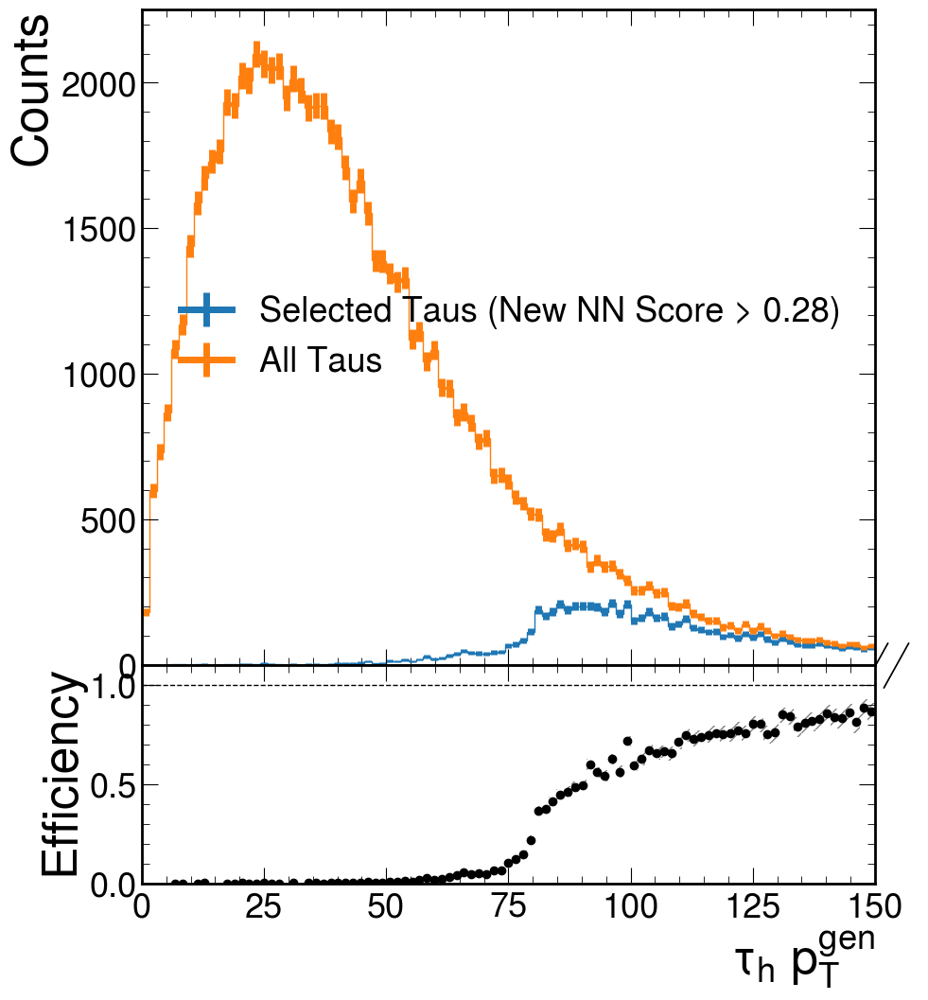

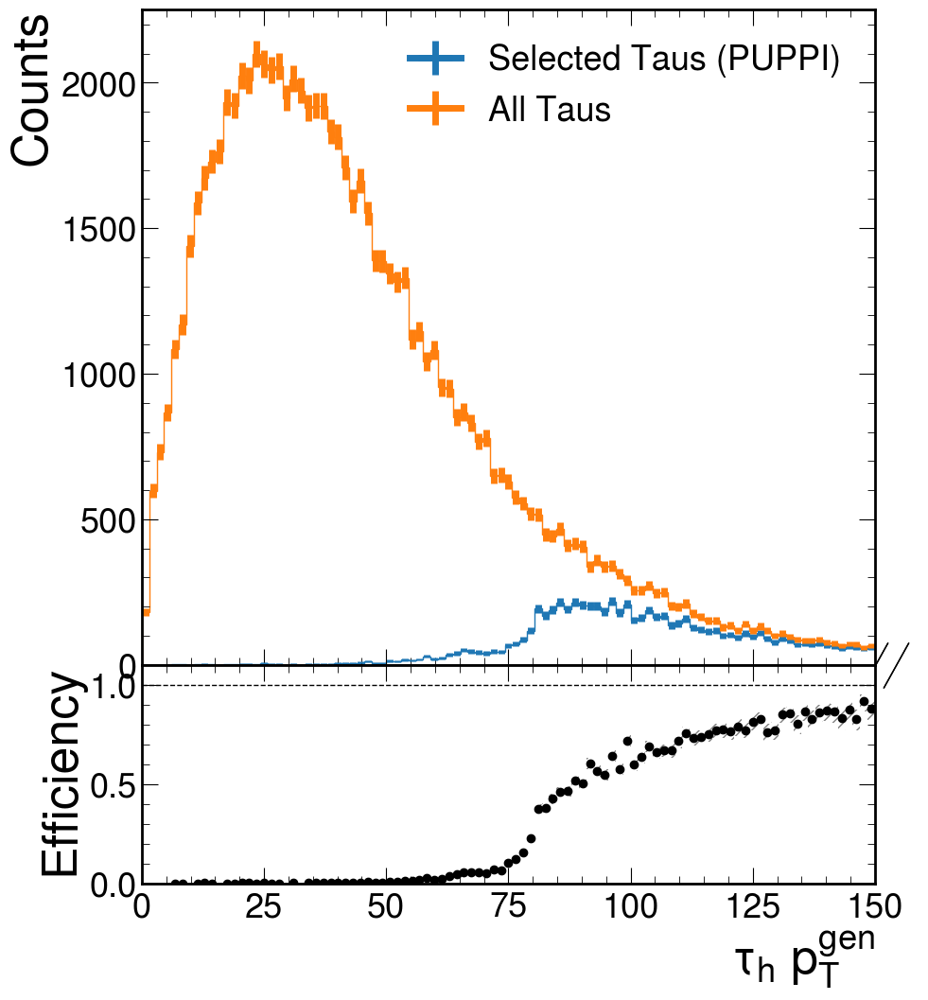

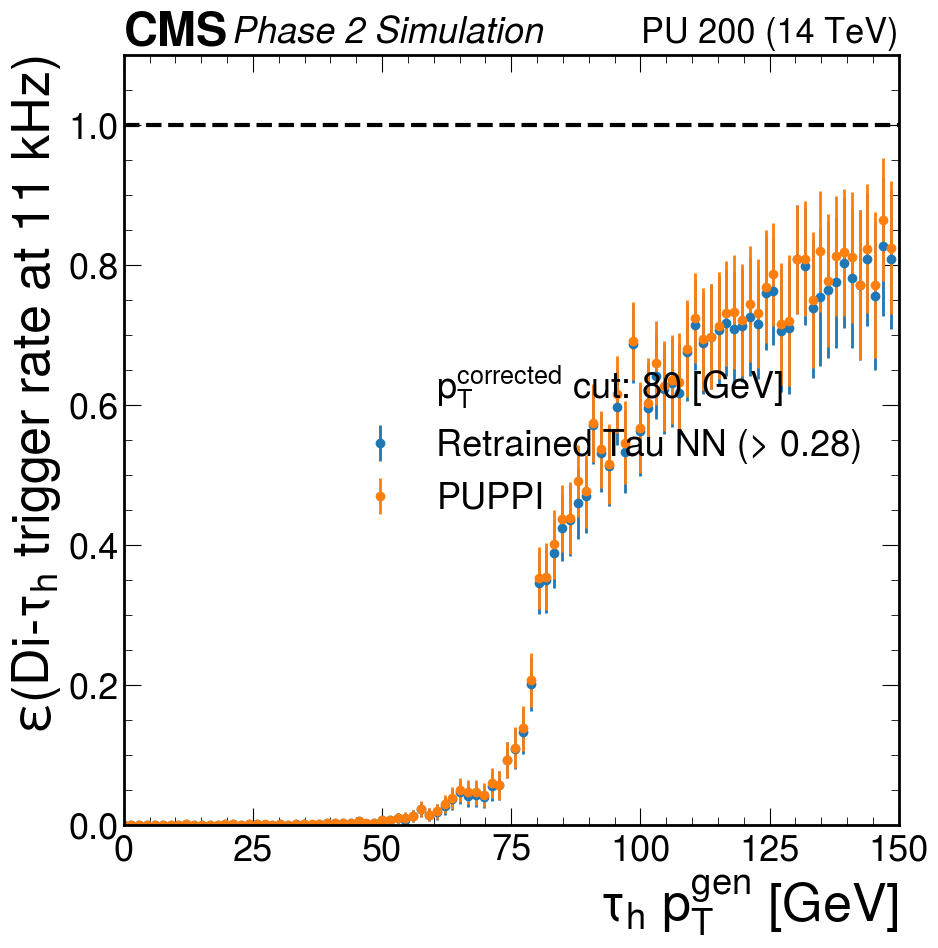

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 9.01107122e-03 6.11334257e-03 0.00000000e+00 5.00609698e-04
 1.51930652e-03 0.00000000e+00 0.00000000e+00 1.85840687e-04
 1.66798111e-04 1.18787877e-03 5.59923027e-04 1.27621602e-04
 1.98602889e-03 4.93953397e-04 1.16869265e-04 0.00000000e+00
 9.16646781e-04 0.00000000e+00 9.17581132e-04 9.15781289e-04
 1.14899165e-04 4.78654787e-04 2.43515628e-03 2.60466705e-03
 2.12050807e-03 3.21001695e-03 5.95861872e-03 1.75256075e-03
 3.06869443e-03 8.20582927e-03 7.49547493e-03 1.10667176e-02
 7.82987802e-03 1.36995395e-02 2.50770658e-02 1.61154692e-02
 2.04730757e-02 3.00989224e-02 4.13802047e-02 5.24750636e-02
 4.52716160e-02 4.82476683e-02 4.37556686e-02 6.03766498e-02
 6.21882500e-02 1.02500500e-01 1.17070186e-01 1.47184715e-01
 2.26230821e-01 3.78889478e-01 3.89983417e-01 4.19858254e-01
 4.69753116e-01 4.72019558e-01 5.15477043e-01 5.13552566e-01
 6.04496029e-01 5.71339263e-01 5.45046649e-01 6.50032647e-01
 5.73394468e-01 7.166841

In [5]:
# ====================================================================== NO NN 

results = plot_pt_eff_puppi_no_nn('../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5',
                            '../models/pt_regress_v1.h5',
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=0,
                            cut_point = 0.28)
no_cut_x = np.asarray(results[0])
no_cut_y = np.asarray(results[1])


threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
gen_pT_list = []
for i in threshold_list:
    result = plot_pt_eff_puppi_no_nn('../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5',
                            '../models/pt_regress_v1.h5',
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=i,
                            cut_point = 0.28)
    cut_x = np.asarray(result[0])
    cut_y = np.asarray(result[1])
    y_norm = np.divide(cut_y, no_cut_y)
    print(y_norm)
    for i in range(10):
        if y_norm[i] == 1:
            y_norm[i] = 0
        else:
            break
    gen_pT_list.append(cut_x[y_norm > 0.95][0])
#gen_pT_list = [cut(i) for i in threshold_list]
gen_pT_list_no_nn = gen_pT_list


1905/1905 [==============================] - 2s 913us/step


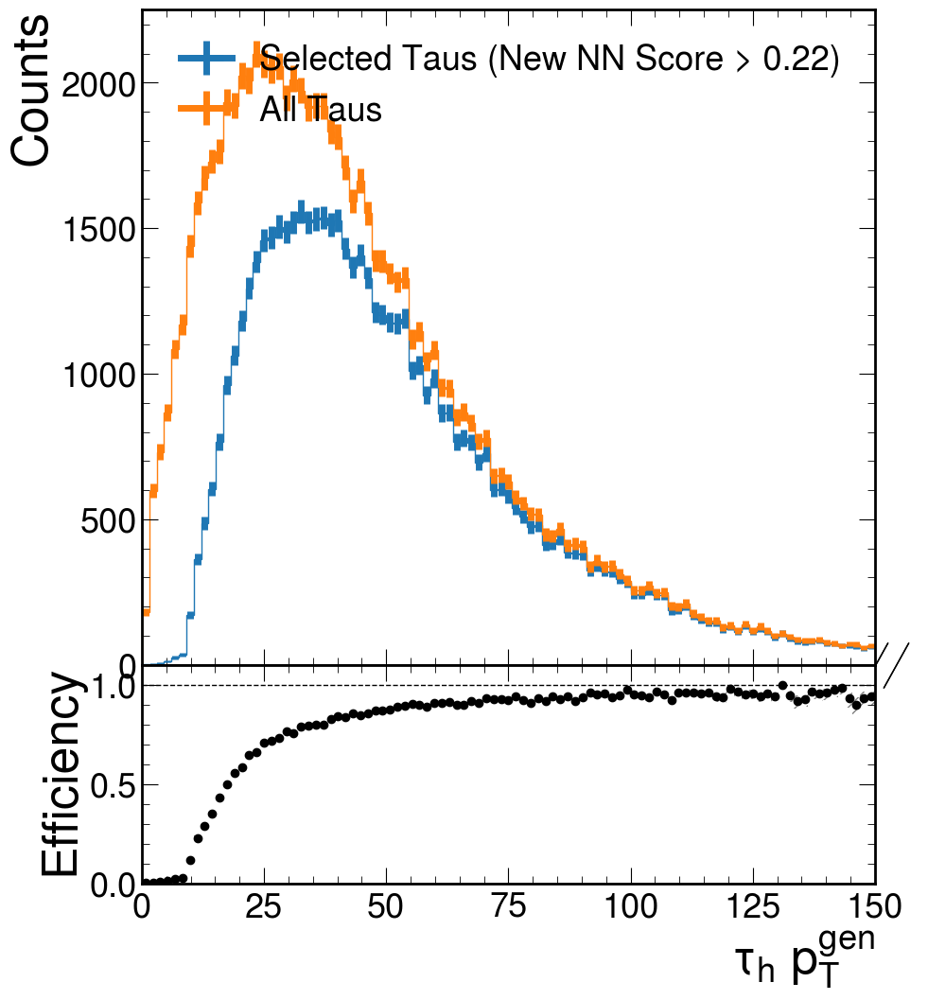

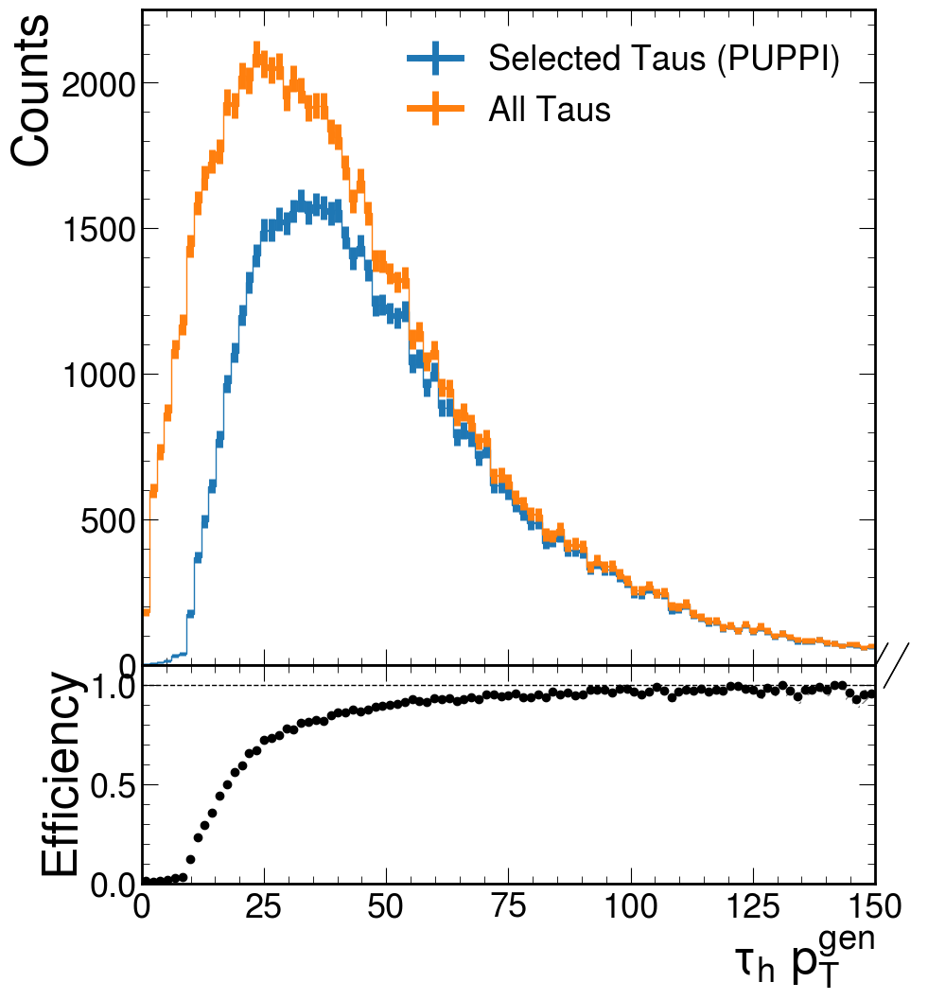

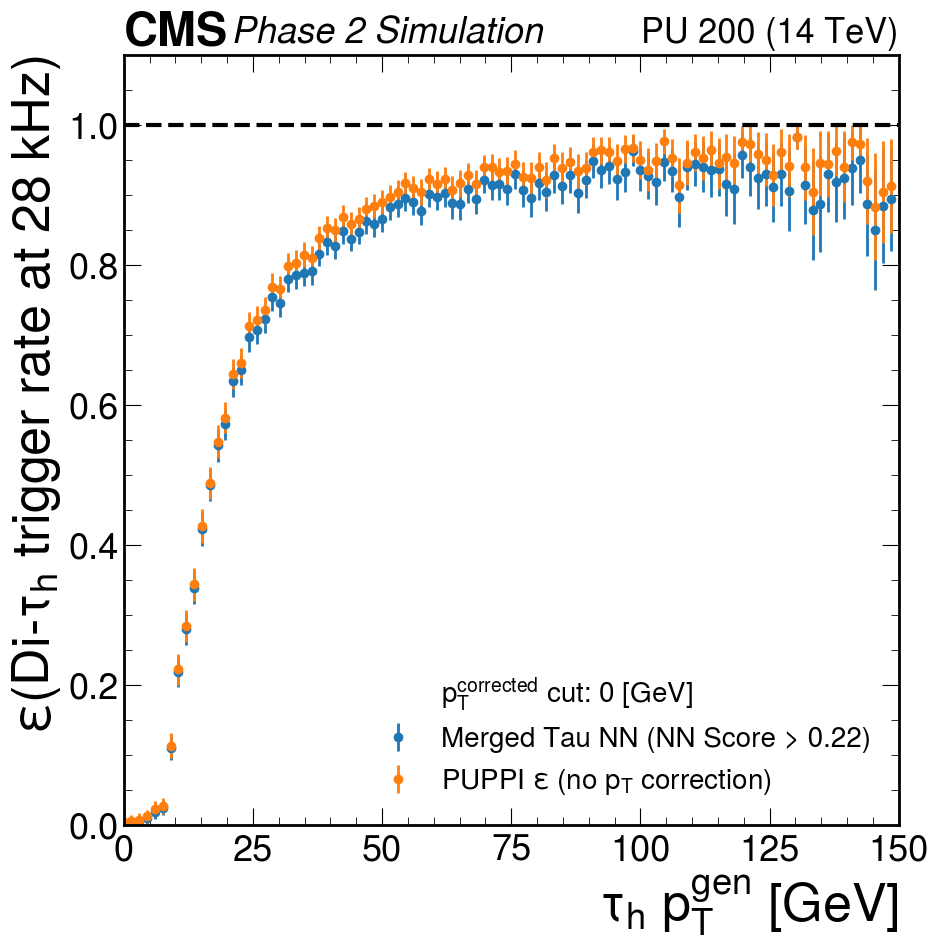

1831/1831 [==============================] - 2s 866us/step


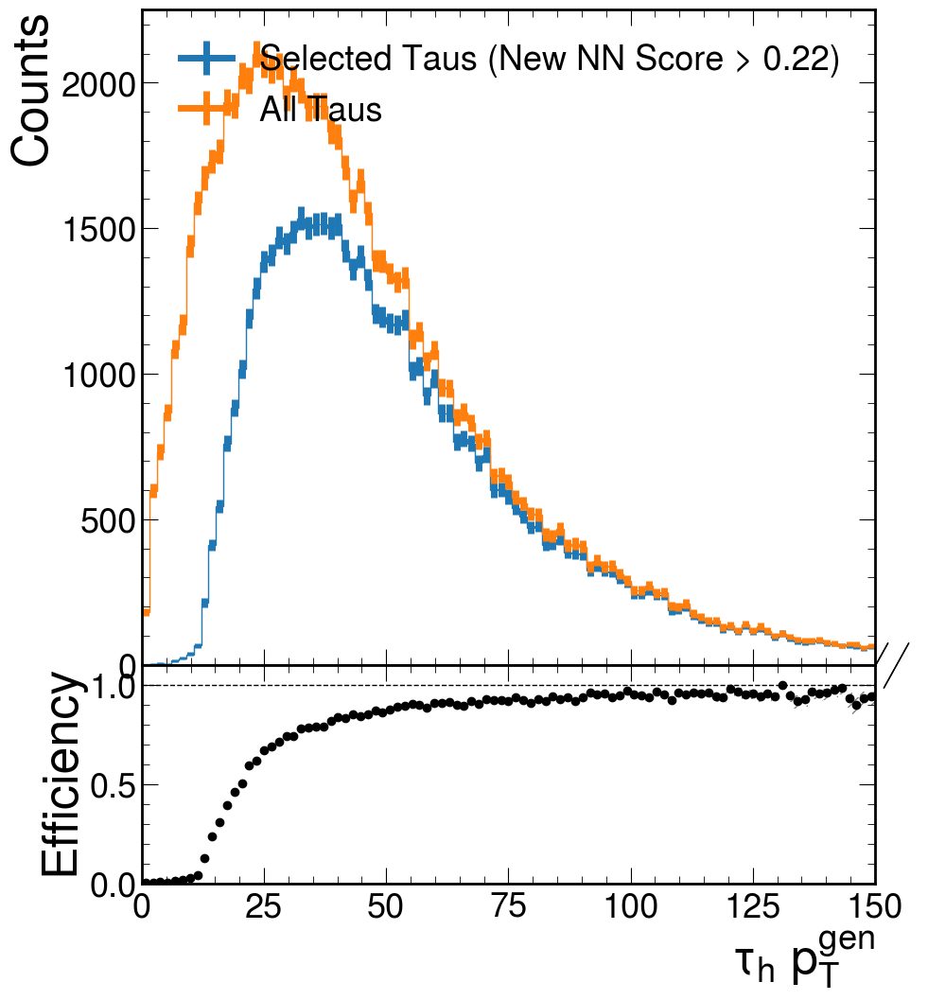

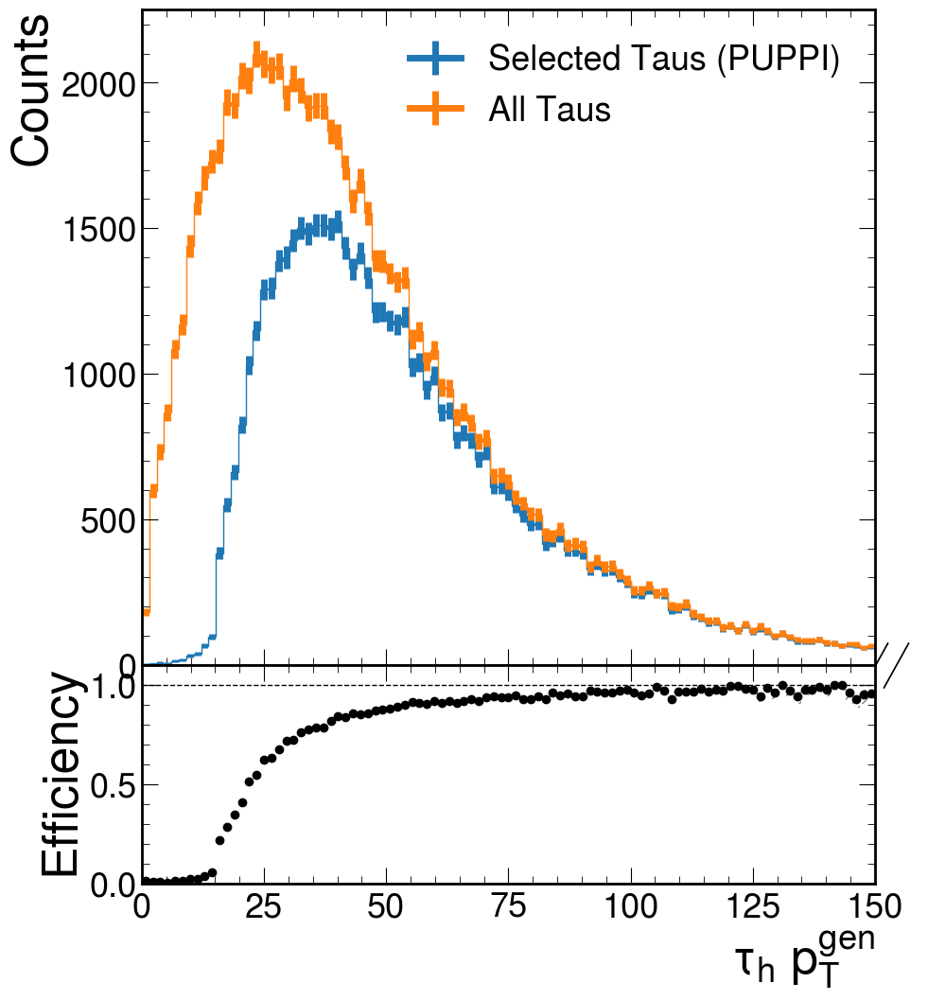

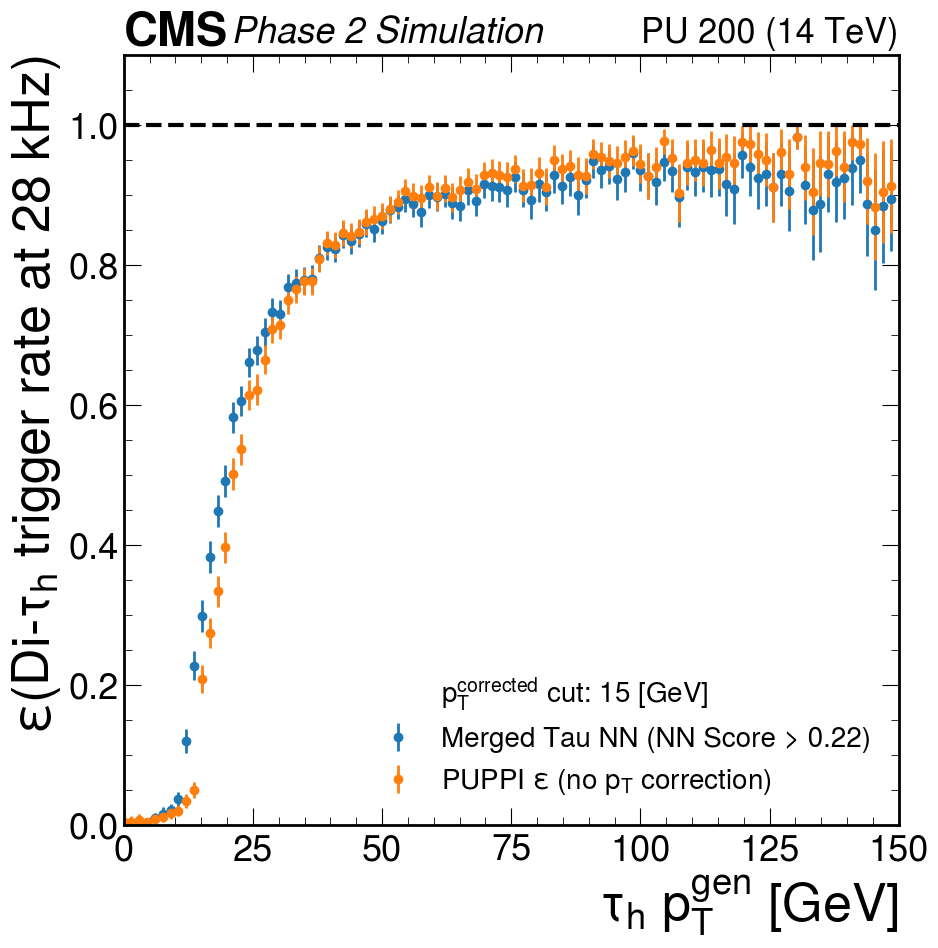

1706/1706 [==============================] - 2s 929us/step


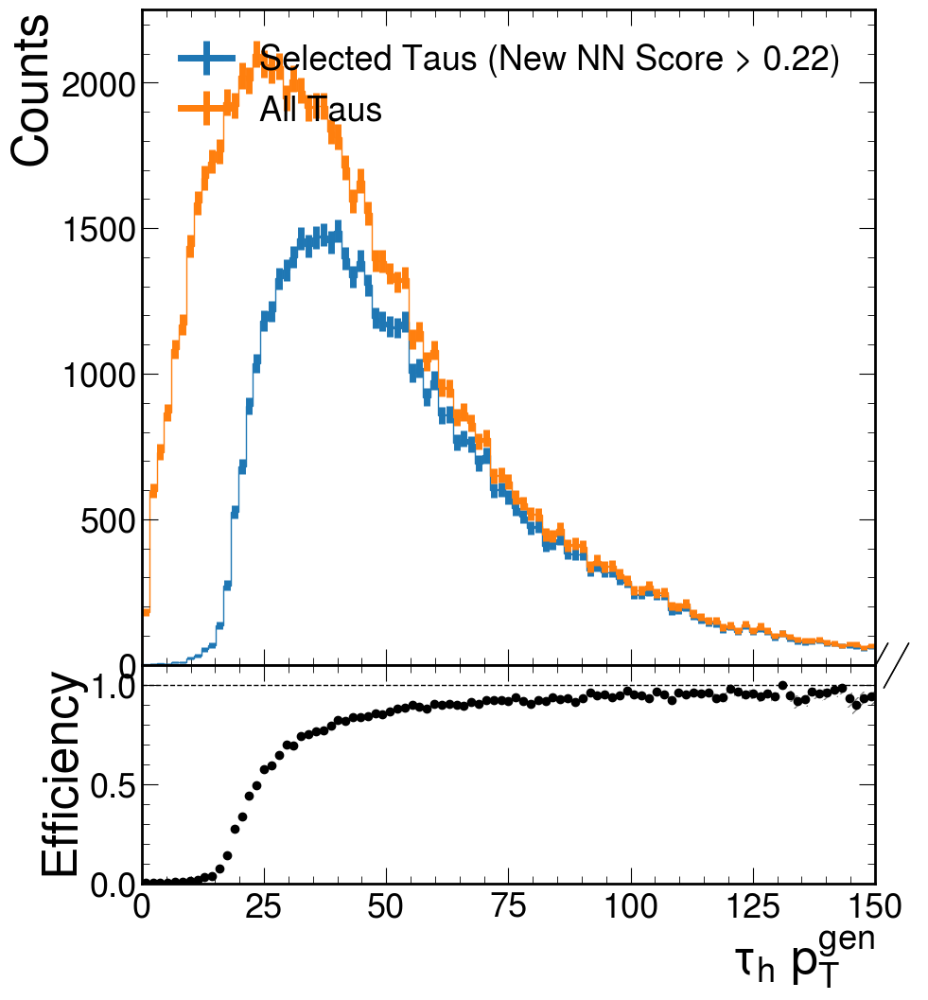

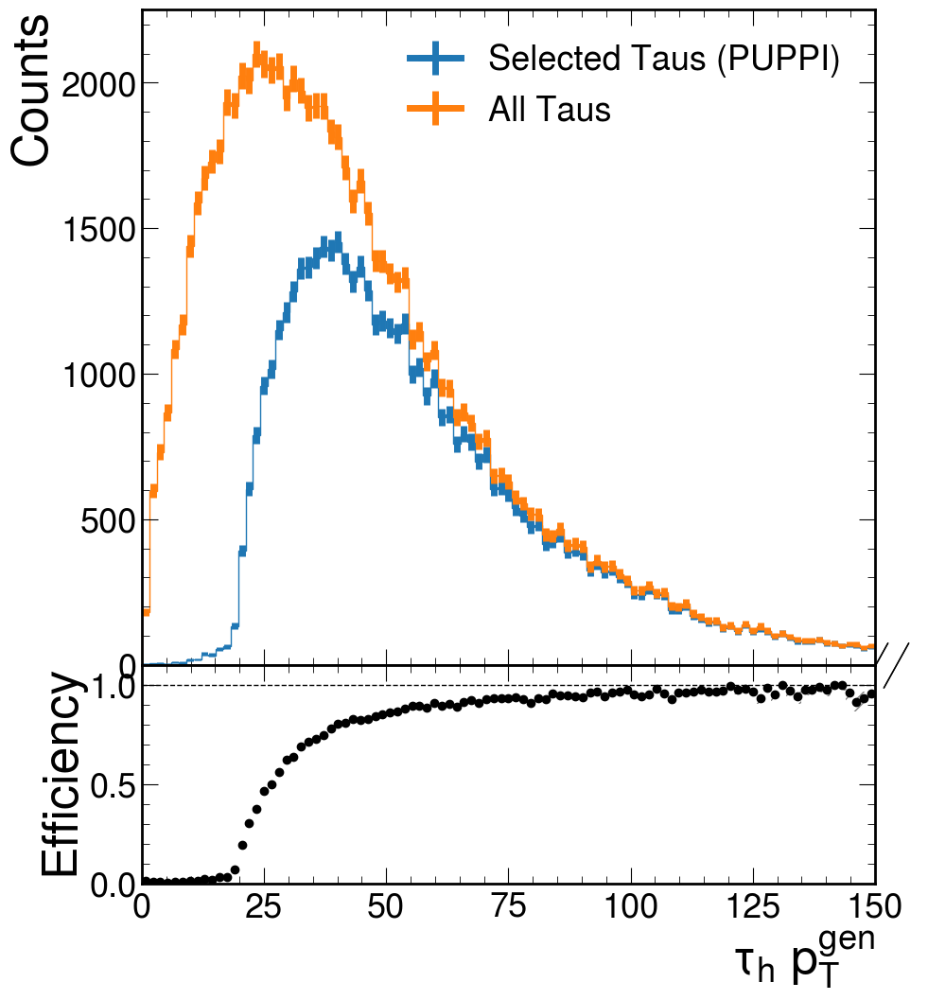

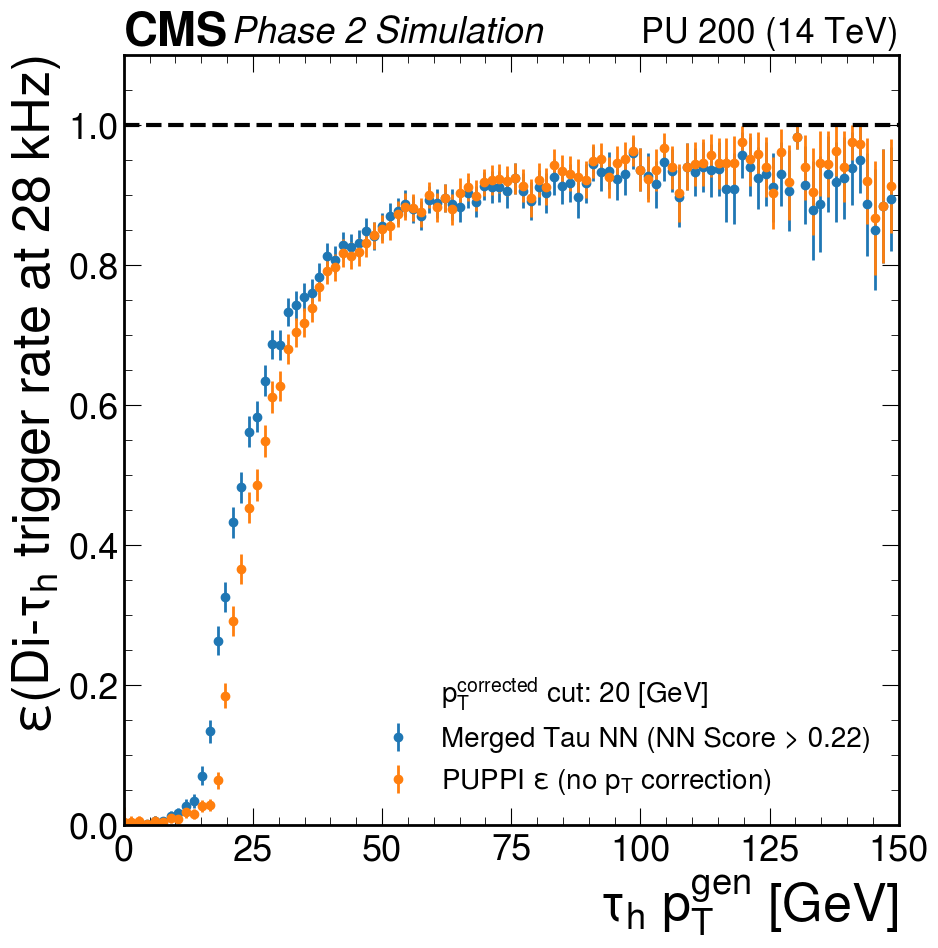

1576/1576 [==============================] - 2s 977us/step


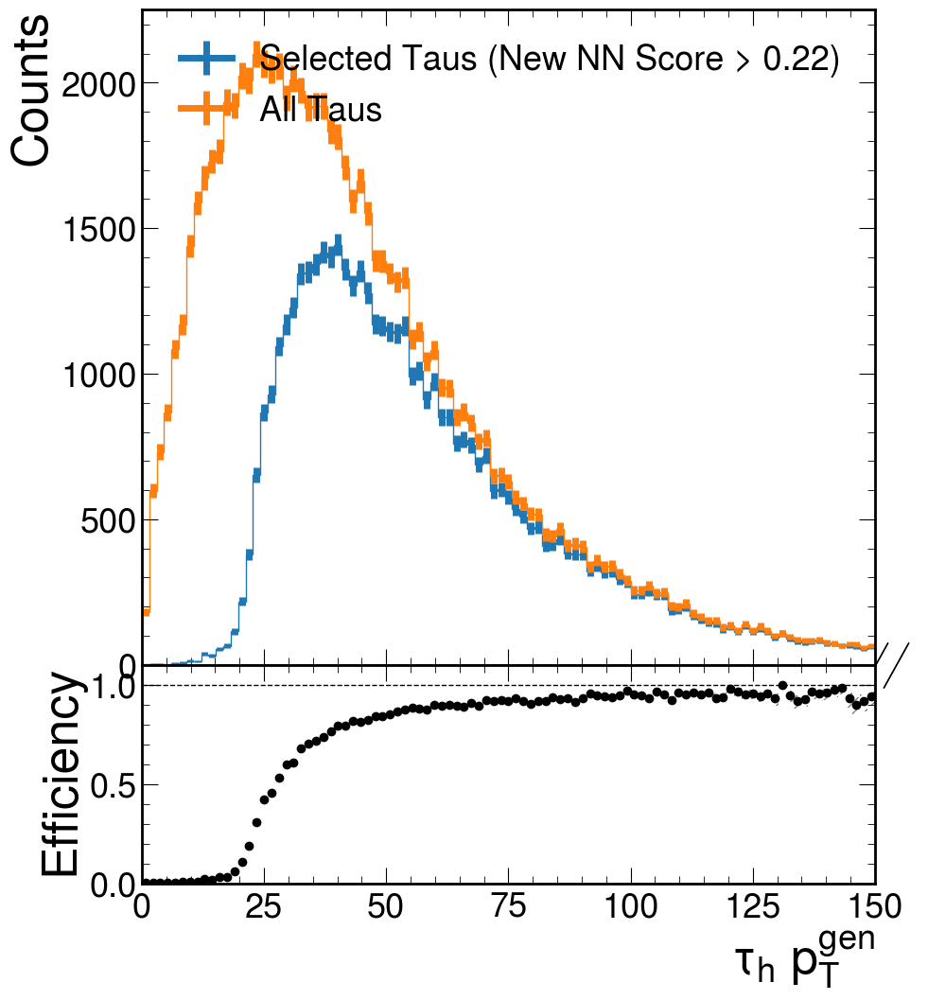

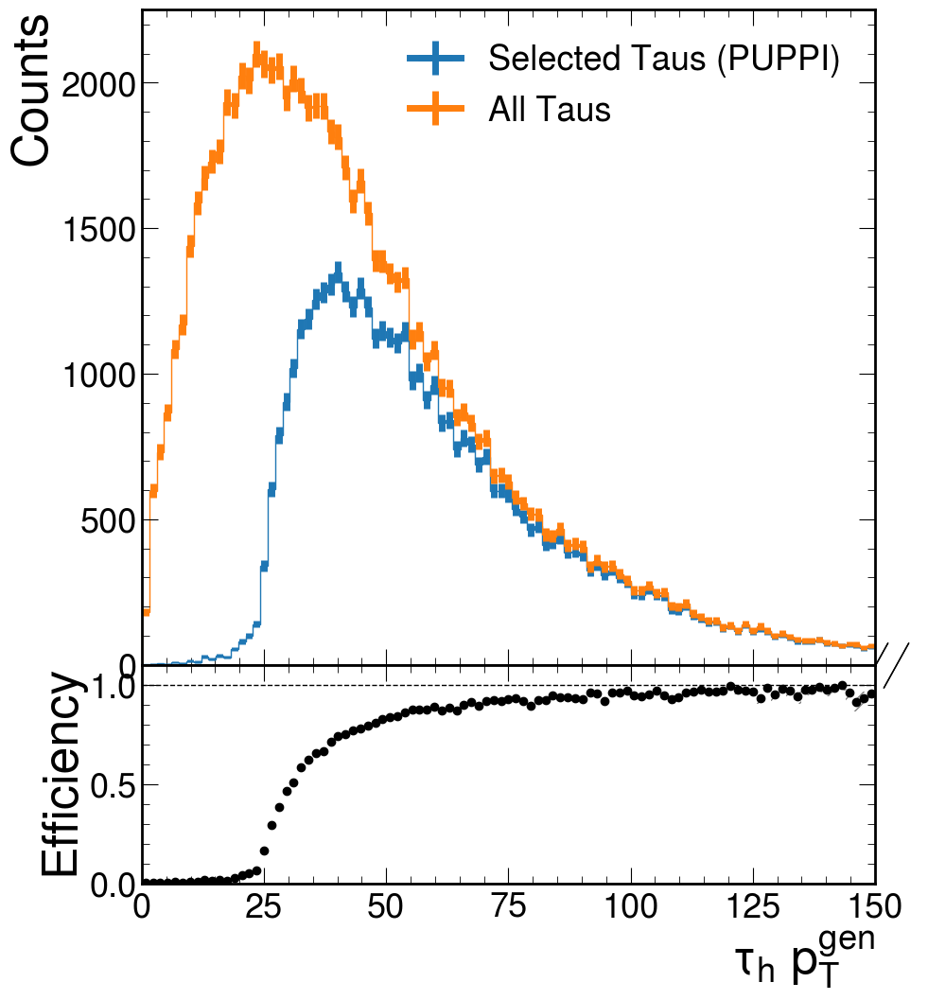

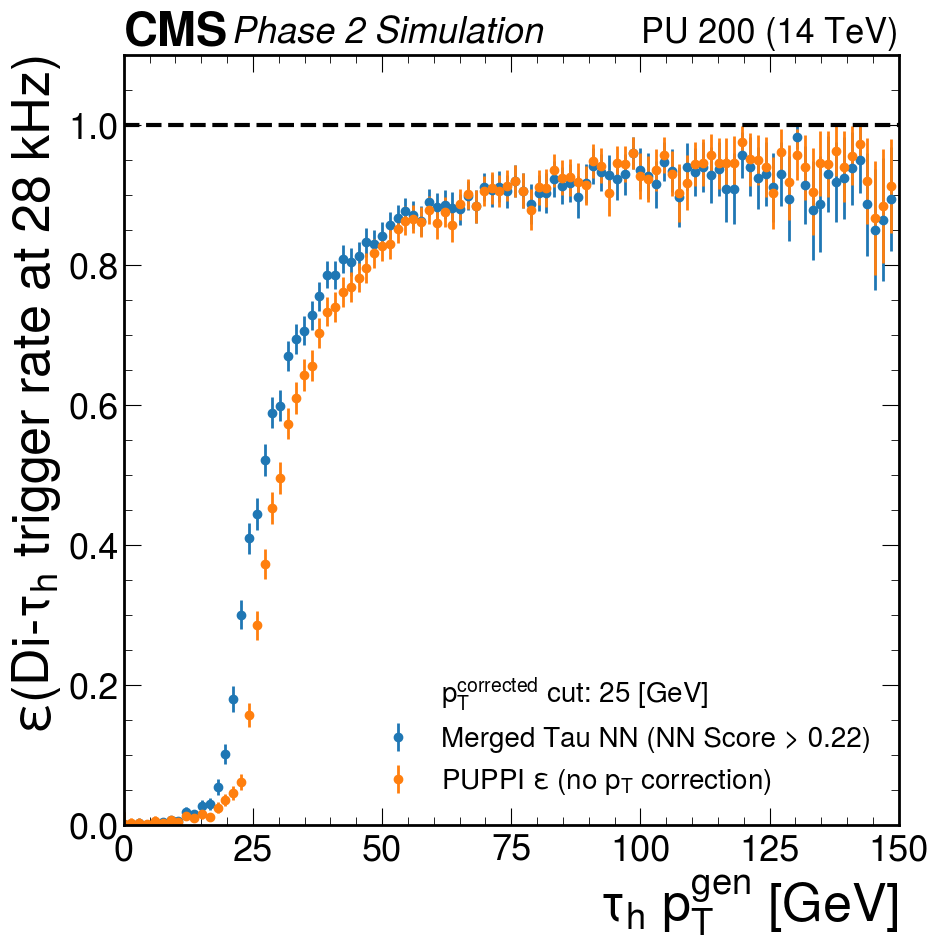

1432/1432 [==============================] - 1s 898us/step


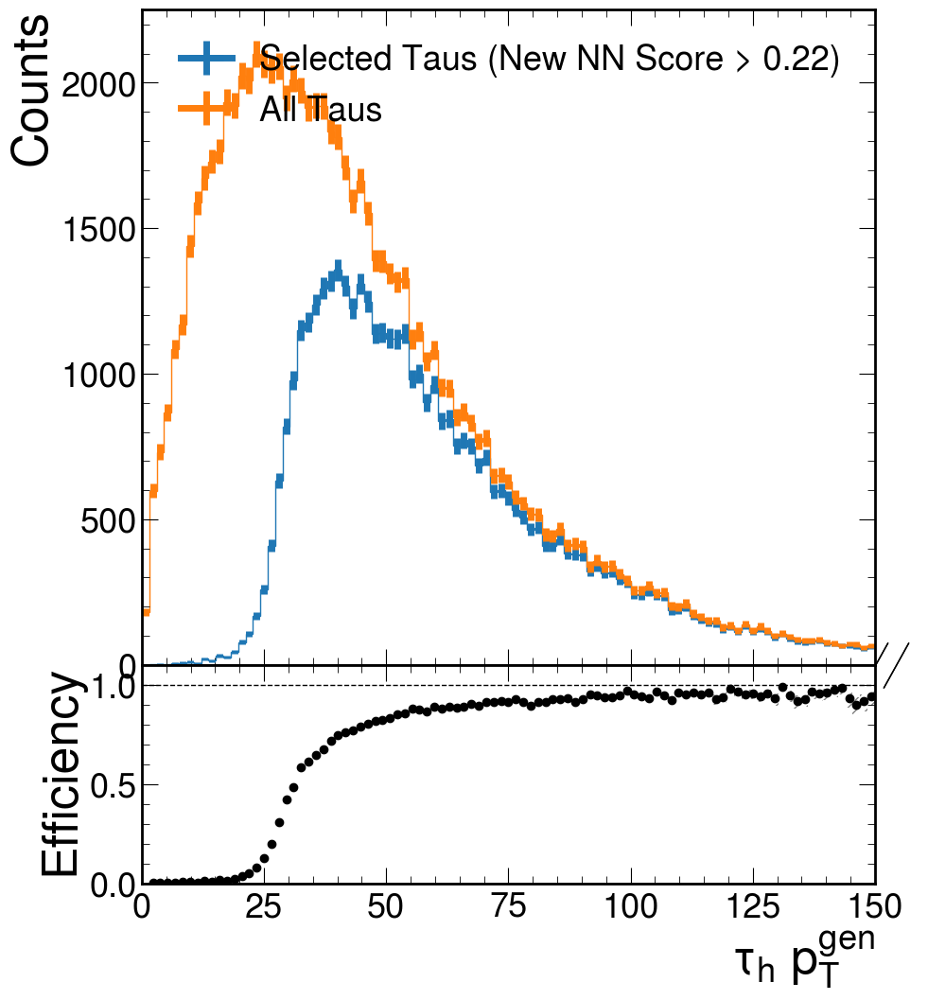

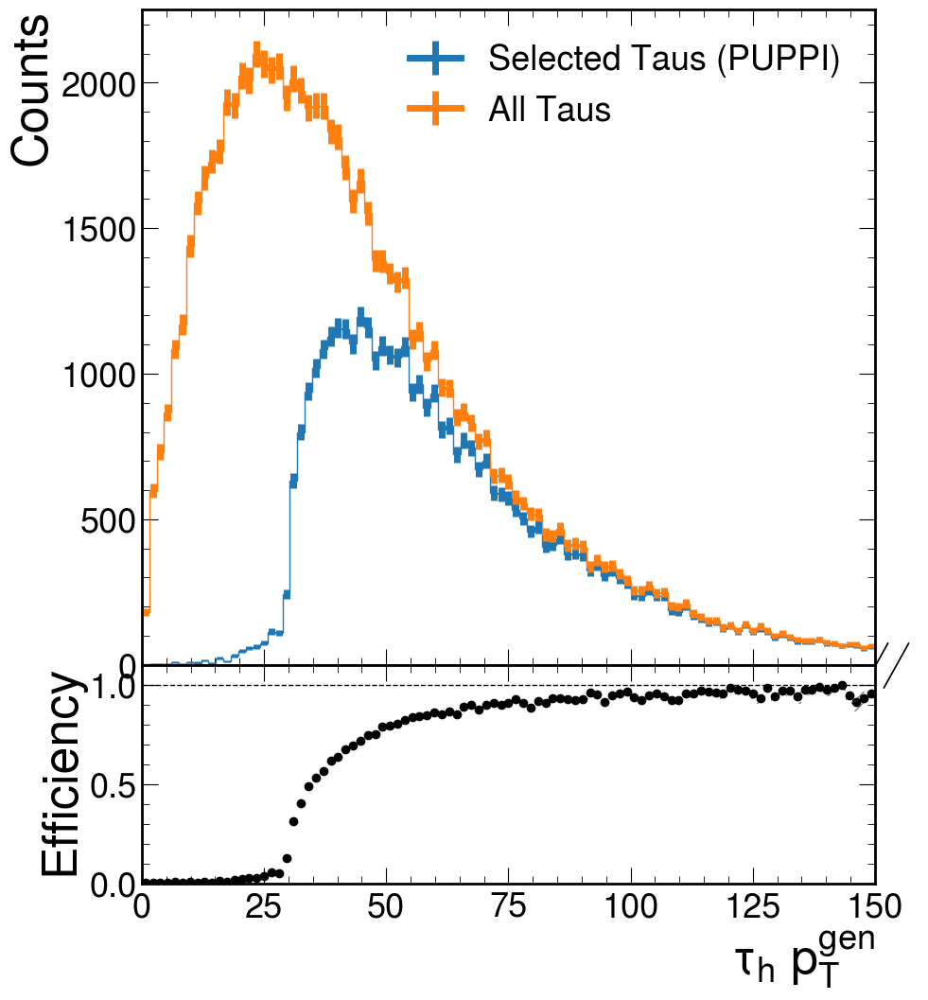

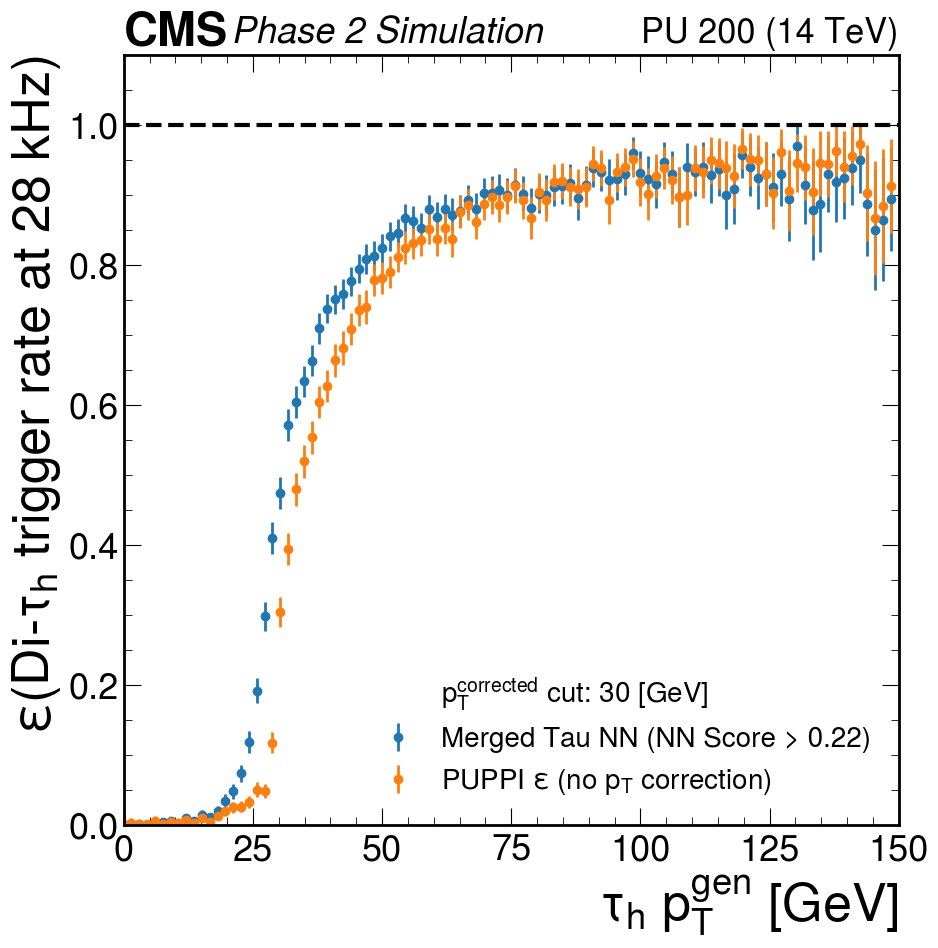

1279/1279 [==============================] - 1s 972us/step


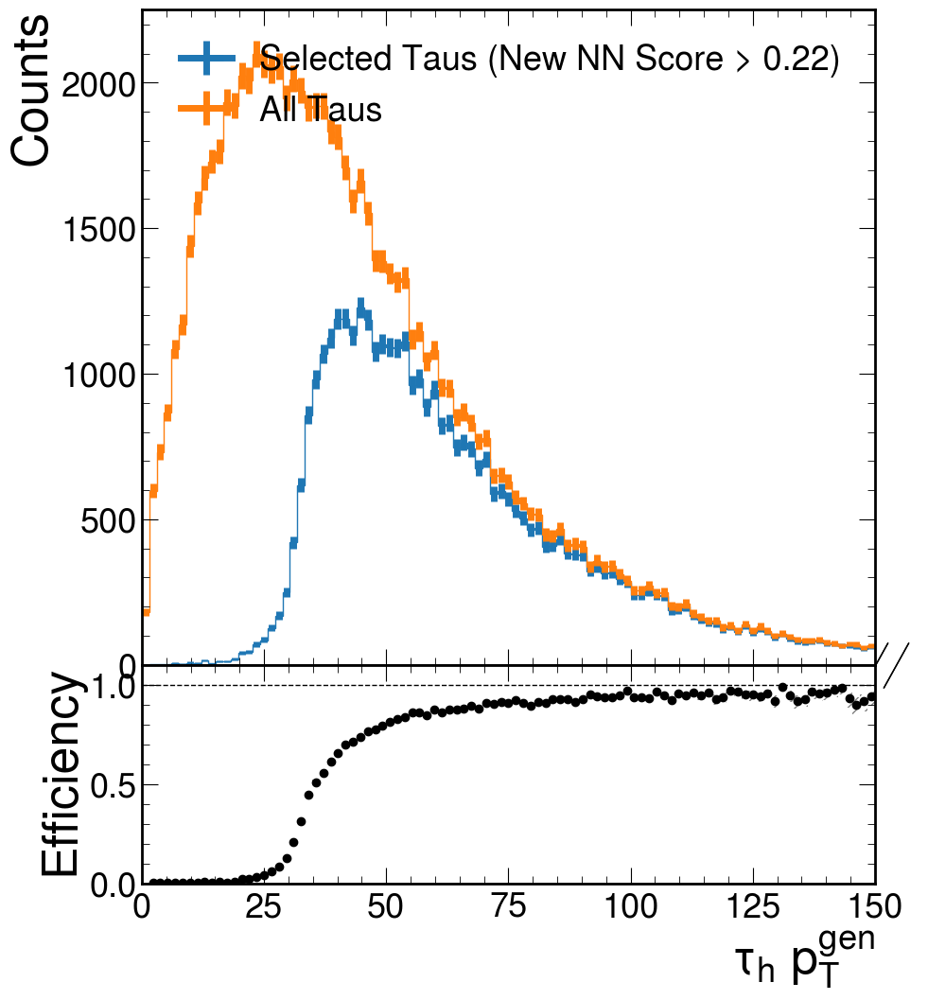

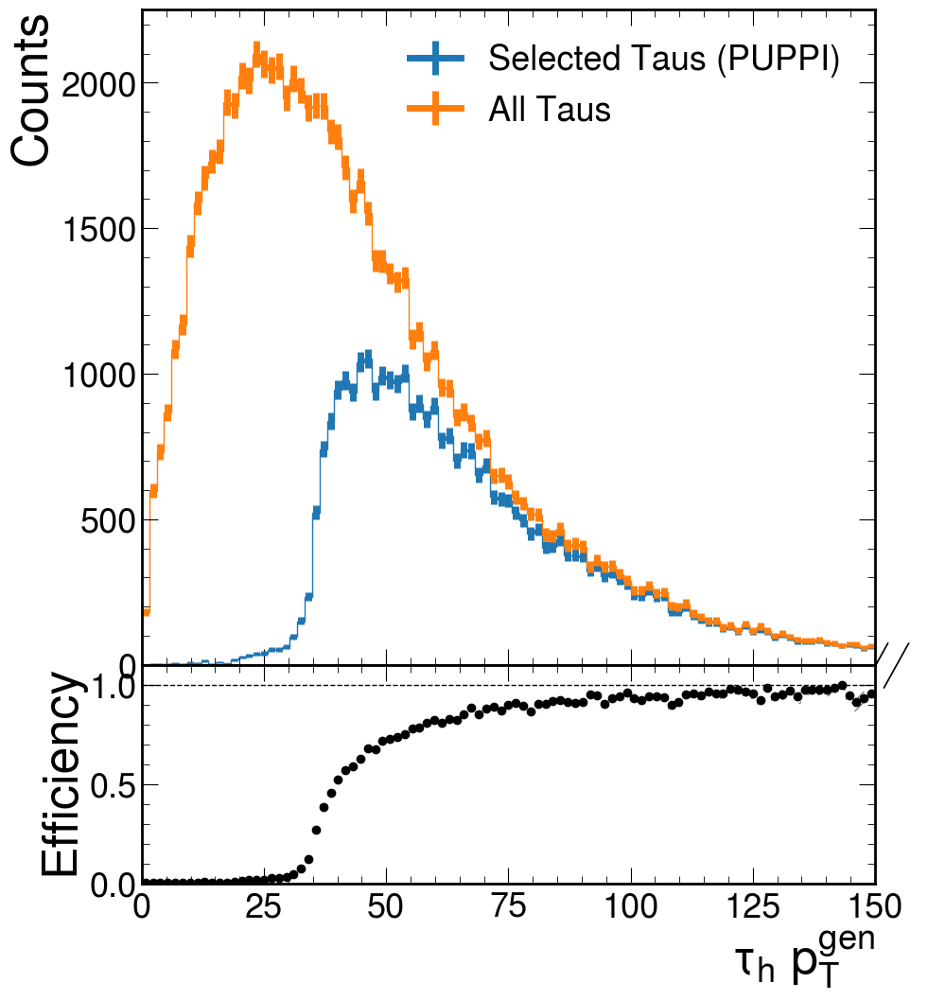

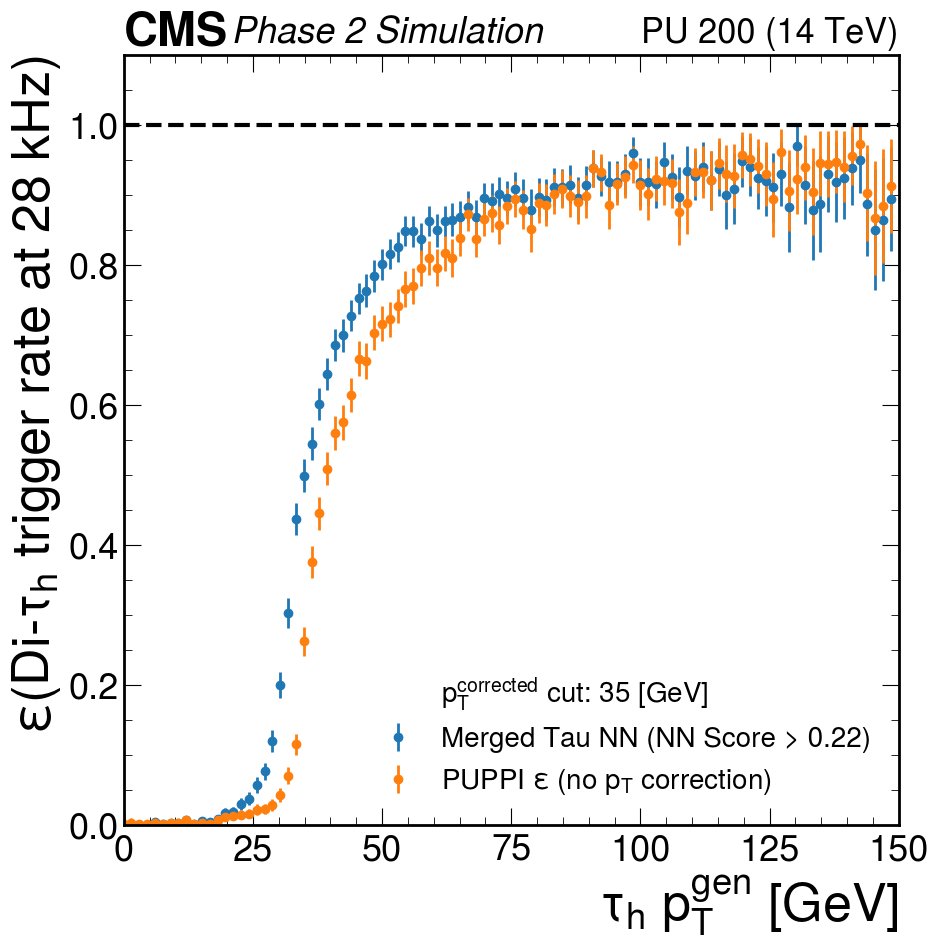

1124/1124 [==============================] - 1s 879us/step


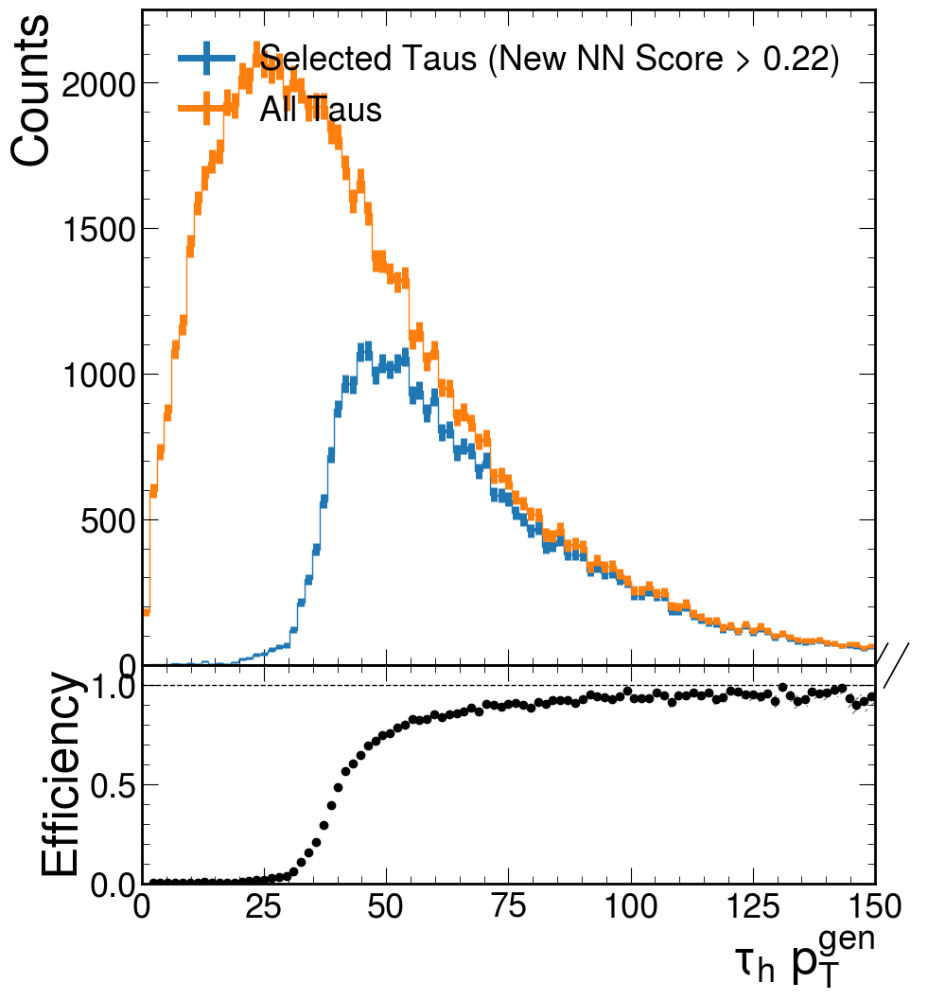

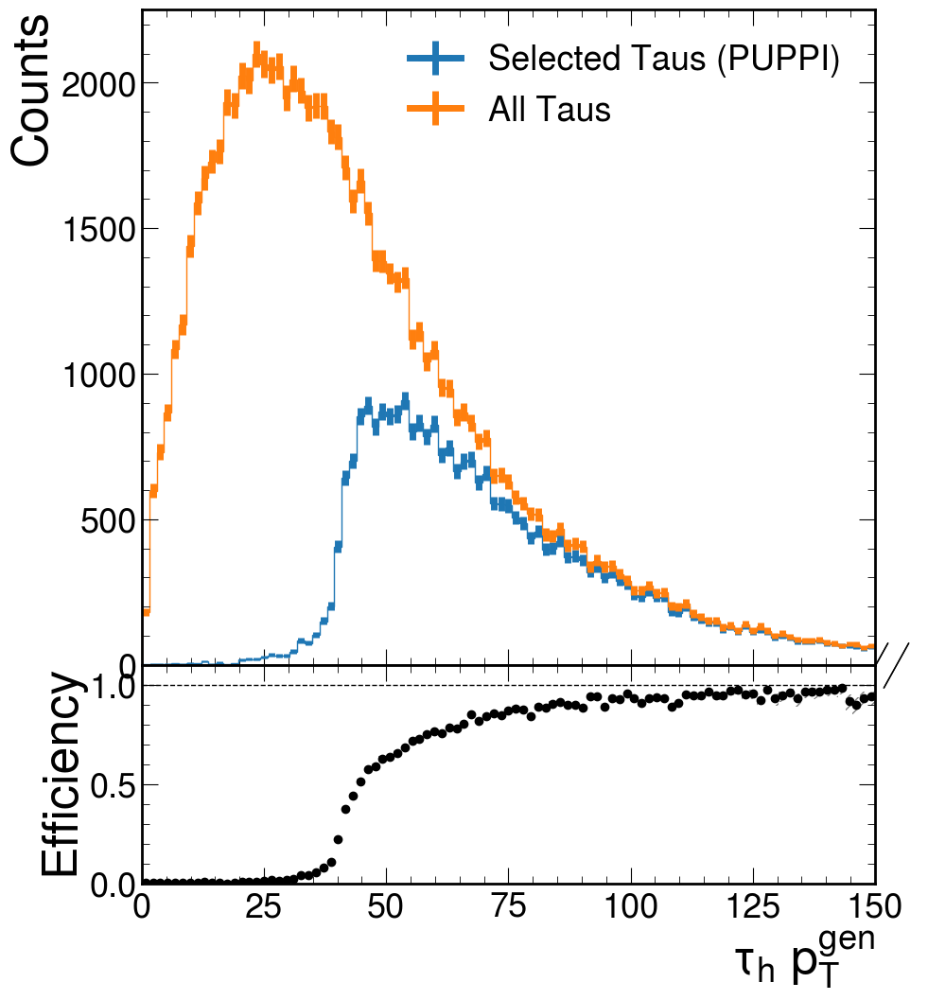

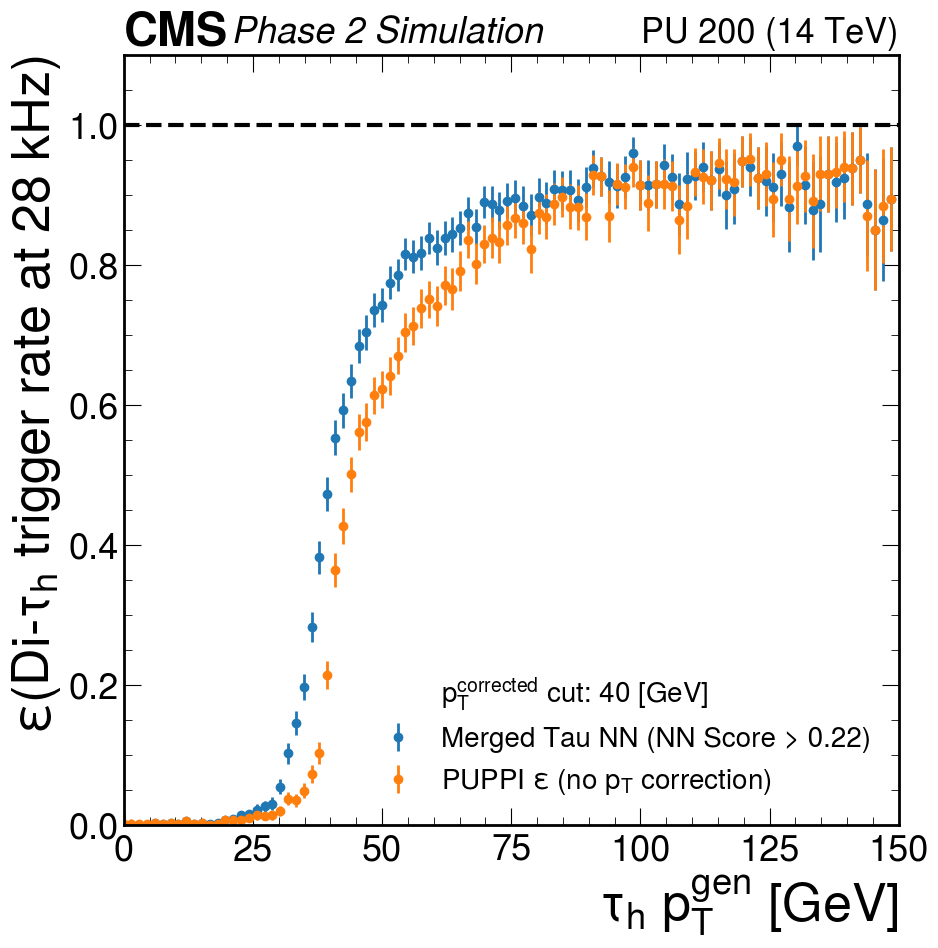

831/831 [==============================] - 1s 1ms/step


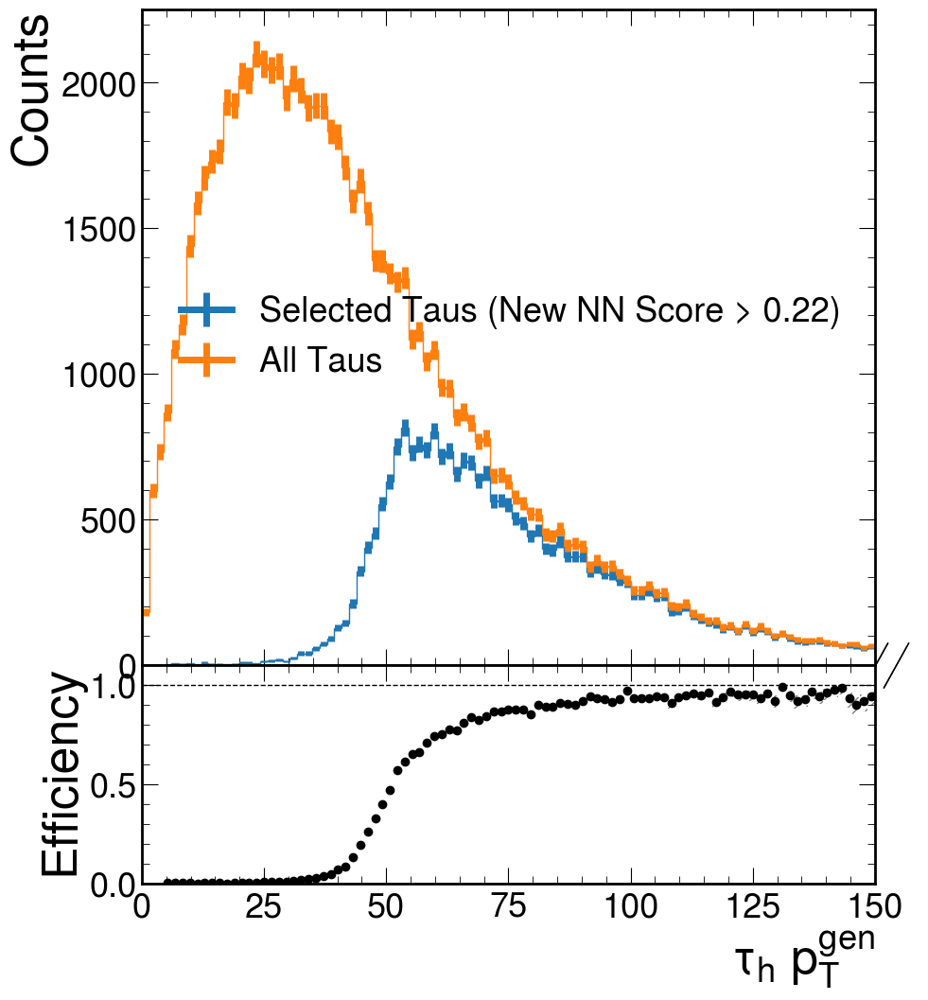

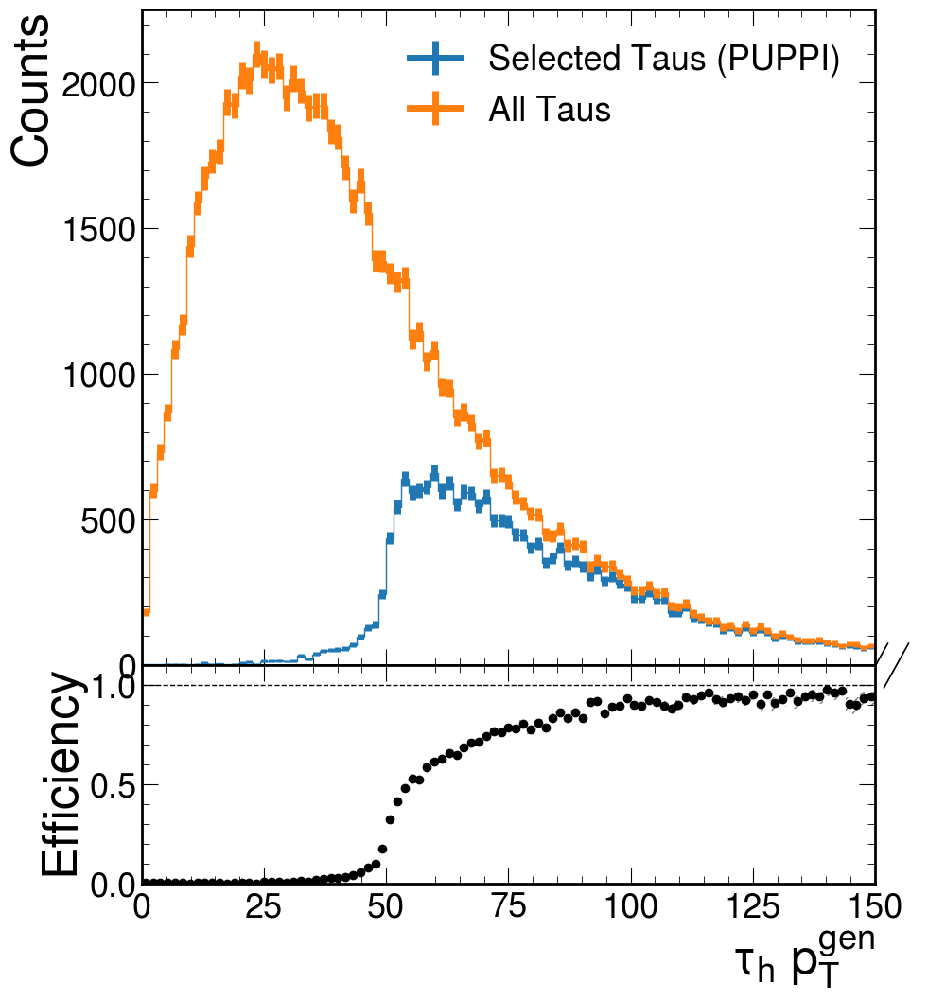

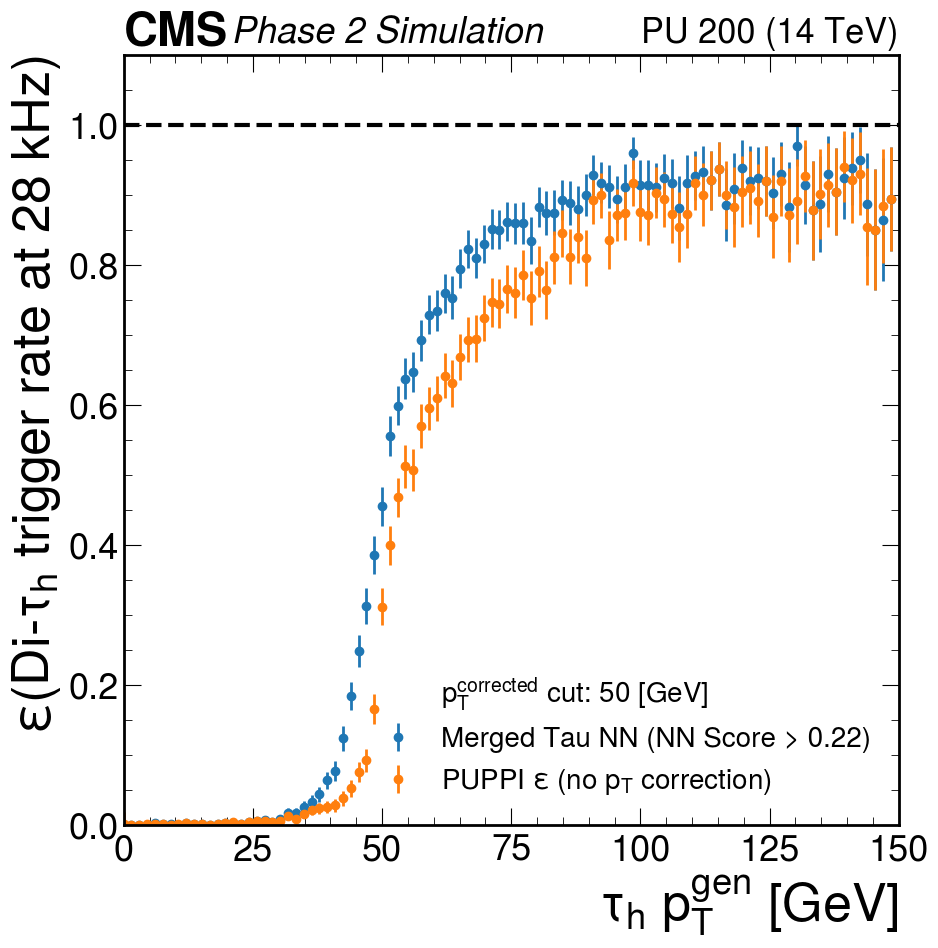

594/594 [==============================] - 0s 792us/step


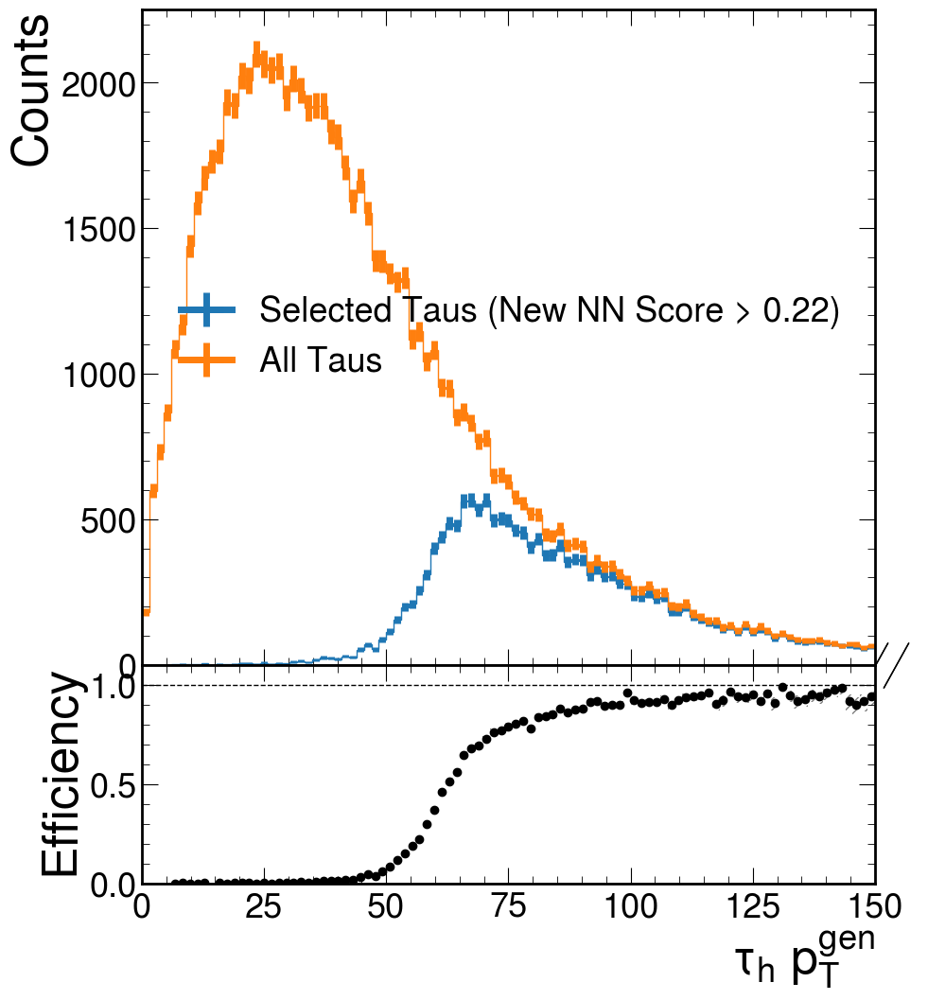

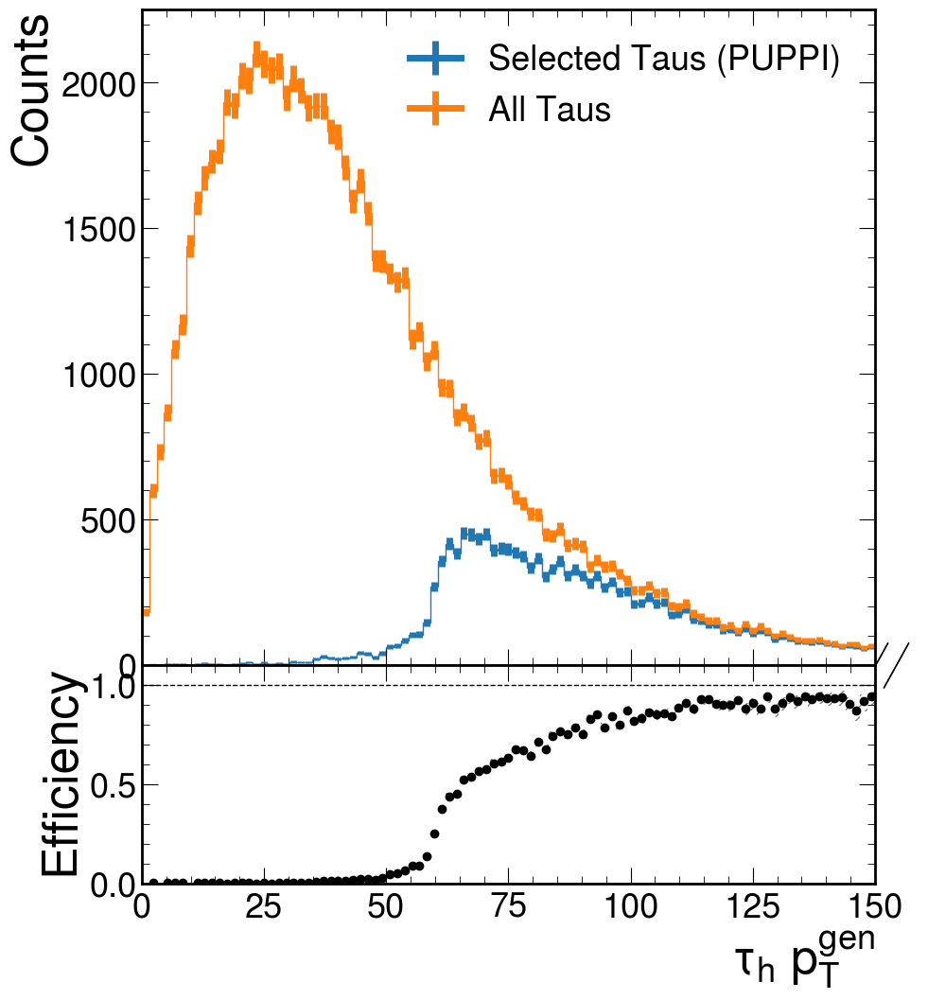

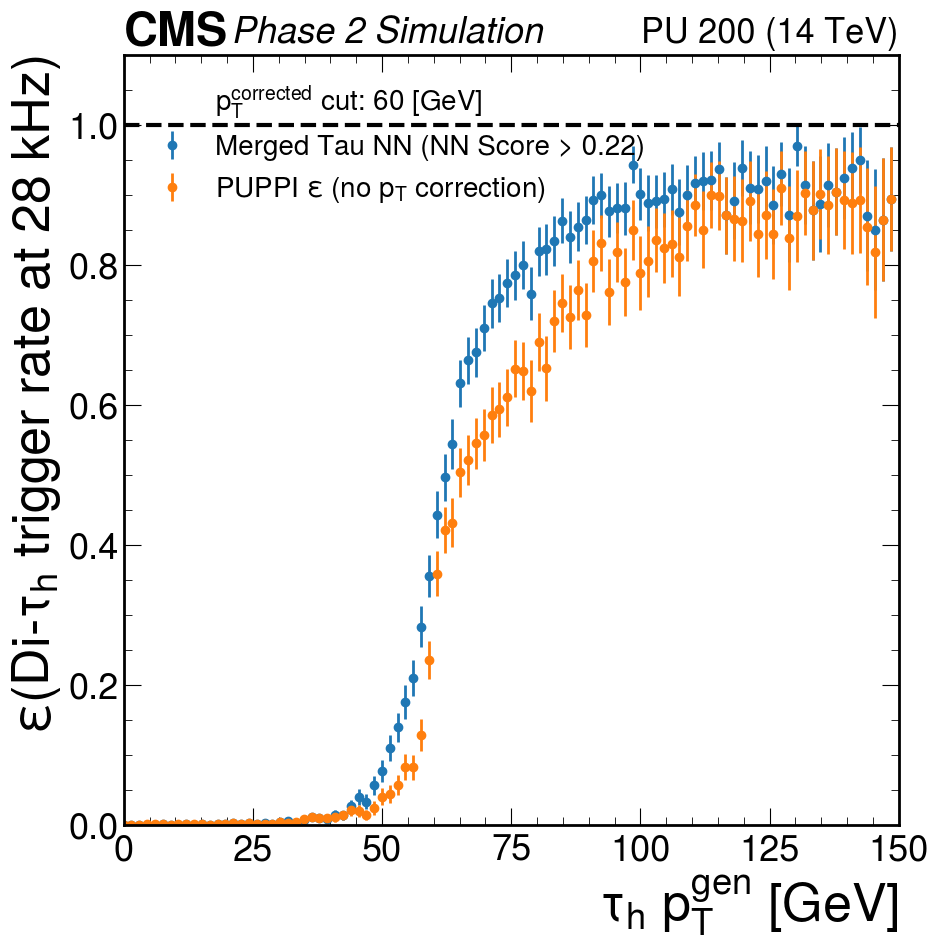

423/423 [==============================] - 0s 908us/step


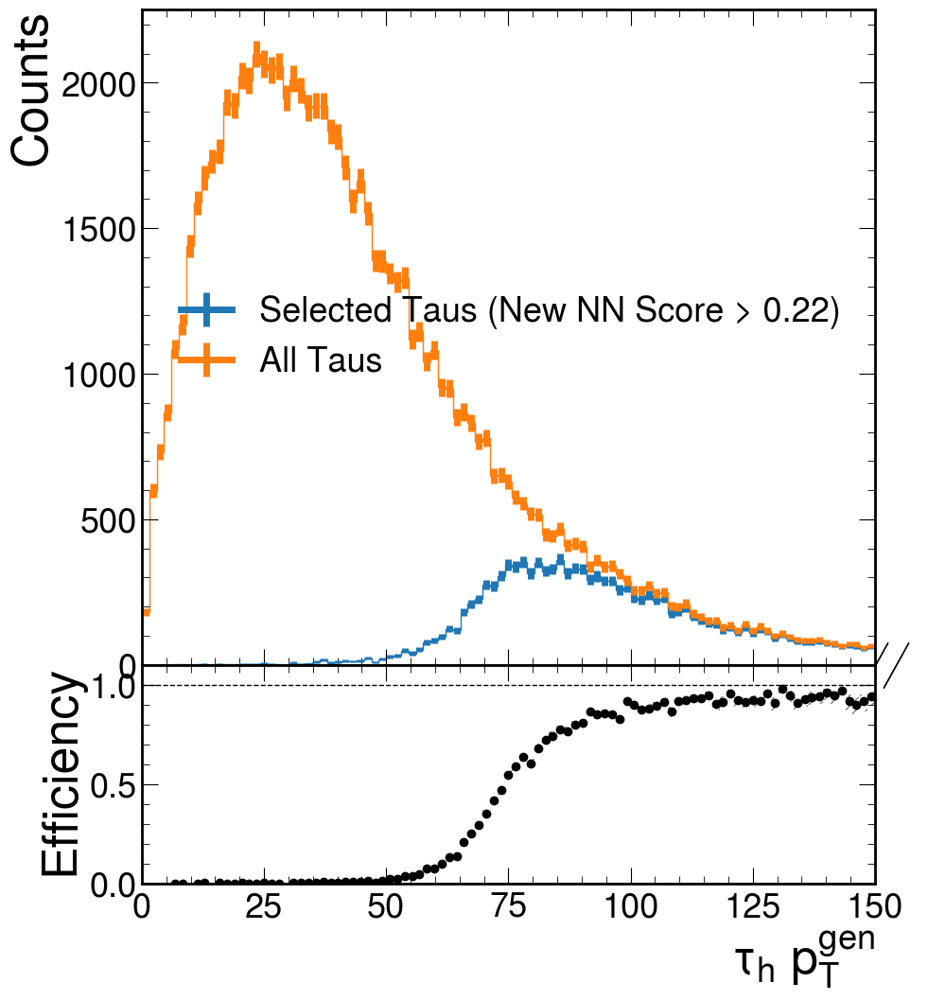

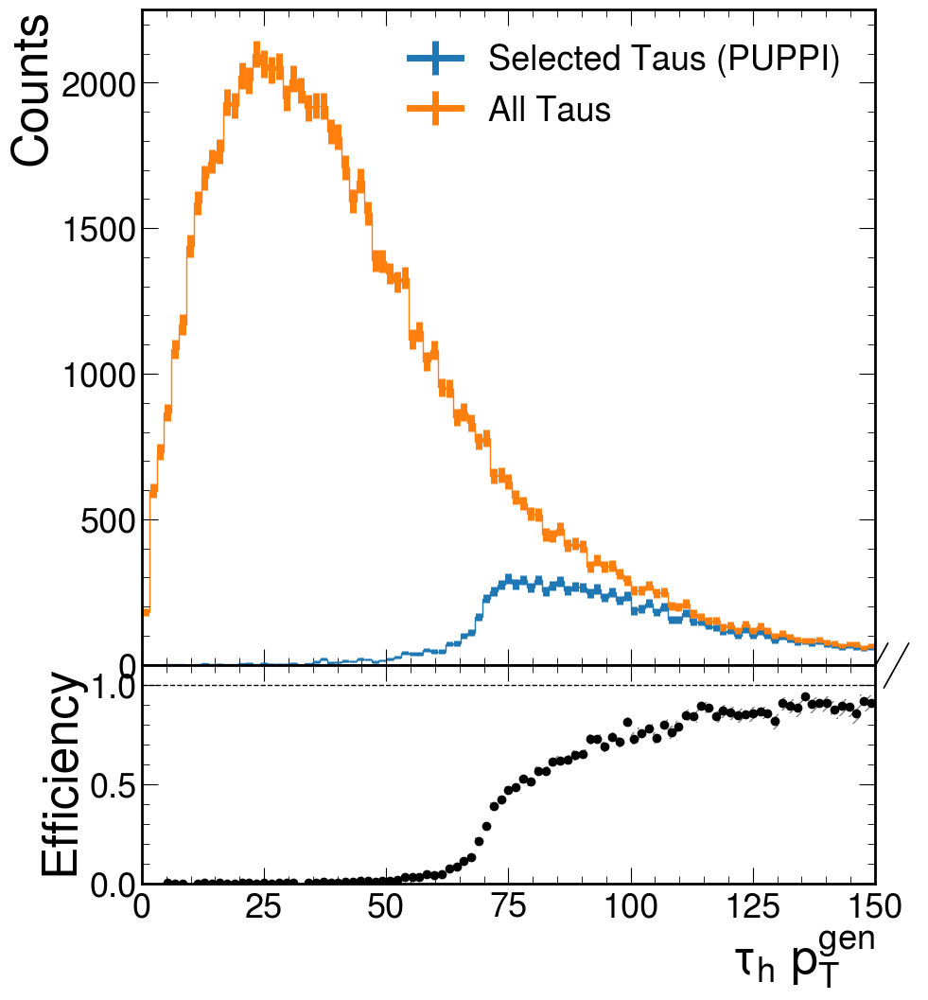

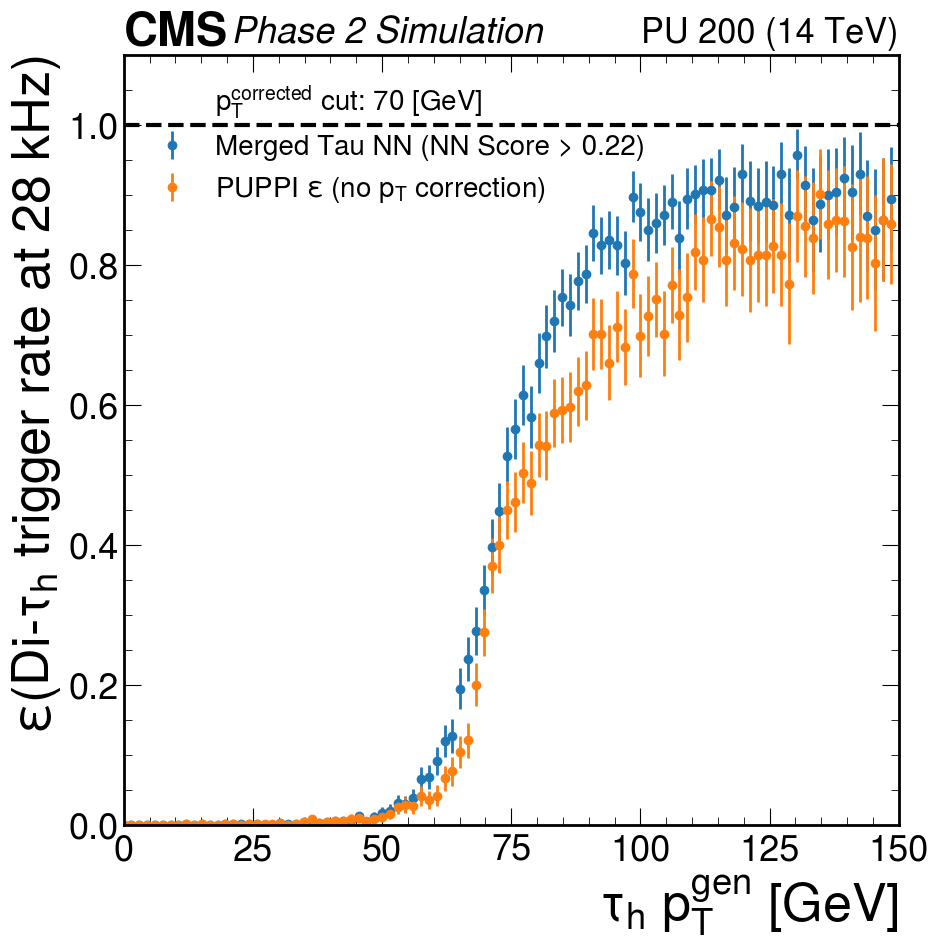

306/306 [==============================] - 0s 887us/step


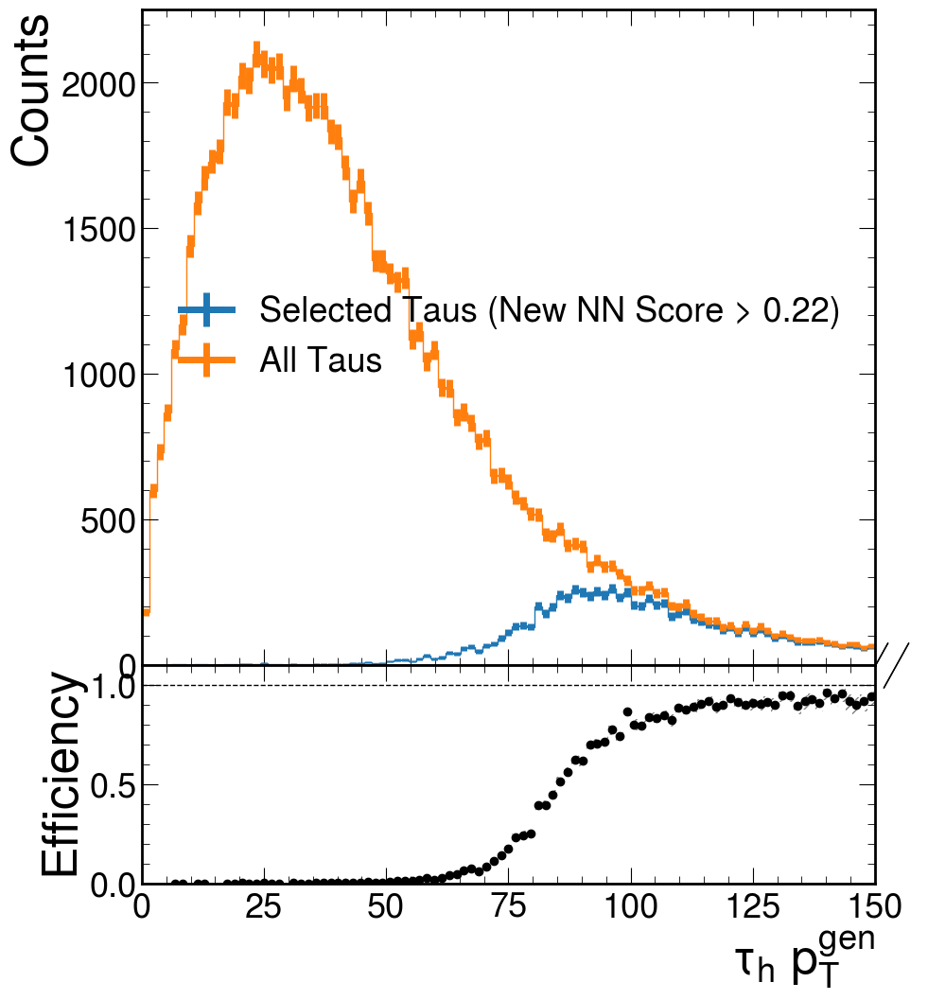

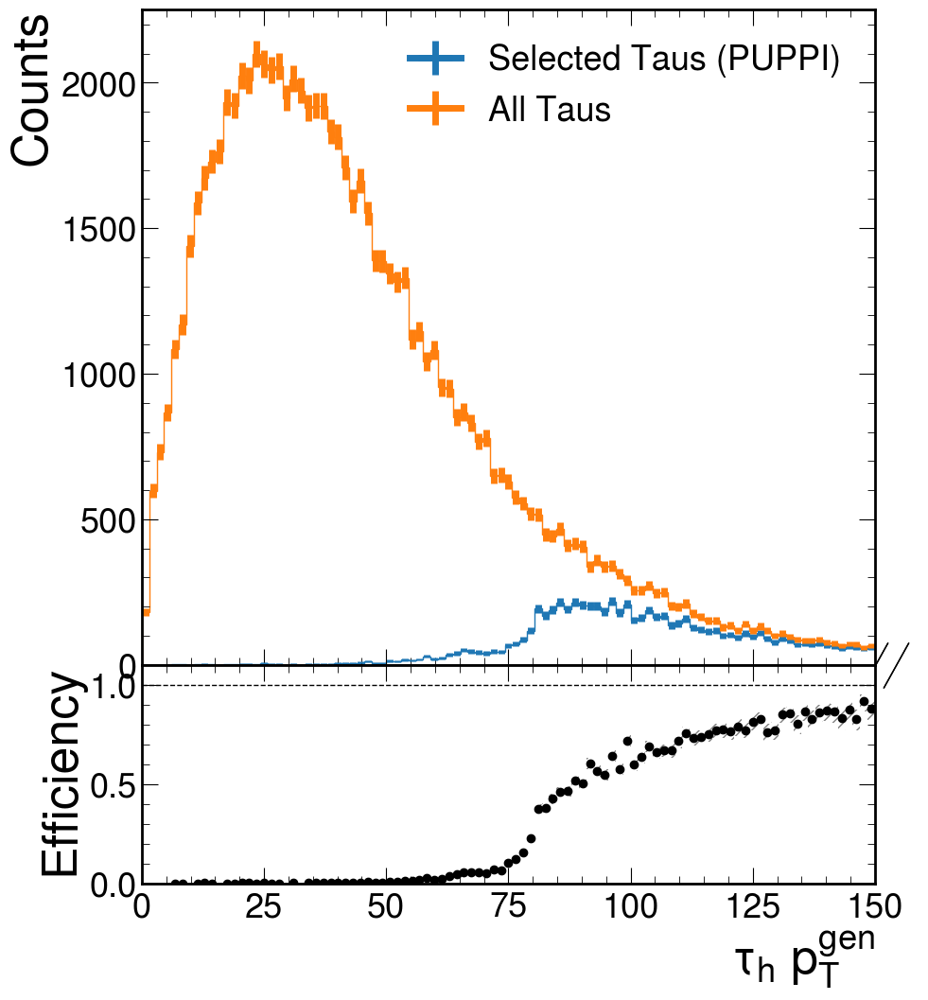

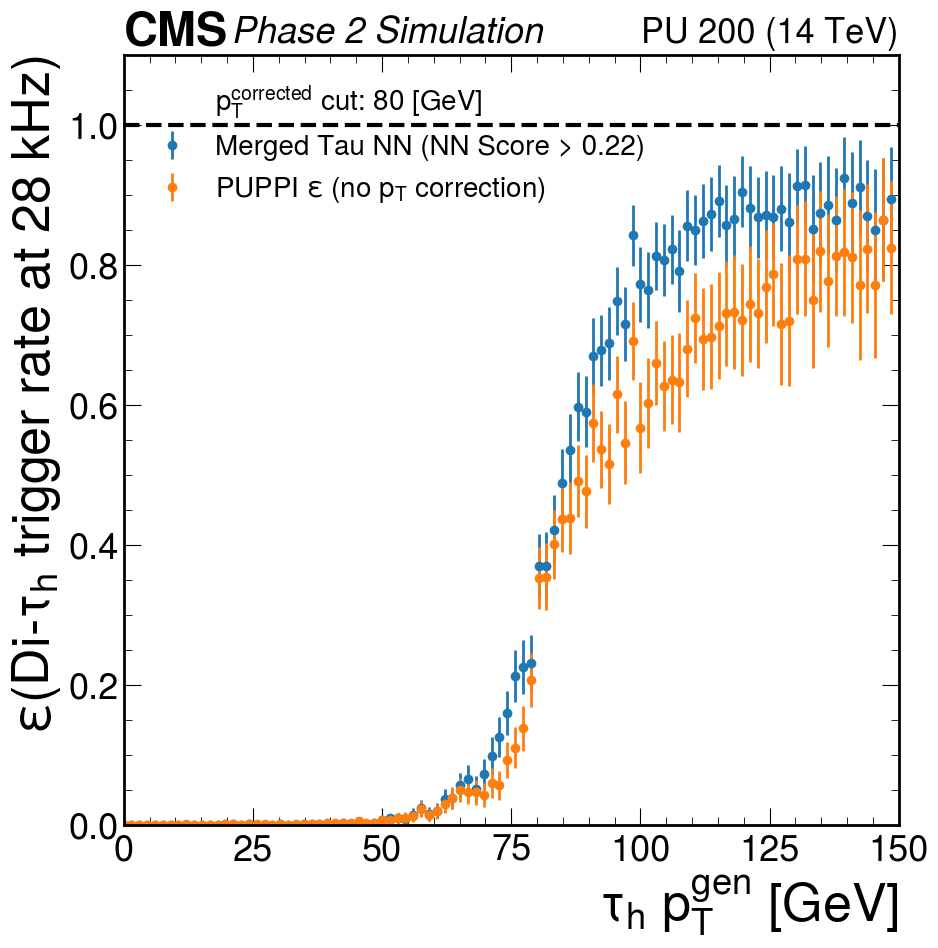

In [6]:
# ====================================================================== SEPARATE NN 

results = plot_pt_eff_puppi_separate(model_pt_regress_separate,
                                model_jetID_separate,
                                '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                                corrected_pt_cut=0,
                                cut_point = 0.22)
no_cut_x = np.asarray(results[0])
no_cut_y = np.asarray(results[1])


threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
gen_pT_list = []
for i in threshold_list:
    result = plot_pt_eff_puppi_separate(model_pt_regress_separate,
                            model_jetID_separate,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=i,
                            cut_point = 0.22)
    cut_x = np.asarray(result[0])
    cut_y = np.asarray(result[1])
    y_norm = np.divide(cut_y, no_cut_y)
    for i in range(1):
        if y_norm[i] == 1:
            y_norm[i] = 0
        else:
            break
    gen_pT_list.append(cut_x[y_norm > 0.95][0])
gen_pT_list_nn_separate = gen_pT_list

1905/1905 [==============================] - 2s 1ms/step


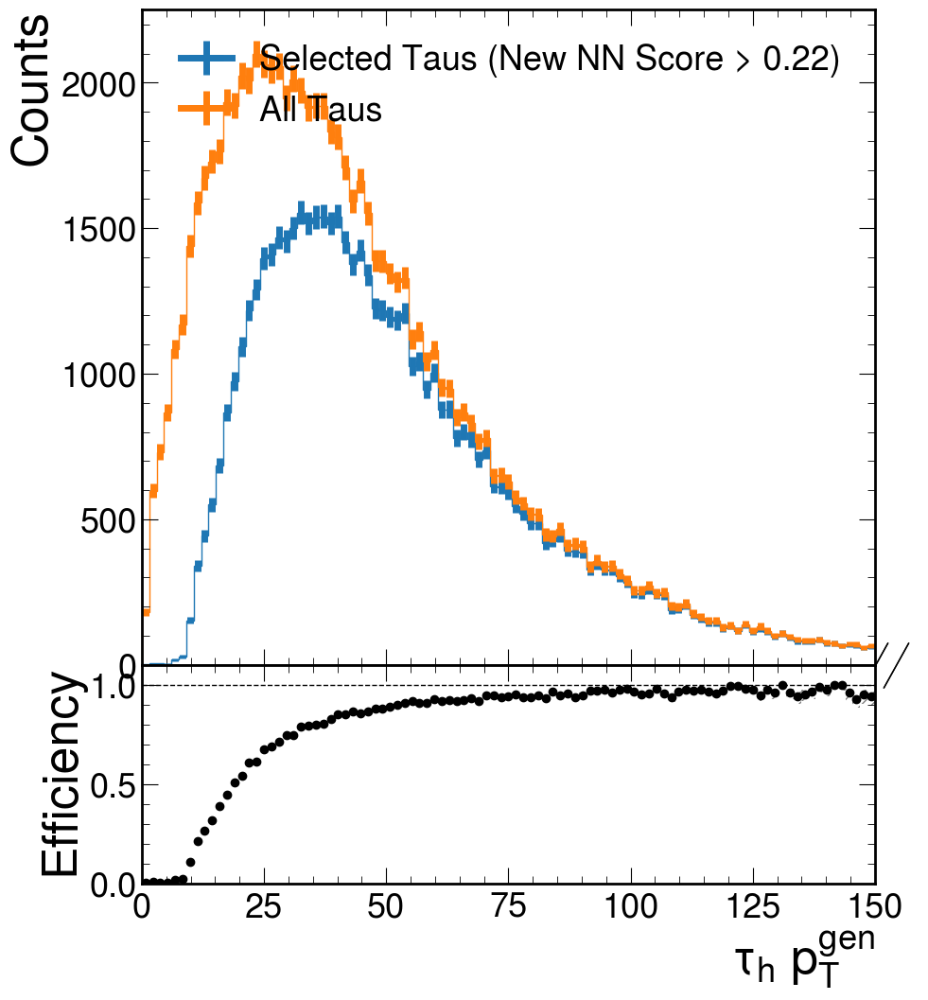

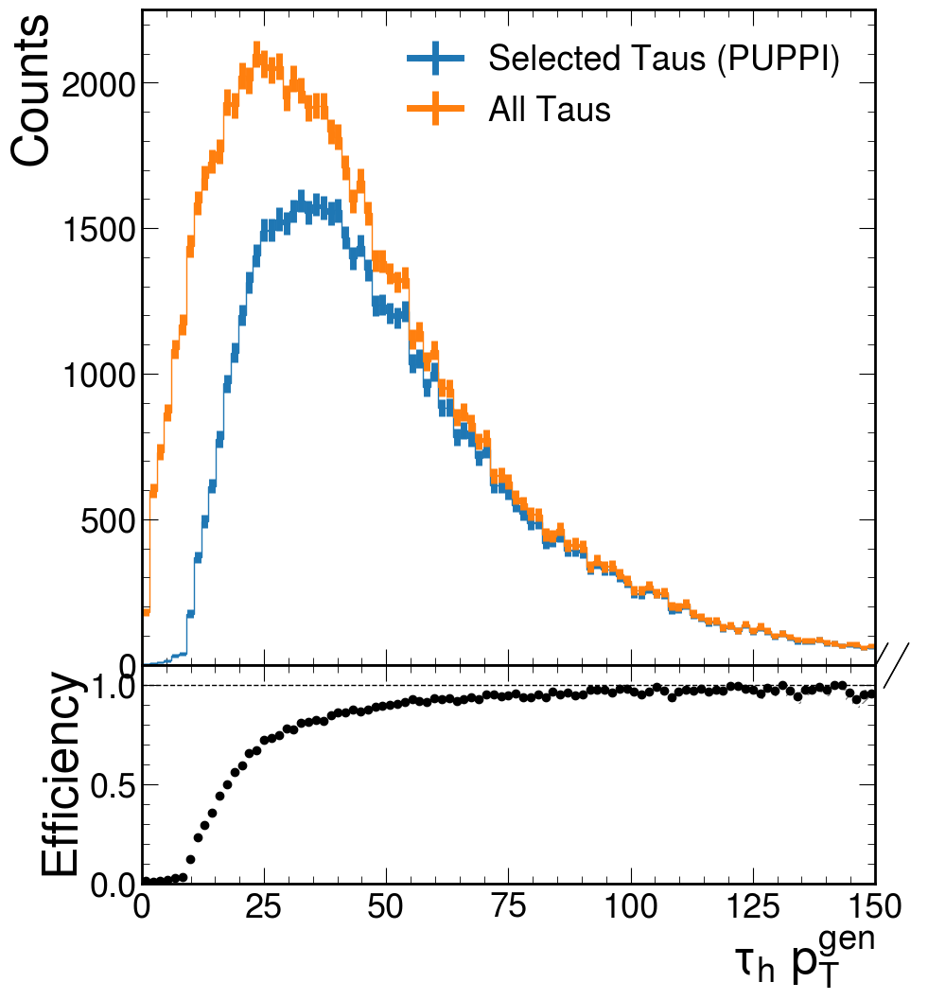

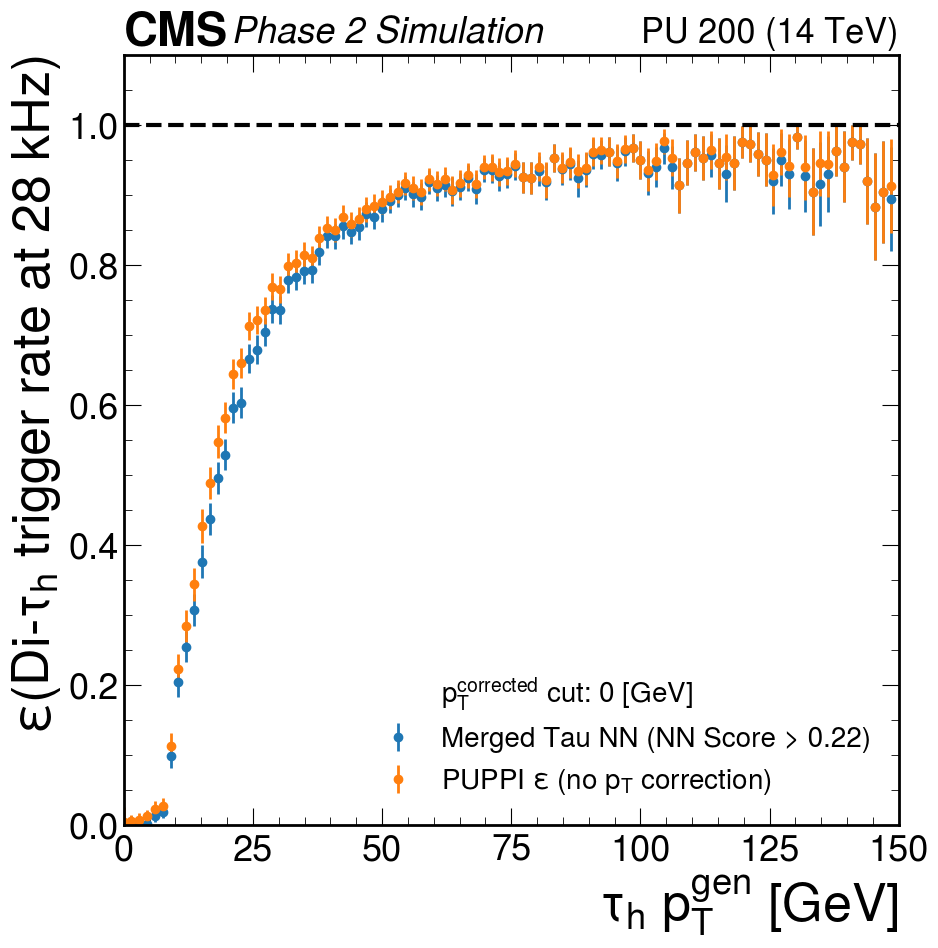

1850/1850 [==============================] - 2s 1ms/step


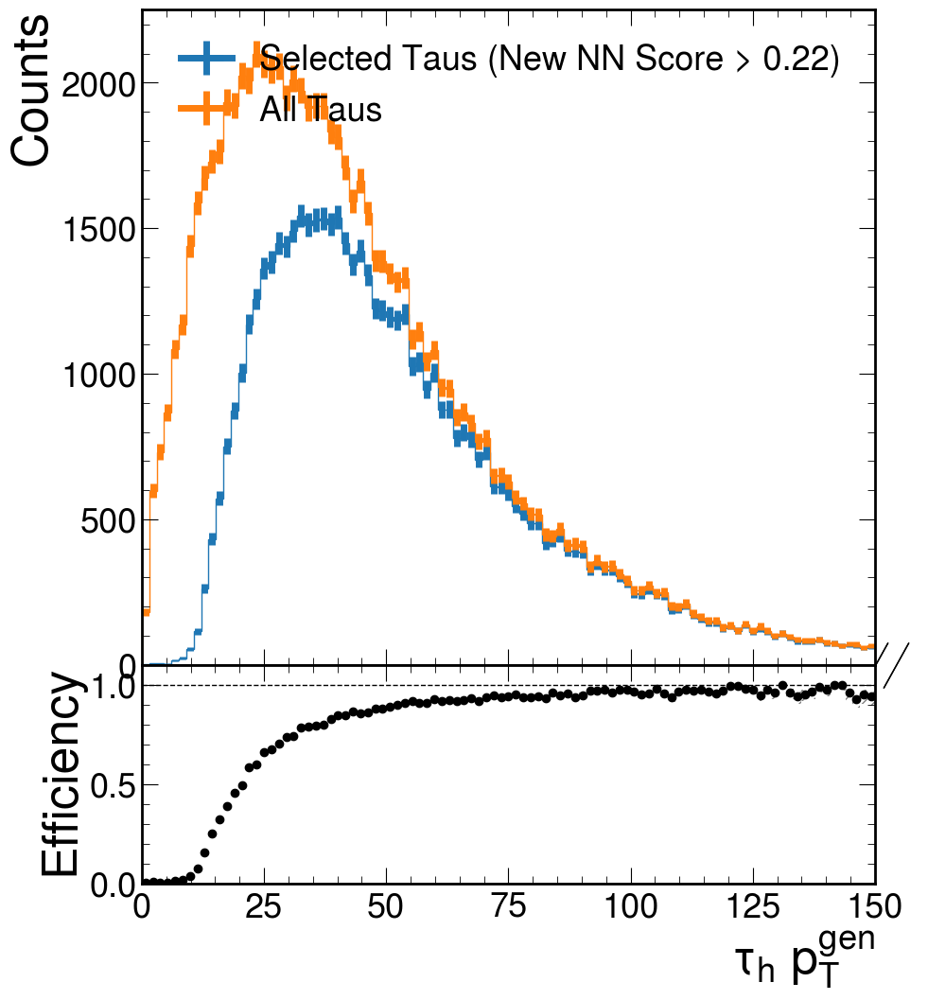

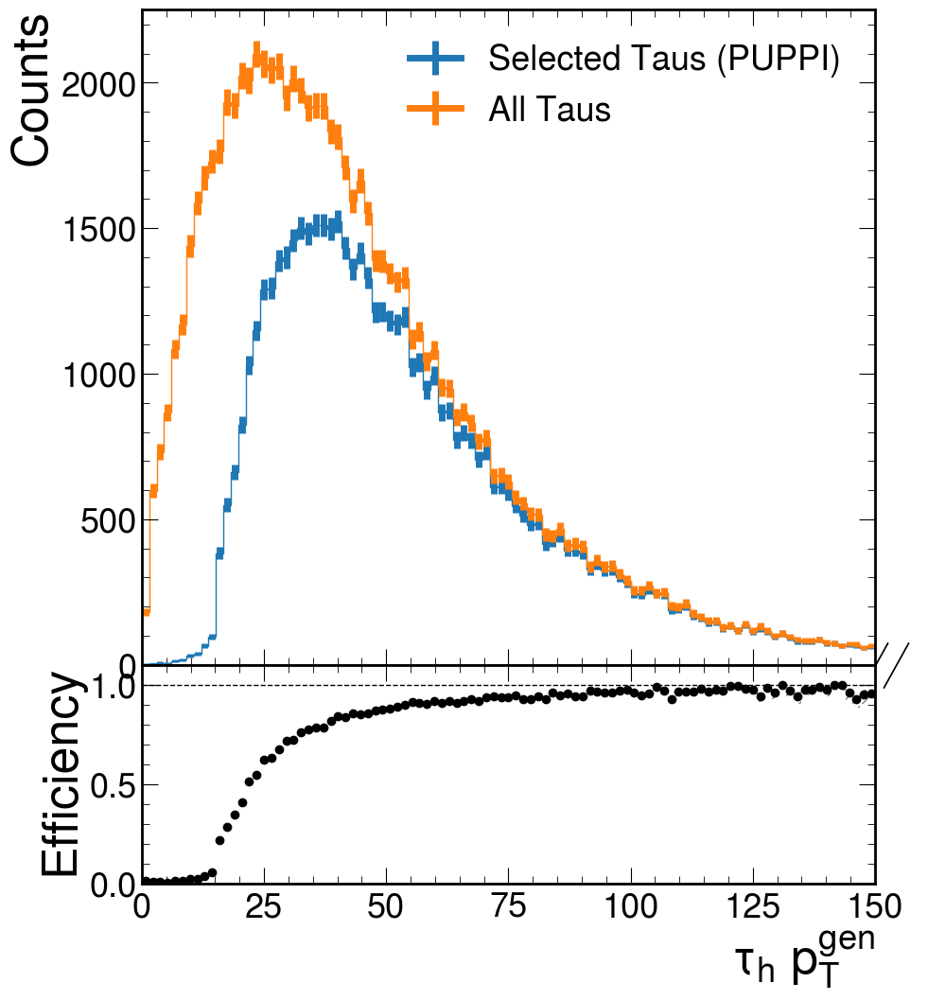

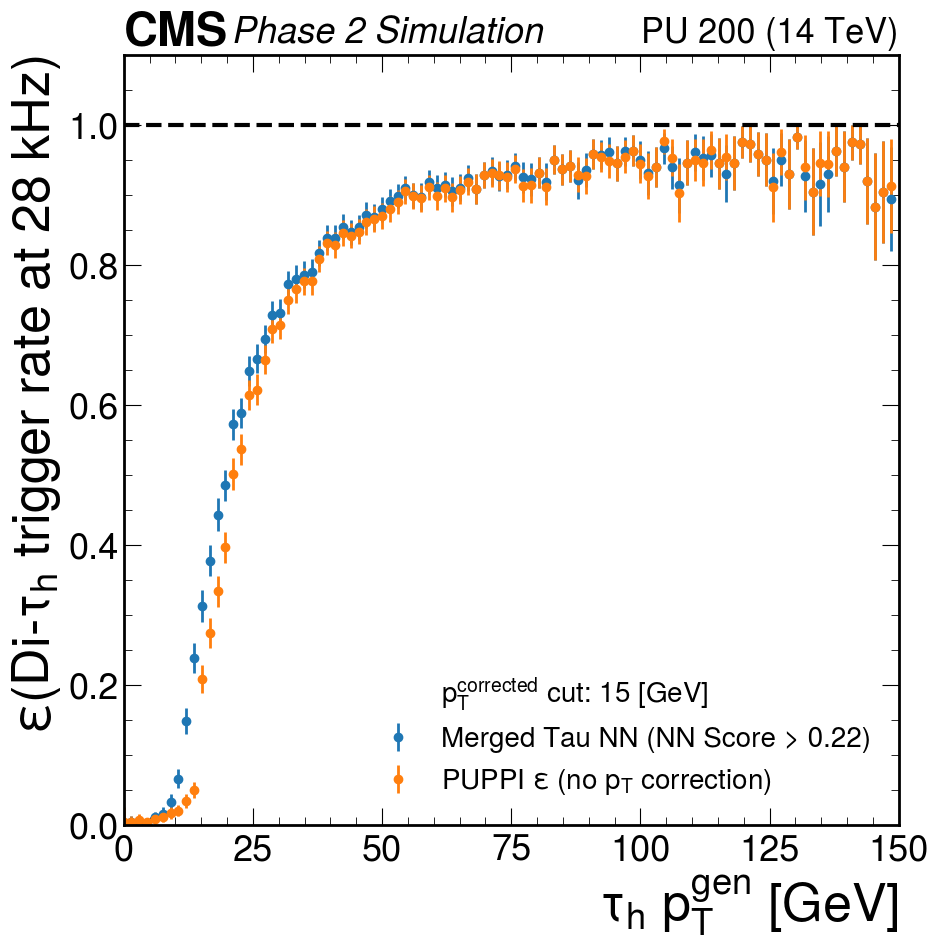

[1.         1.         1.         1.         0.86464333 0.83512987
 0.33125001 0.32344037 0.5815682  0.77834061 0.83092693 0.86428088
 0.89495111 0.91680099 0.95969682 0.97539114 0.9743411  0.98110626
 0.98604294 0.9880028  0.99316166 0.99272609 0.9966082  0.99330752
 0.99532356 0.99795813 0.99731852 0.99786356 0.99849299 0.9992725
 0.99922536 0.9991489  0.99914435 1.         1.         0.99826413
 1.         0.99798135 1.         1.         1.         1.
 1.         0.9986709  1.         1.         0.99268801 0.99823072
 1.         0.99816528 1.         1.         0.99775826 0.99774888
 1.         0.99736109 1.         0.99714754 0.99717836 1.
 1.         1.         1.         1.         1.         0.99579297
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.        

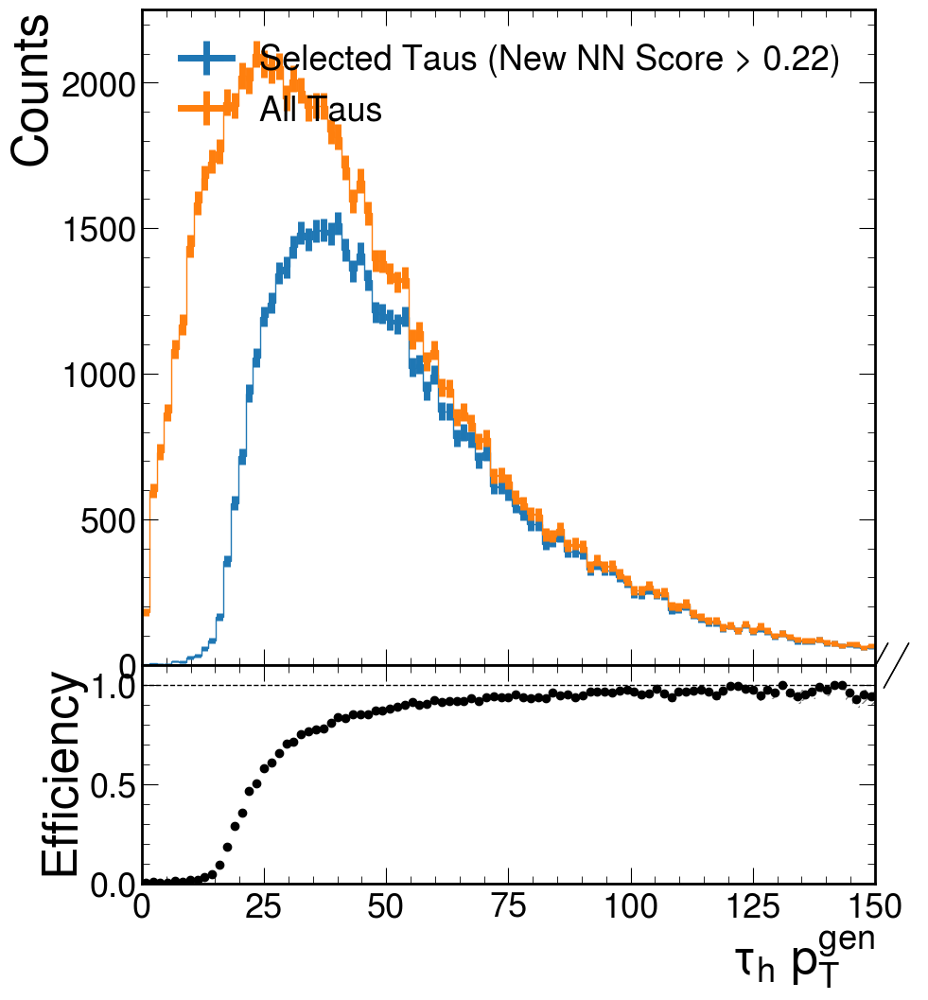

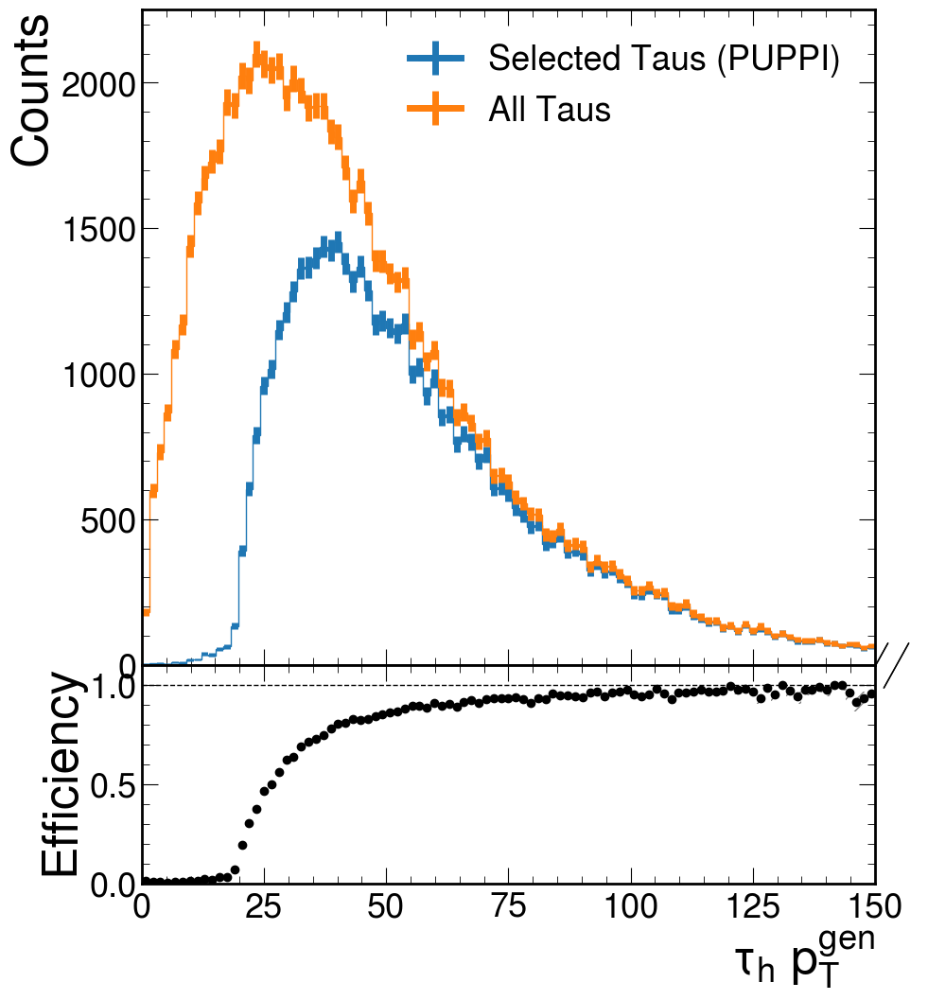

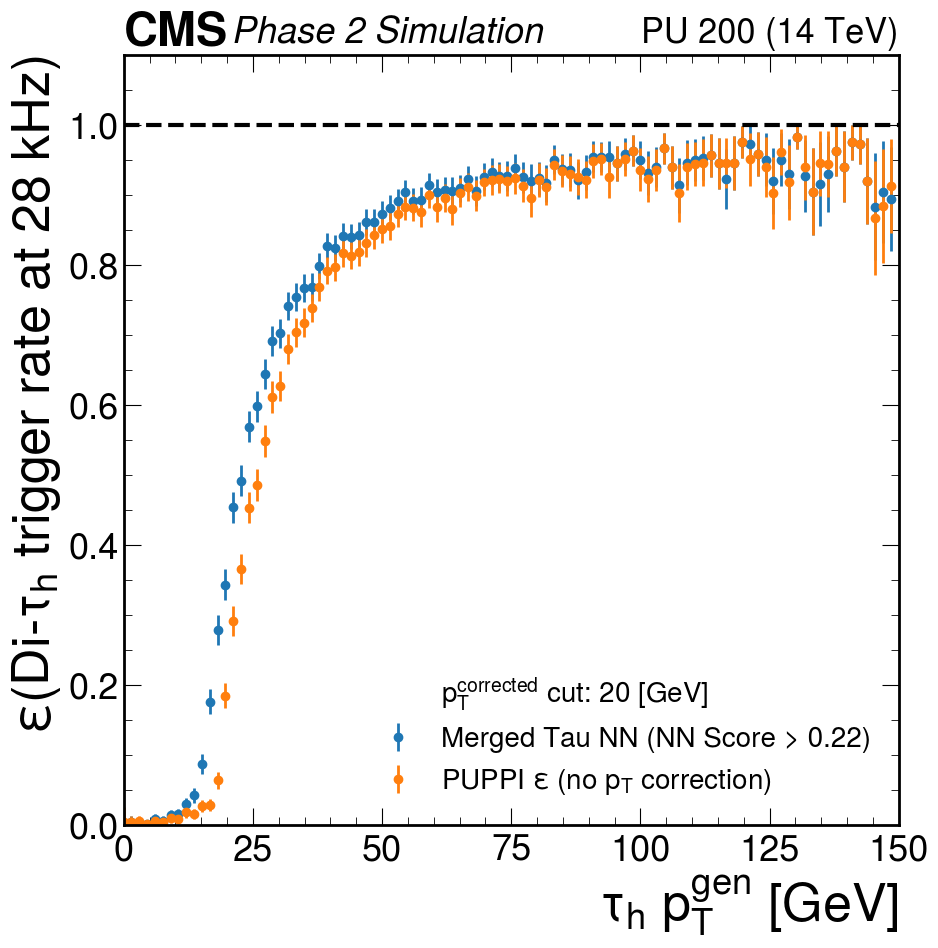

[1.         1.         0.65544255 0.51784426 0.66435908 0.31530988
 0.13568632 0.07601745 0.11451319 0.1379061  0.23025094 0.40271136
 0.56265673 0.64870698 0.76050775 0.81543745 0.85366721 0.88030742
 0.91428316 0.93796912 0.95490689 0.95310426 0.96340603 0.96923862
 0.96862868 0.9755199  0.98325246 0.98078869 0.98268596 0.99200079
 0.9860677  0.98809492 0.99059393 0.99213862 0.98939885 0.99046112
 0.99384193 0.98890984 0.99443474 0.99472179 0.99395678 0.99153863
 1.         0.99734242 0.99861972 0.99697567 0.98977124 0.99646346
 1.         0.99633251 0.99799286 1.         0.99551935 0.98877797
 0.9973765  0.99736109 1.         0.99146597 0.99717836 0.99711573
 0.99647239 0.99669413 0.99292491 1.         0.99614171 0.99579297
 1.         1.         1.         1.         1.         1.
 1.         0.988306   1.         1.         1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.     

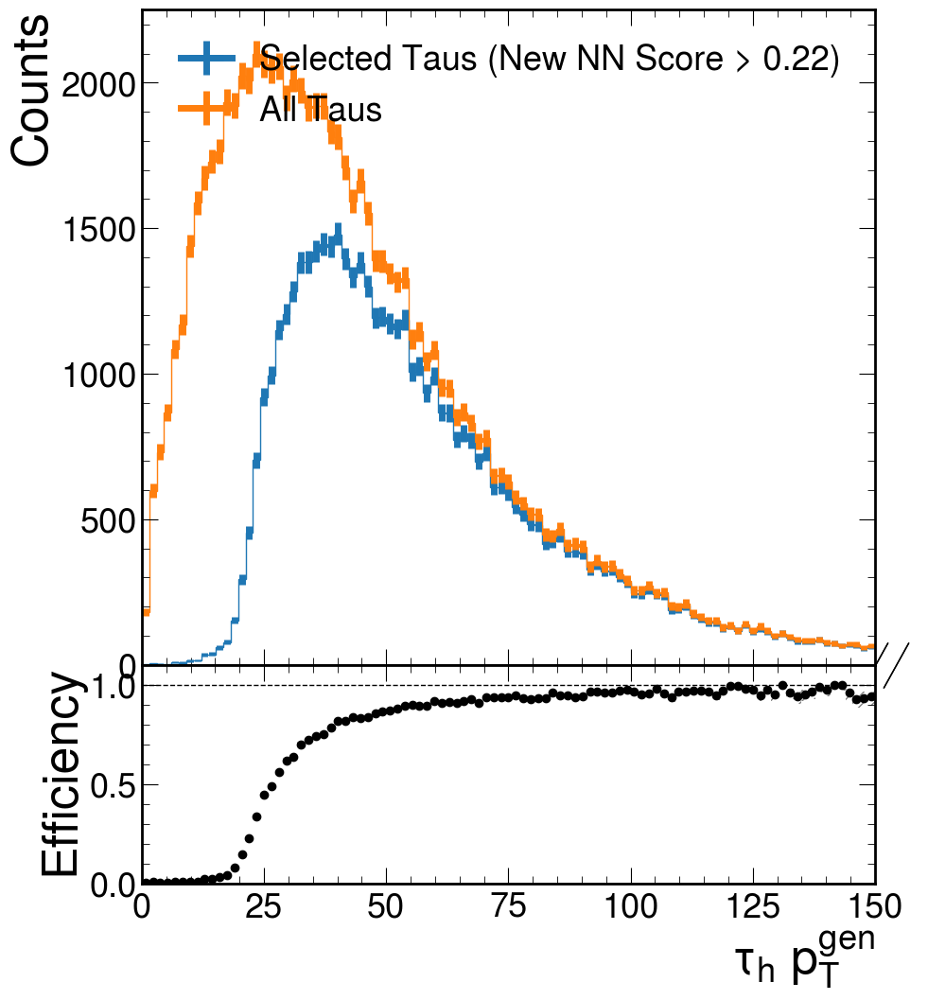

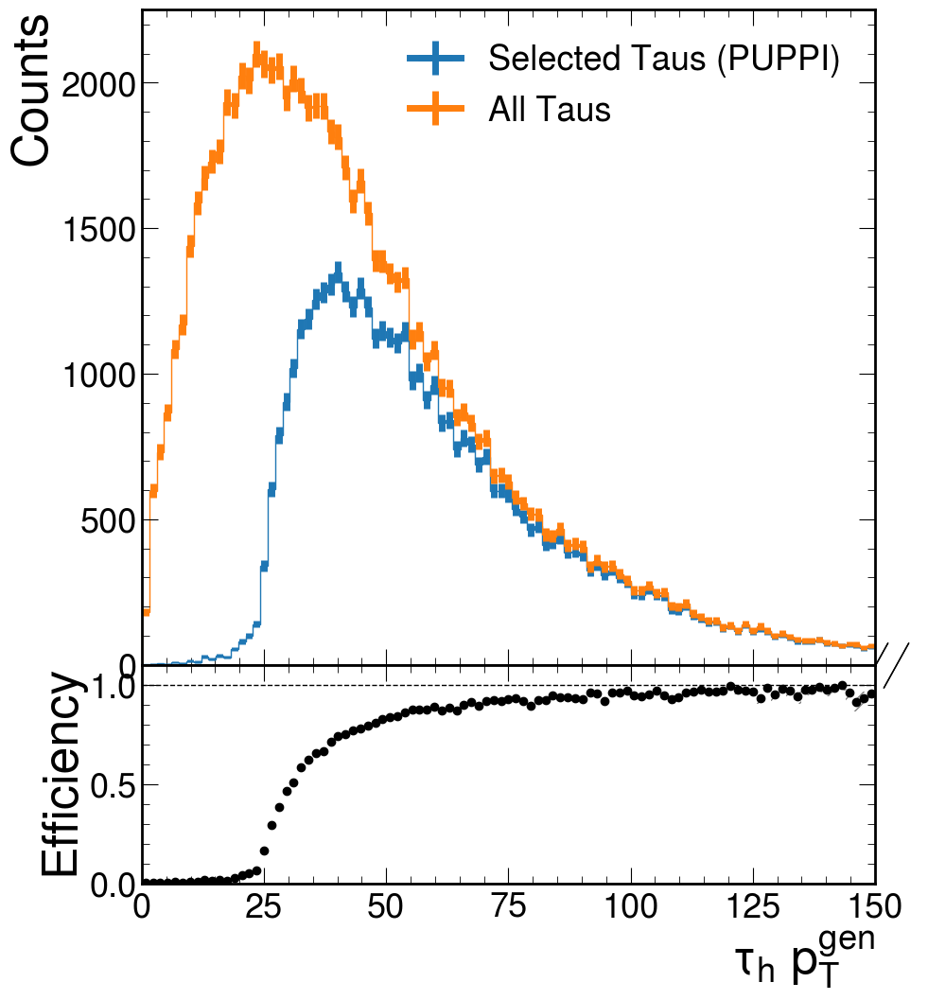

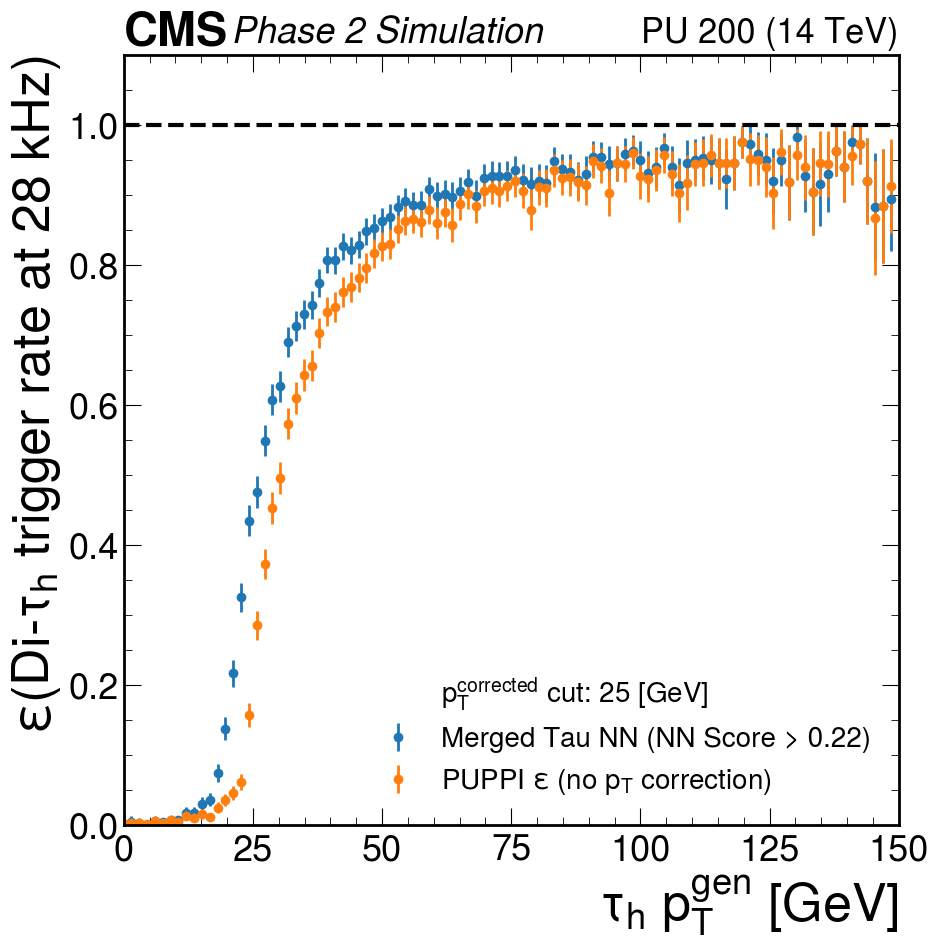

[1.         1.         0.65544255 0.12628835 0.40474483 0.20212281
 0.07303072 0.03456639 0.06864868 0.05670377 0.07898038 0.08217242
 0.1484023  0.25981684 0.36306973 0.53834409 0.65206532 0.70054023
 0.77960977 0.82419397 0.85137879 0.8865905  0.9100053  0.9218695
 0.93665195 0.94633849 0.95851335 0.95948343 0.96615611 0.96876843
 0.96984132 0.97197077 0.98205407 0.98080123 0.9744161  0.98094146
 0.97951262 0.9828727  0.98665587 0.98839993 0.98792456 0.98550882
 0.9918307  0.99336056 0.99310688 0.98942833 0.98831444 0.99117308
 1.         0.99633251 0.99398774 0.99581393 0.99104959 0.98431071
 0.9973765  0.99473067 1.         0.98863584 0.99717836 0.99423811
 0.99647239 0.99669413 0.98246106 1.         0.99614171 0.99579297
 1.         1.         1.         1.         1.         1.
 1.         0.988306   1.         0.99228906 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 1.         1.         1.         1.
 1.         1.      

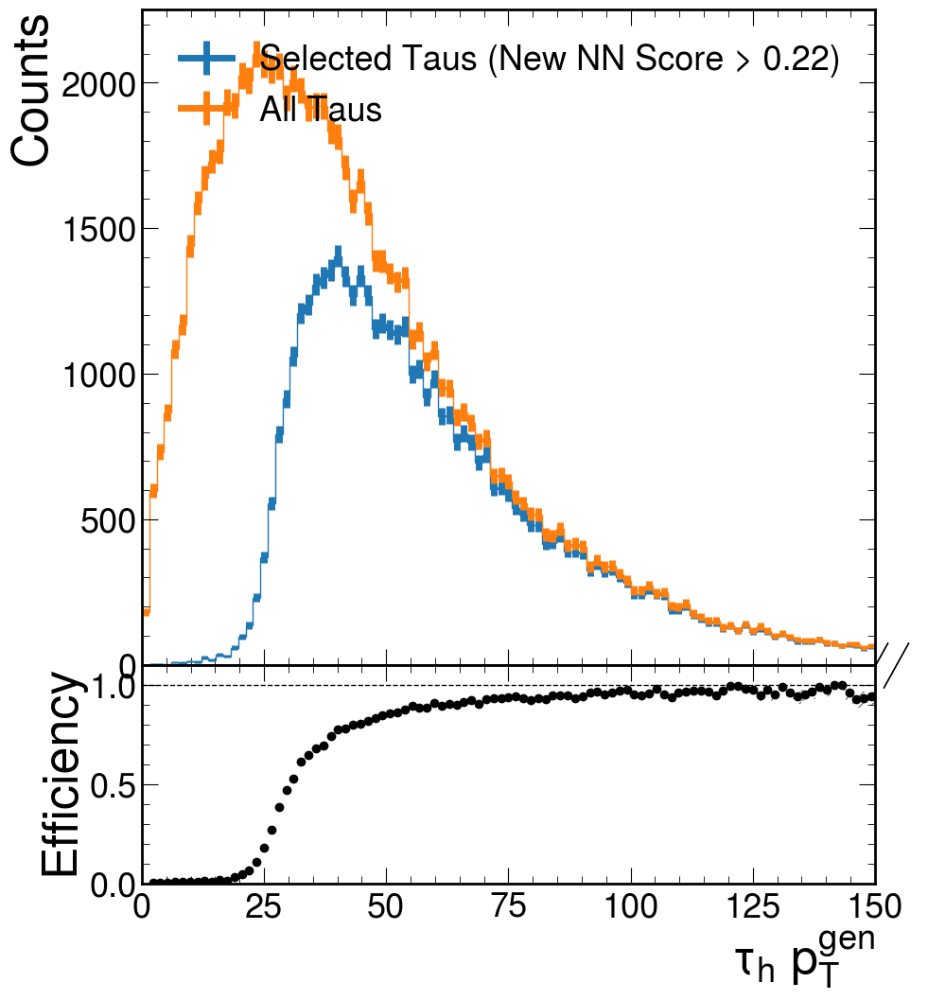

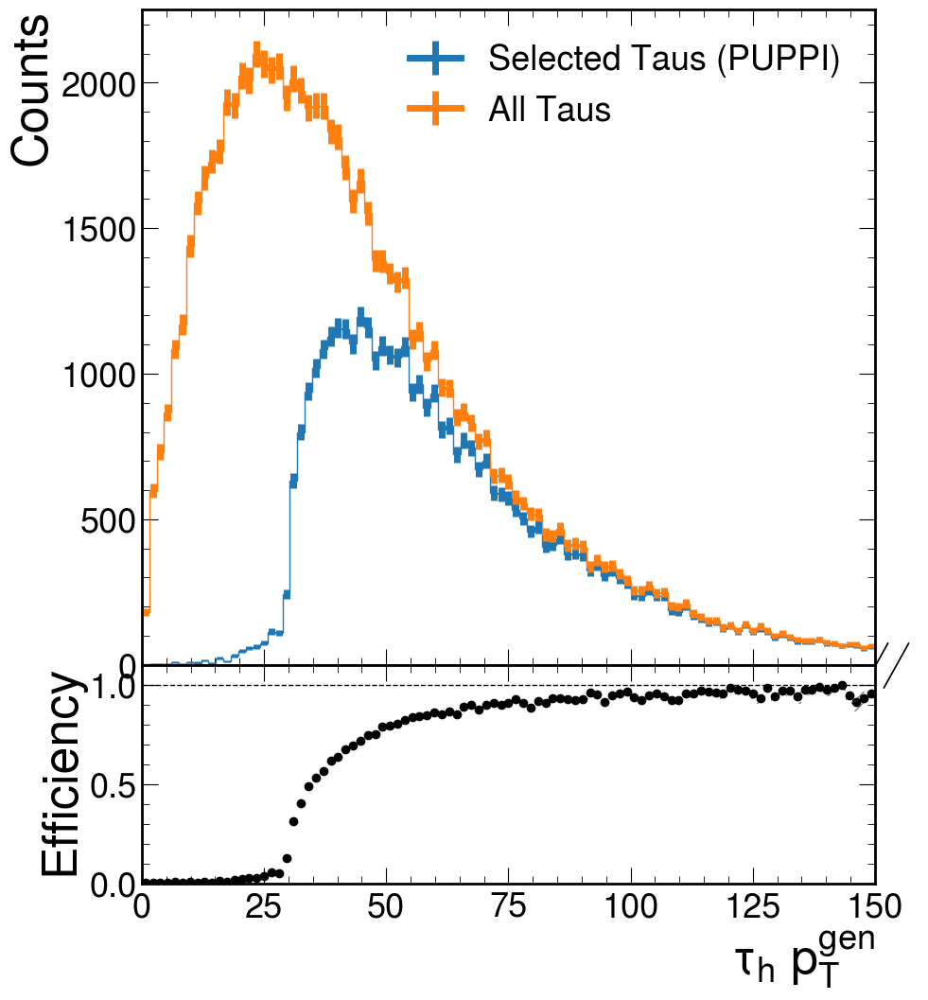

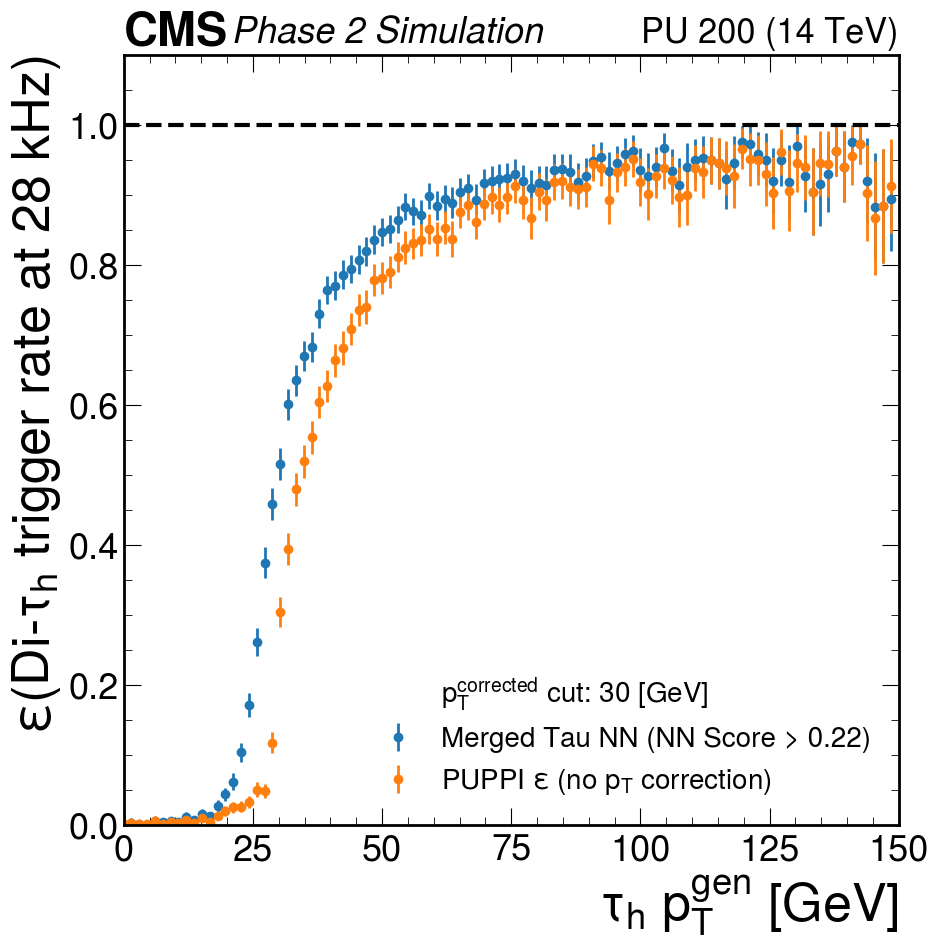

[0.         0.65541447 0.3394046  0.12628835 0.40474483 0.20212281
 0.06084221 0.0213196  0.04510846 0.02272666 0.04257891 0.02805838
 0.05410373 0.08164264 0.10349301 0.1711863  0.25646908 0.38463831
 0.53190431 0.62166848 0.70086678 0.77179928 0.81099799 0.84671482
 0.86026015 0.89219363 0.90851374 0.91627636 0.91896452 0.93762874
 0.94516691 0.93981969 0.96244875 0.9625272  0.95595806 0.96109078
 0.97032675 0.97282784 0.97113748 0.97788964 0.97228652 0.97708479
 0.98232422 0.99203443 0.98486048 0.98340336 0.97959427 0.98239002
 0.99646513 0.99267257 0.98800098 0.99372445 0.98436364 0.9820812
 0.9947568  0.98168582 1.         0.98863584 0.99436167 0.99136673
 0.98947621 0.99669413 0.97213102 1.         0.99614171 0.99579297
 0.98592203 0.99529509 1.         1.         0.99519305 1.
 0.99378425 0.988306   1.         0.99228906 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 0.98631808 1.         1.         1.
 1.         1.      

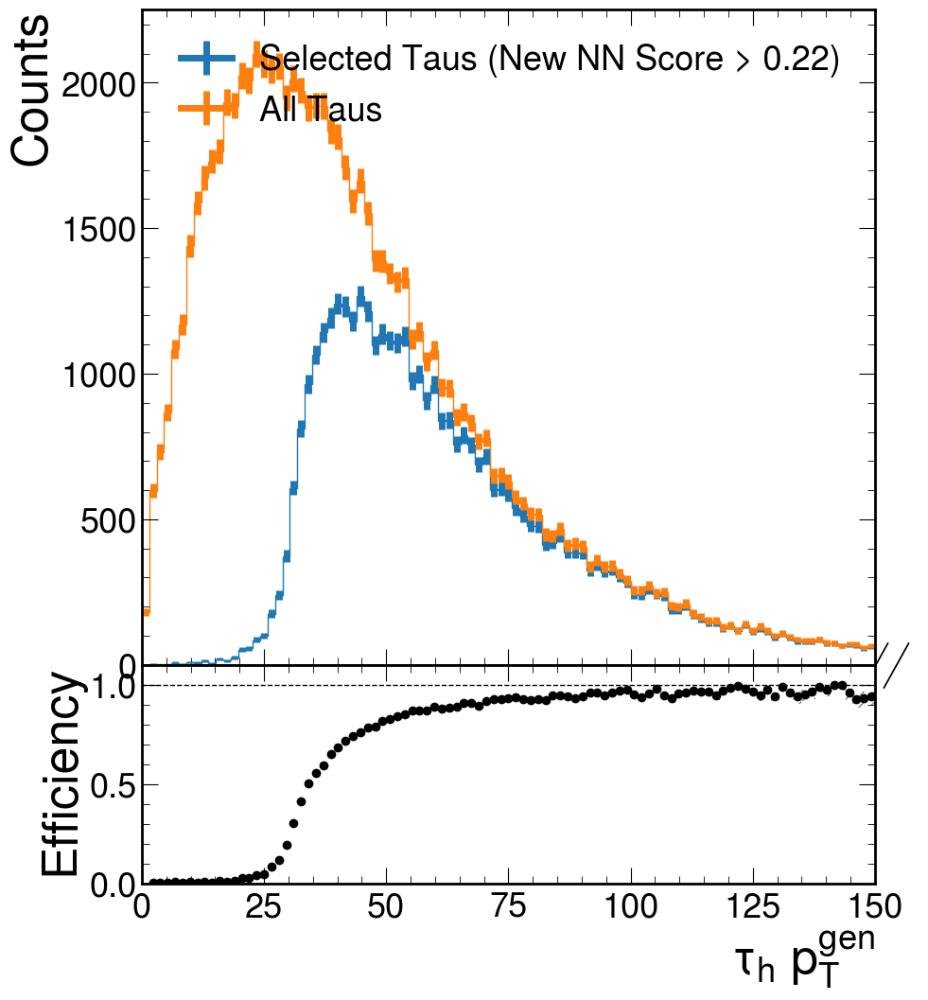

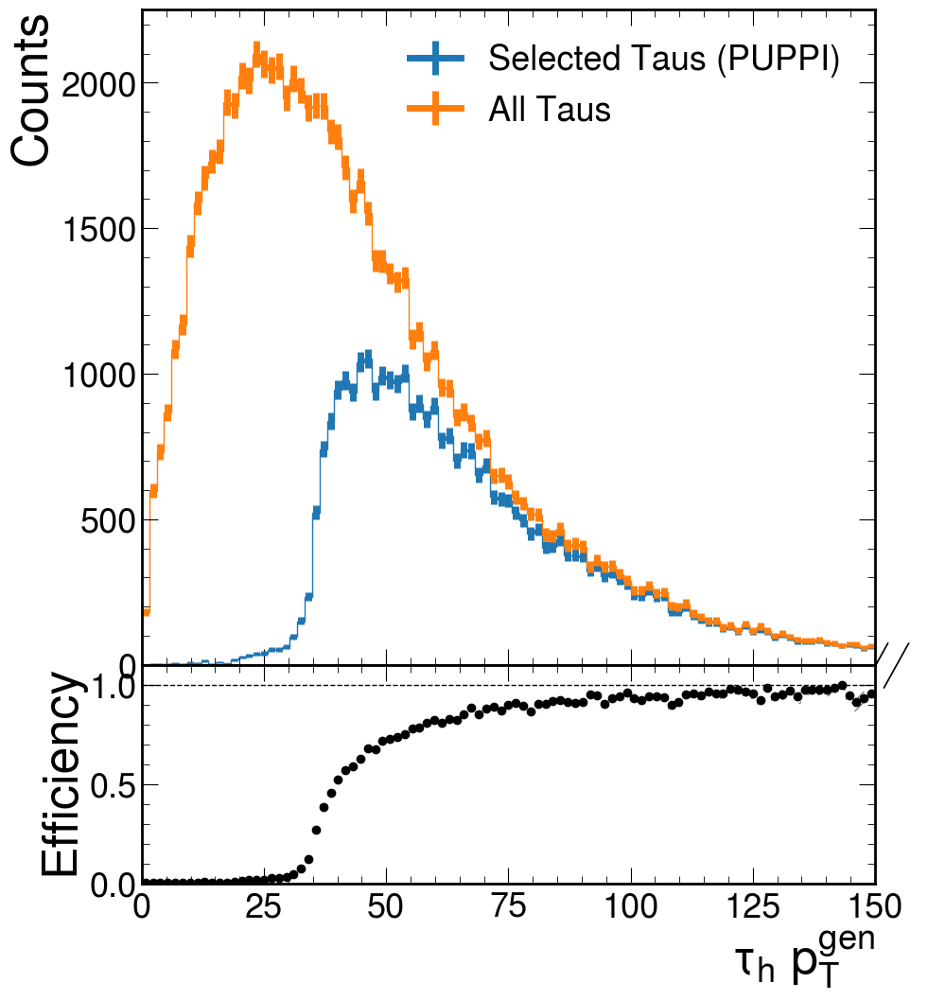

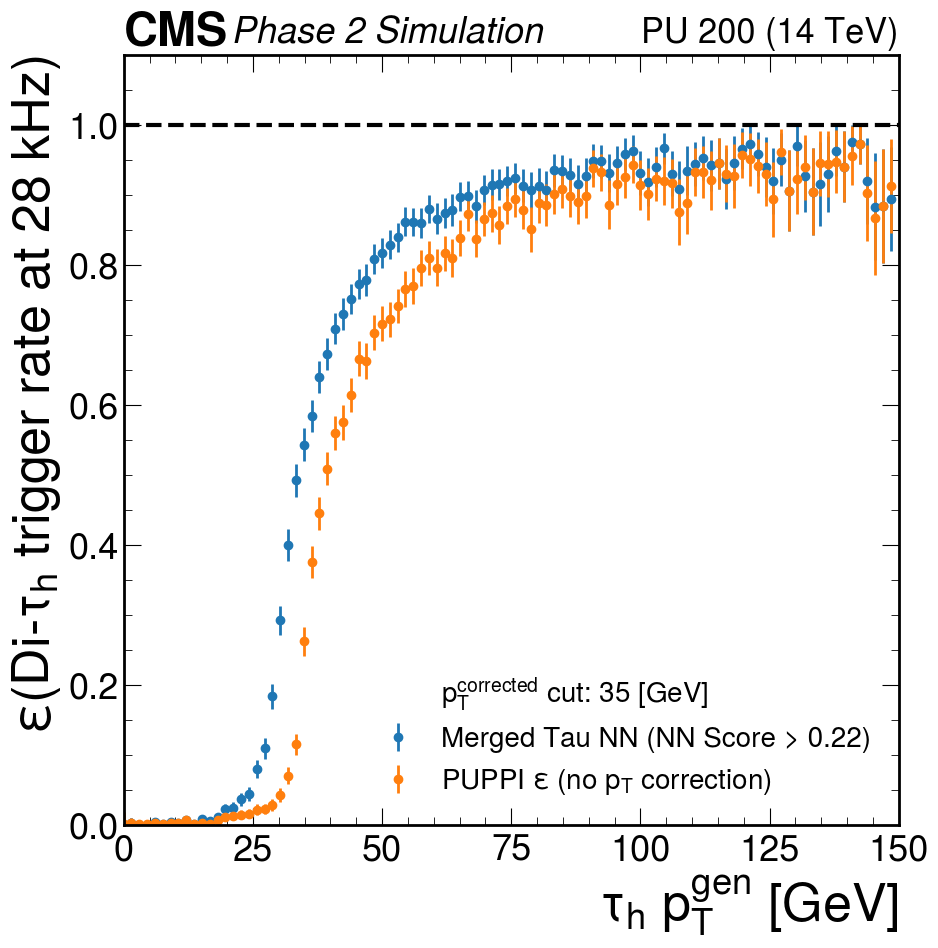

[0.         0.65541447 0.08276753 0.12628835 0.34181079 0.06252059
 0.04291717 0.01366731 0.02428022 0.00535758 0.02349484 0.01222083
 0.0210968  0.0419434  0.0406667  0.06003419 0.06565575 0.11696769
 0.15507648 0.24854853 0.396772   0.51317589 0.62881835 0.68656312
 0.73593134 0.7816813  0.79971918 0.84290066 0.85333496 0.88709797
 0.90441759 0.89263256 0.93100256 0.92956768 0.93054575 0.9327163
 0.9469291  0.95579534 0.95787298 0.95799692 0.95192183 0.95550492
 0.97013587 0.98408906 0.97253591 0.97288465 0.96946052 0.97713843
 0.98765498 0.98901968 0.98203665 0.98746926 0.98213964 0.97762993
 0.98691901 0.98168582 0.9975033  0.98299471 0.99154969 0.99136673
 0.98947621 0.99013175 0.96871157 1.         0.99614171 0.99579297
 0.98128303 0.98594472 1.         1.         0.99041157 0.99396722
 0.98762457 0.98255824 1.         0.98470307 1.         0.99184219
 1.         0.98997051 1.         1.         0.98901063 1.
 1.         0.97458786 0.98631808 1.         1.         1.
 1.         

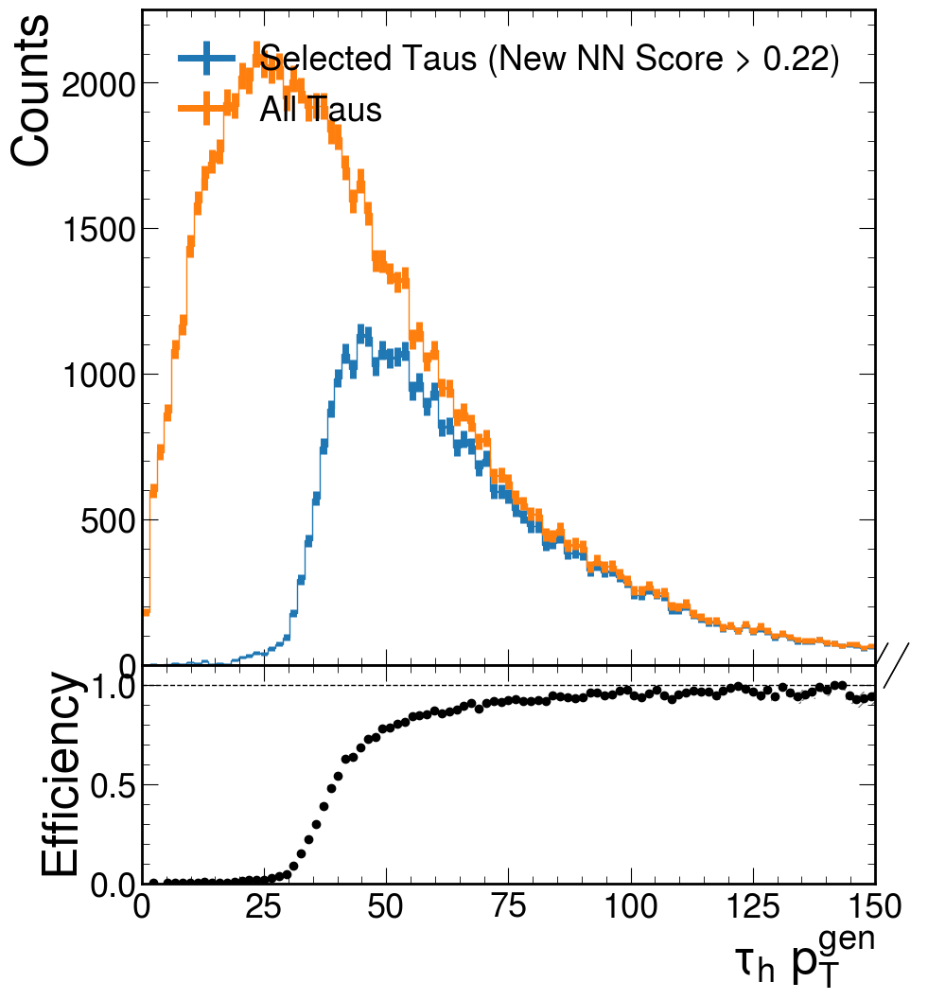

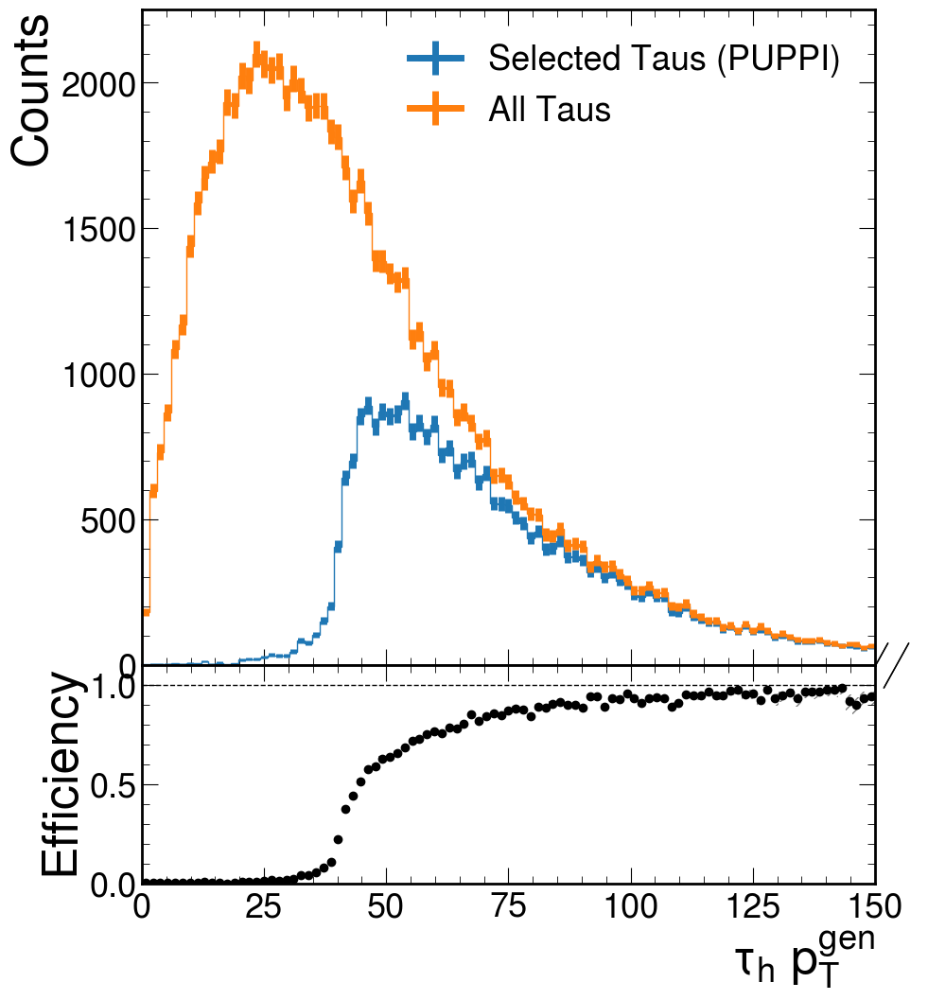

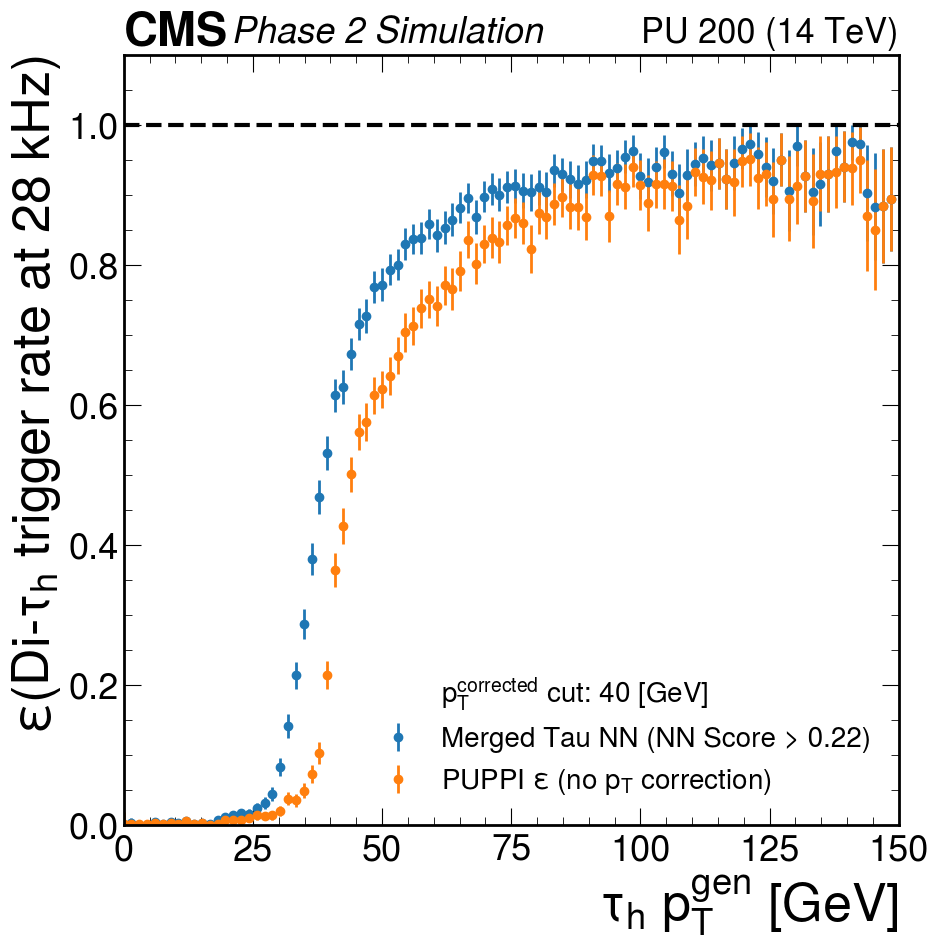

[0.         0.65541447 0.         0.12628835 0.28001692 0.06252059
 0.03706942 0.01119681 0.02224761 0.00257869 0.00546098 0.00162086
 0.01267789 0.01958343 0.02208528 0.02667386 0.02321771 0.0350417
 0.04334247 0.05893175 0.11163551 0.18113272 0.27284476 0.36325665
 0.47855534 0.57219703 0.63166748 0.72987714 0.73096872 0.79367992
 0.8377887  0.83306888 0.8844332  0.87775441 0.8903883  0.88906105
 0.91250747 0.92884011 0.93473053 0.93506635 0.92568429 0.93283247
 0.95528494 0.96693426 0.96843841 0.95641208 0.95936367 0.97015523
 0.97188023 0.9799155  0.97016586 0.97915727 0.97769815 0.97540798
 0.98431306 0.98168582 0.99252401 0.97737674 0.99154969 0.98564135
 0.98947621 0.99013175 0.96871157 0.99304257 0.99231251 0.99579297
 0.97666618 0.98594472 1.         0.99501831 0.99041157 0.98796136
 0.98151286 0.98255824 1.         0.98470307 1.         0.99184219
 1.         0.98997051 1.         1.         0.98901063 1.
 1.         0.97458786 0.98631808 1.         1.         1.
 1.         

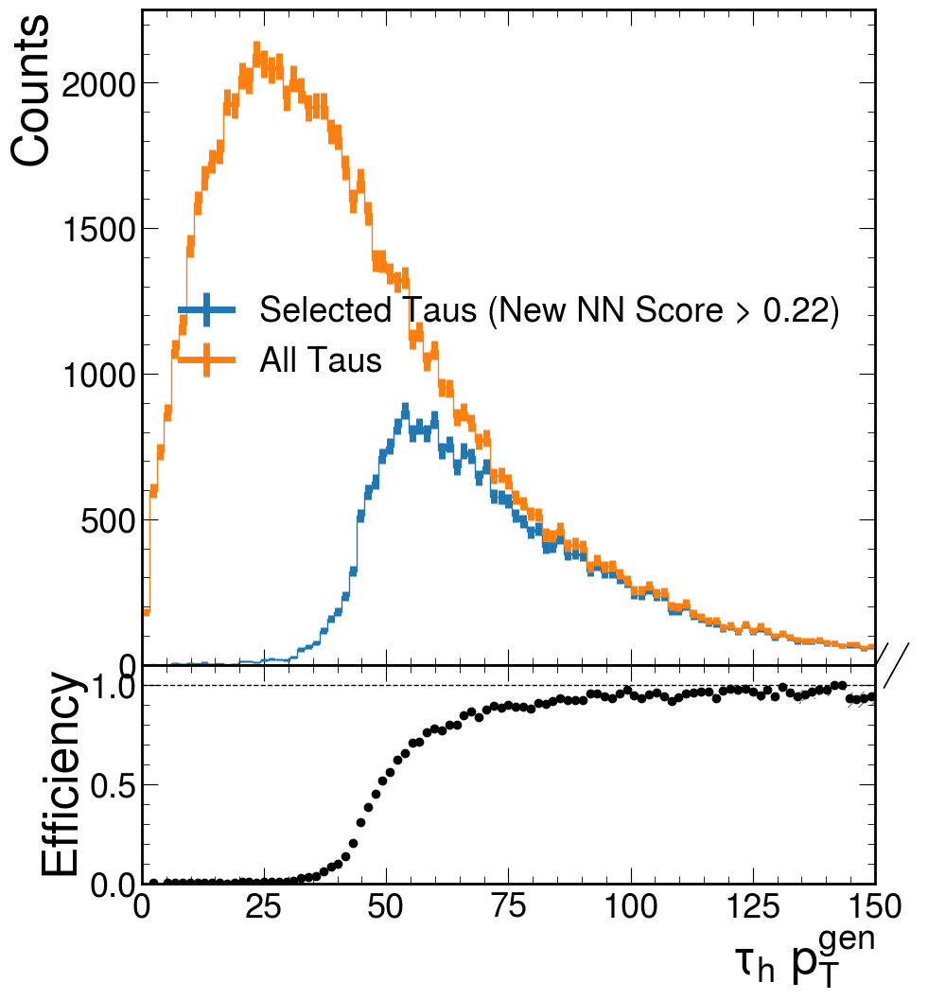

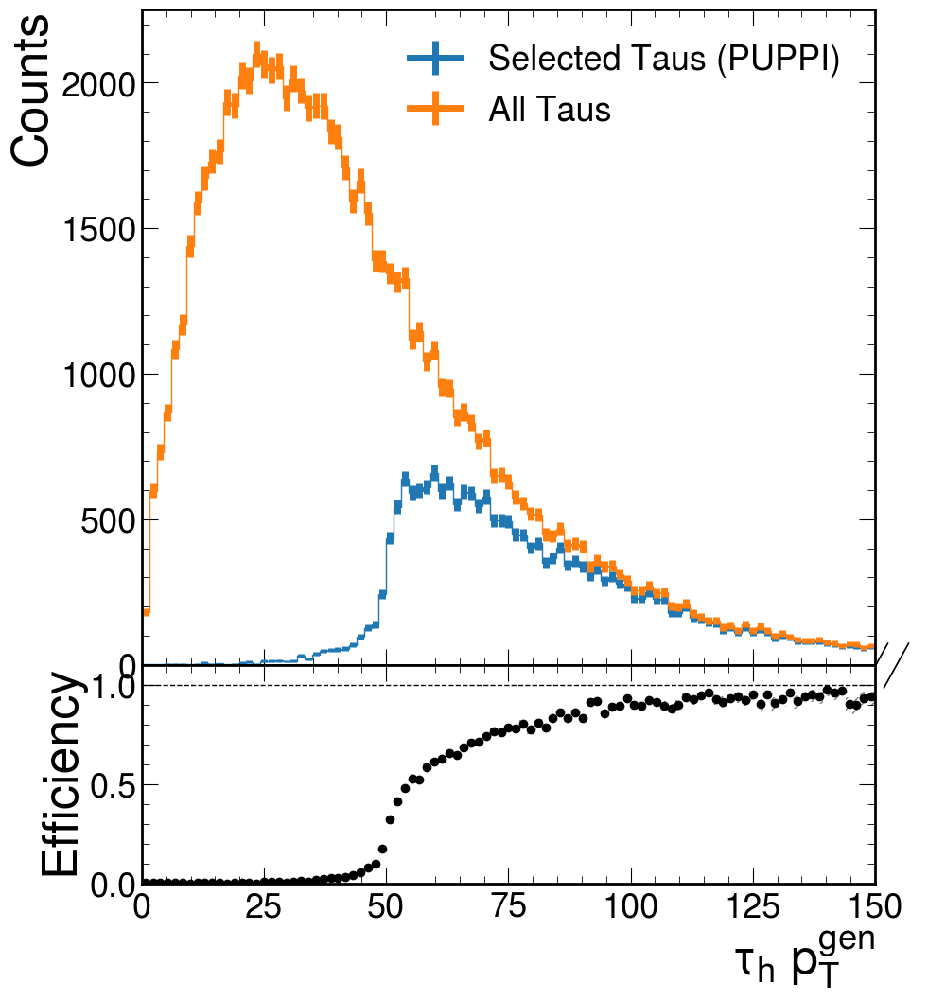

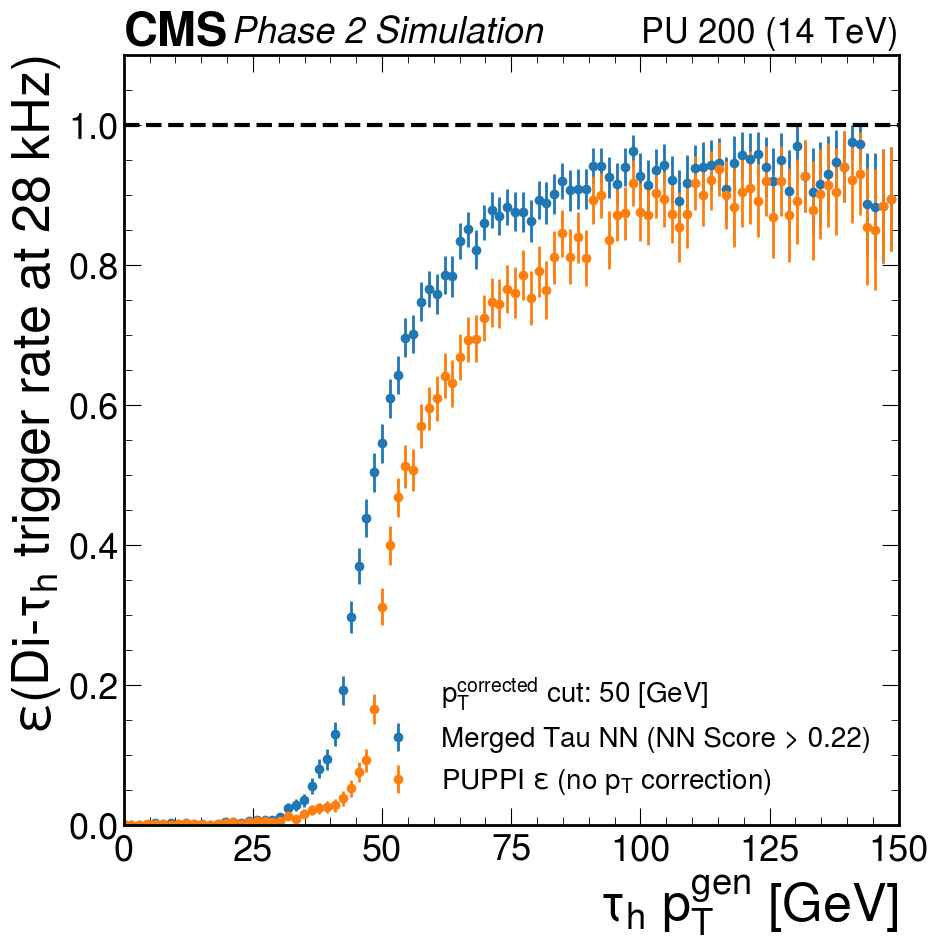

[0.00000000e+00 8.27538798e-02 0.00000000e+00 1.26288353e-01
 2.19679117e-01 6.25205856e-02 2.01211821e-02 6.44996586e-03
 1.04087867e-02 1.33549078e-03 3.14586500e-03 2.04748292e-04
 7.45050633e-04 8.02759365e-03 7.18507165e-03 4.13711663e-03
 8.77019520e-03 1.05894893e-02 9.54377658e-03 8.40357480e-03
 1.41616661e-02 2.98468039e-02 3.62247109e-02 4.37831201e-02
 6.99686983e-02 9.74064431e-02 1.10902449e-01 1.53609911e-01
 2.24599429e-01 3.50099653e-01 4.32953518e-01 5.02877089e-01
 5.79675238e-01 6.19730515e-01 6.83756009e-01 7.14343052e-01
 7.65177885e-01 7.78576969e-01 8.33038876e-01 8.33835281e-01
 8.33421272e-01 8.58221697e-01 8.65626483e-01 9.14546213e-01
 9.20942896e-01 9.04362173e-01 9.19262853e-01 9.38948665e-01
 9.38849534e-01 9.49202904e-01 9.31013756e-01 9.46168912e-01
 9.33669824e-01 9.55507314e-01 9.66152659e-01 9.45813128e-01
 9.82615611e-01 9.60639672e-01 9.83139923e-01 9.71416164e-01
 9.82545440e-01 9.83624803e-01 9.61903246e-01 9.69037368e-01
 9.77220082e-01 9.957929

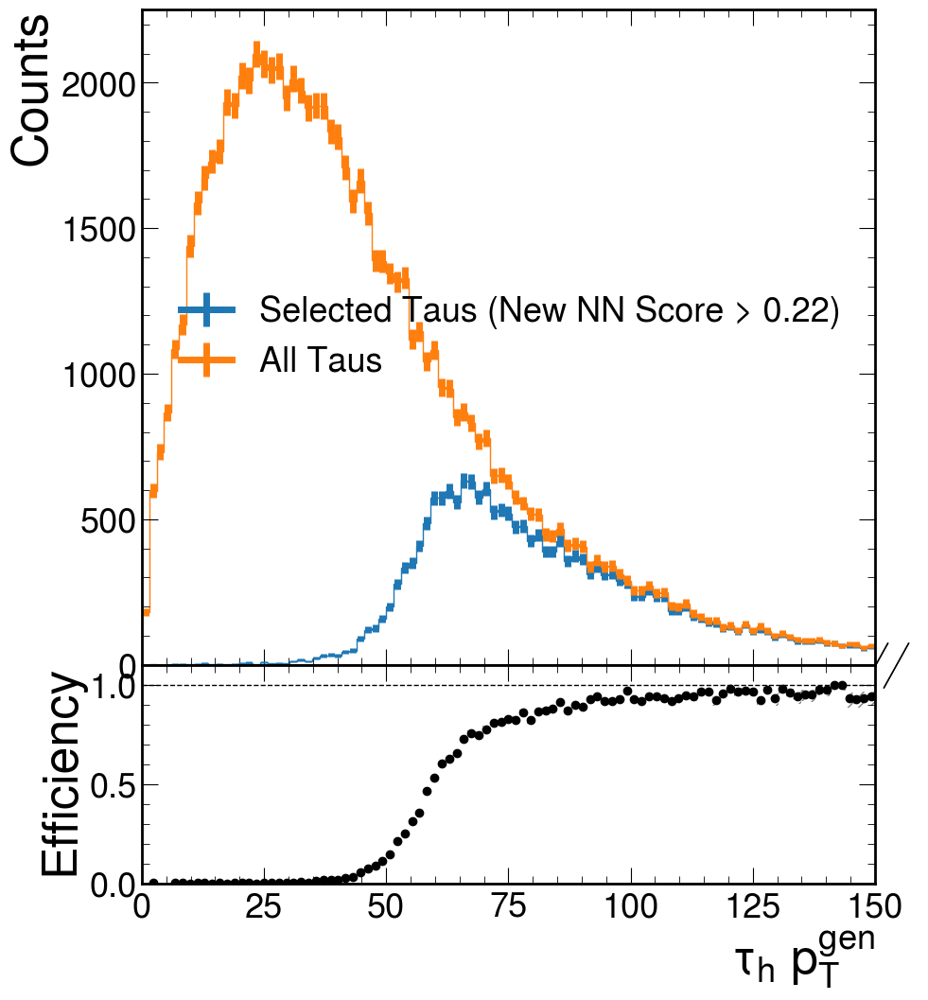

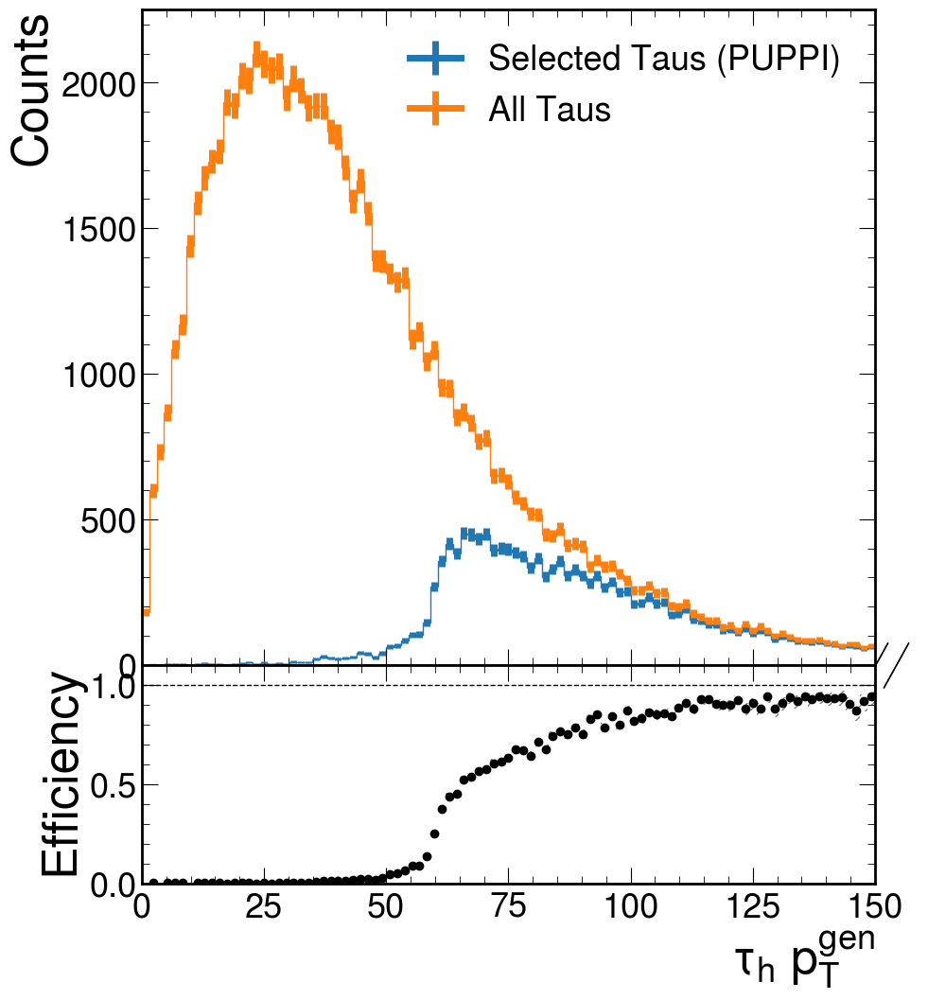

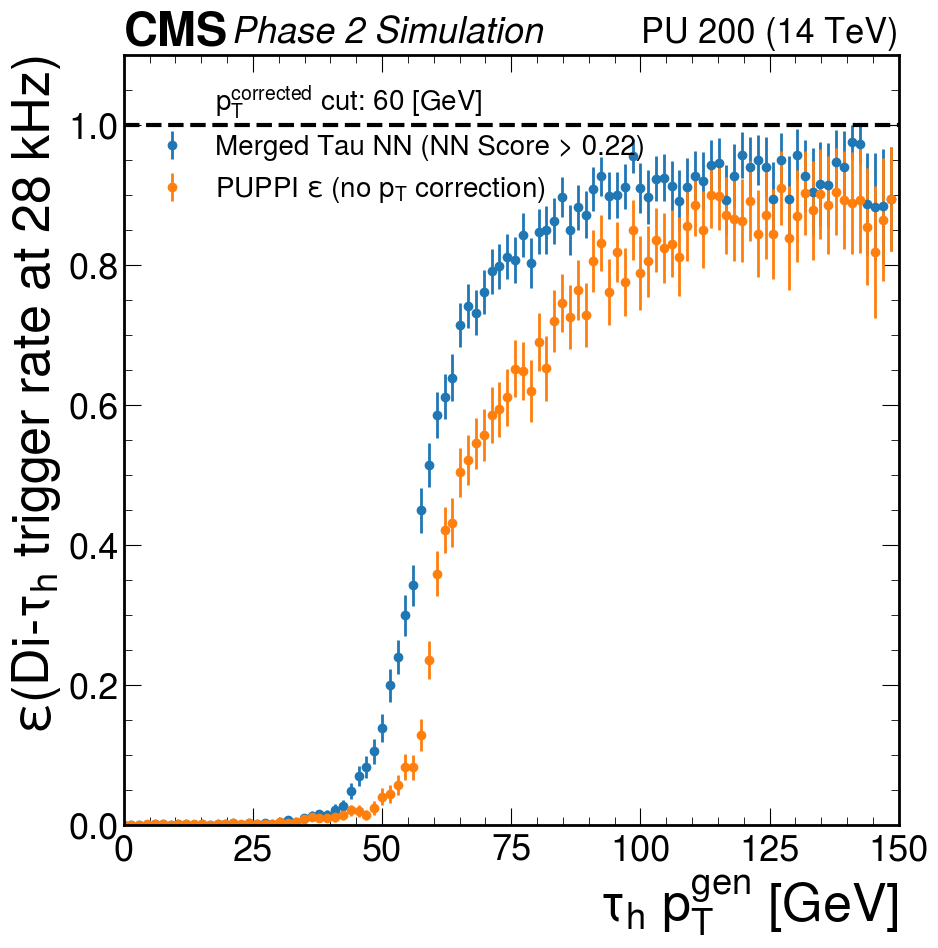

[0.00000000e+00 8.27538798e-02 0.00000000e+00 0.00000000e+00
 5.47515015e-02 3.23775706e-02 1.22324714e-03 2.18965383e-03
 6.69010617e-03 3.25734000e-04 2.06216787e-03 2.04748292e-04
 7.45050633e-04 2.65514979e-03 3.69735775e-03 1.36548992e-04
 3.80902228e-03 1.50363567e-03 2.50296955e-03 1.45469913e-03
 5.22991531e-03 8.42188080e-03 5.16807285e-03 1.20217353e-02
 1.61537941e-02 1.82377340e-02 1.67183983e-02 2.54306492e-02
 3.09253384e-02 5.73503295e-02 8.18811525e-02 9.43503839e-02
 1.20526026e-01 1.57290470e-01 2.23719015e-01 2.65944016e-01
 3.28635187e-01 3.79537414e-01 5.00631202e-01 5.60276070e-01
 6.43043757e-01 6.68847382e-01 7.05881967e-01 7.82646884e-01
 8.01804309e-01 8.05783736e-01 8.13284827e-01 8.45010483e-01
 8.61587887e-01 8.72606078e-01 8.57741343e-01 9.11459949e-01
 8.68537242e-01 9.07414413e-01 9.25064048e-01 9.05534003e-01
 9.58076934e-01 9.00291988e-01 9.55342419e-01 9.32086212e-01
 9.48555638e-01 9.67544577e-01 9.34992472e-01 9.52130907e-01
 9.47740600e-01 9.875030

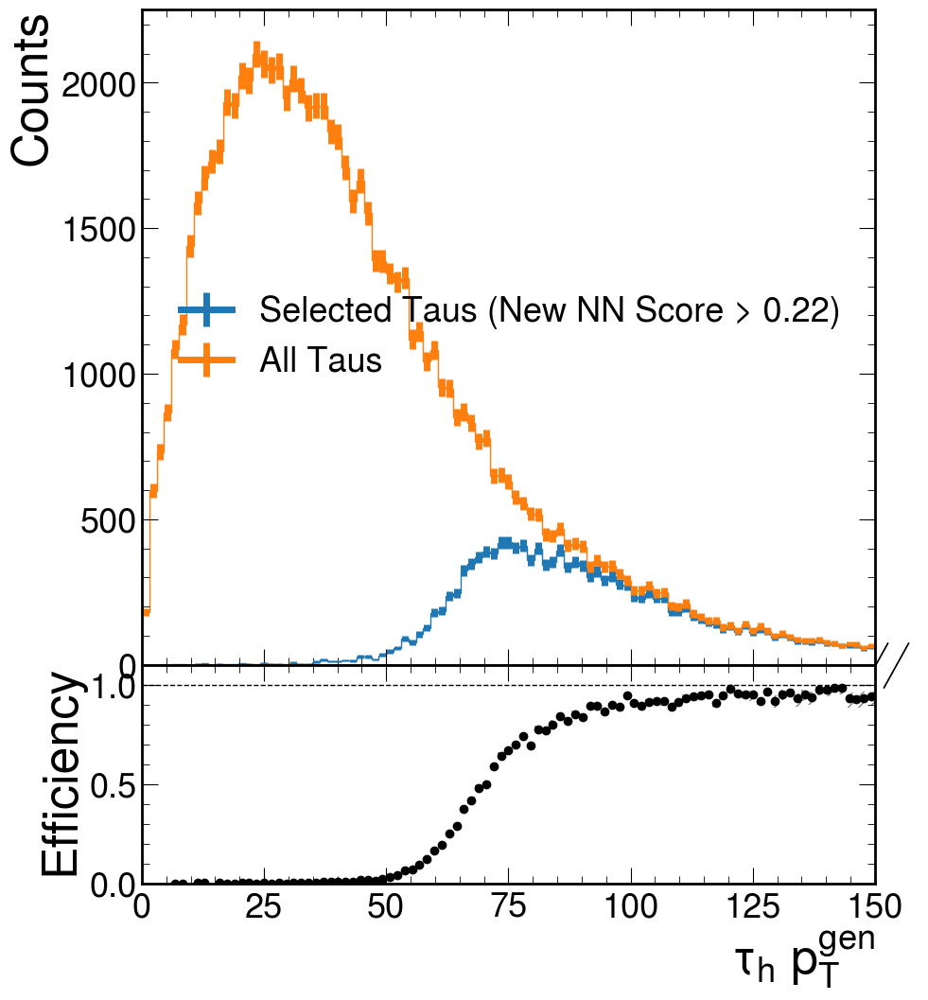

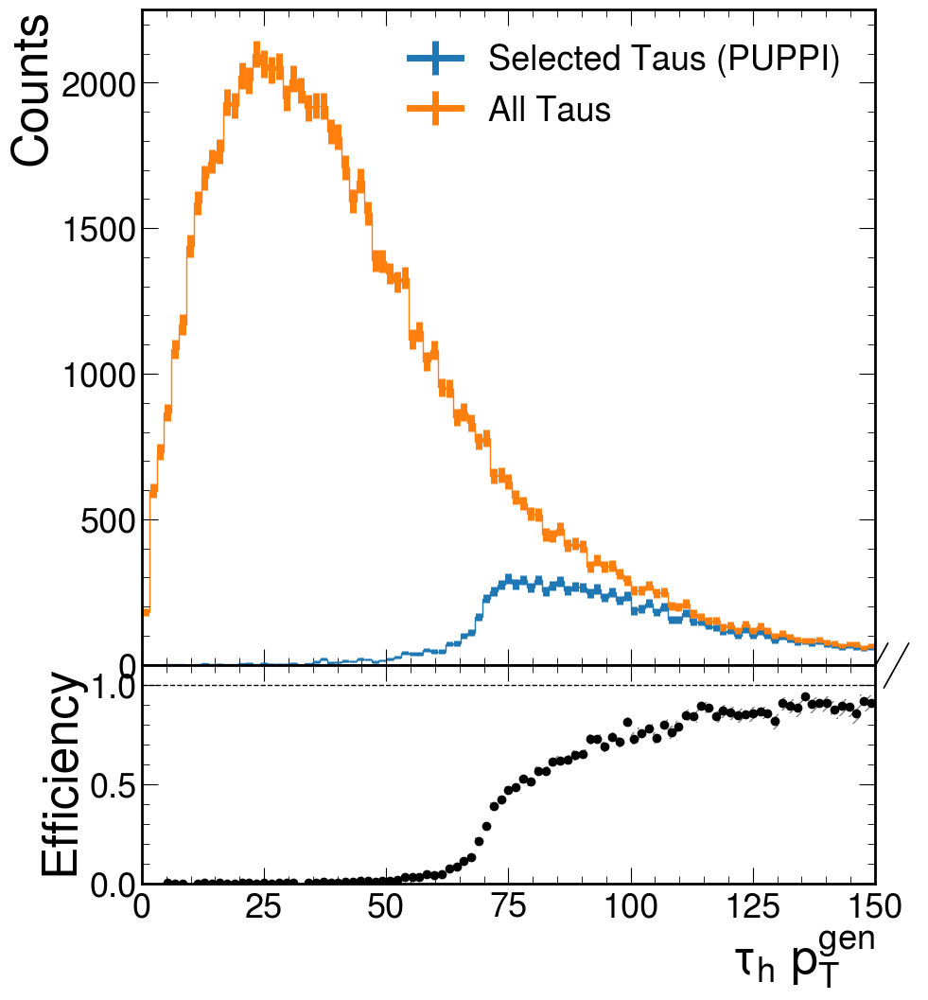

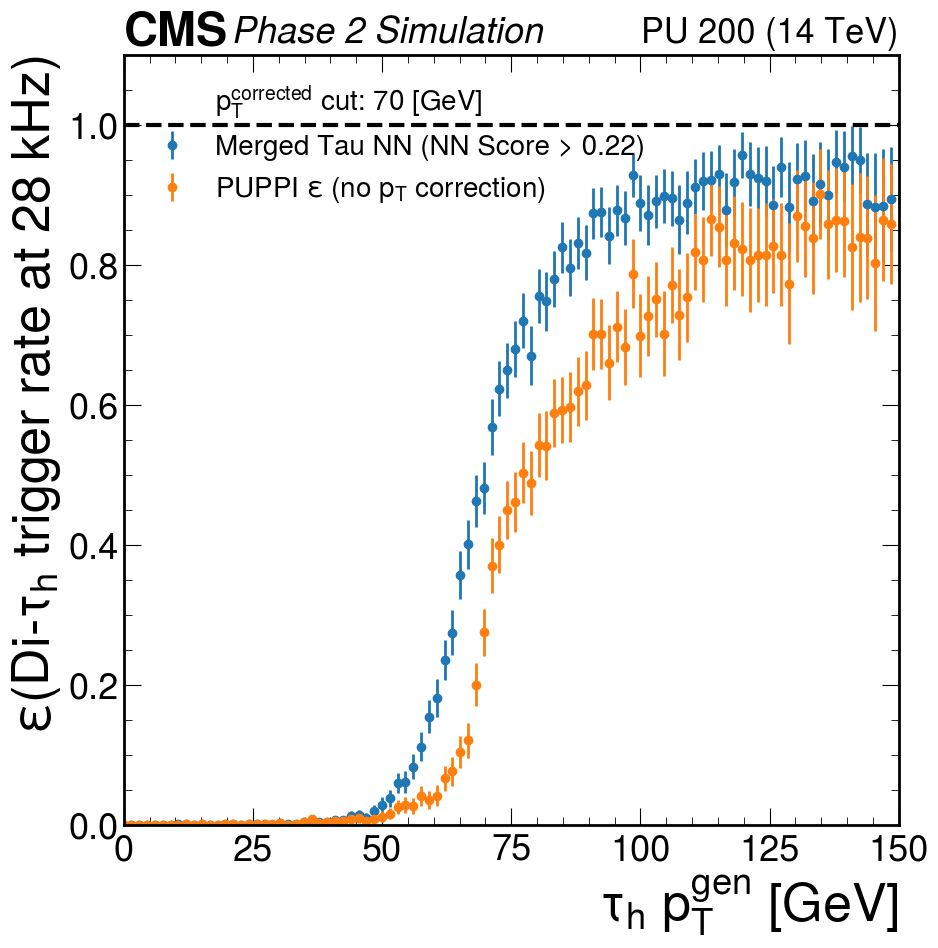

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.33531427e-02 7.89656862e-03 0.00000000e+00 2.18965383e-03
 4.91223580e-03 0.00000000e+00 1.06798878e-03 2.04748292e-04
 1.81724631e-04 1.94957874e-03 1.14386080e-03 1.36548992e-04
 2.06766045e-03 5.10481190e-04 9.45196411e-04 1.20458008e-04
 2.98724316e-03 8.90864973e-04 9.13224166e-04 4.54017858e-03
 8.49561611e-03 5.16638242e-03 5.07514207e-03 7.78347067e-03
 7.57440599e-03 1.55301121e-02 1.65074523e-02 1.14059213e-02
 2.27019593e-02 3.24985435e-02 4.23475942e-02 6.67820490e-02
 6.73468370e-02 9.22663284e-02 1.24331564e-01 1.67890816e-01
 1.99174097e-01 2.57441253e-01 3.03250363e-01 3.91071482e-01
 4.33430961e-01 5.09247137e-01 5.14045836e-01 6.07458118e-01
 6.72586870e-01 6.97702818e-01 7.23041327e-01 7.78719434e-01
 7.25375351e-01 8.08424832e-01 8.13963636e-01 8.18911668e-01
 8.80949748e-01 8.43627859e-01 9.00514499e-01 8.74001467e-01
 9.11963825e-01 9.14109055e-01 8.75659422e-01 9.28700395e-01
 9.00967697e-01 9.593086

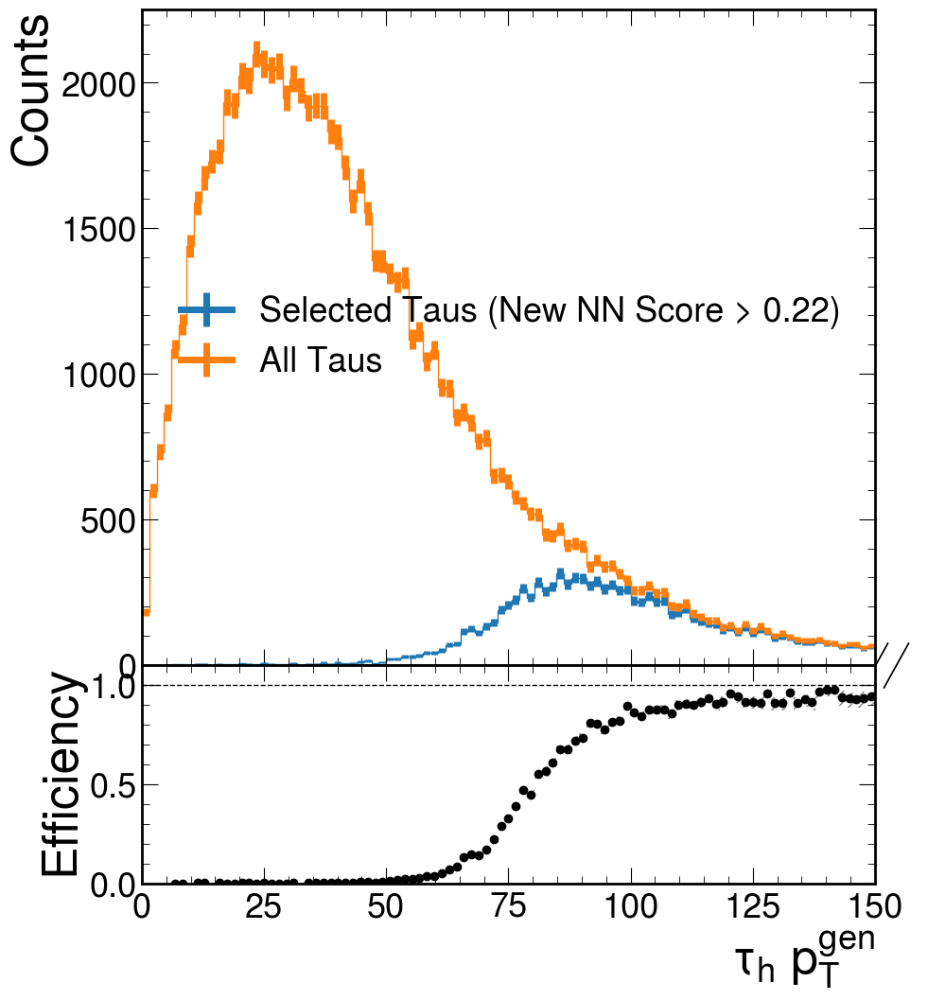

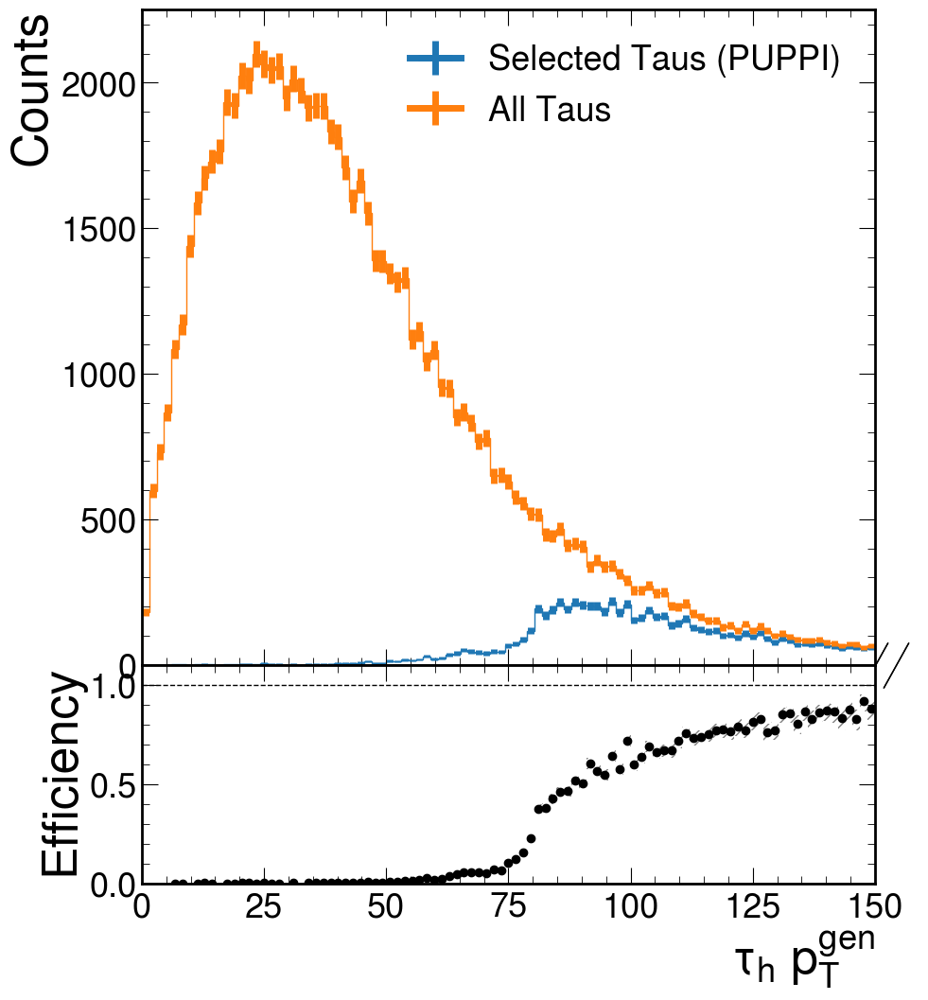

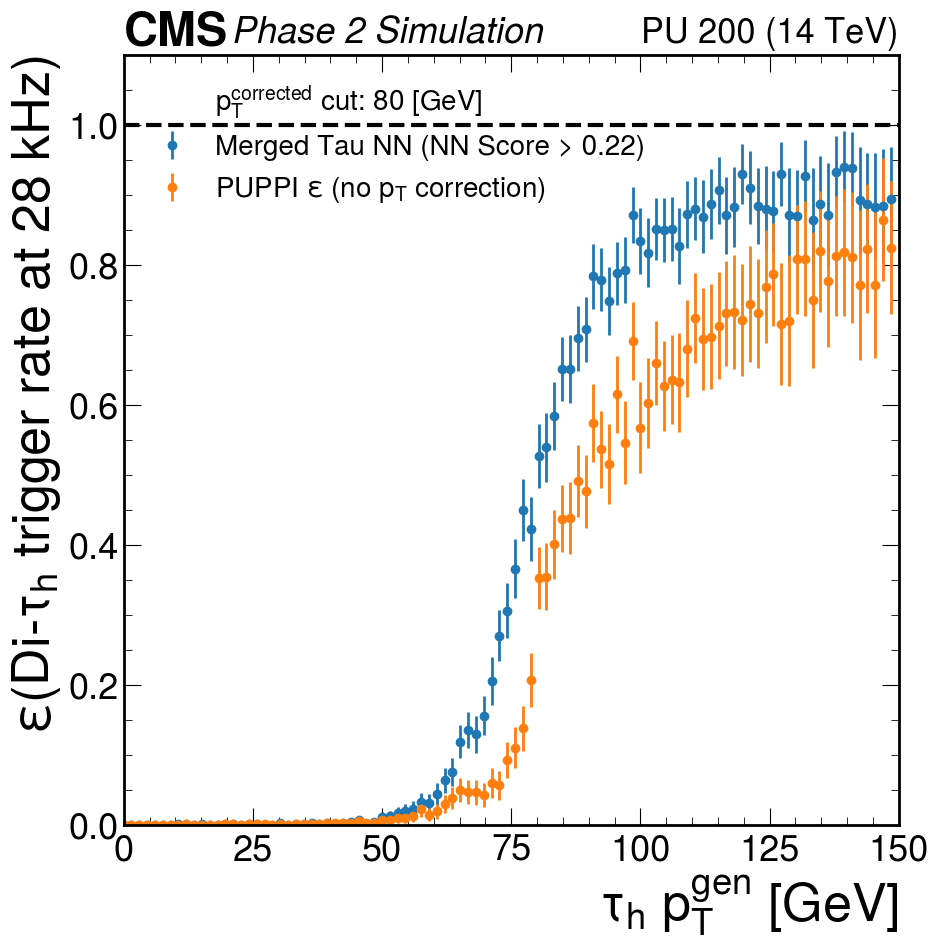

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.33531427e-02 7.89656862e-03 0.00000000e+00 2.18965383e-03
 1.66763726e-03 0.00000000e+00 1.06798878e-03 2.04748292e-04
 1.81724631e-04 1.94957874e-03 1.14386080e-03 1.36548992e-04
 2.06766045e-03 5.10481190e-04 1.19399413e-04 1.20458008e-04
 2.44730342e-03 0.00000000e+00 9.13224166e-04 9.00464244e-04
 2.90477840e-03 9.12907930e-04 2.89878475e-03 1.45243098e-03
 2.66011421e-03 4.89810259e-03 7.78537986e-03 1.72276581e-03
 4.34824044e-03 1.24395776e-02 1.40682326e-02 1.90515449e-02
 2.15133437e-02 2.56224523e-02 3.61109214e-02 3.40412812e-02
 4.86451752e-02 6.91410127e-02 8.28904653e-02 1.30162469e-01
 1.46877839e-01 1.42438356e-01 1.66583227e-01 2.19367727e-01
 2.91743760e-01 3.28626261e-01 3.88933542e-01 4.85643758e-01
 4.57278469e-01 5.63926324e-01 5.86662685e-01 6.13097329e-01
 6.95071465e-01 6.89830390e-01 7.52741014e-01 7.57081874e-01
 8.17589350e-01 8.13129903e-01 7.78864127e-01 8.33488888e-01
 8.23538050e-01 9.010133

In [7]:
# ======================================================================= MERGED NN


results = plot_pt_eff_puppi(model_merged,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=0.,
                            cut_point = 0.22)
no_cut_x = np.asarray(results[0])
no_cut_y = np.asarray(results[1])


threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
gen_pT_list = []
for i in threshold_list:
    result = plot_pt_eff_puppi(model_merged,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=i,
                            cut_point = 0.22)
    cut_x = np.asarray(result[0])
    cut_y = np.asarray(result[1])
    y_norm = np.divide(cut_y, no_cut_y)
    print(y_norm)
    for i in range(10):
        if y_norm[i] == 1:
            y_norm[i] = 0
        else:
            break
    gen_pT_list.append(cut_x[y_norm > 0.95][0])
#gen_pT_list = [cut(i) for i in threshold_list]
gen_pT_list_merged = gen_pT_list


1905/1905 [==============================] - 3s 1ms/step


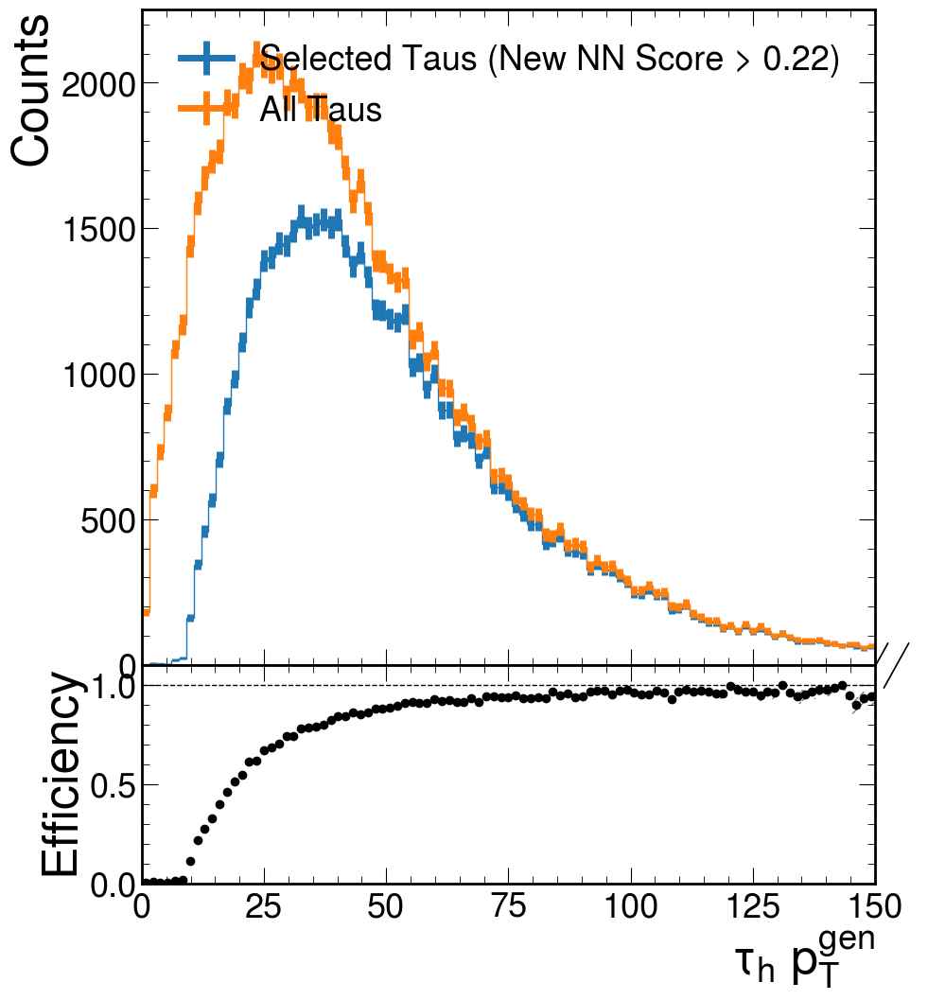

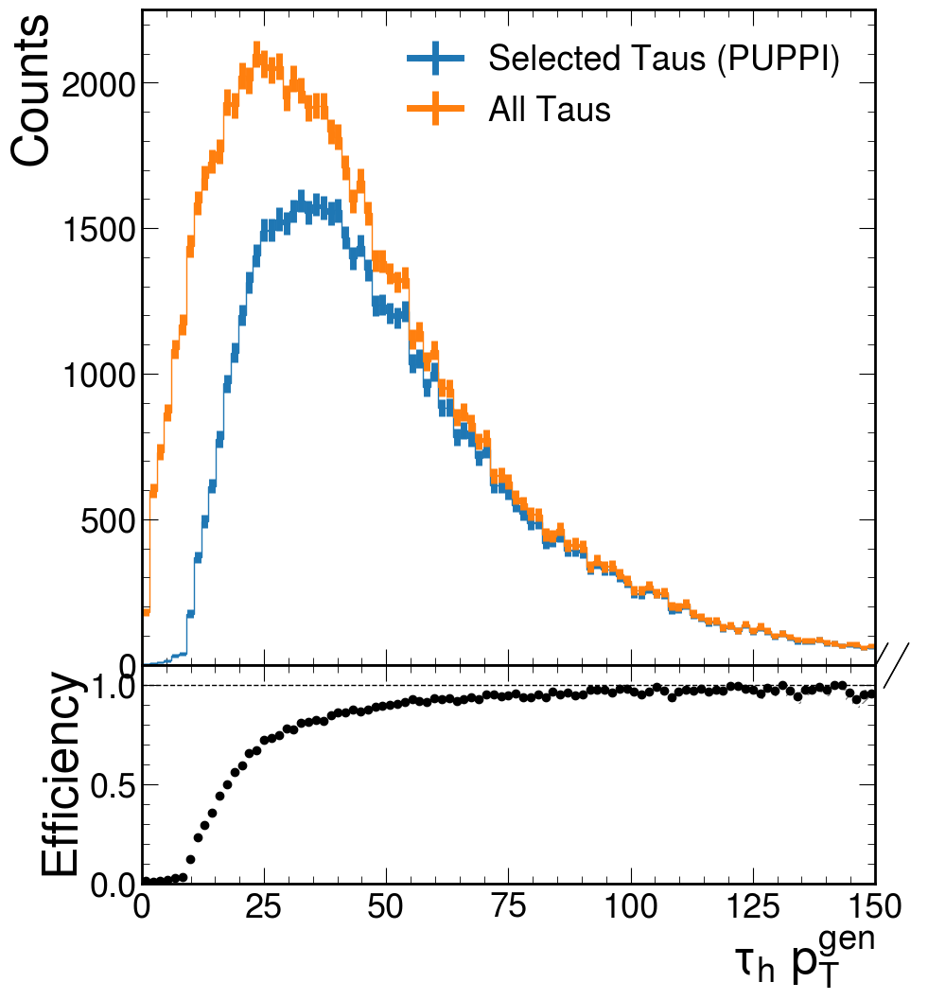

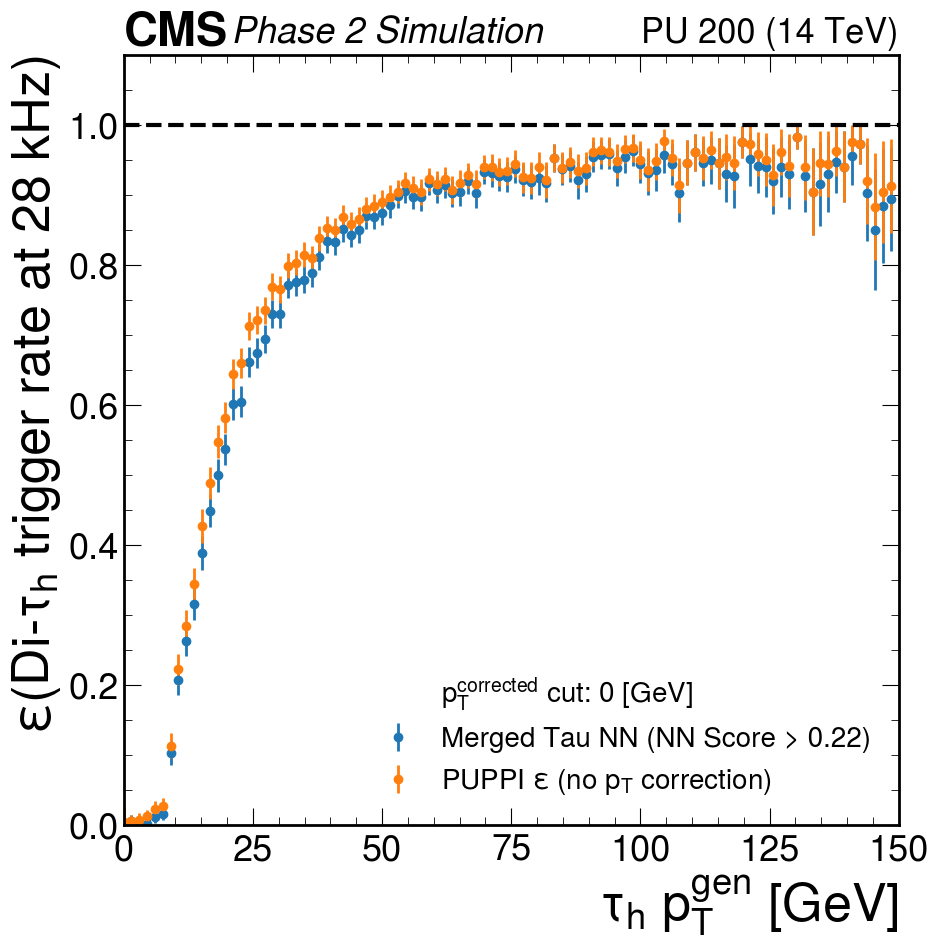

1848/1848 [==============================] - 3s 1ms/step


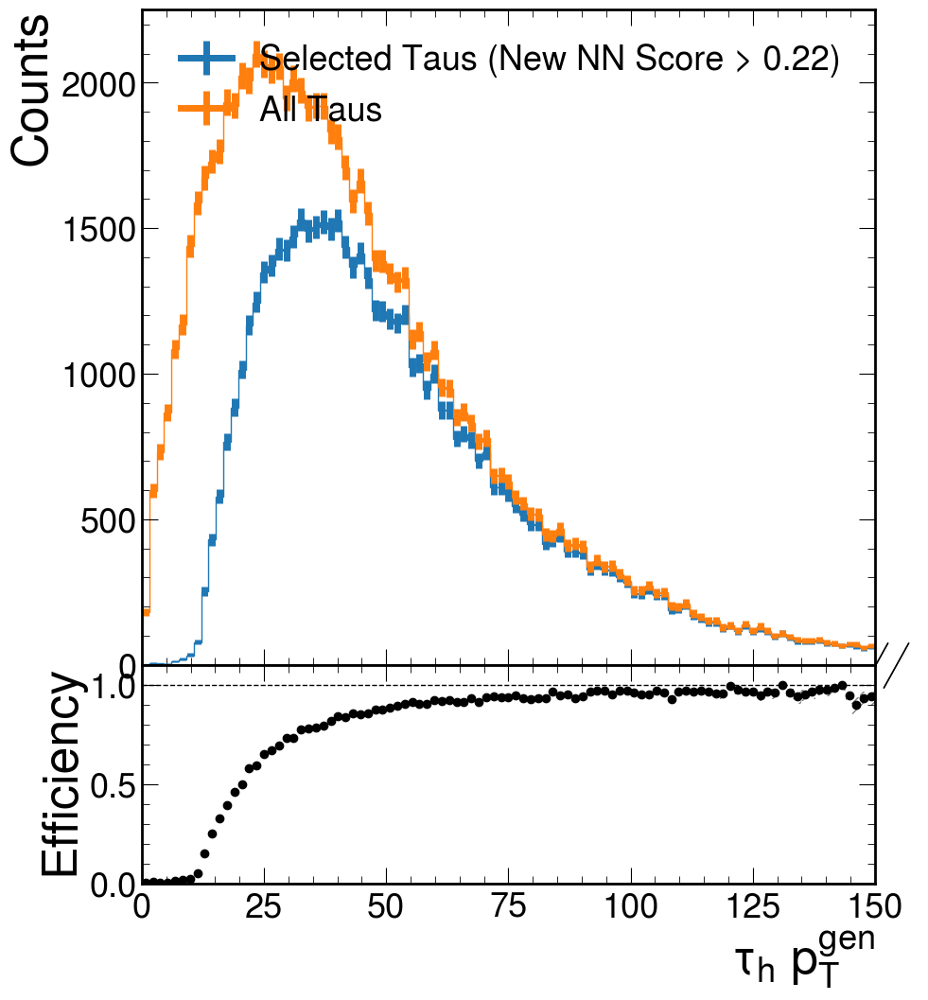

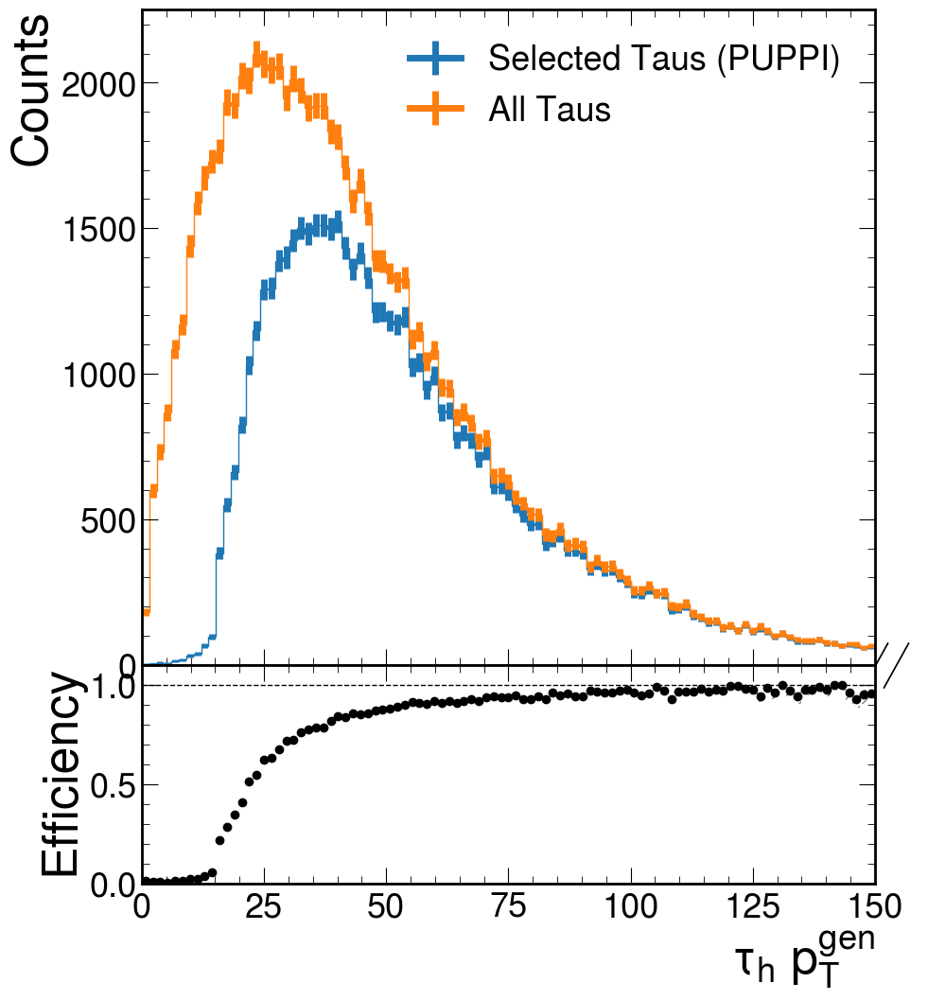

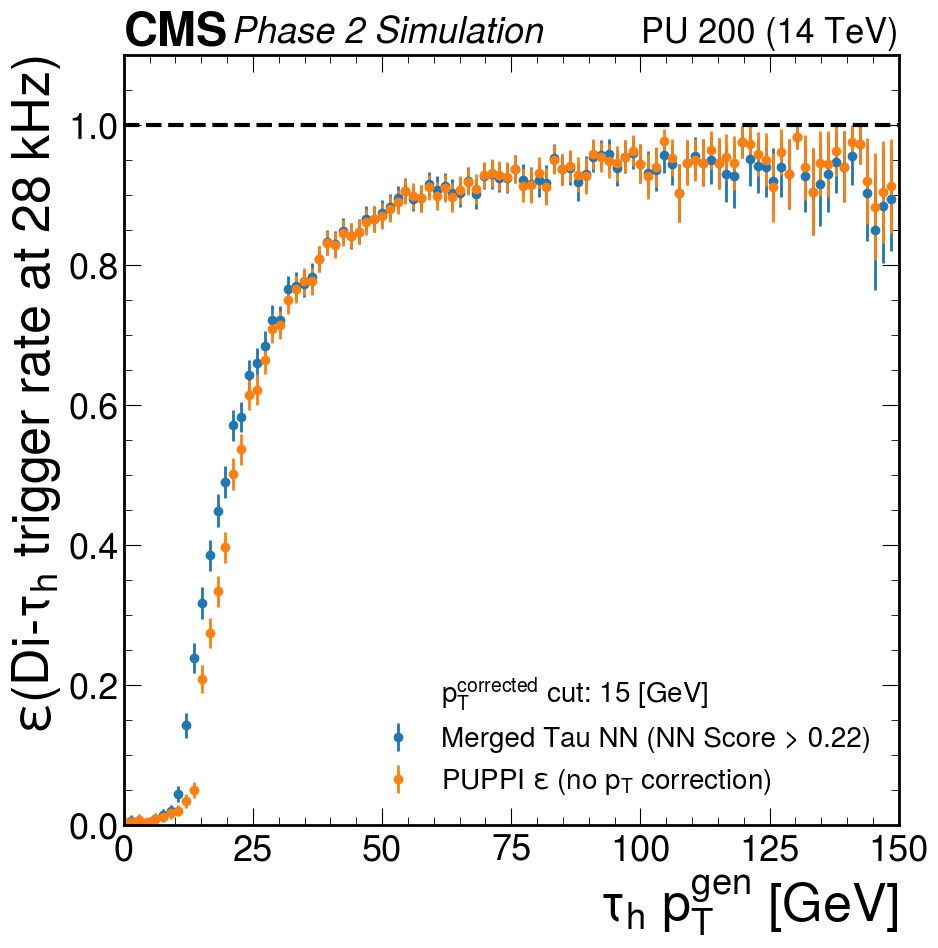

[1.         1.         1.         1.         0.71270756 0.8532873
 0.18468527 0.21122976 0.53977914 0.75395628 0.81596301 0.8574684
 0.89892994 0.91331954 0.94920394 0.96357403 0.97122665 0.97950988
 0.98656044 0.98860106 0.9876037  0.99200032 0.99315179 0.99320542
 0.99395    0.99657138 0.99729895 0.99712576 0.99772909 0.99780776
 0.9976652  0.99658651 0.99657807 1.         0.99733439 0.99739297
 1.         0.9969632  0.9988854  0.99894213 1.         0.99878878
 1.         0.99866378 1.         0.99848137 0.99414033 0.99822716
 0.99823175 0.99816083 1.         1.         0.99775132 0.99773959
 1.         1.         1.         0.99714737 0.99717534 1.
 1.         1.         1.         1.         1.         0.99581916
 1.         1.         1.         1.         1.         1.
 1.         0.99411531 1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1. 

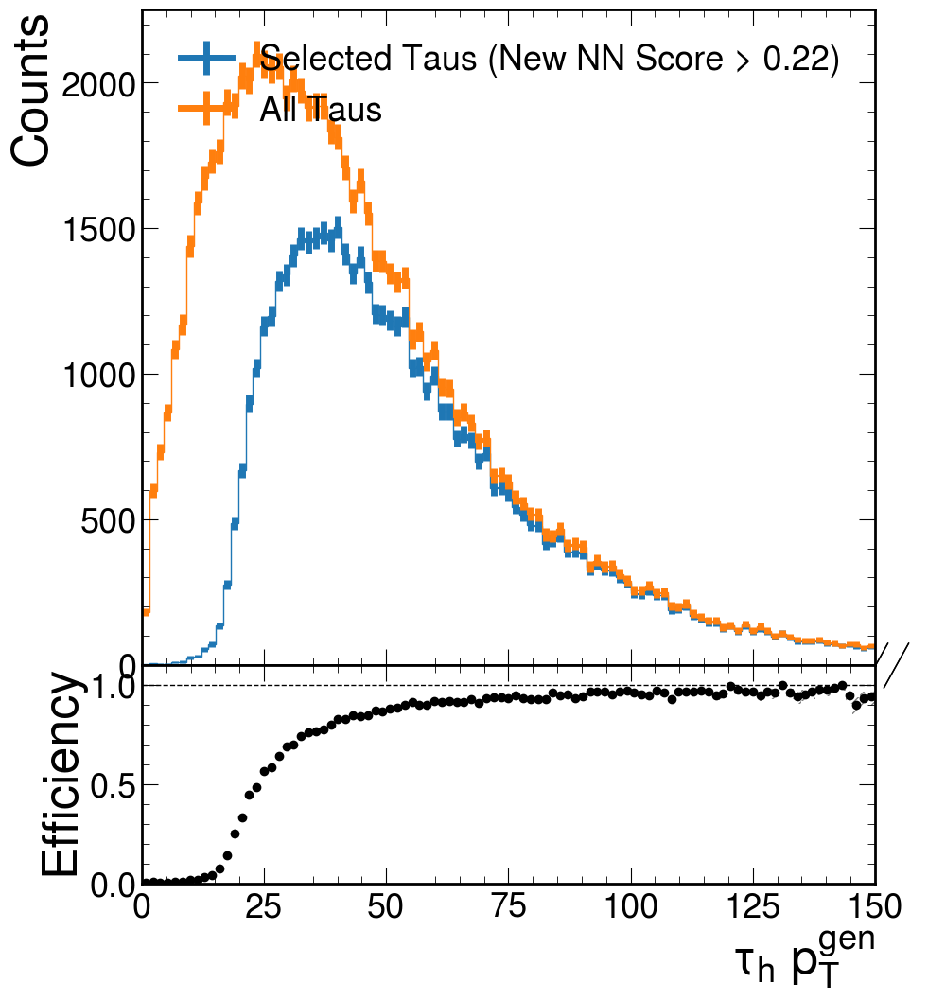

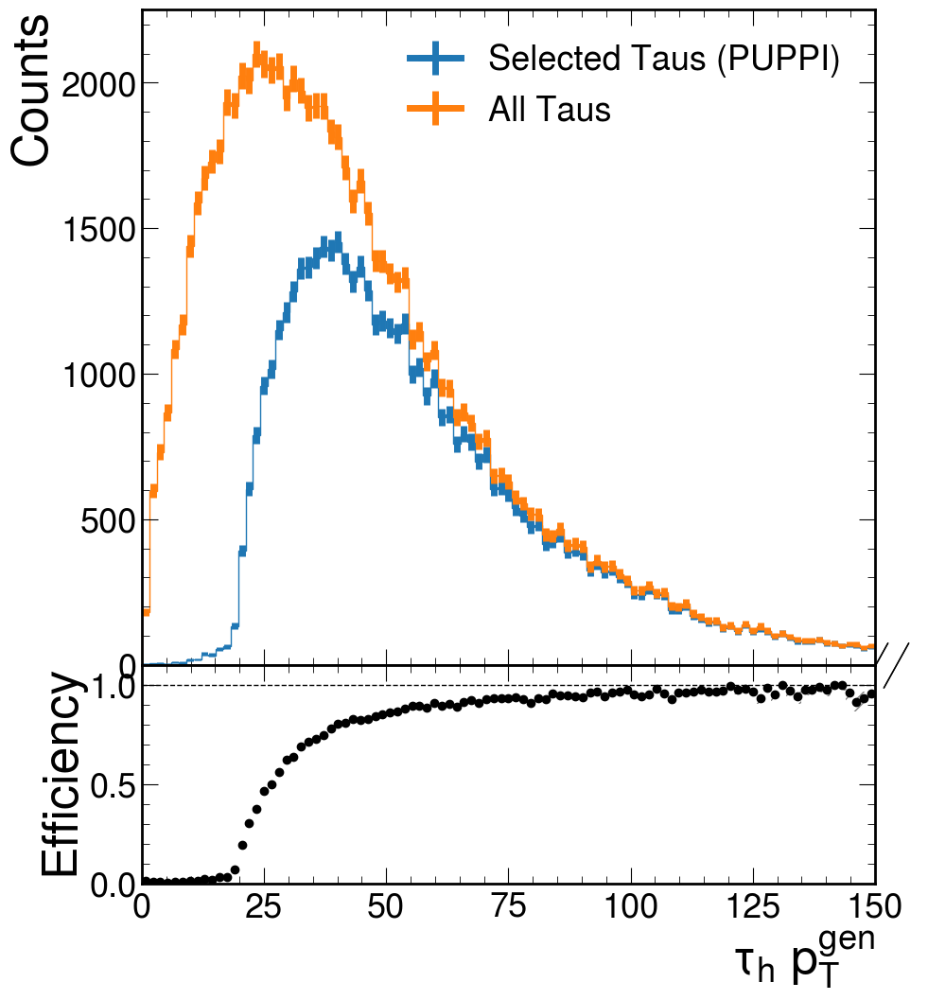

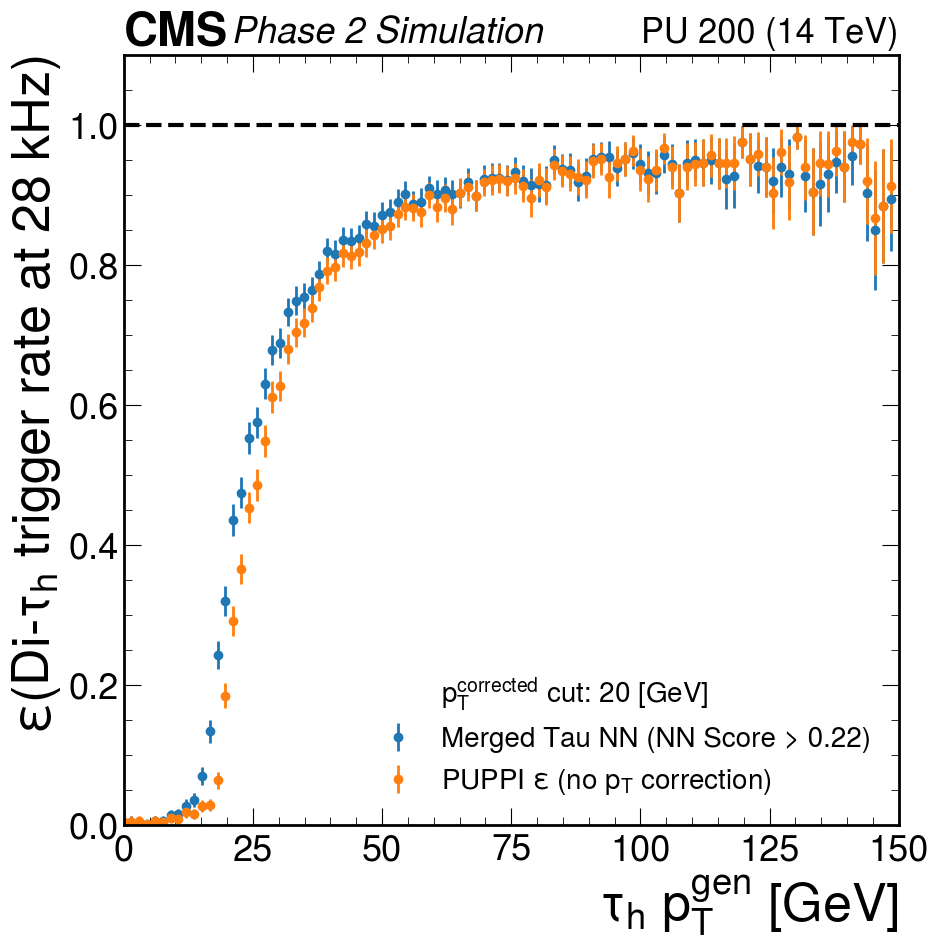

[1.         0.73415643 0.65544255 0.51784426 0.50270579 0.3775579
 0.13556851 0.07211129 0.10427589 0.11312596 0.17928188 0.29832121
 0.48583683 0.59583932 0.72438415 0.78434373 0.83509833 0.85322422
 0.90817892 0.92885189 0.94289612 0.94939545 0.96647012 0.96808952
 0.96910225 0.96917469 0.98312966 0.98061402 0.98109382 0.98904394
 0.98600072 0.98806041 0.98546879 0.99561216 0.98845855 0.99131573
 0.99485235 0.98887555 0.99331699 0.99260263 0.99394665 0.99274011
 0.99863446 0.99732812 0.99861648 0.99544632 0.98975709 0.99291932
 0.99823175 0.99632343 0.99598456 0.99790174 0.99550518 0.99097506
 0.99737341 0.99736109 1.         0.99430218 0.99717534 0.99711198
 0.99648042 0.99669413 0.99646153 1.         0.99616655 0.99581916
 1.         1.         0.99558824 1.         1.         1.
 1.         0.988306   1.         1.         1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.      

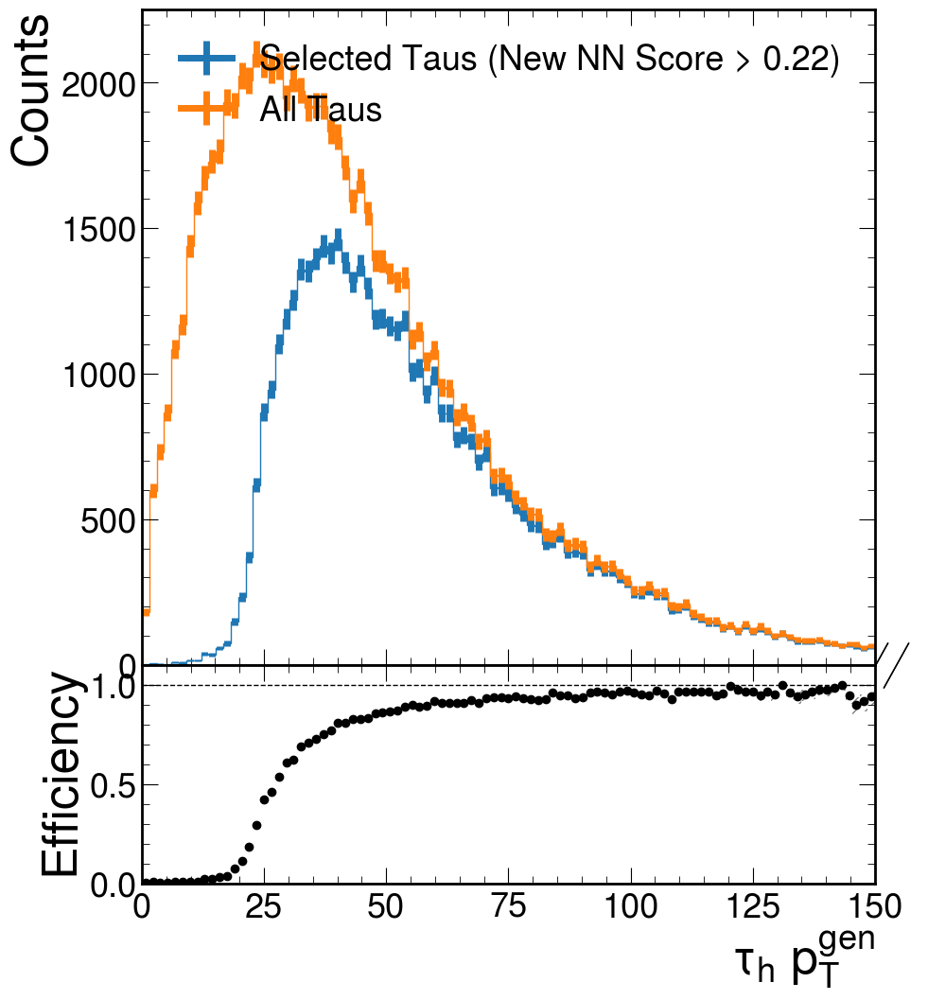

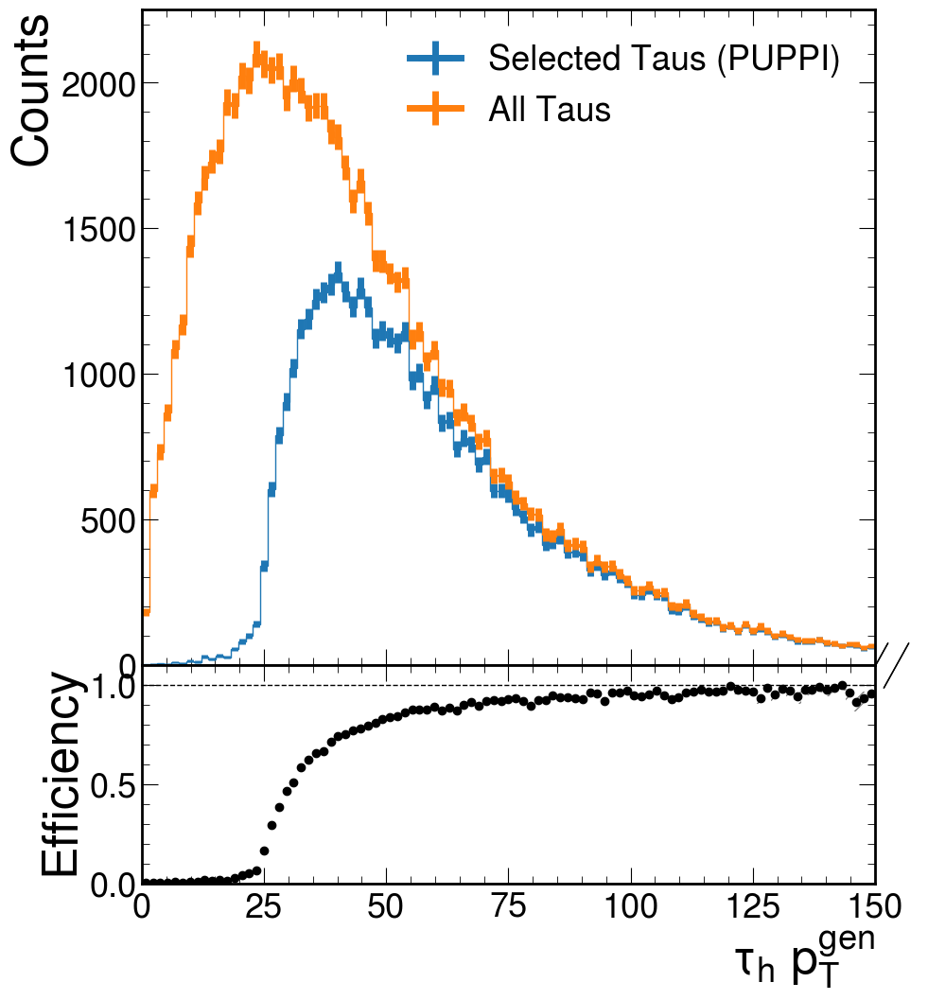

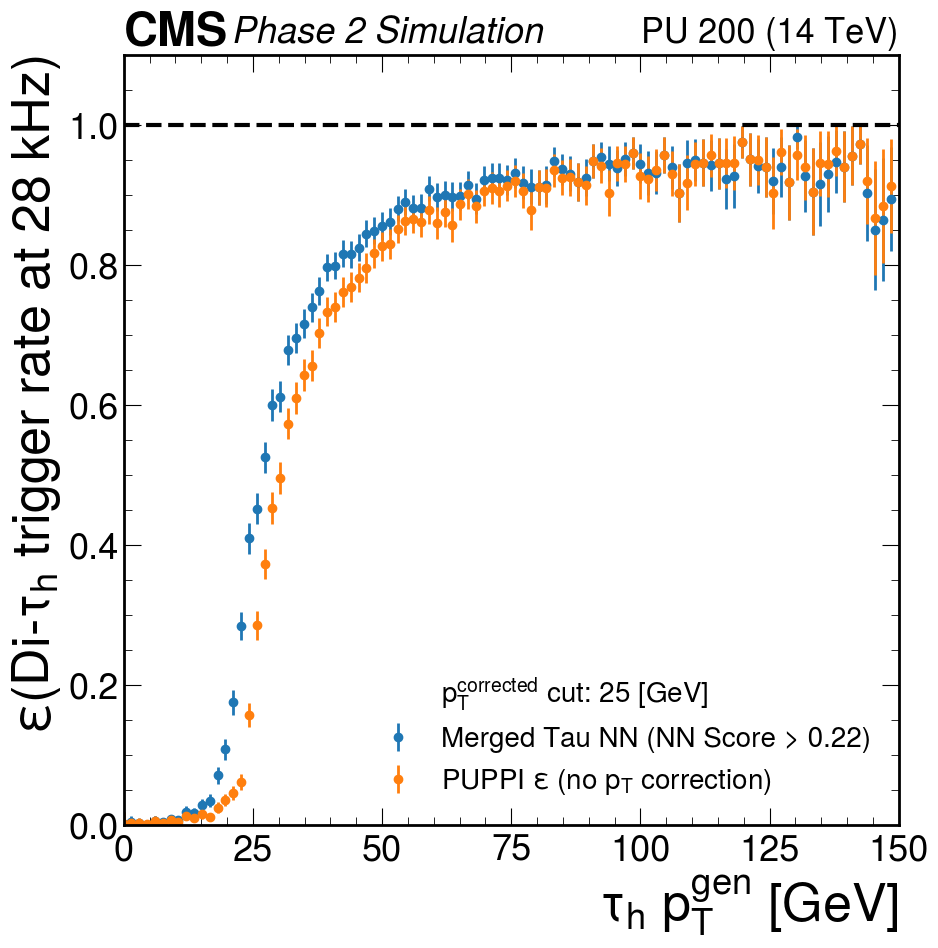

[1.         0.73415643 0.65544255 0.12628835 0.50270579 0.2420256
 0.07556182 0.03404951 0.07051623 0.05337847 0.07235422 0.0756336
 0.14113285 0.20051073 0.29154309 0.46987149 0.61916487 0.67015005
 0.75624168 0.82109622 0.83797613 0.87902874 0.89754625 0.91931458
 0.93826125 0.93909888 0.95417023 0.9598289  0.95921002 0.96716784
 0.97047117 0.97188863 0.97693491 0.97809099 0.9734005  0.98004951
 0.98252586 0.98181056 0.98331201 0.99154729 0.98790397 0.98549688
 0.9945412  0.99332437 0.99309015 0.99089908 0.98829804 0.99291932
 0.99823175 0.99632343 0.99398097 0.99580575 0.99326149 0.98647826
 0.99737341 0.99473067 1.         0.98863224 0.99717534 0.9942299
 0.99297905 0.99669413 0.98596041 1.         0.99616655 0.99581916
 1.         1.         0.99558824 1.         0.99518769 1.
 1.         0.988306   1.         0.99235507 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 1.         1.         1.         1.
 1.         1.        

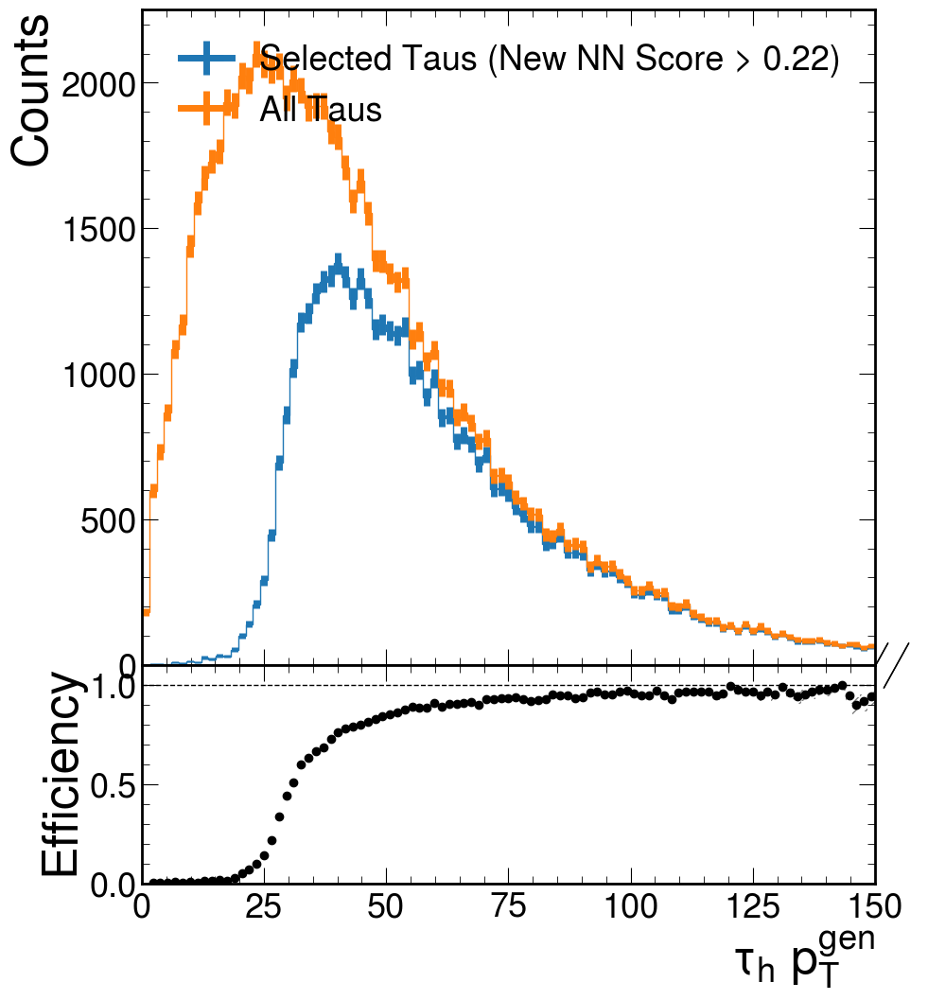

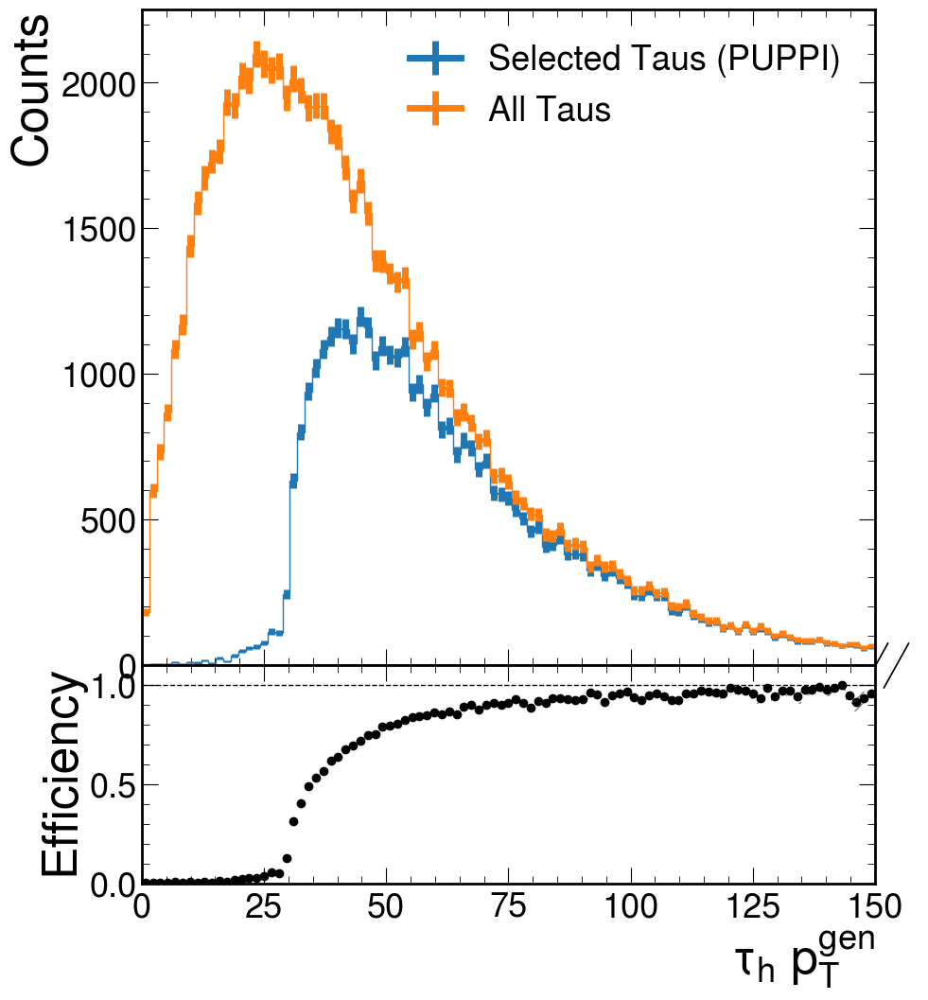

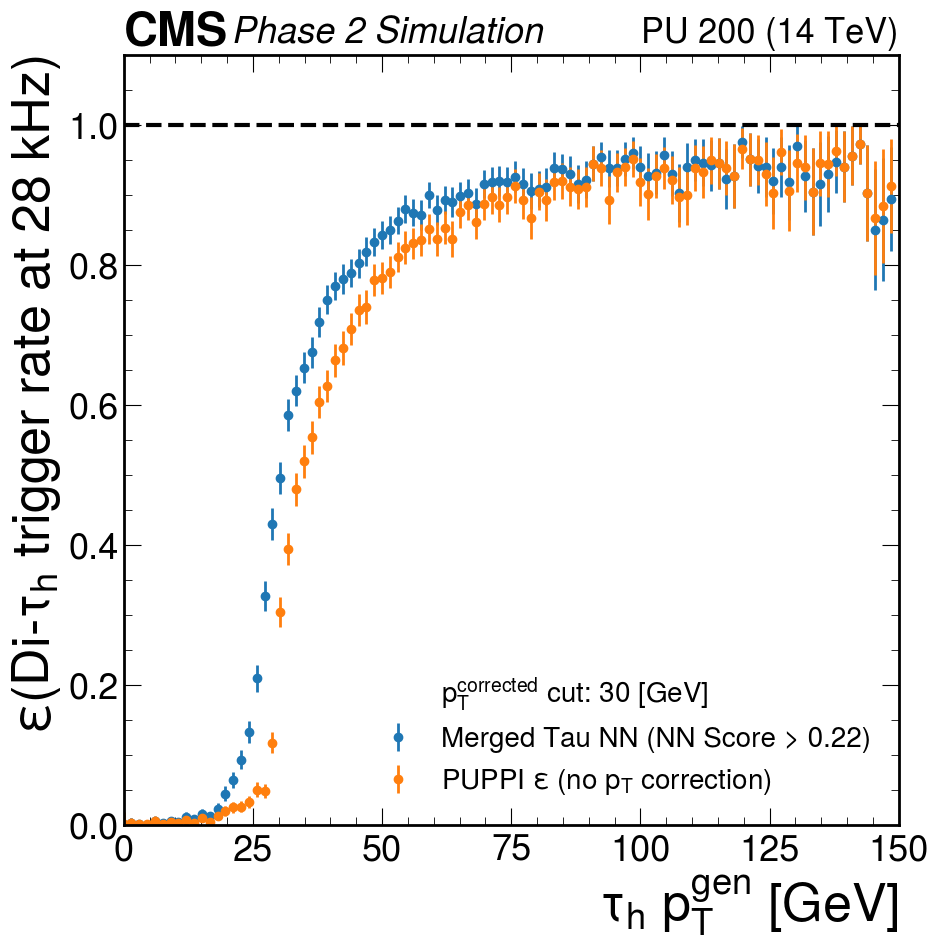

[0.         0.48117675 0.3394046  0.12628835 0.43419998 0.19827262
 0.0523079  0.01845595 0.04358943 0.02690356 0.03854961 0.02731568
 0.04585121 0.08314669 0.10661772 0.1531629  0.20079445 0.31011258
 0.47121024 0.588534   0.6782541  0.75869411 0.8003282  0.83894967
 0.85670215 0.88523691 0.89911622 0.92478561 0.91632307 0.93515963
 0.94412517 0.94218207 0.95819293 0.96323228 0.95925992 0.96103599
 0.9712574  0.97475565 0.97222022 0.9820638  0.96863045 0.97706543
 0.98636902 0.99332437 0.980697   0.98182255 0.98101693 0.98586498
 0.99293663 0.99265372 0.98798541 0.99371194 0.98654429 0.98423346
 0.99475048 0.98428207 1.         0.98863224 0.9943554  0.99135342
 0.98949402 0.99669413 0.97903651 1.         0.99616655 0.99581916
 0.99528635 0.99529509 0.99558824 1.         0.9856454  1.
 0.99378425 0.988306   1.         0.99235507 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 0.98631808 1.         1.         1.
 1.         1.     

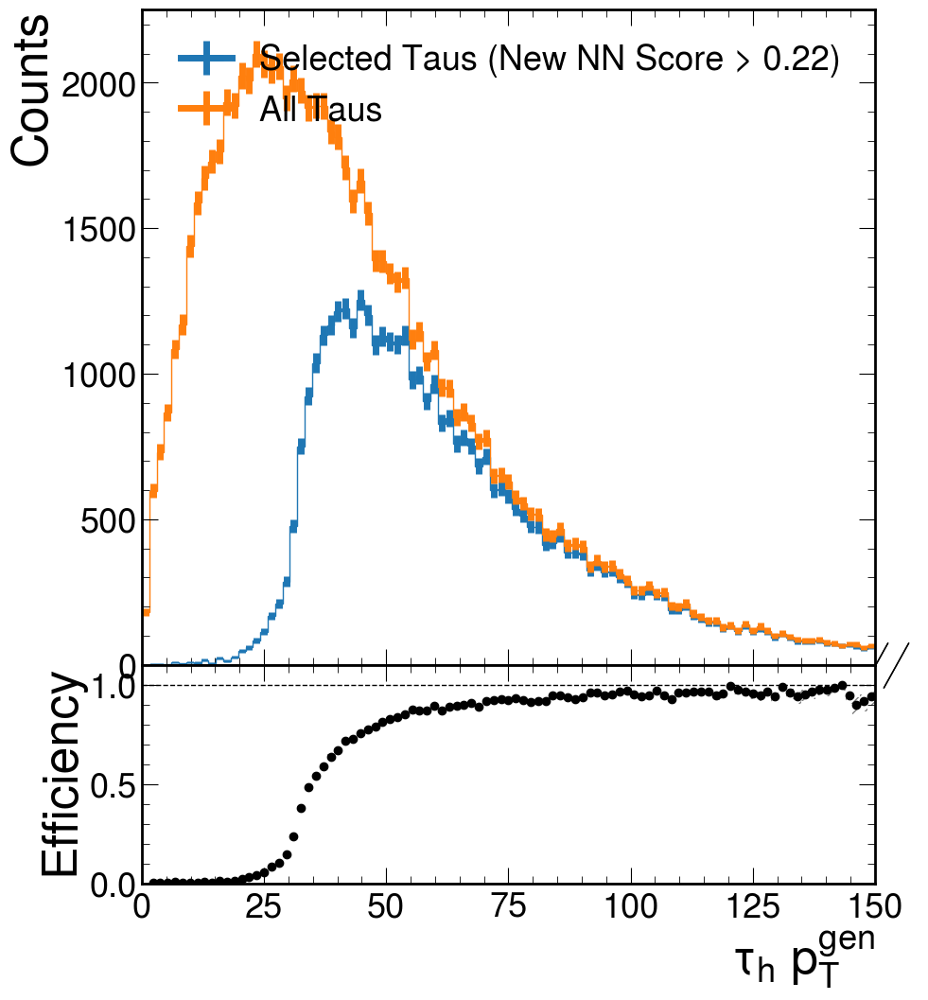

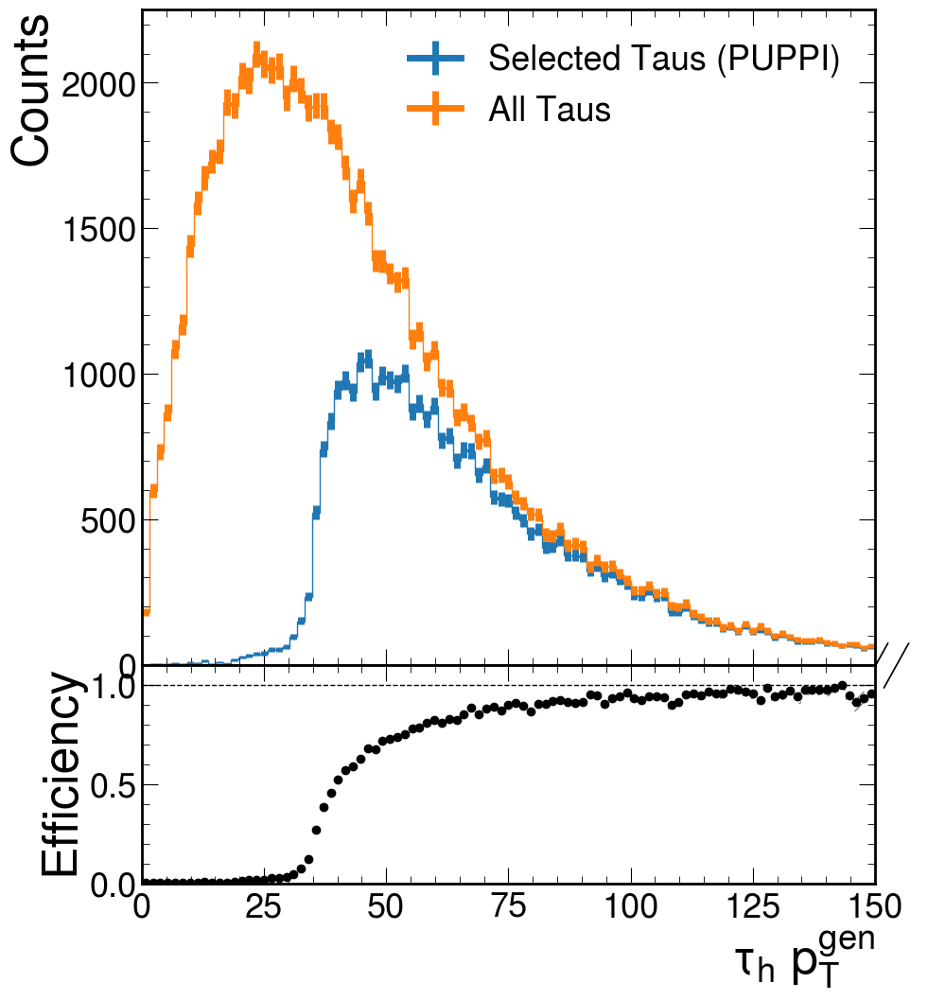

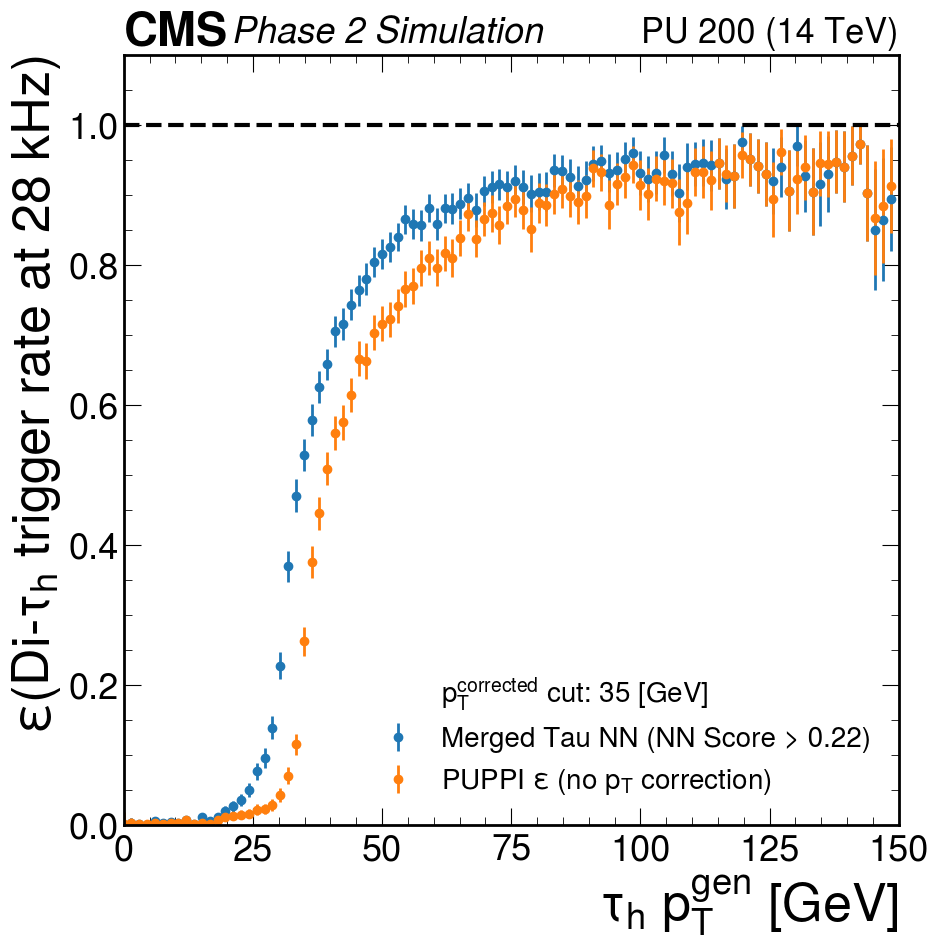

[0.         0.48117675 0.3394046  0.12628835 0.43419998 0.11420966
 0.03537527 0.01346294 0.02742401 0.00520215 0.02665401 0.01090143
 0.02186151 0.03707349 0.04343525 0.05839604 0.07518537 0.11291307
 0.13751597 0.1903267  0.31098742 0.47841009 0.60696983 0.67899855
 0.7342401  0.77118128 0.7882057  0.84711946 0.84066131 0.88150078
 0.89854619 0.89736874 0.9250647  0.93185572 0.93281793 0.93519789
 0.95491244 0.95665612 0.95562593 0.96211907 0.94584813 0.96385272
 0.9754999  0.98134015 0.97246277 0.97276794 0.97085905 0.97883389
 0.98765498 0.98533323 0.98201067 0.98953061 0.98207698 0.97975066
 0.9869022  0.98168582 0.9975033  0.98298692 0.99153997 0.99135342
 0.98949402 0.99013175 0.97216195 0.99651613 0.99616655 0.99581916
 0.98593954 0.9906106  0.99558824 1.         0.9856454  1.
 0.99378425 0.98255824 1.         0.99235507 1.         0.99184219
 1.         1.         1.         1.         0.98912741 1.
 1.         0.97458786 0.98631808 1.         1.         1.
 1.         1.     

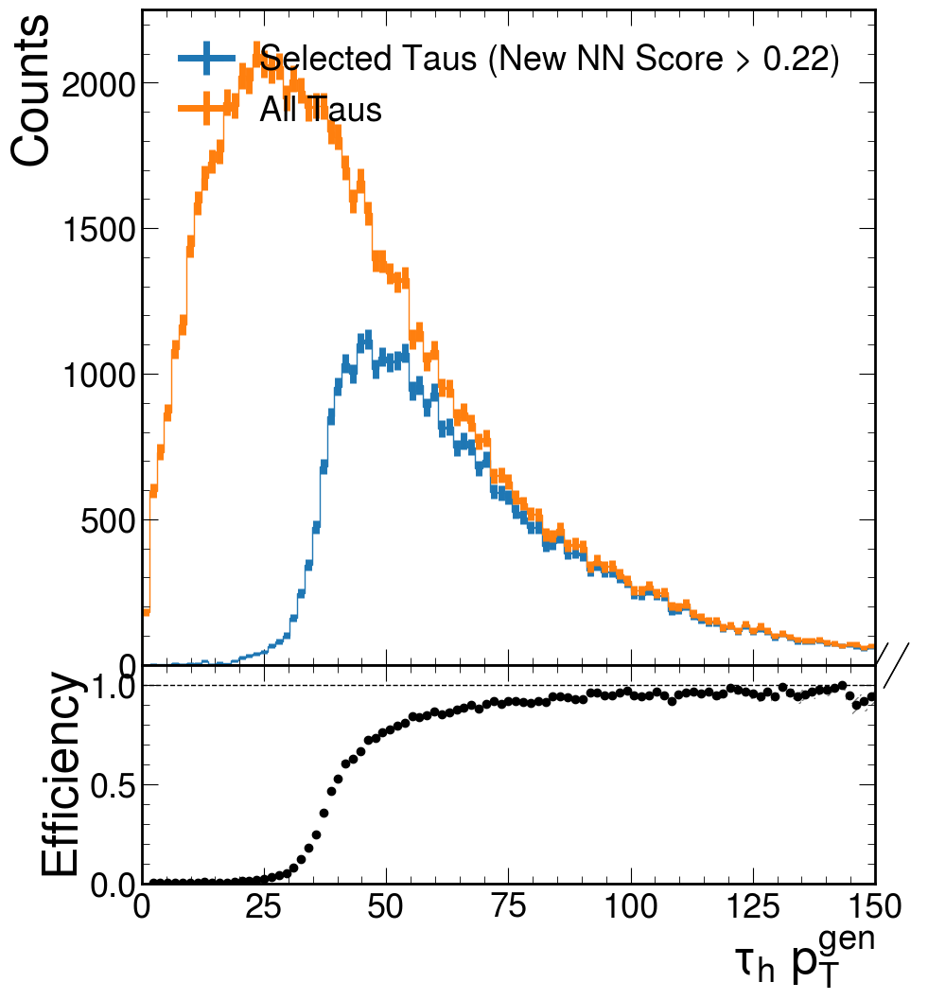

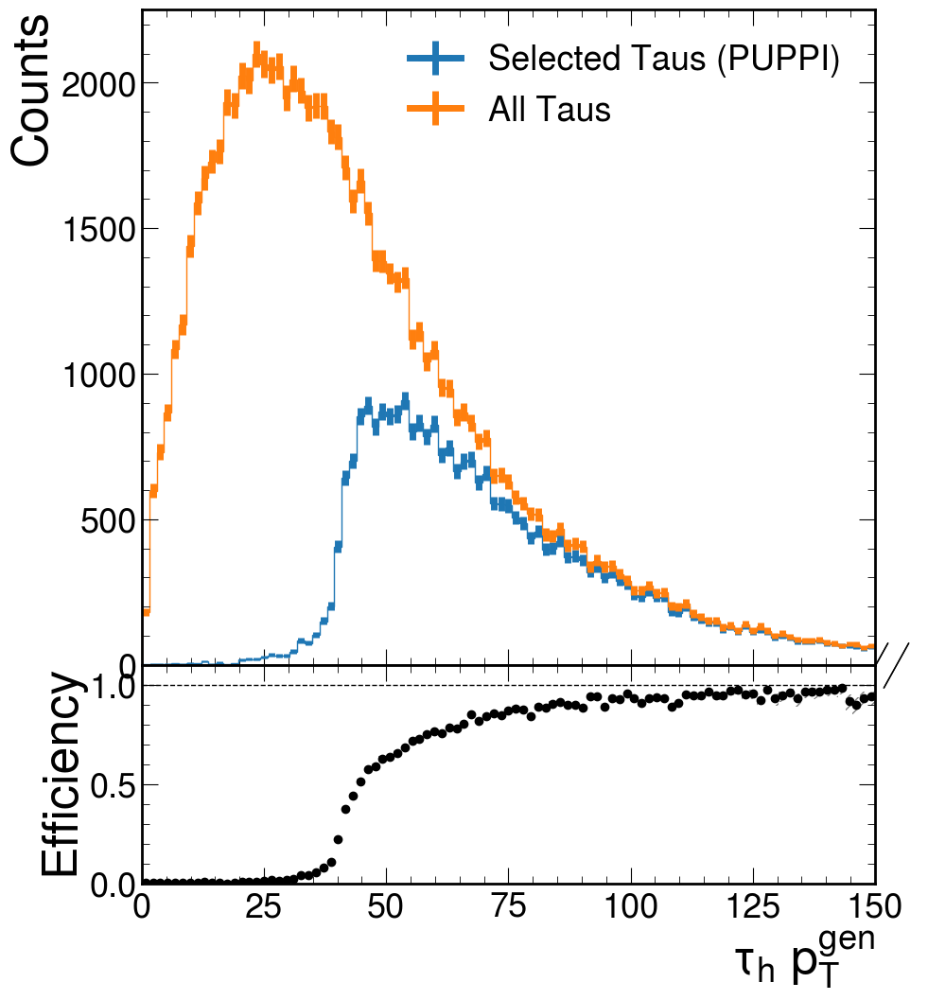

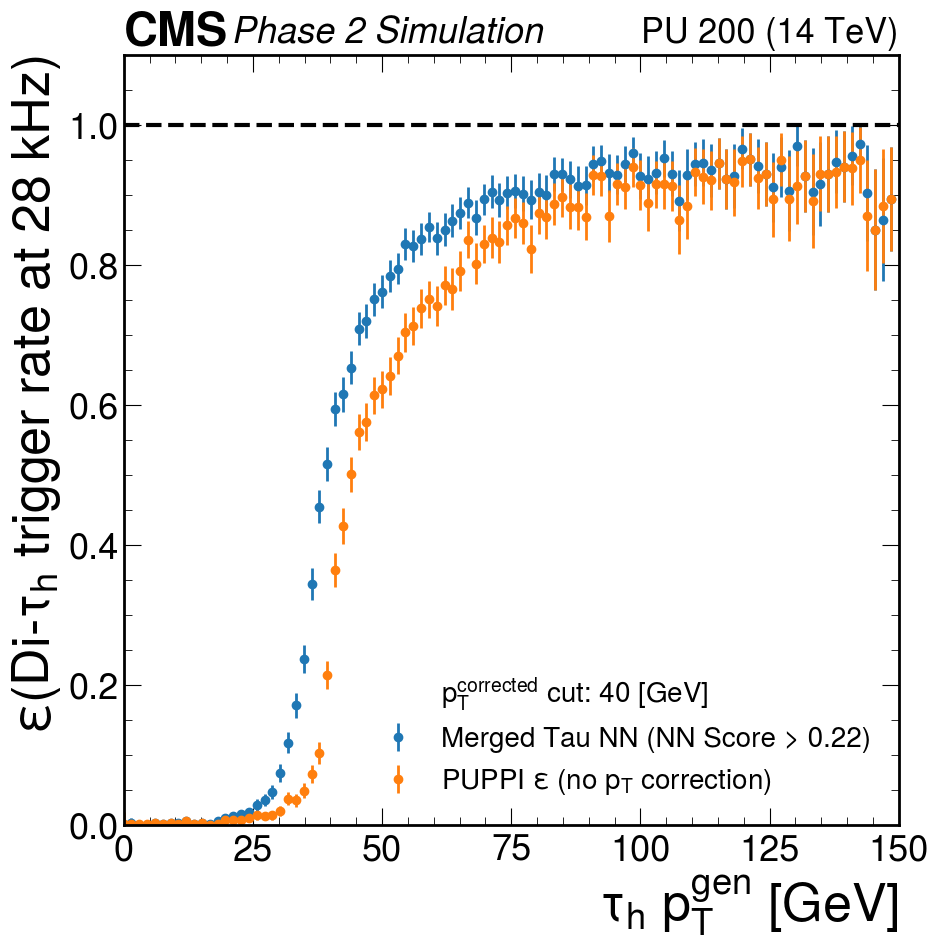

[0.         0.48117675 0.08276753 0.12628835 0.23566618 0.07486331
 0.02447497 0.00865306 0.02149842 0.00250388 0.00645302 0.00240718
 0.01075615 0.01765216 0.02038942 0.02443204 0.02675265 0.041427
 0.05058178 0.06421631 0.10064138 0.15193042 0.21997564 0.3037437
 0.43642468 0.56011181 0.61759628 0.71319219 0.72295566 0.7747006
 0.83390492 0.82835598 0.8641678  0.87026048 0.88541657 0.88462042
 0.91627022 0.92160752 0.9335704  0.93183644 0.92315884 0.93038719
 0.95654409 0.96674174 0.96561598 0.96072578 0.9578515  0.97182355
 0.96315585 0.97621454 0.96616447 0.97911092 0.97316602 0.97975066
 0.98168582 0.97650979 0.99252401 0.98017264 0.99153997 0.98275485
 0.98949402 0.99013175 0.97216195 0.98958187 0.98856415 0.99581916
 0.98130078 0.9906106  0.99558824 0.9950845  0.9856454  0.9879145
 0.98151286 0.98255824 1.         0.98480971 1.         0.99184219
 1.         0.98997051 1.         1.         0.98912741 0.99052674
 1.         0.97458786 0.98631808 1.         1.         1.
 1.     

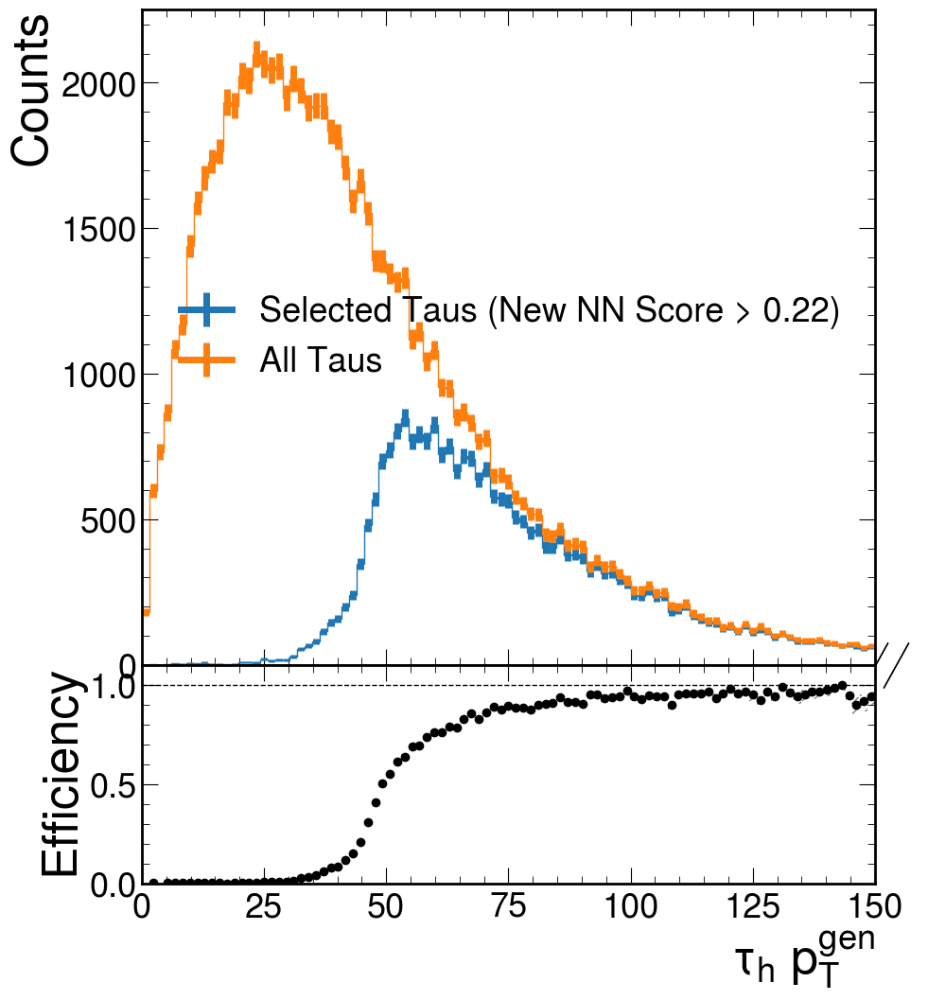

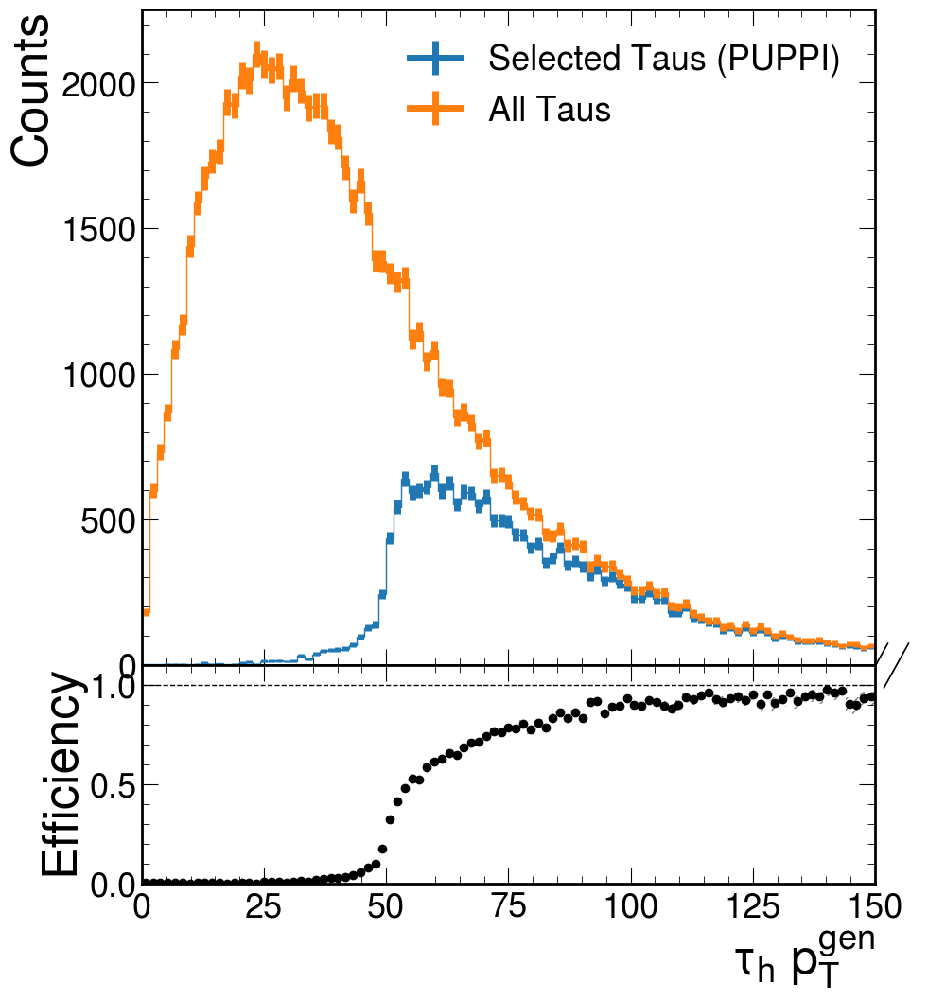

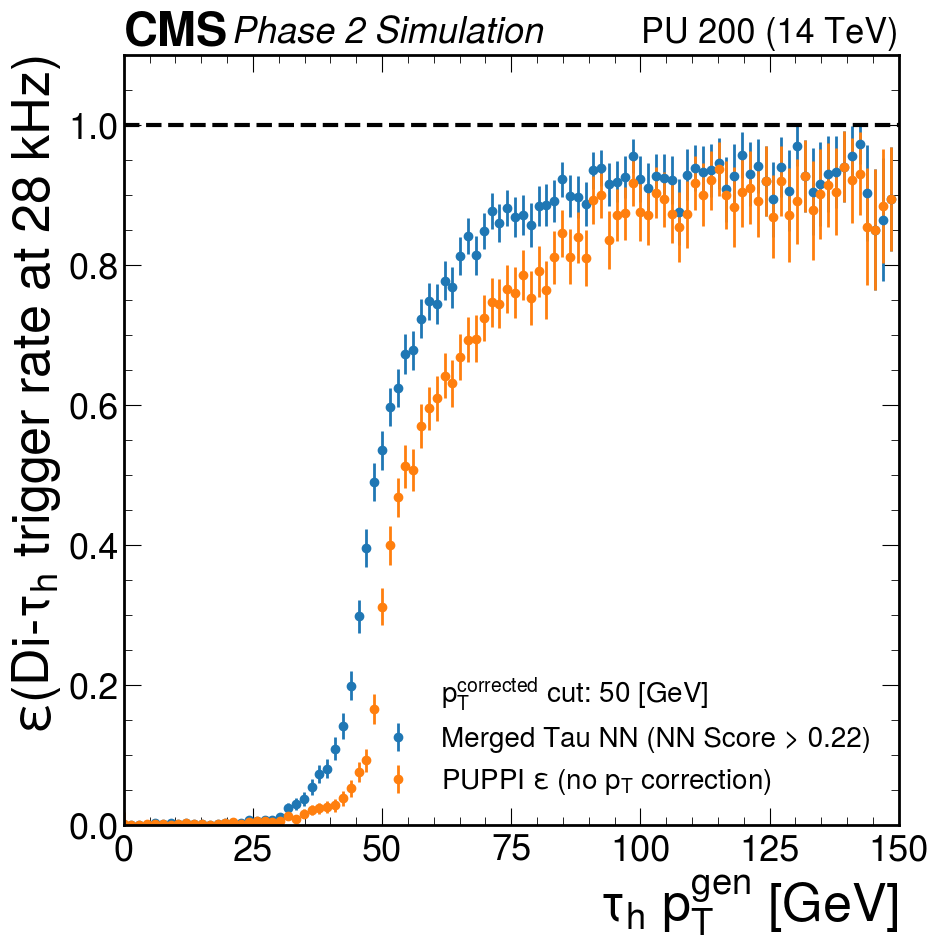

[0.00000000e+00 6.07542925e-02 0.00000000e+00 1.26288353e-01
 1.73031871e-01 7.48633091e-02 1.92016066e-02 6.35351832e-03
 1.00582706e-02 1.29674754e-03 1.99632099e-03 1.99328660e-04
 7.38833552e-04 5.58441718e-03 4.34146079e-03 3.48567596e-03
 1.07630984e-02 7.48586011e-03 9.06175864e-03 8.48743541e-03
 1.48843495e-02 3.07191540e-02 3.84990323e-02 4.70295512e-02
 6.91726083e-02 8.91254590e-02 9.58266377e-02 1.30542876e-01
 1.66573111e-01 2.35770087e-01 3.50303556e-01 4.55105348e-01
 5.63896356e-01 6.11911603e-01 6.74185934e-01 6.95321705e-01
 7.42351962e-01 7.55125767e-01 8.06770479e-01 8.16060488e-01
 8.20116890e-01 8.51004012e-01 8.50669434e-01 8.98276056e-01
 9.13933843e-01 9.00931033e-01 9.09113140e-01 9.42219277e-01
 9.28479486e-01 9.52643902e-01 9.26960892e-01 9.46029714e-01
 9.33384201e-01 9.57455797e-01 9.66103388e-01 9.35686346e-01
 9.85086935e-01 9.55050834e-01 9.74731717e-01 9.54364787e-01
 9.79122353e-01 9.80389099e-01 9.55147282e-01 9.79252794e-01
 9.69844106e-01 9.916750

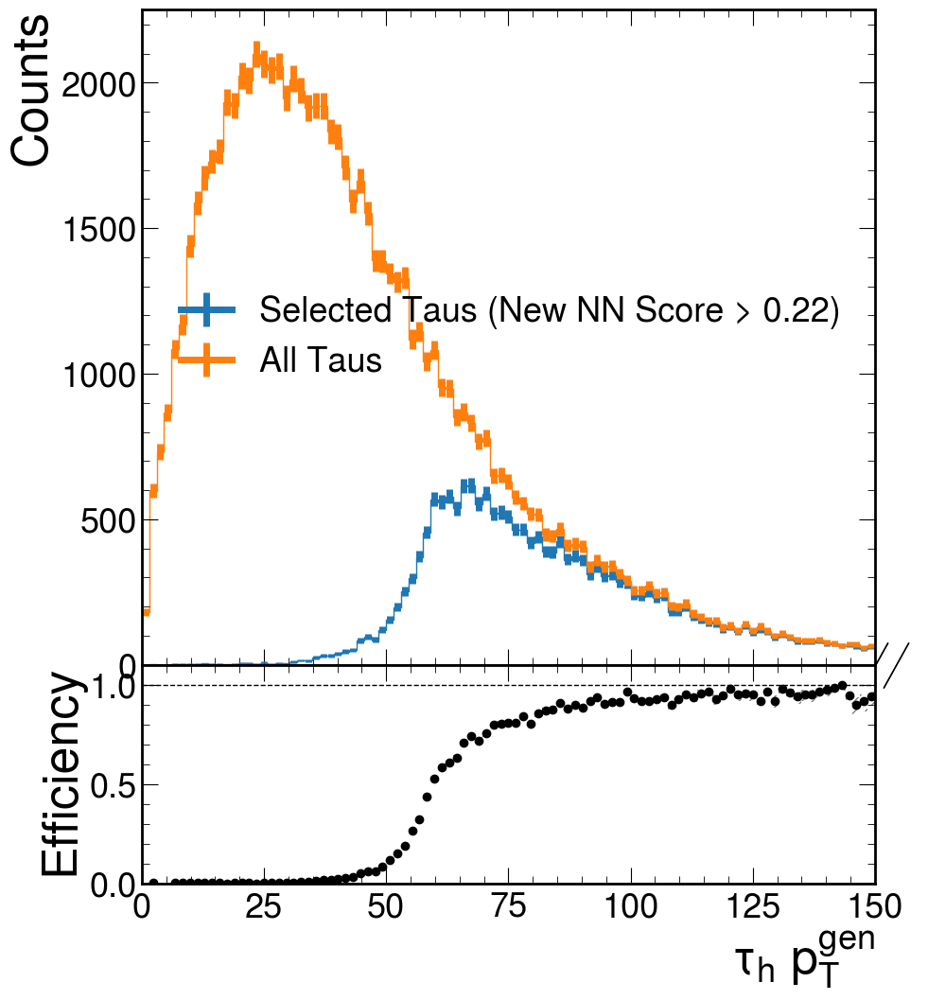

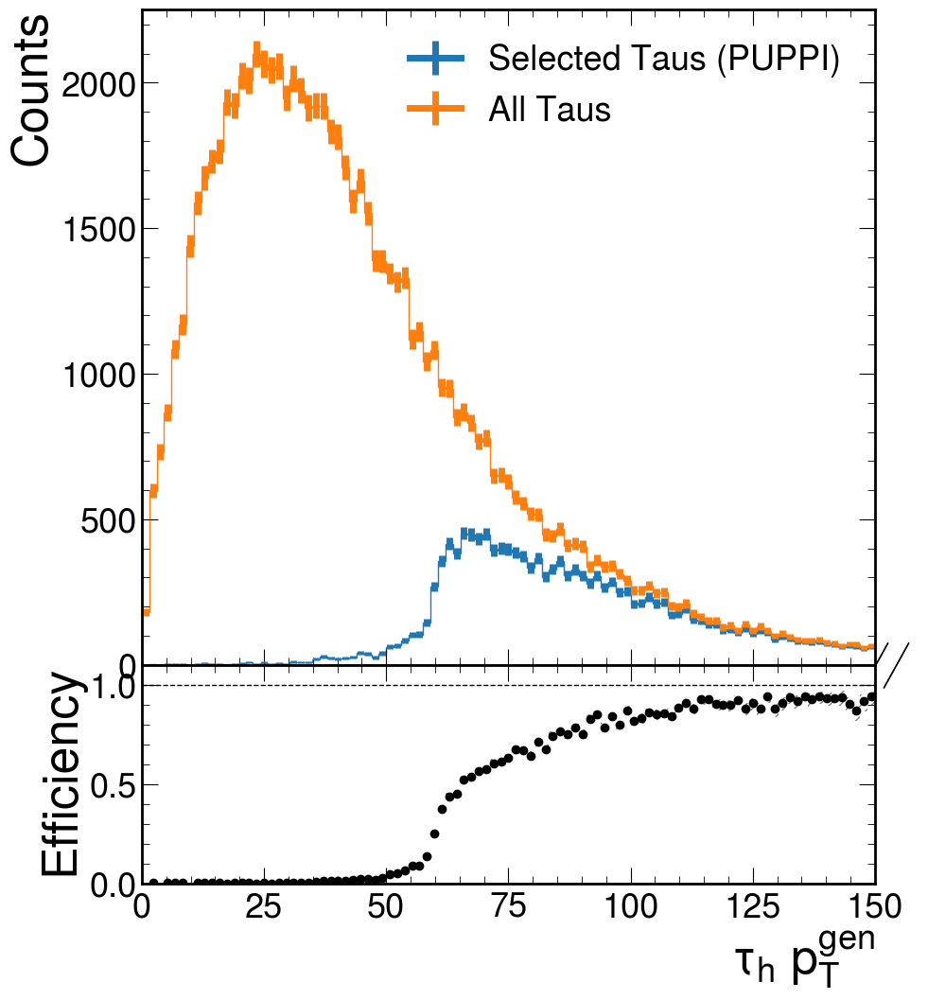

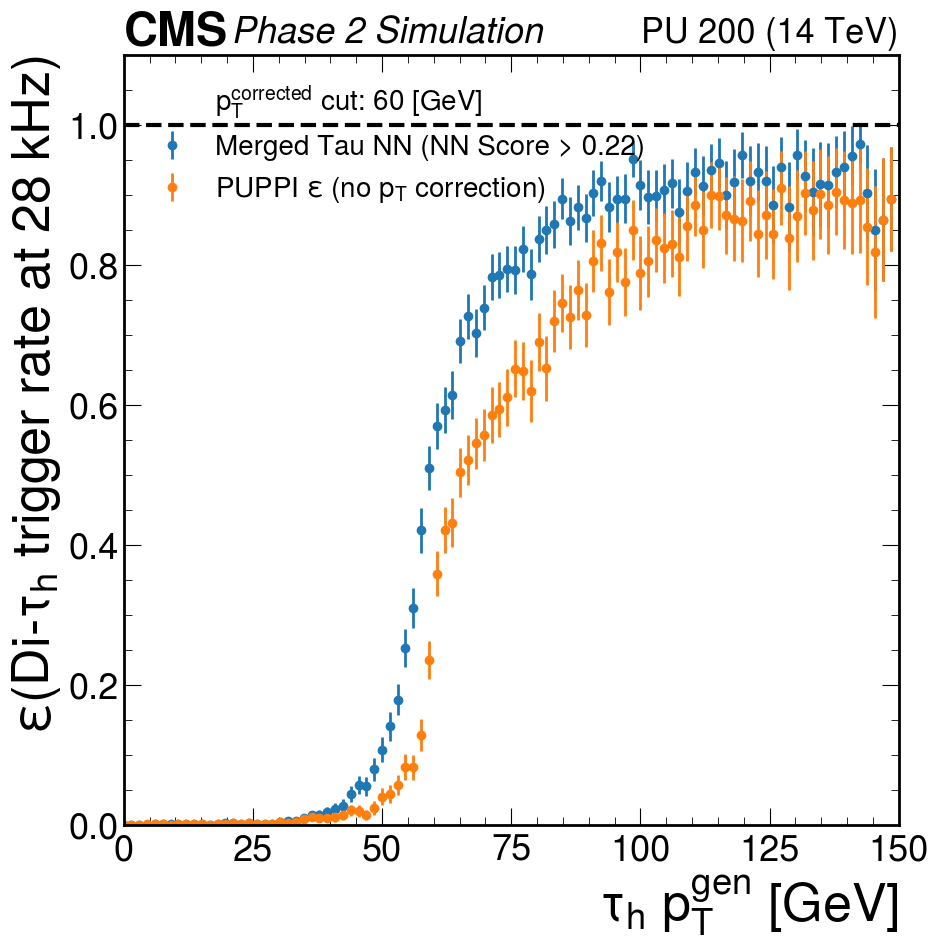

[0.00000000e+00 6.07542925e-02 0.00000000e+00 0.00000000e+00
 1.13419629e-01 3.87695038e-02 4.78616704e-03 2.15691153e-03
 4.74681616e-03 1.29674754e-03 1.99632099e-03 1.99328660e-04
 7.38833552e-04 3.33740977e-03 3.00382654e-03 5.58499251e-04
 3.23826062e-03 9.92886153e-04 1.99152242e-03 1.46921580e-03
 4.69494509e-03 7.34545421e-03 6.95625572e-03 1.28185401e-02
 1.74682908e-02 1.77729358e-02 2.10939950e-02 2.76425712e-02
 3.17770527e-02 5.22197932e-02 6.63580029e-02 6.29920817e-02
 9.09210706e-02 1.22650241e-01 1.58853902e-01 1.99028162e-01
 2.78433064e-01 3.45447593e-01 4.69222035e-01 5.56409896e-01
 6.28326710e-01 6.48751080e-01 6.80214676e-01 7.64352930e-01
 7.89129564e-01 7.78342623e-01 7.91780265e-01 8.41002827e-01
 8.47955375e-01 8.57901449e-01 8.45836770e-01 8.92879924e-01
 8.57056759e-01 9.06742703e-01 9.27497340e-01 9.00536647e-01
 9.55638076e-01 9.16513649e-01 9.58045680e-01 9.31883657e-01
 9.45187672e-01 9.61172294e-01 9.21643726e-01 9.52034792e-01
 9.36825479e-01 9.875623

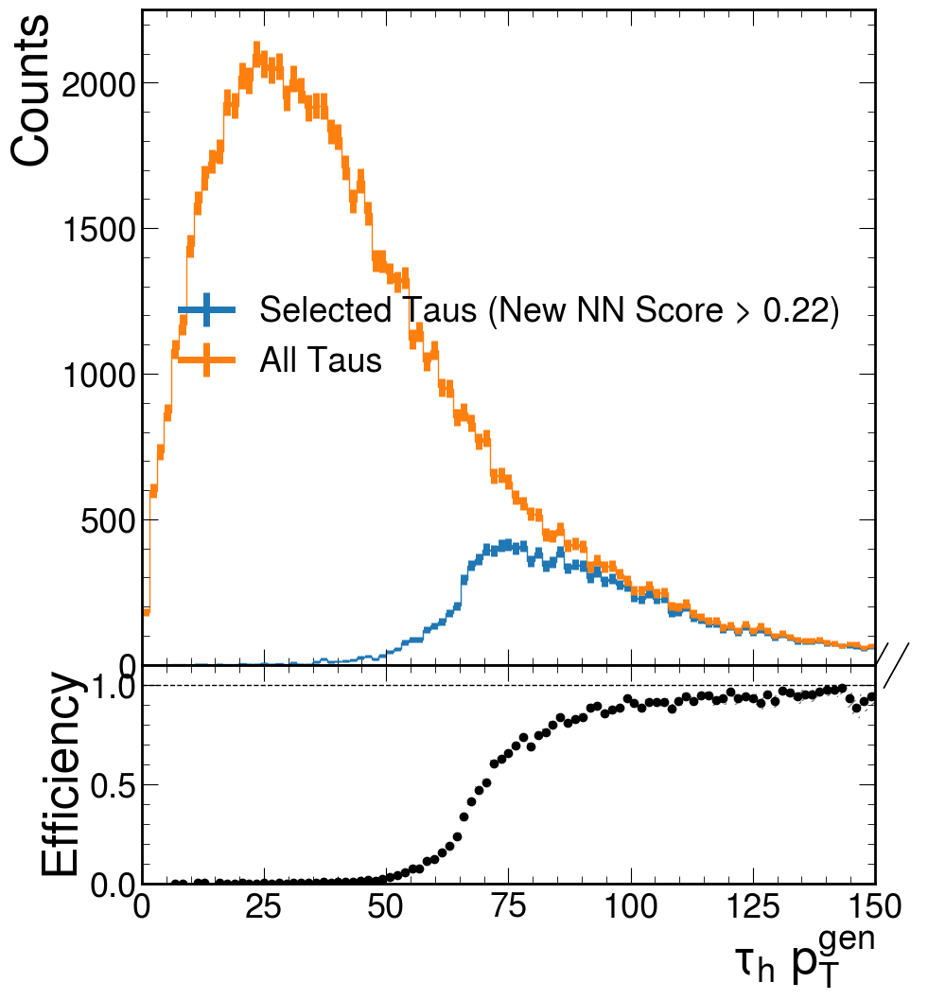

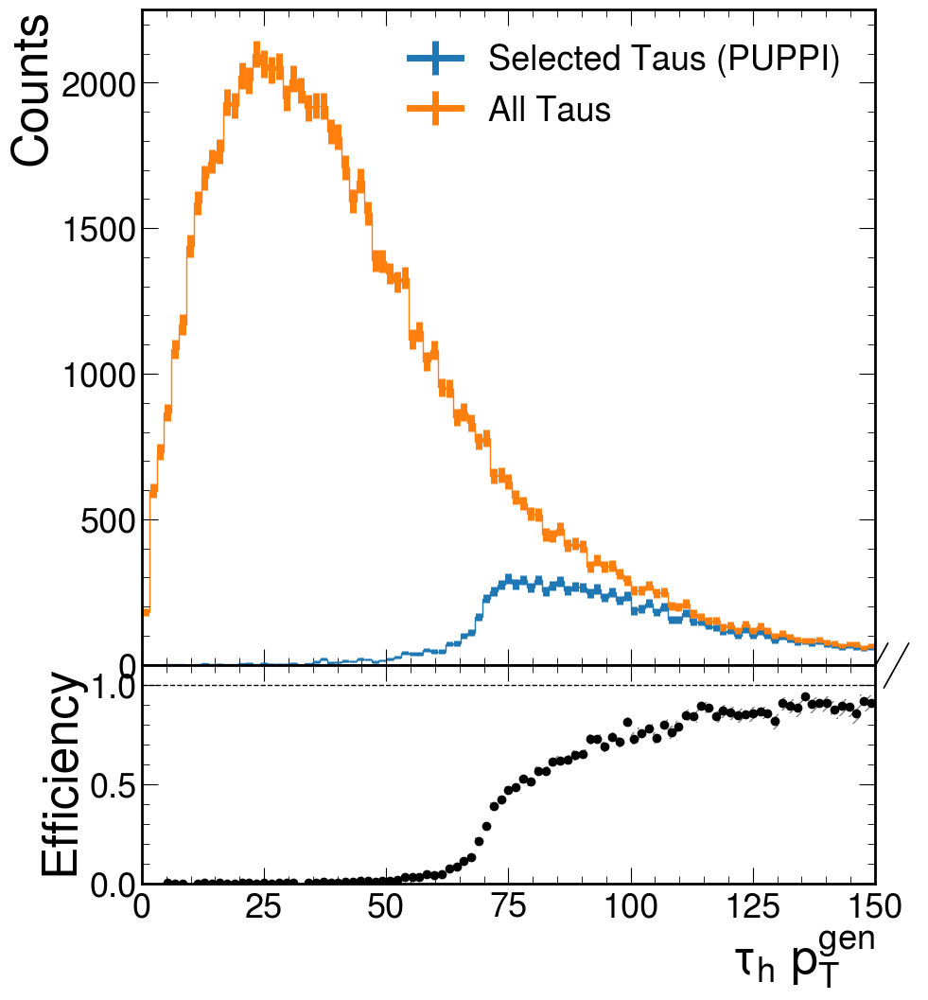

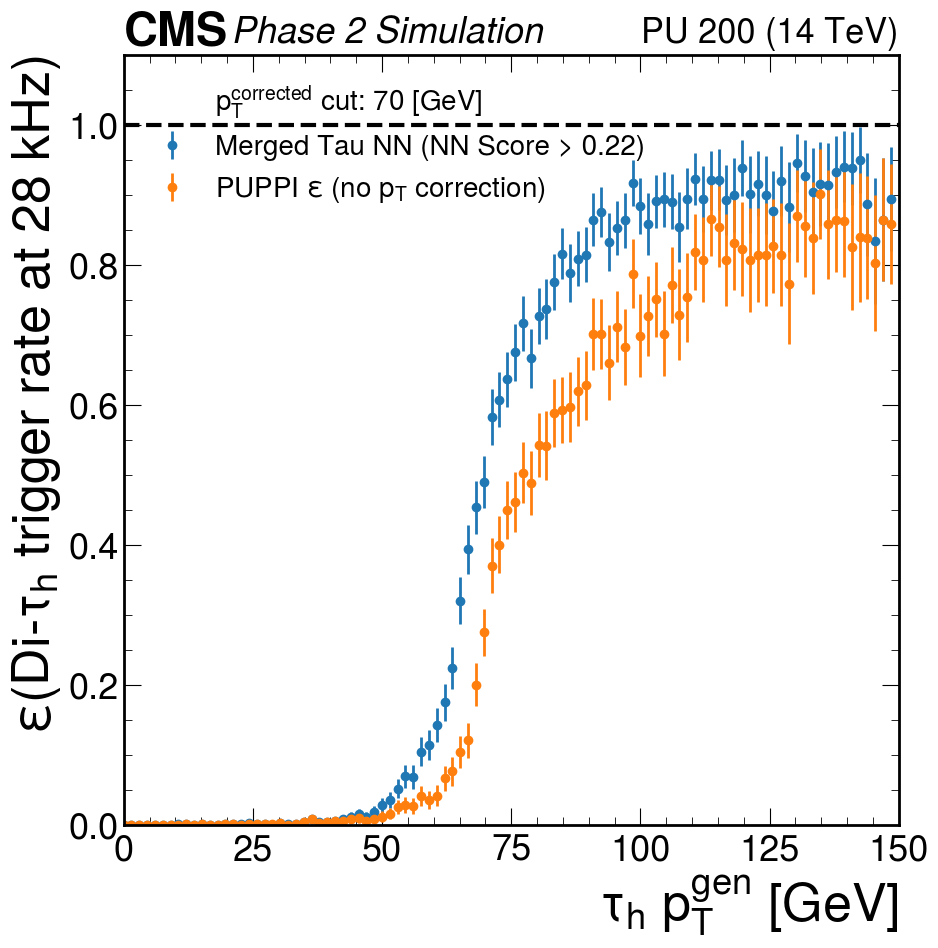

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.43249125e-02 9.45549777e-03 0.00000000e+00 2.15691153e-03
 3.11160482e-03 0.00000000e+00 1.03388694e-03 1.99328660e-04
 1.80208228e-04 1.92258869e-03 5.87471929e-04 5.58499251e-04
 2.65295321e-03 5.14218722e-04 1.46230298e-03 1.21660077e-04
 3.00988366e-03 4.65380715e-04 9.22610072e-04 4.61426983e-03
 9.71993495e-03 4.64090128e-03 5.11628857e-03 6.64423289e-03
 8.90023997e-03 1.36776484e-02 1.79741767e-02 1.21775793e-02
 2.11843814e-02 3.18804150e-02 4.01980568e-02 5.73511175e-02
 7.60656583e-02 7.59125534e-02 1.16233498e-01 1.24253531e-01
 1.56977047e-01 1.91273848e-01 2.47896418e-01 3.53906900e-01
 4.27432619e-01 5.02263958e-01 5.25180586e-01 6.25685486e-01
 6.55870746e-01 6.87623152e-01 7.20283811e-01 7.77989931e-01
 7.26014046e-01 7.87422827e-01 8.03570758e-01 8.14005477e-01
 8.71411390e-01 8.37976570e-01 8.78560389e-01 8.76304712e-01
 9.05275004e-01 9.14109055e-01 8.68967430e-01 9.08502527e-01
 9.04361221e-01 9.514786

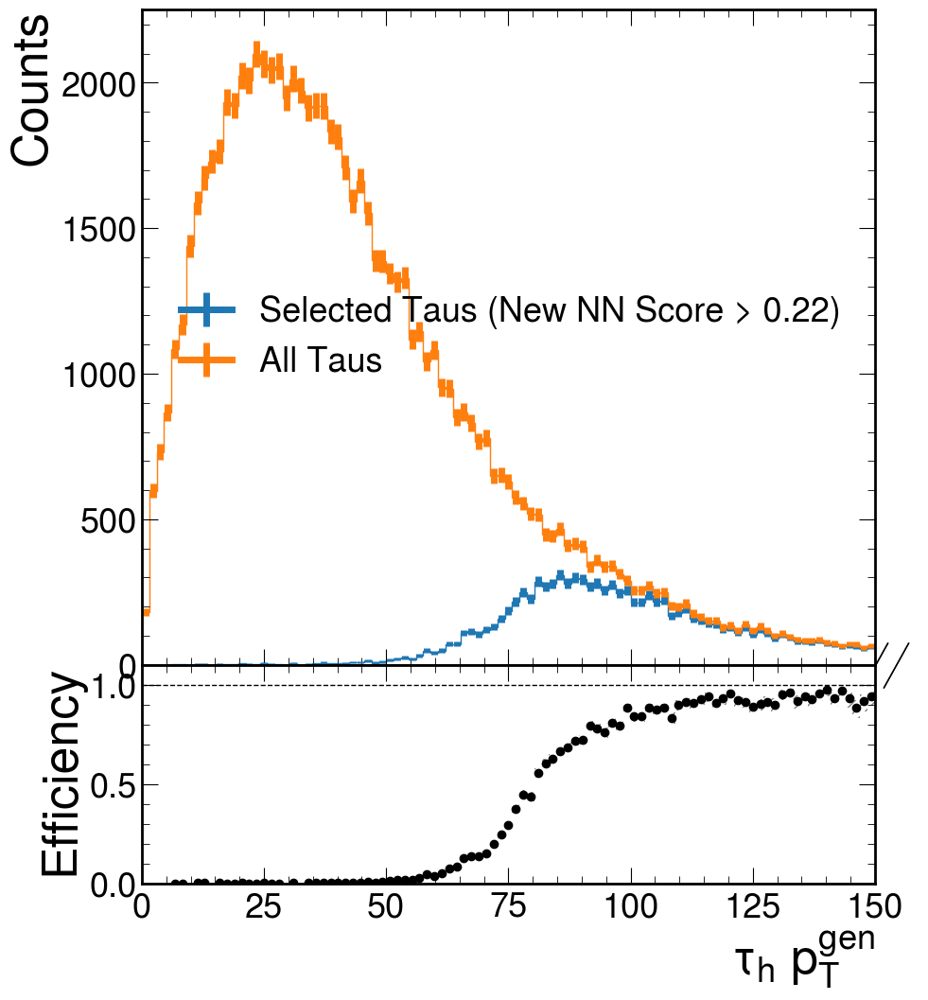

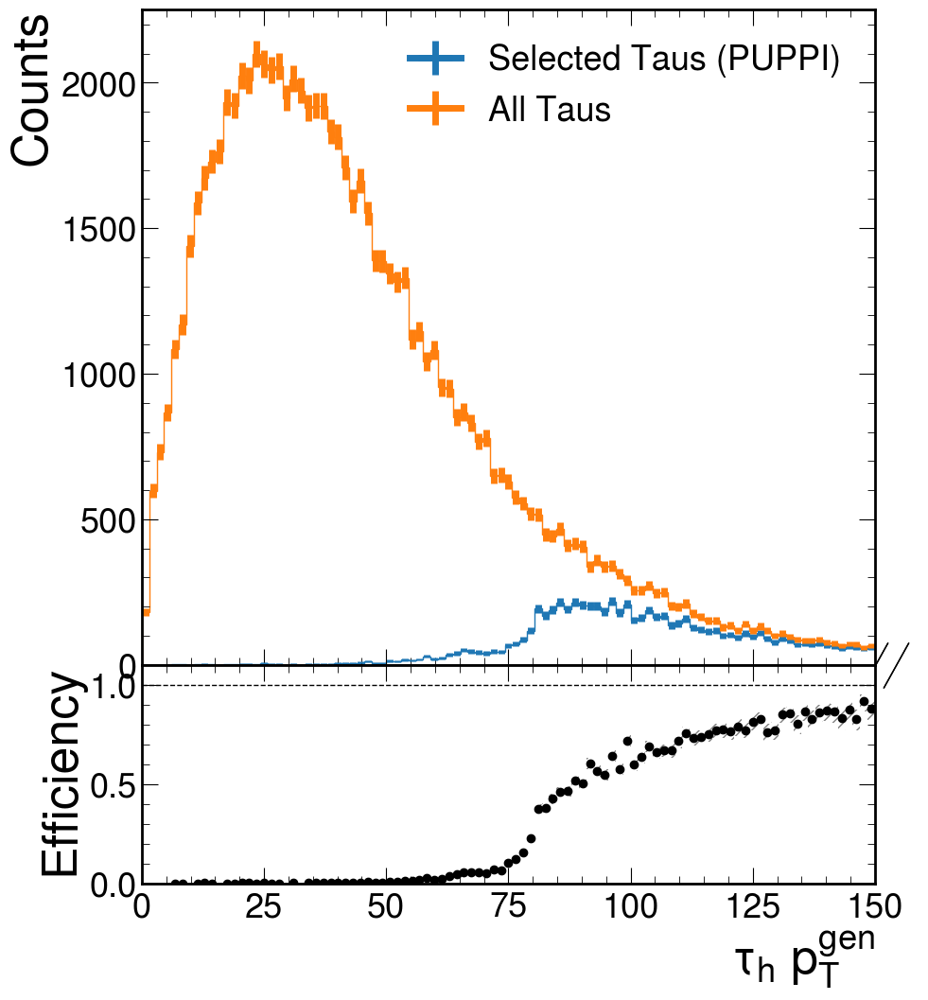

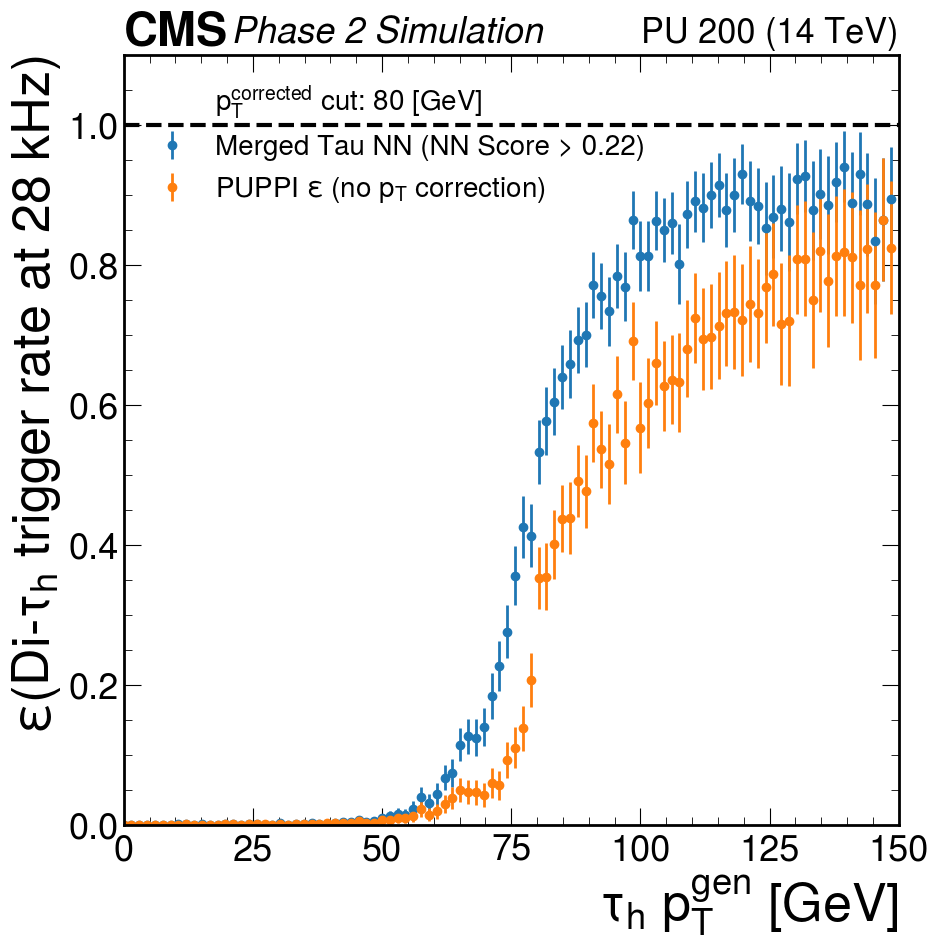

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.43249125e-02 9.45549777e-03 0.00000000e+00 2.15691153e-03
 3.11160482e-03 0.00000000e+00 1.03388694e-03 1.99328660e-04
 1.80208228e-04 1.92258869e-03 5.87471929e-04 1.36224450e-04
 2.08139806e-03 5.14218722e-04 1.21089465e-04 0.00000000e+00
 2.46585168e-03 0.00000000e+00 9.22610072e-04 1.39607827e-03
 2.92431330e-03 1.40411446e-03 1.37914096e-03 2.54670000e-03
 3.86516934e-03 4.32659210e-03 7.82781367e-03 3.66307329e-03
 5.72839456e-03 1.02568821e-02 1.41558103e-02 1.68112700e-02
 1.53935259e-02 2.57262905e-02 4.40957589e-02 3.41133433e-02
 4.87631169e-02 7.35895152e-02 8.18832690e-02 1.26309934e-01
 1.37396074e-01 1.37751796e-01 1.49793878e-01 1.98040909e-01
 2.44789569e-01 2.98326610e-01 3.79474351e-01 4.62338532e-01
 4.49948248e-01 5.76652645e-01 6.29935825e-01 6.34670281e-01
 6.83445936e-01 6.99708238e-01 7.52204981e-01 7.53338656e-01
 8.07580729e-01 7.88977899e-01 7.65620539e-01 8.36060645e-01
 8.05391850e-01 8.971427

In [8]:
# ============================================================ QUANTIZED NN


results = plot_pt_eff_puppi(model_merged_quantized,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=0.,
                            cut_point = 0.22)
no_cut_x = np.asarray(results[0])
no_cut_y = np.asarray(results[1])


threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
gen_pT_list = []
for i in threshold_list:
    result = plot_pt_eff_puppi(model_merged_quantized,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=i,
                            cut_point = 0.22)
    cut_x = np.asarray(result[0])
    cut_y = np.asarray(result[1])
    y_norm = np.divide(cut_y, no_cut_y)
    print(y_norm)
    for i in range(10):
        if y_norm[i] == 1:
            y_norm[i] = 0
        else:
            break
    gen_pT_list.append(cut_x[y_norm > 0.95][0])
#gen_pT_list = [cut(i) for i in threshold_list]
gen_pT_list_quantized = gen_pT_list


1905/1905 [==============================] - 3s 1ms/step


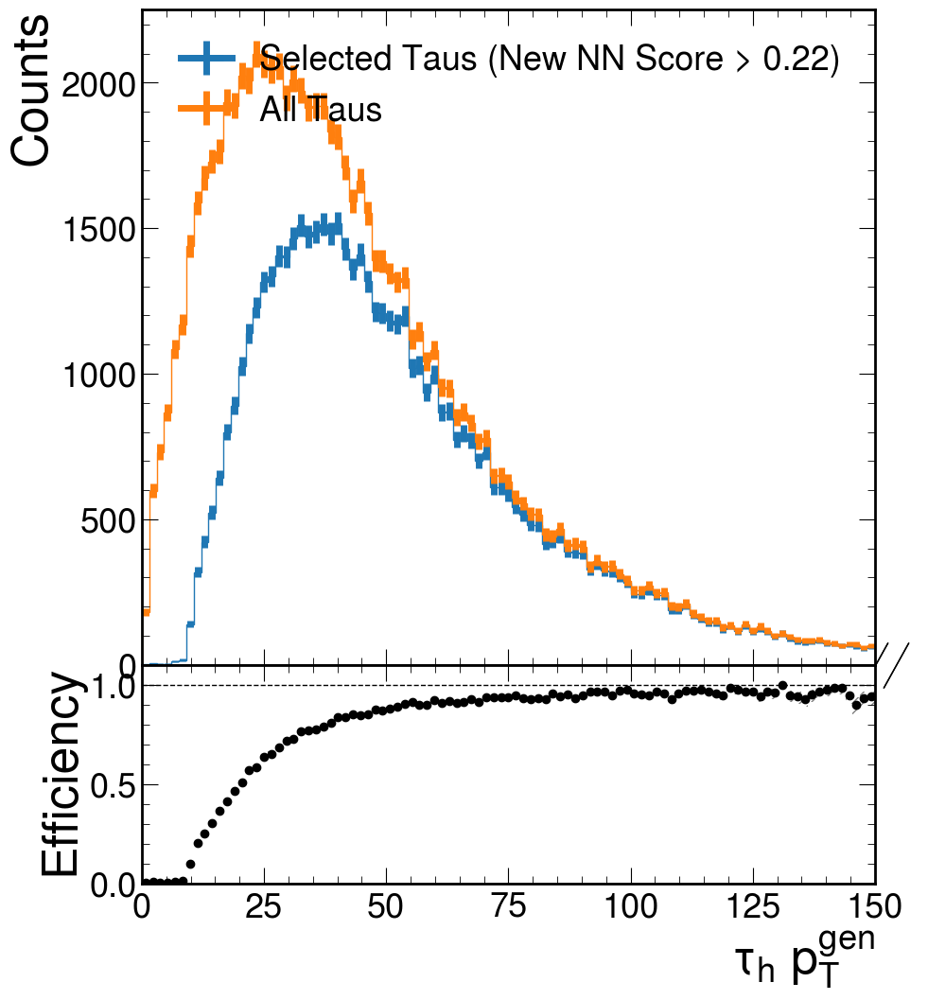

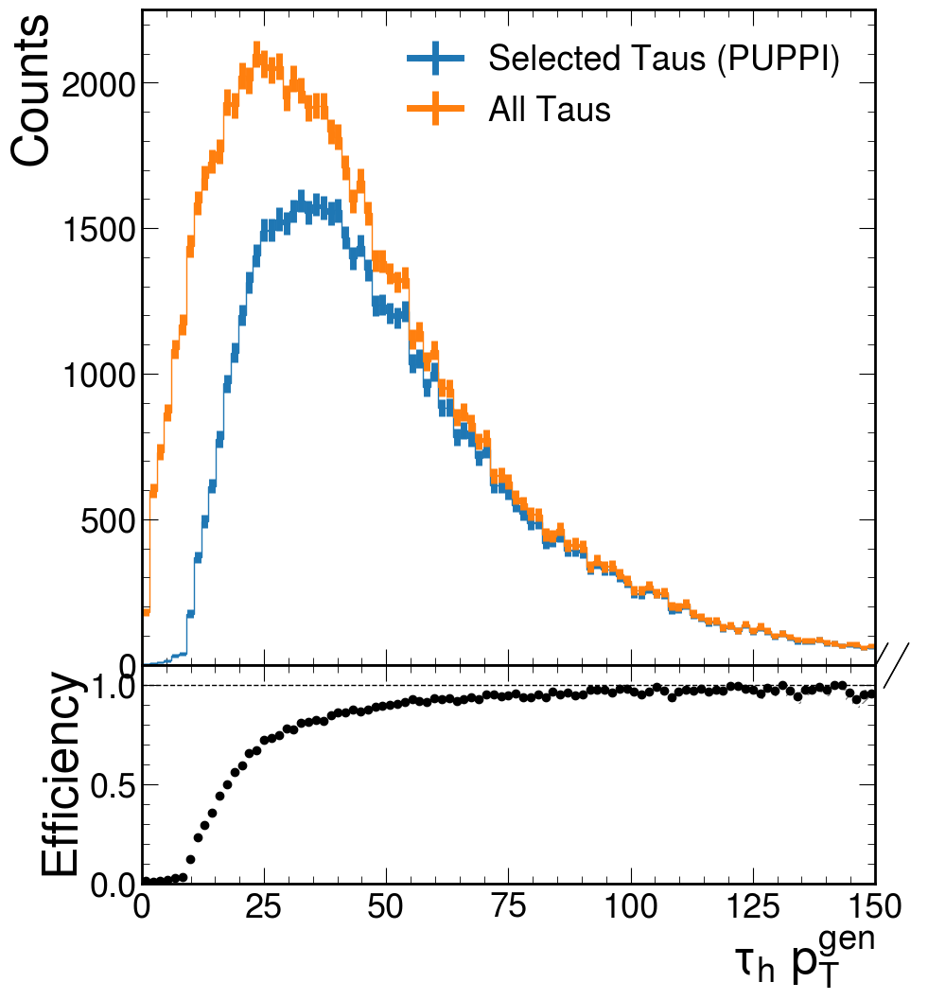

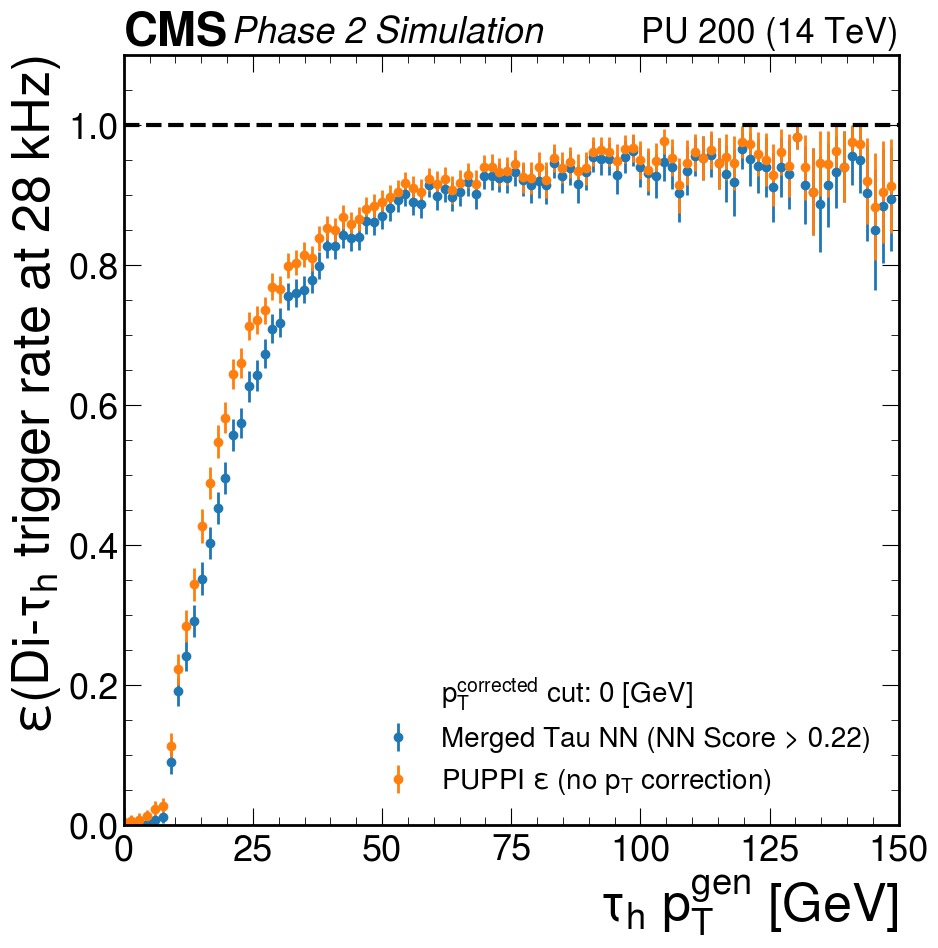

1847/1847 [==============================] - 3s 1ms/step


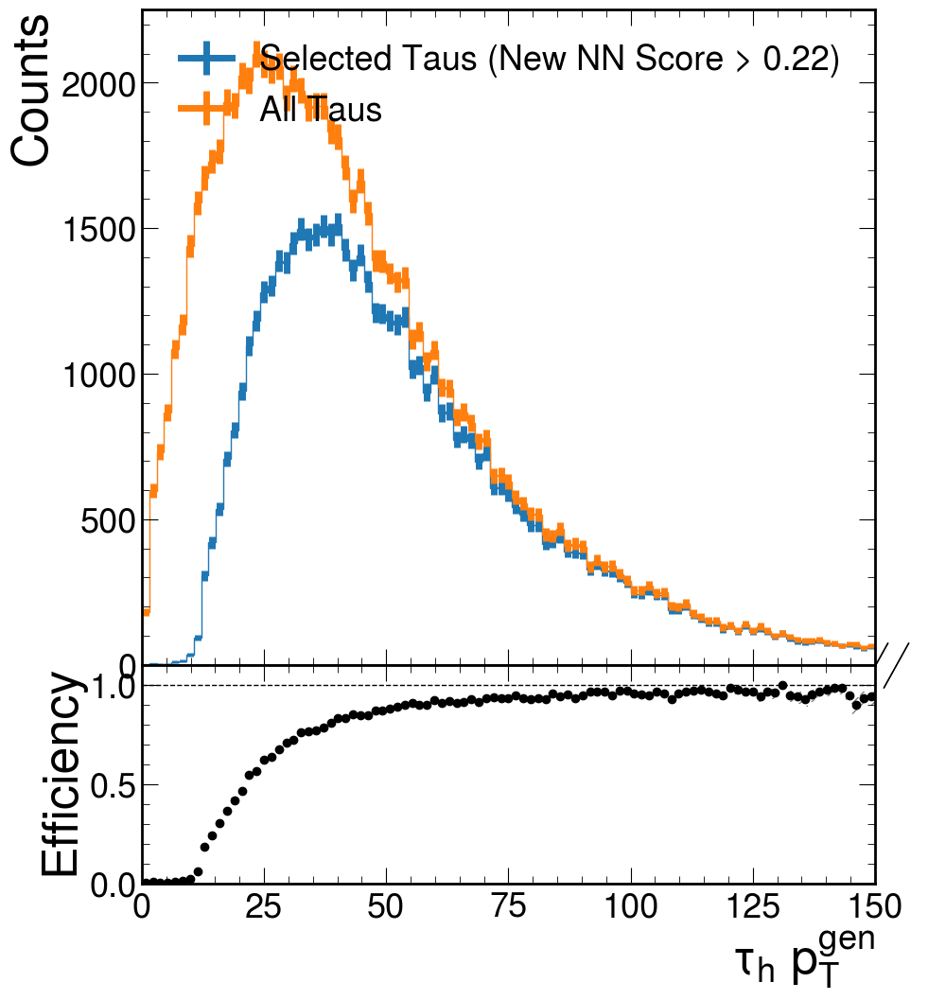

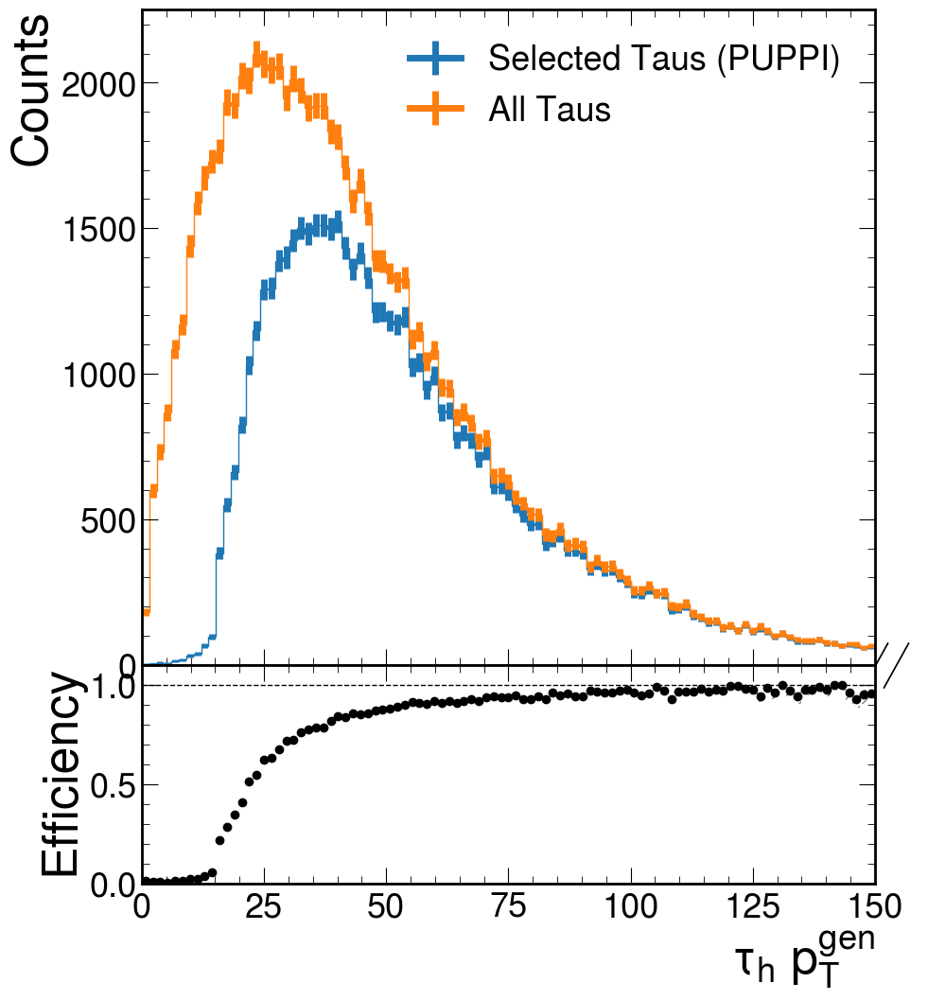

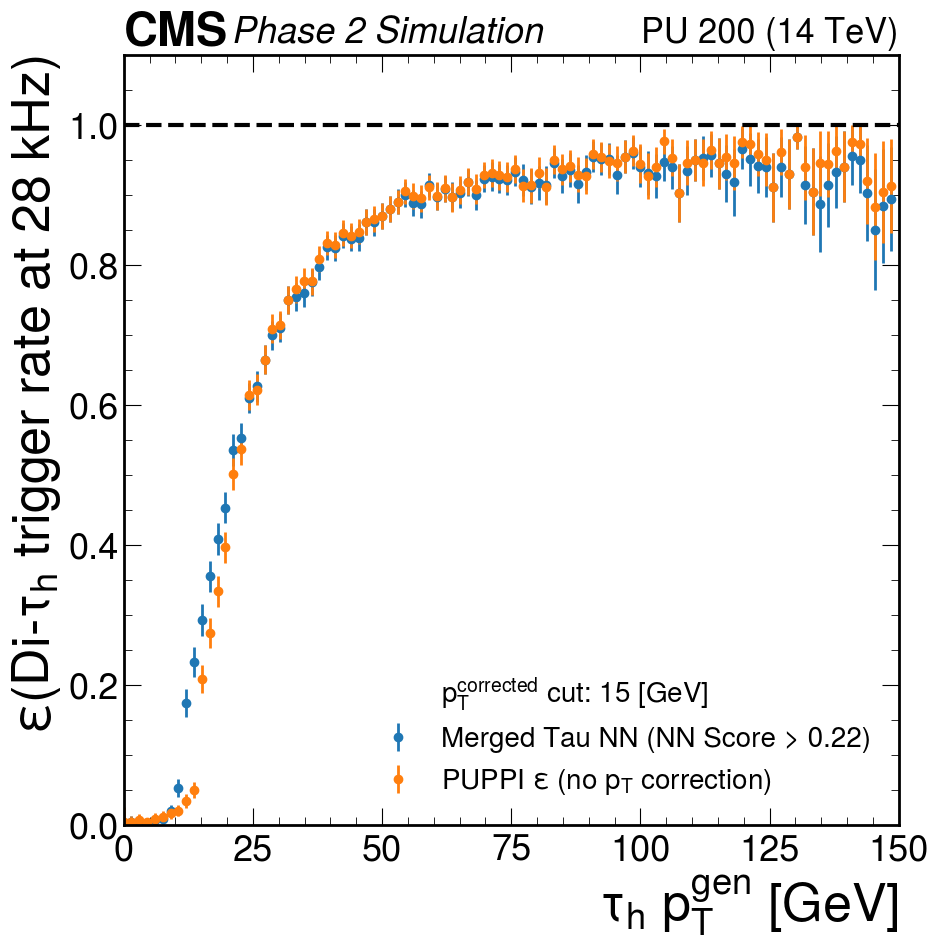

[1.         1.         1.         1.         0.89092692 0.78388593
 0.2195035  0.27606161 0.72029728 0.79811385 0.83069488 0.88113111
 0.90246493 0.91435573 0.96139897 0.96168325 0.97355346 0.9754555
 0.987612   0.98608555 0.98949652 0.99251607 0.99232352 0.99309061
 0.9959202  0.99791231 0.99727729 0.99710885 0.99847373 0.99853174
 0.99921354 0.99742476 0.99913807 1.         0.99910745 0.99738052
 0.99896601 0.99796253 1.         1.         0.99878007 1.
 1.         0.99732812 1.         0.9984798  0.99559092 0.99822445
 0.99823026 0.99815922 1.         1.         0.99774618 0.99773496
 1.         1.         1.         0.99714667 1.         1.
 1.         1.         1.         1.         1.         0.99581916
 1.         1.         1.         1.         1.         1.
 1.         0.9941563  1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.        

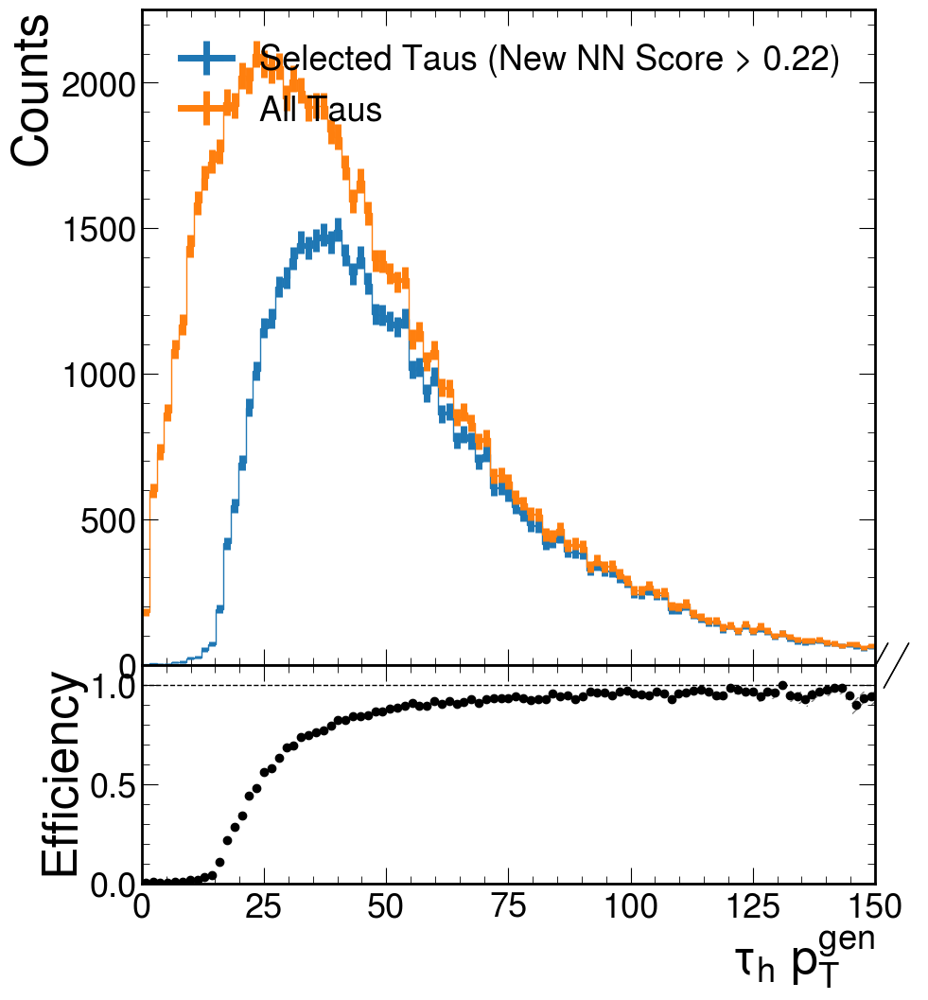

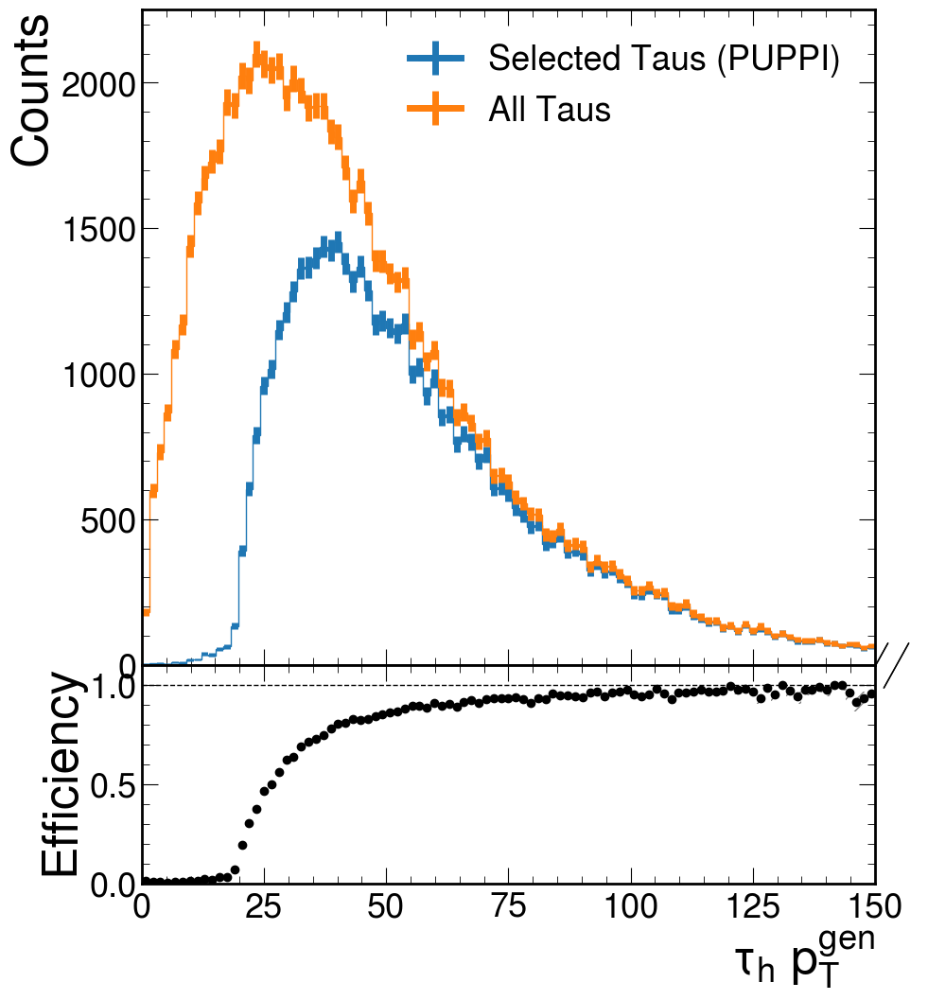

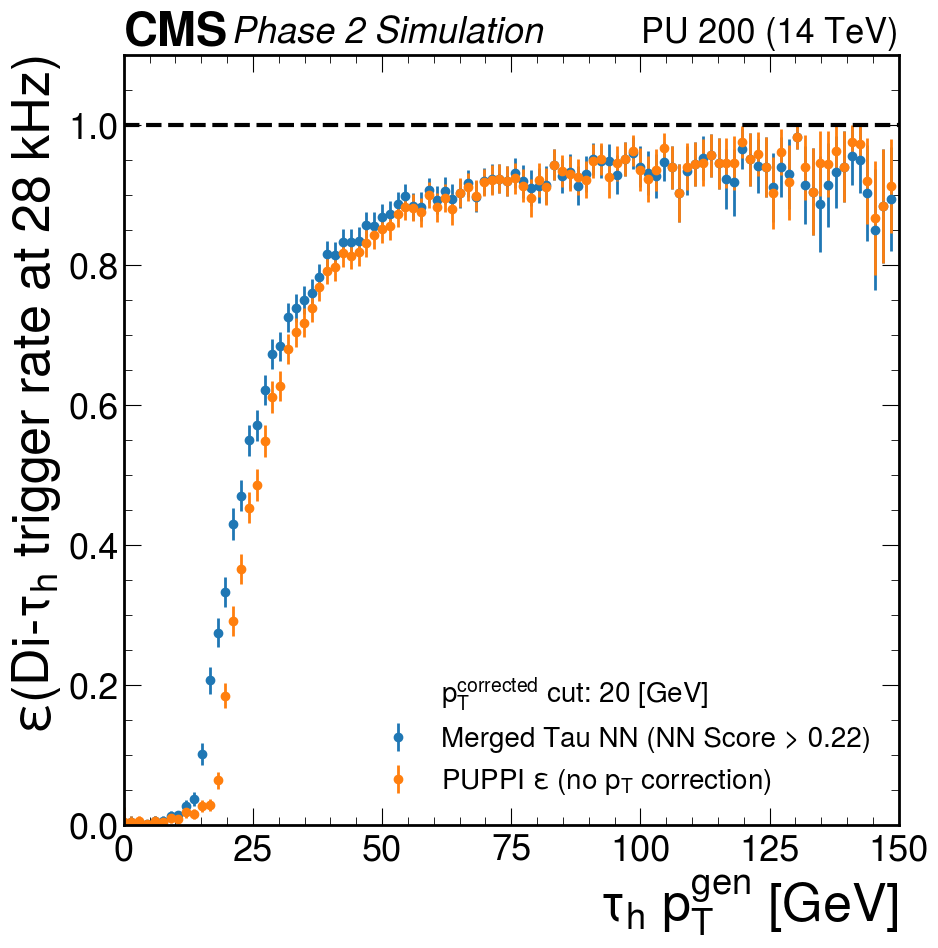

[1.         1.         1.         0.51784426 0.78294596 0.57205345
 0.14192975 0.06921304 0.10882045 0.12456019 0.28822143 0.51252113
 0.60659962 0.67029564 0.77162921 0.81874046 0.87649942 0.88893148
 0.92284387 0.94804486 0.95242166 0.95989271 0.97210084 0.97997016
 0.97621542 0.97913704 0.9857131  0.98410808 0.98779694 0.99266096
 0.99371017 0.9931348  0.99396873 0.99823671 0.99108086 0.99301786
 0.99586569 0.99287277 0.99662833 0.99258657 0.99390432 0.99756819
 0.99588916 0.99732812 0.99861421 0.99544159 0.99119089 0.99467839
 0.99823026 0.99632015 0.99798833 0.99790174 0.99549473 0.99321273
 1.         0.99736389 1.         0.99430032 0.99716859 0.99711405
 0.99648042 0.99670472 0.99647538 1.         0.99616655 0.99581916
 1.         1.         1.         1.         1.         1.
 1.         0.98837452 1.         1.         1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.     

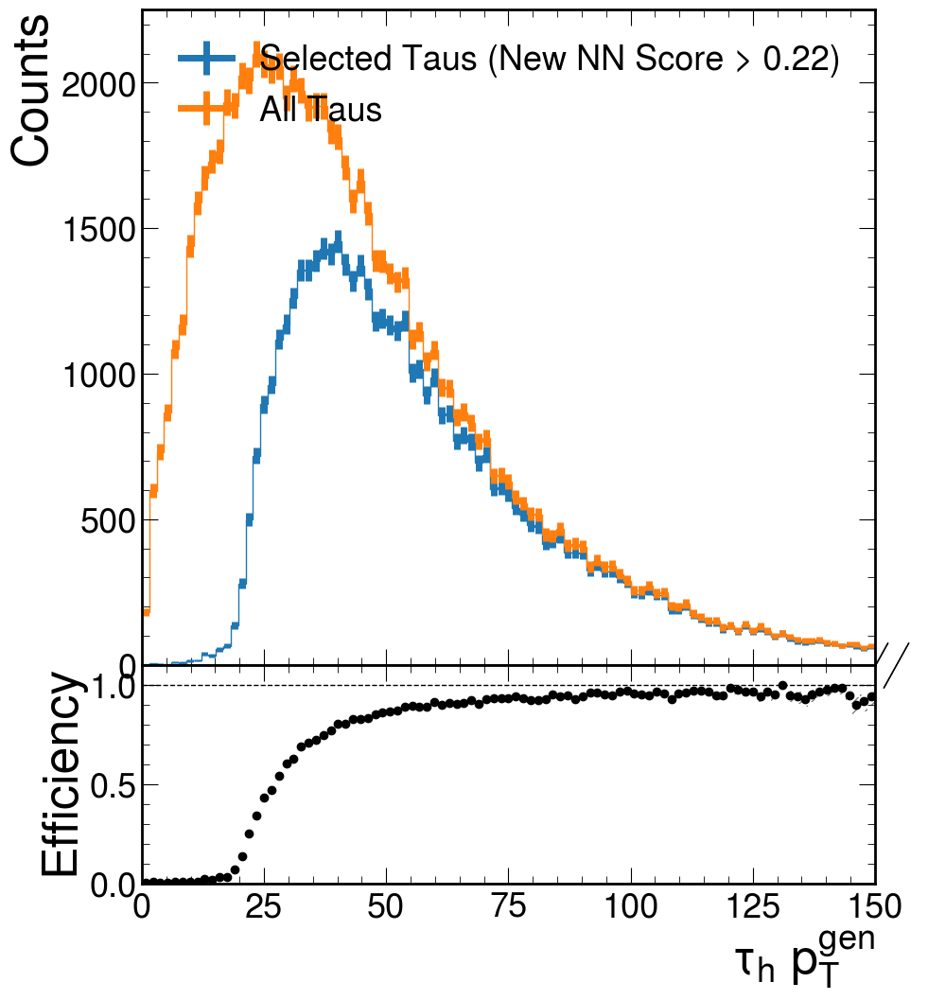

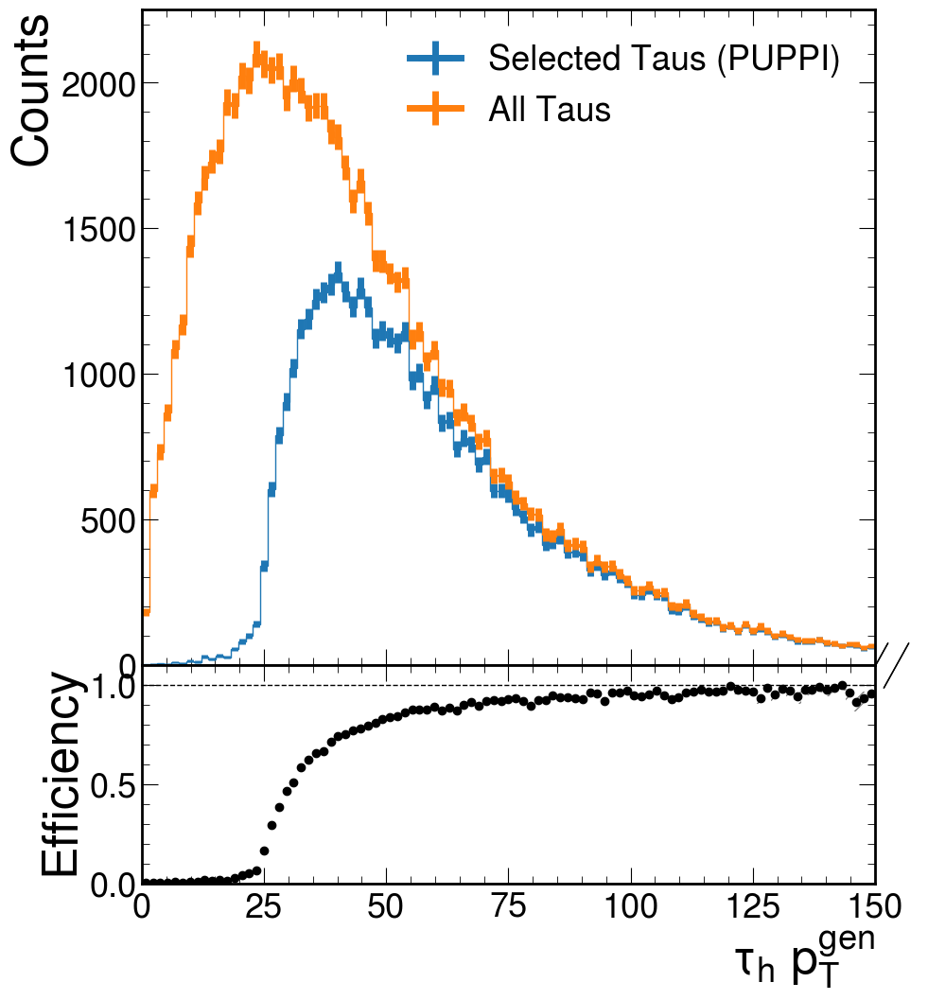

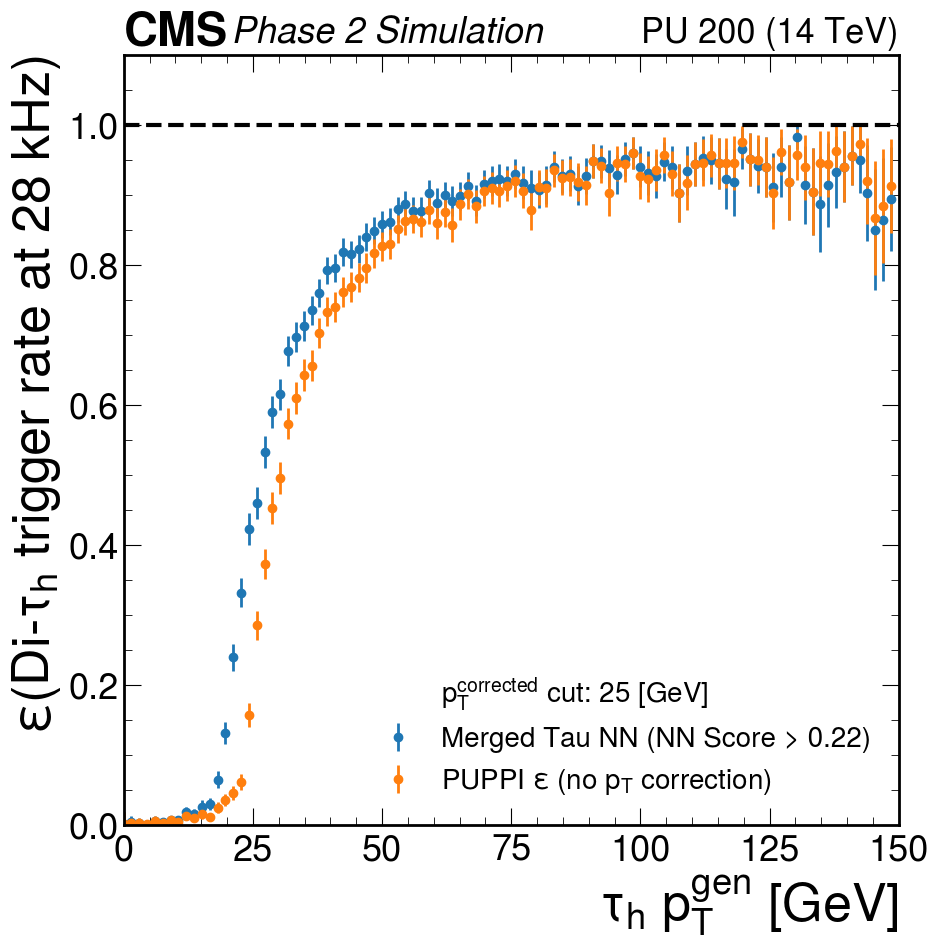

[1.         1.         1.         0.12628835 0.67625066 0.36670292
 0.0801472  0.03691837 0.0744386  0.05243834 0.07385803 0.07214303
 0.14244824 0.26354943 0.42947409 0.57809114 0.67469652 0.71577457
 0.79153882 0.8320661  0.85683351 0.89615027 0.91781062 0.93170951
 0.94432705 0.95136498 0.95786832 0.96175153 0.97028187 0.97213976
 0.97957315 0.97257715 0.98536124 0.98590708 0.9786164  0.98517445
 0.98348769 0.98575603 0.98877044 0.98835768 0.98903469 0.9902835
 0.99315119 0.99332437 0.99446135 0.98937349 0.98679925 0.99113873
 0.99823026 0.99632015 0.99597928 0.99580575 0.99549473 0.98644769
 1.         0.99473461 1.         0.99146051 0.99716859 0.99423437
 0.99297905 0.99670472 0.98599411 1.         0.99616655 0.99581916
 1.         1.         1.         1.         1.         1.
 1.         0.98837452 1.         0.99228906 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 1.         1.         1.         1.
 1.         1.      

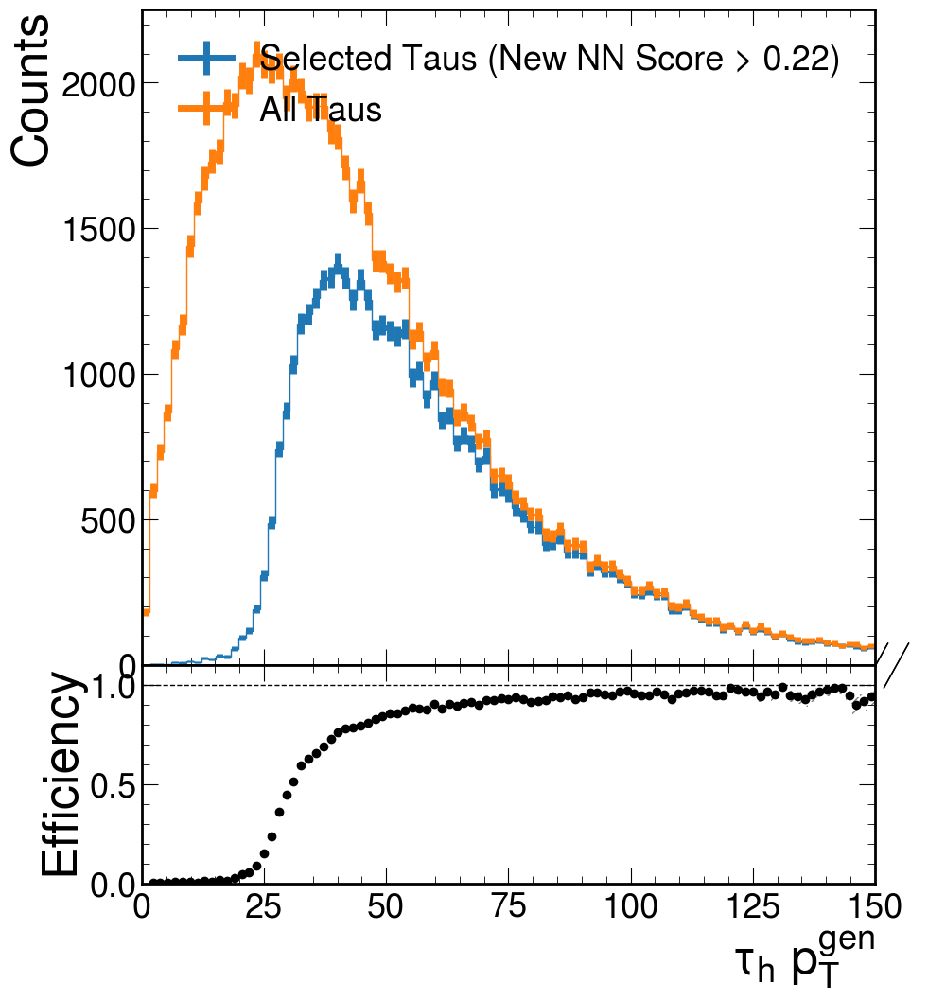

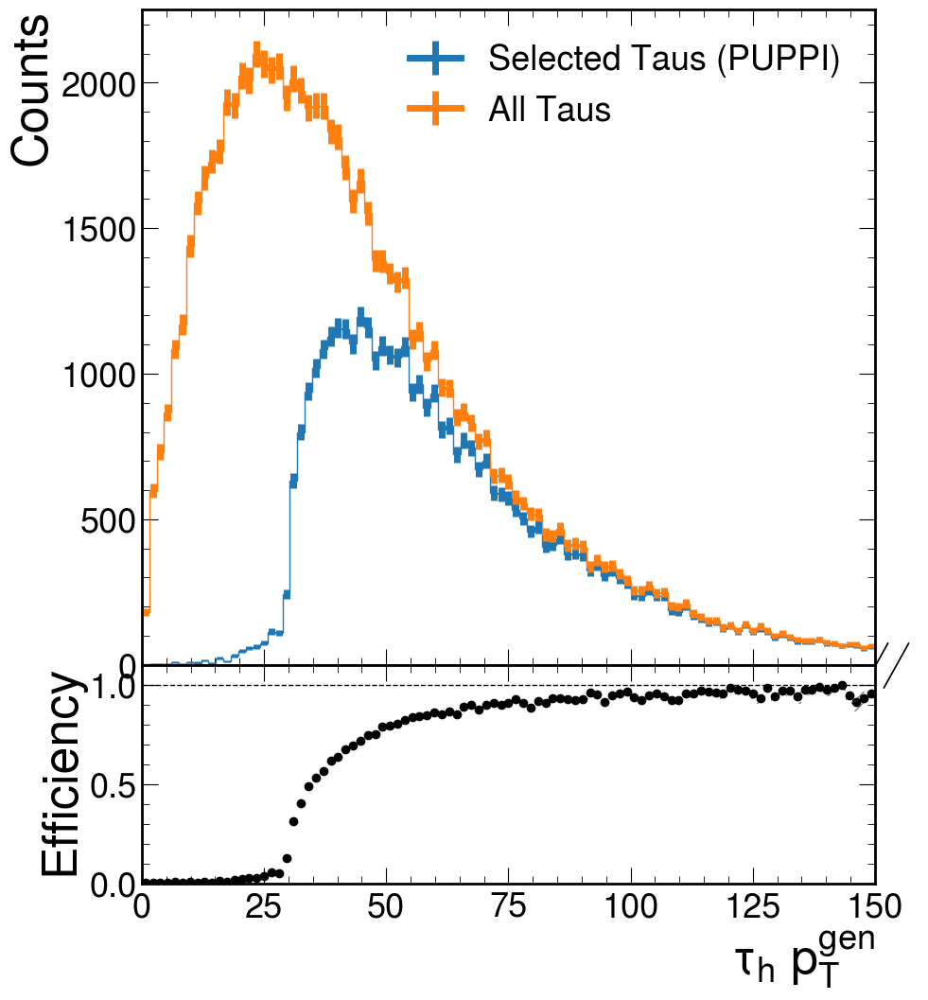

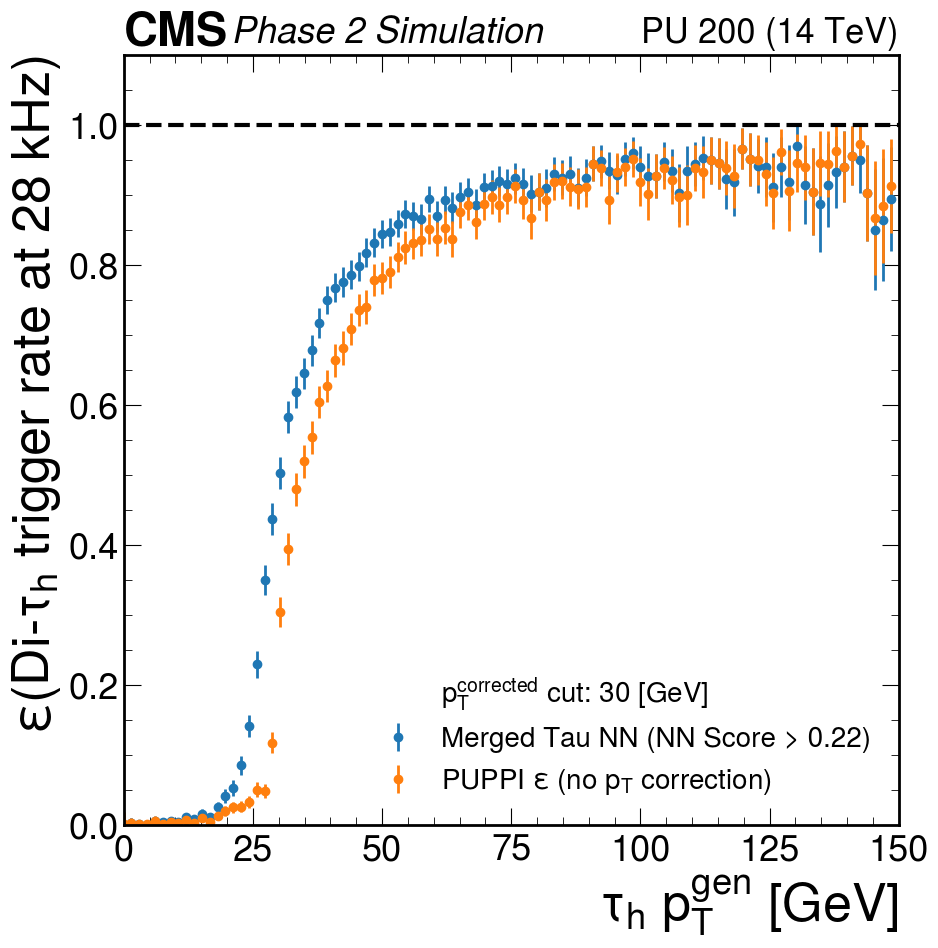

[0.         0.65541447 0.51782509 0.12628835 0.67625066 0.36670292
 0.0601542  0.01728443 0.0451981  0.027422   0.04256246 0.02809957
 0.05489458 0.08235521 0.09451795 0.14764922 0.22490769 0.35713483
 0.51899344 0.61663133 0.69983424 0.77185527 0.81376937 0.84373997
 0.87057043 0.89664882 0.9064005  0.92792871 0.92017246 0.93704633
 0.9505733  0.94695063 0.96559935 0.97008638 0.96173763 0.96170855
 0.96806185 0.97763451 0.97644683 0.97886047 0.96718858 0.98301376
 0.98221868 0.99199083 0.98479563 0.98180298 0.98241539 0.98407705
 0.99469551 0.99081272 0.98996679 0.99371194 0.98651117 0.98419723
 0.99474384 0.98427762 0.9974961  0.99146051 0.9943415  0.9913606
 0.98949402 0.99670472 0.9825267  1.         0.99616655 0.99581916
 1.         0.99529509 1.         1.         0.99519305 1.
 1.         0.98837452 1.         0.99228906 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 0.98631808 1.         1.         1.
 1.         1.      

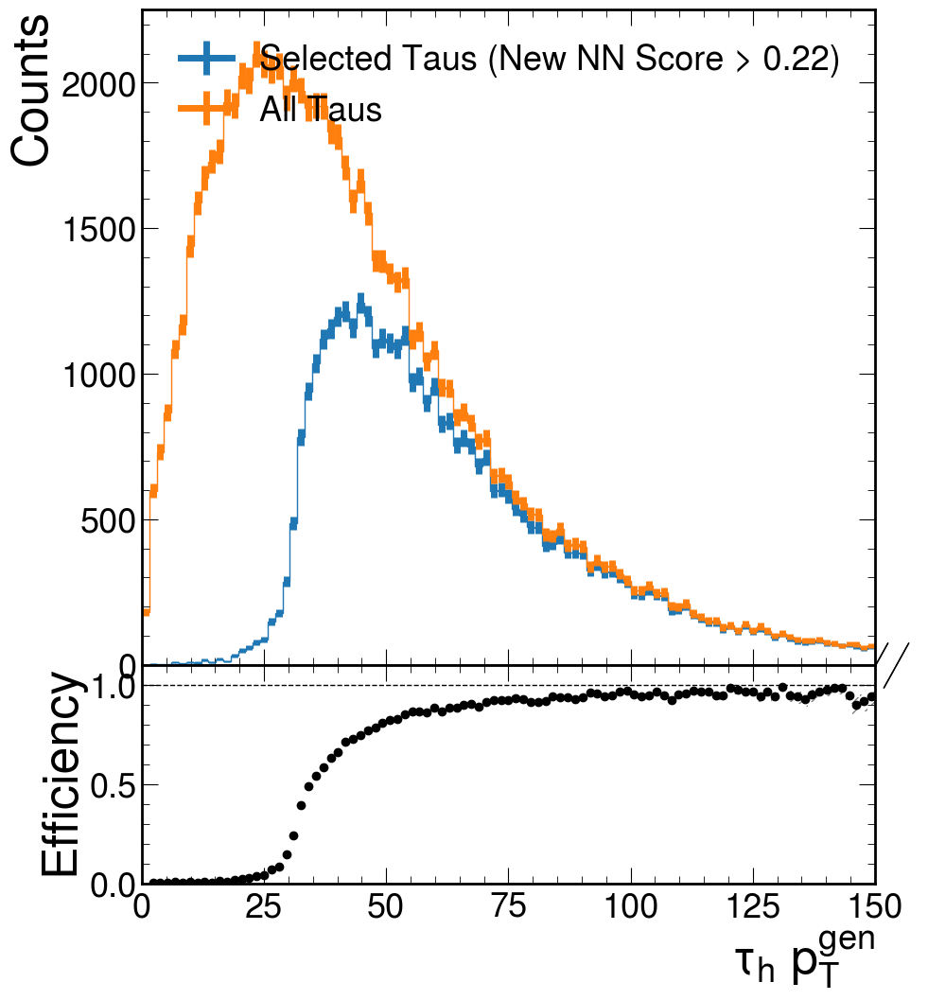

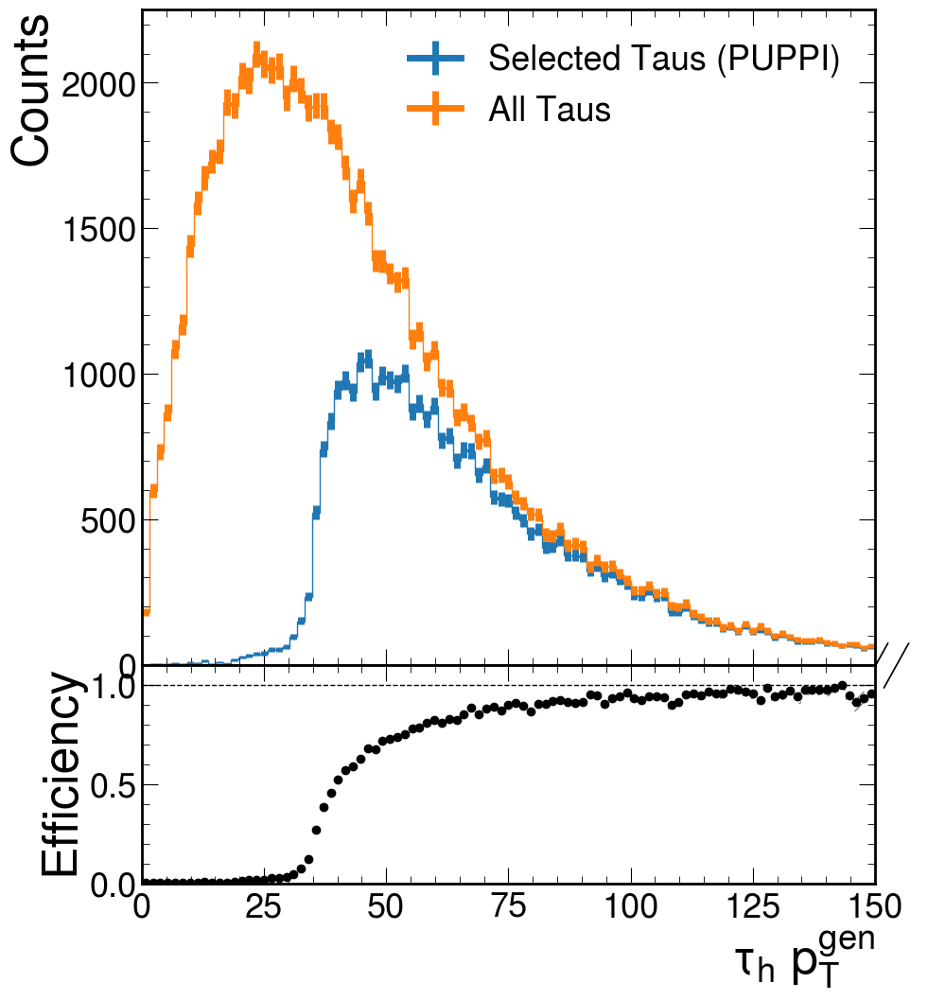

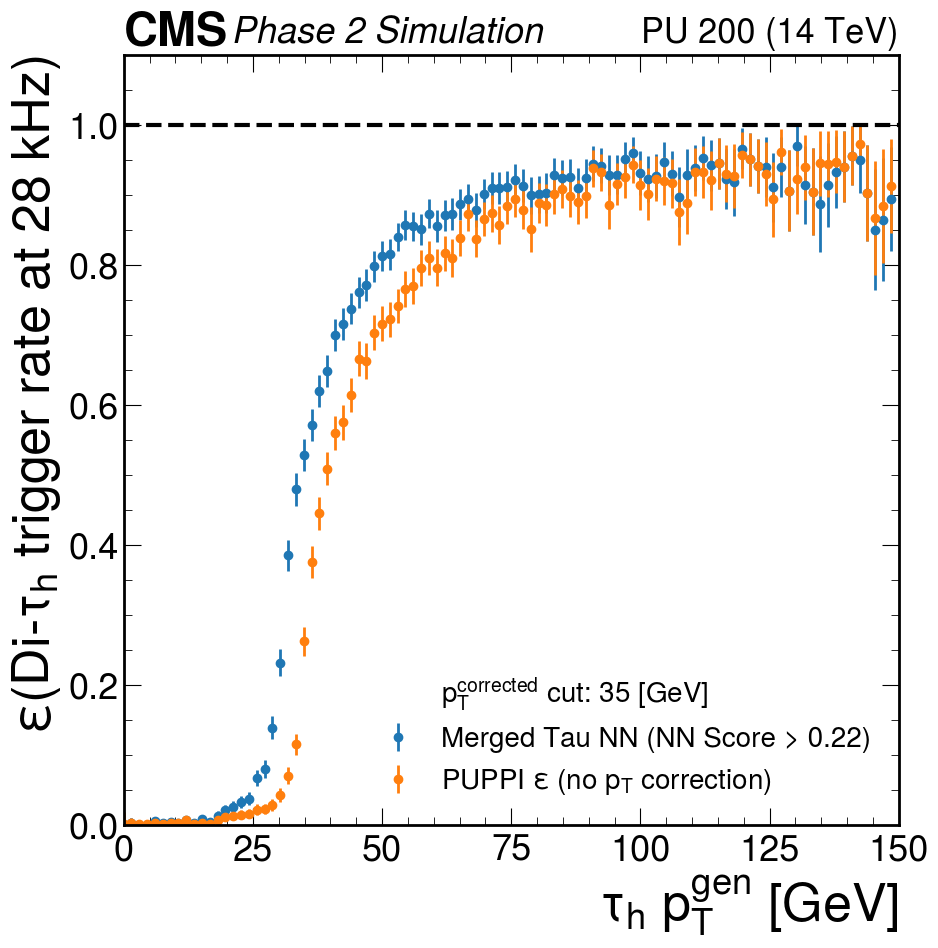

[0.         0.65541447 0.12627732 0.12628835 0.67625066 0.17304374
 0.04709923 0.01459726 0.02983411 0.01039359 0.02511225 0.01104208
 0.02829783 0.04103305 0.04607098 0.05600892 0.05949608 0.10384546
 0.11871556 0.19590734 0.32258229 0.50952952 0.63095148 0.69052316
 0.73449563 0.77527817 0.78376003 0.84619352 0.84836447 0.87948579
 0.90603302 0.89334413 0.92620311 0.93328991 0.92543904 0.94091935
 0.95063296 0.96041439 0.95968501 0.9557345  0.95147029 0.95887412
 0.97267611 0.98001091 0.97378609 0.97424747 0.97221392 0.98055439
 0.98412585 0.98714876 0.9879672  0.99162025 0.98427048 0.97970271
 0.98688464 0.9816767  0.9974961  0.98579904 0.9943415  0.9913606
 0.98949402 0.99015457 0.97562522 1.         0.99616655 0.99581916
 0.99060893 0.9906106  1.         1.         0.99041157 0.99394582
 0.9938117  0.98264463 1.         0.98470307 1.         0.99184219
 1.         1.         1.         1.         1.         1.
 1.         0.97458786 0.98631808 1.         1.         1.
 1.         

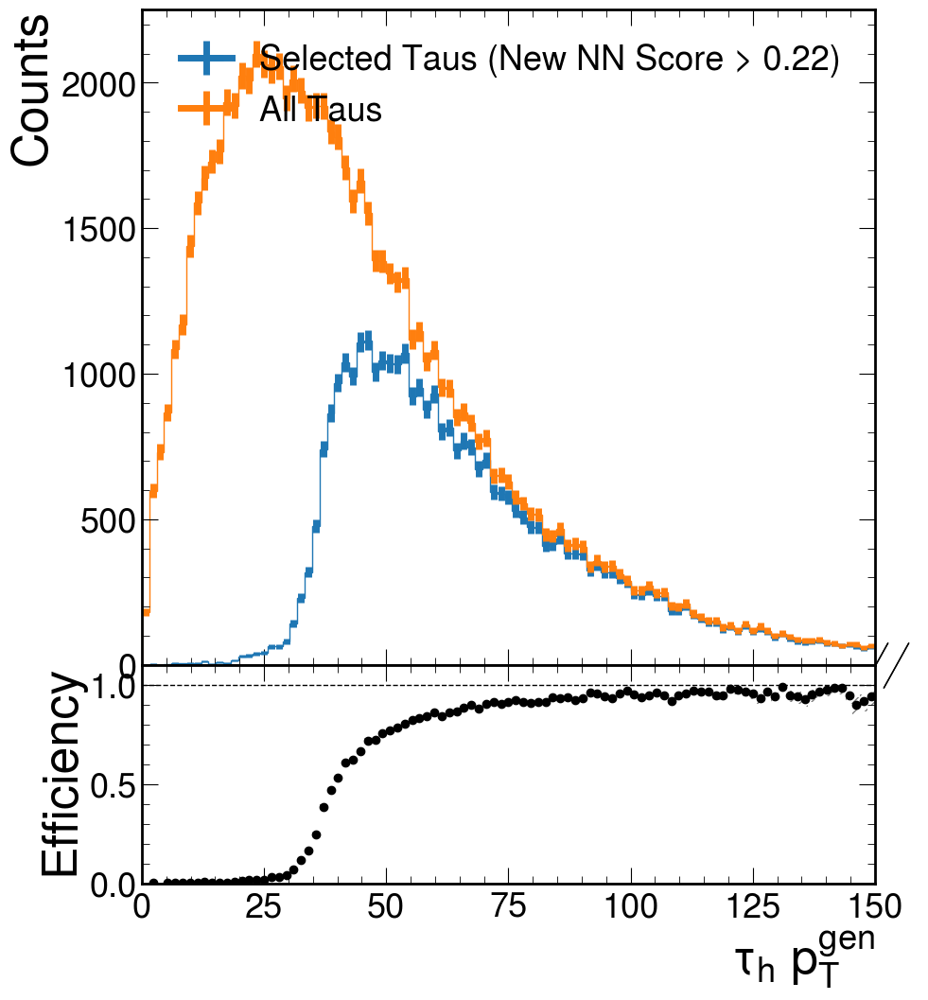

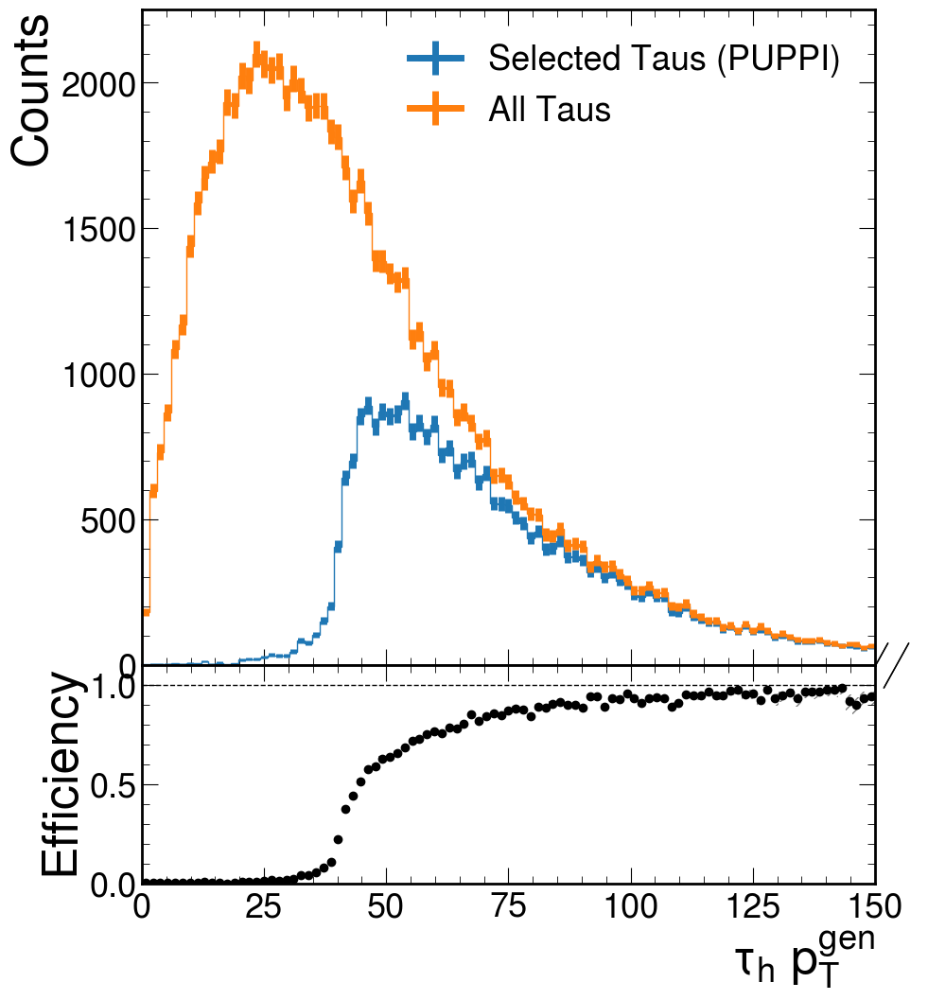

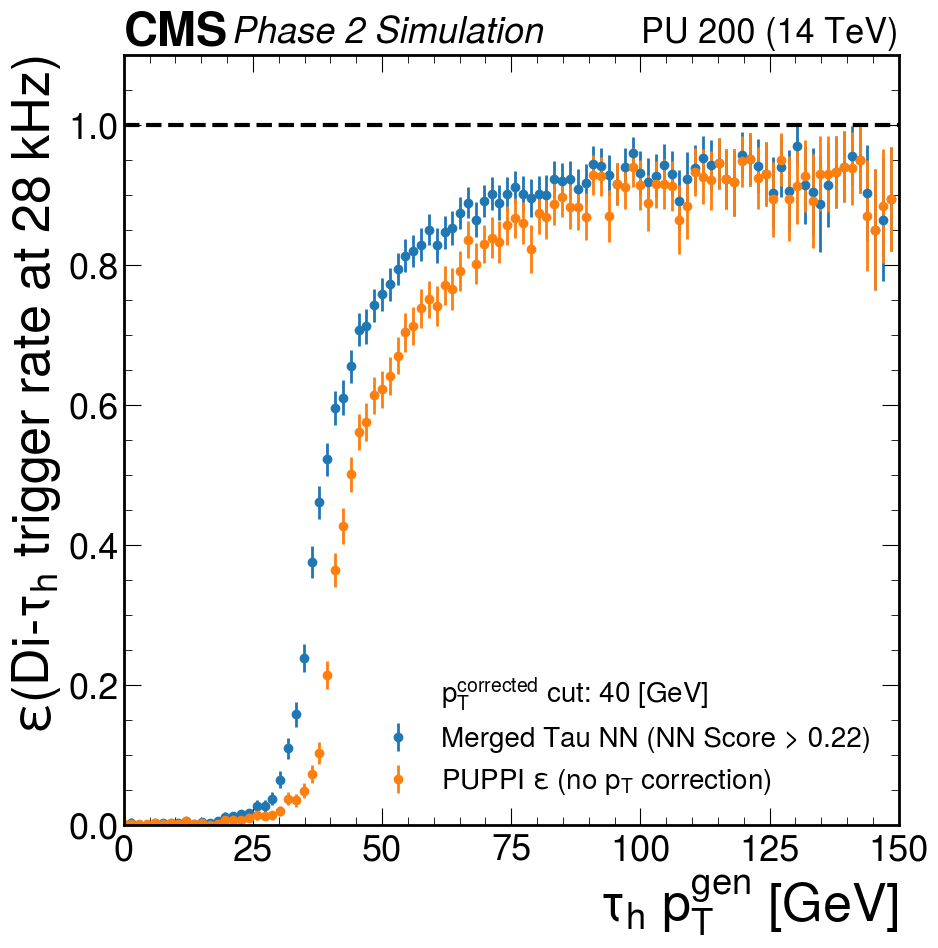

[0.         0.65541447 0.         0.12628835 0.3670415  0.17304374
 0.02814627 0.00938213 0.01915775 0.0027155  0.009767   0.00465505
 0.01286865 0.02360067 0.02283664 0.02573608 0.02610831 0.04206205
 0.0398904  0.05231625 0.08972173 0.14478562 0.20757286 0.31189138
 0.48168111 0.57659008 0.63107443 0.71996691 0.72358423 0.78085318
 0.8421954  0.82475248 0.8614129  0.8713878  0.87696122 0.88917227
 0.9016676  0.92107396 0.93517885 0.93062454 0.92135809 0.93245612
 0.94958003 0.96674174 0.96829452 0.95917693 0.96059683 0.97176932
 0.961373   0.97619006 0.97601244 0.97911092 0.97979494 0.97970271
 0.98427109 0.97648891 0.99249997 0.98297671 0.99151856 0.98277171
 0.98949402 0.99015457 0.97562522 0.98609993 0.98479065 0.99581916
 0.99060893 0.98594472 1.         0.99511761 0.99041157 0.9879145
 0.98766565 0.98264463 1.         0.98470307 1.         0.99184219
 1.         0.99032501 1.         1.         0.98912741 0.99052591
 1.         0.97458786 0.98631808 1.         1.         1.
 1. 

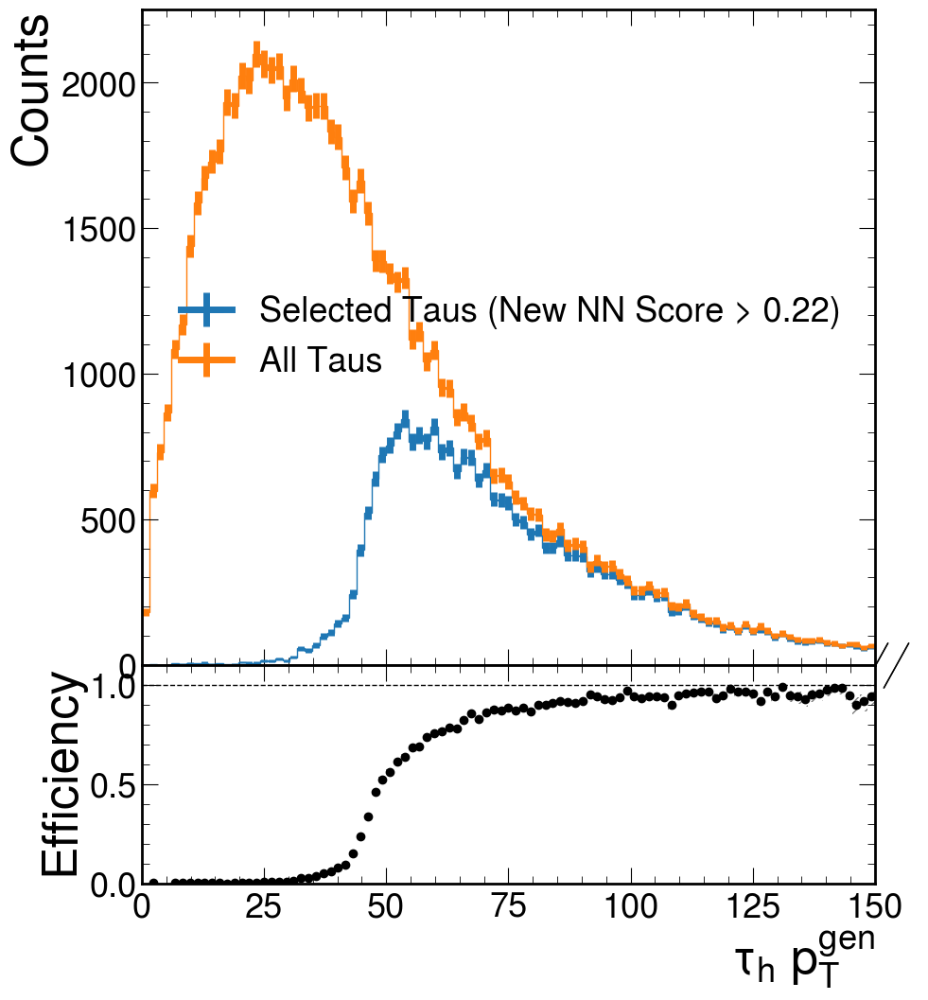

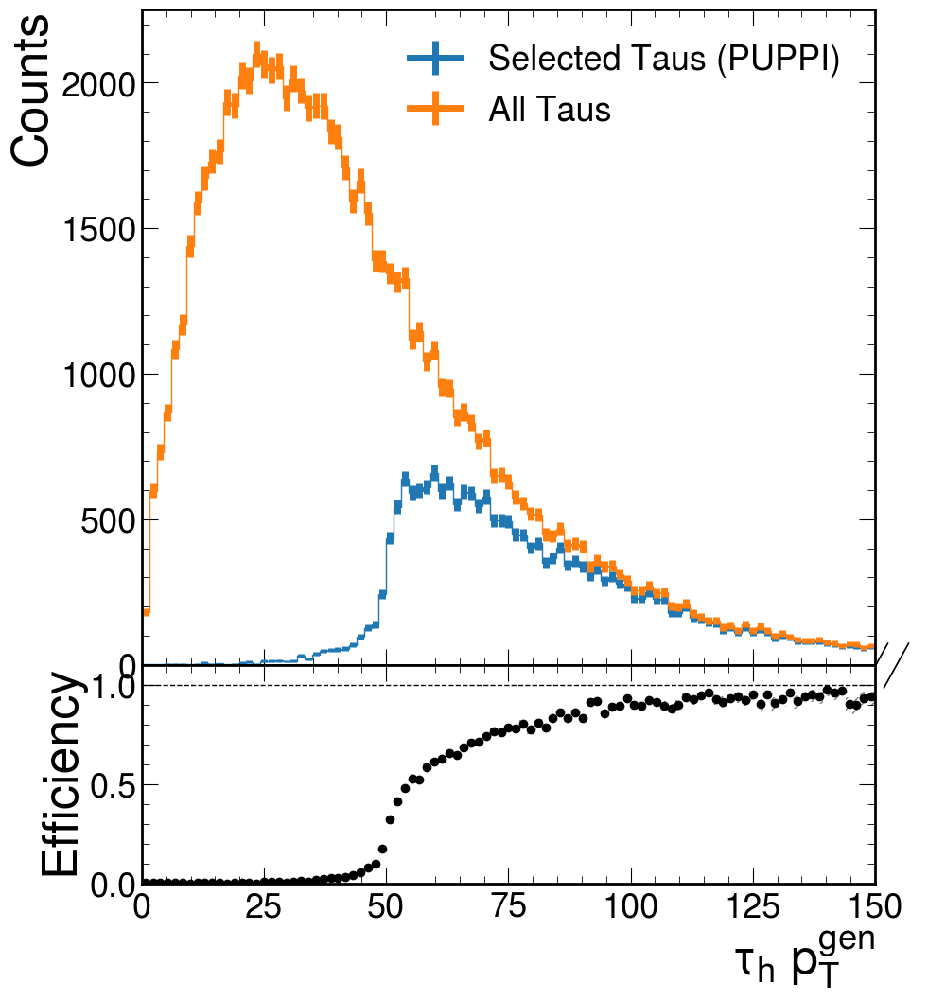

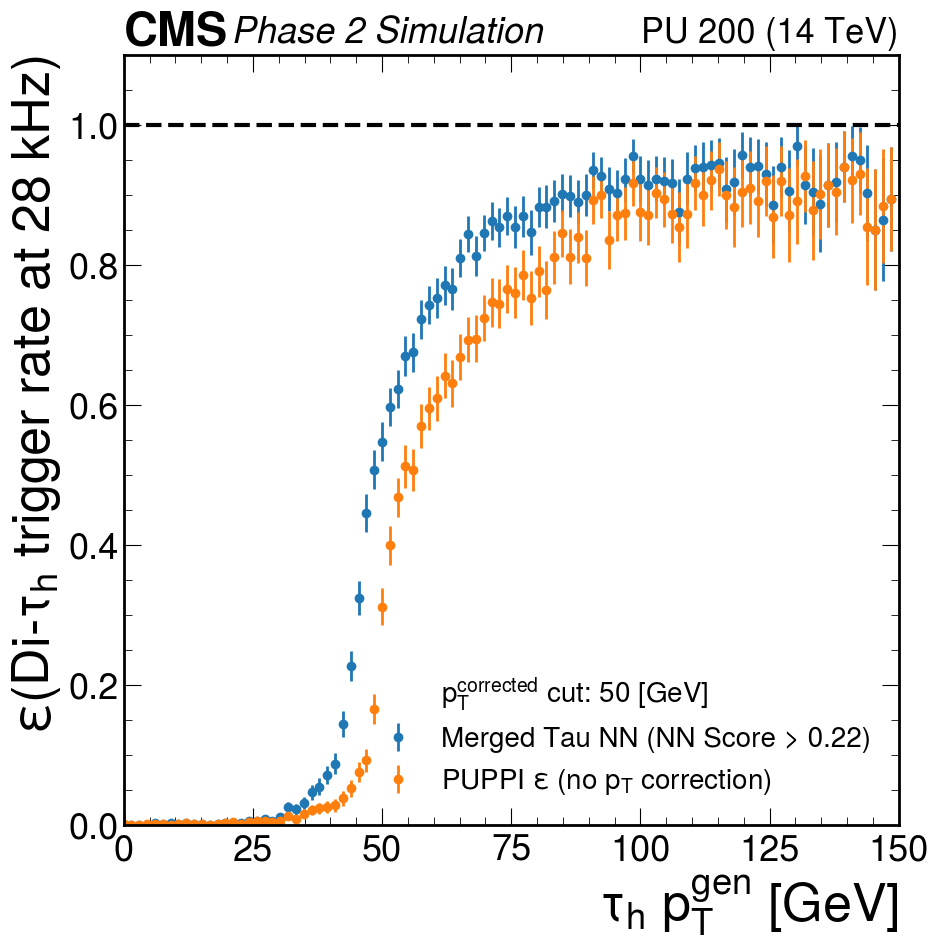

[0.00000000e+00 8.27538798e-02 0.00000000e+00 0.00000000e+00
 2.69490839e-01 1.13428470e-01 2.20818901e-02 6.88883666e-03
 1.09422189e-02 1.40634223e-03 3.36242935e-03 2.22054818e-04
 8.15295355e-04 6.04128873e-03 3.95993497e-03 3.67172055e-03
 7.97685513e-03 7.20162820e-03 1.19058204e-02 7.47441324e-03
 1.45189443e-02 3.26436720e-02 2.89716227e-02 4.01564980e-02
 5.91472075e-02 6.82398584e-02 8.63918194e-02 1.05351030e-01
 1.70279104e-01 2.70138267e-01 3.85603885e-01 5.16378621e-01
 5.88865195e-01 6.28866177e-01 6.77798514e-01 6.97028789e-01
 7.43182710e-01 7.58309651e-01 8.14754035e-01 8.12474522e-01
 8.37653747e-01 8.49069593e-01 8.52661770e-01 8.95657080e-01
 9.19183626e-01 9.00811529e-01 9.11603668e-01 9.29942933e-01
 9.23212234e-01 9.41752641e-01 9.15077826e-01 9.43973171e-01
 9.26573464e-01 9.59571266e-01 9.66052556e-01 9.43129440e-01
 9.72648730e-01 9.57783036e-01 9.71860800e-01 9.65718176e-01
 9.79122353e-01 9.73967599e-01 9.55137489e-01 9.72323564e-01
 9.66138531e-01 9.916750

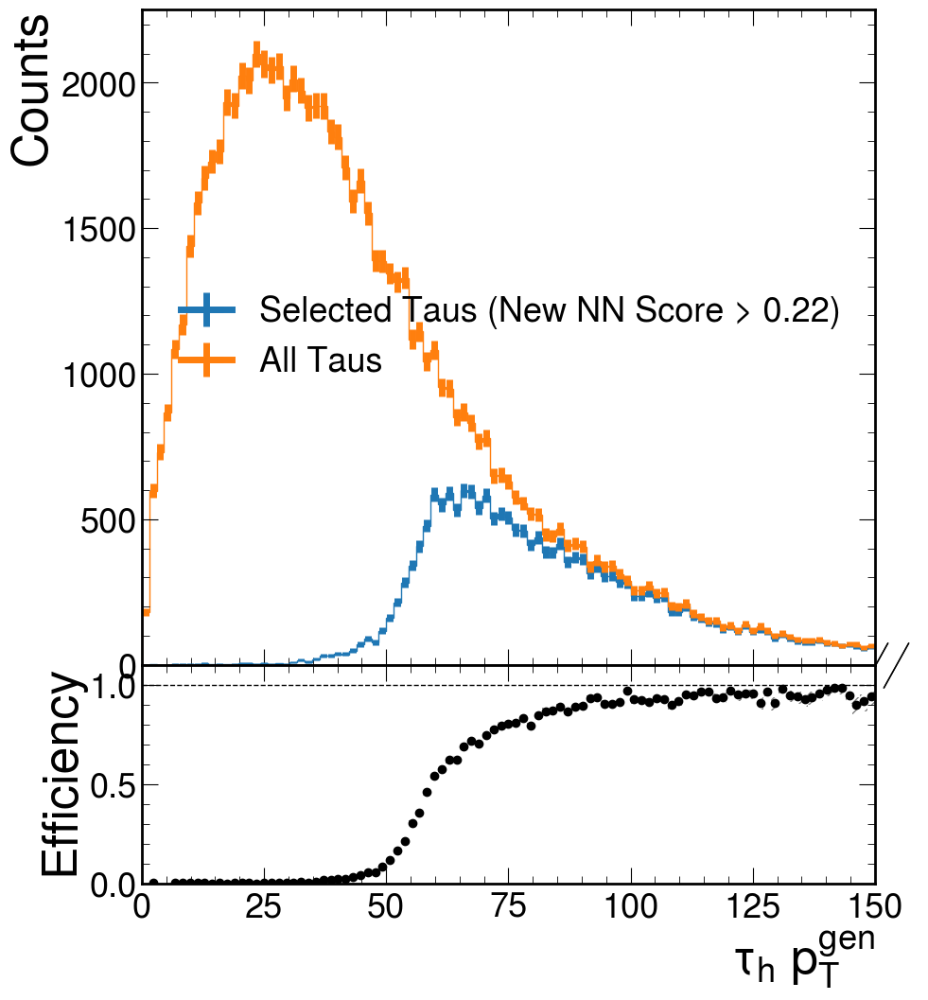

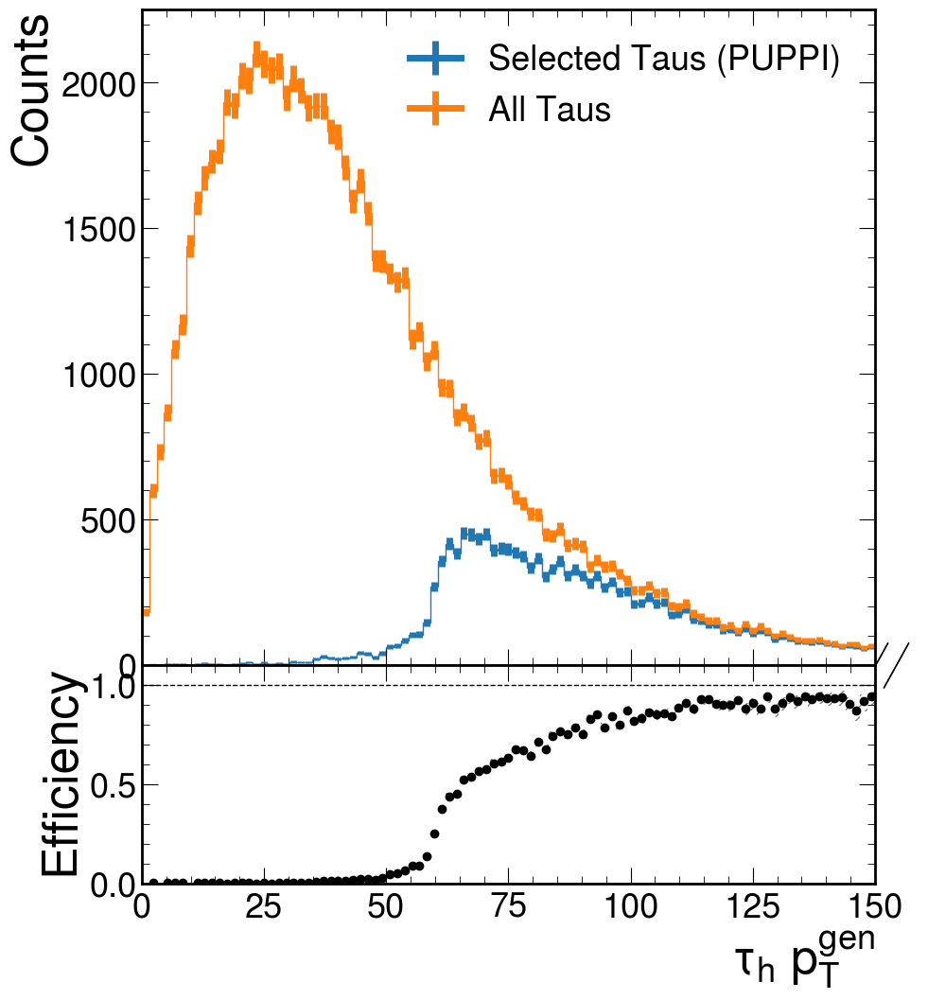

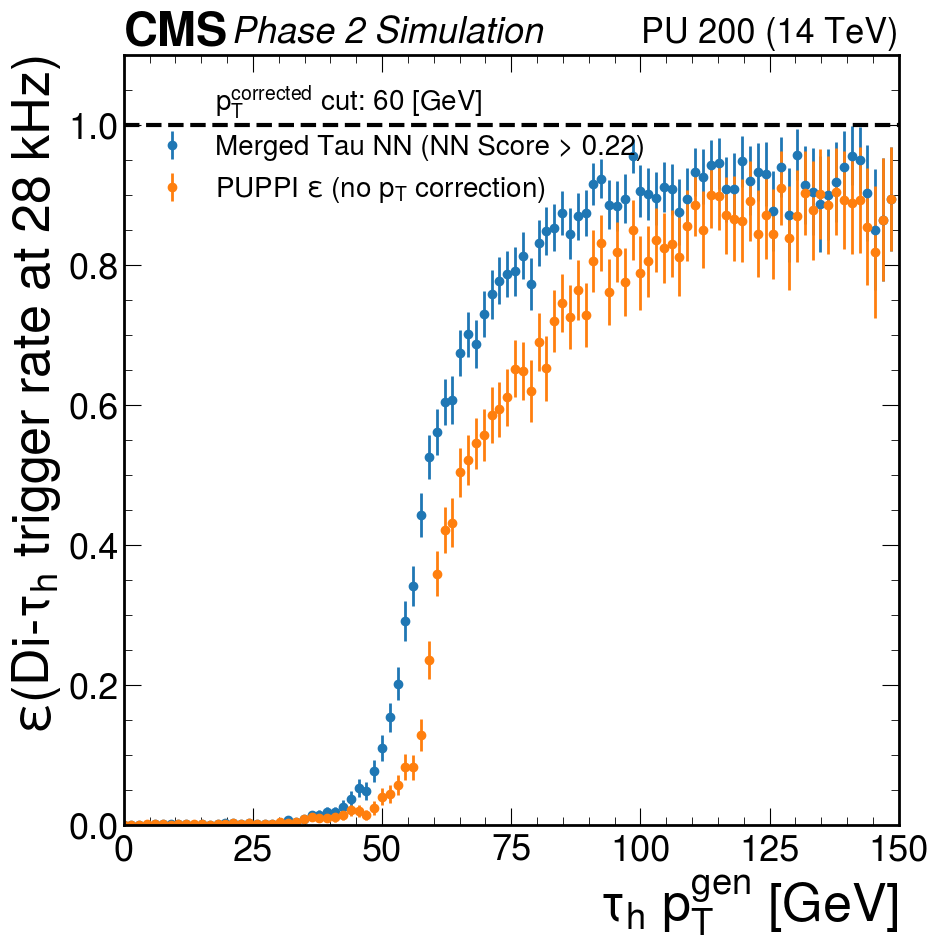

[0.00000000e+00 8.27538798e-02 0.00000000e+00 0.00000000e+00
 9.14792147e-02 5.87412651e-02 5.50410270e-03 2.33864301e-03
 7.03296244e-03 3.43015082e-04 2.20412948e-03 2.22054818e-04
 8.15295355e-04 3.61044947e-03 3.24418215e-03 5.88308610e-04
 2.80172033e-03 1.04244797e-03 1.50816000e-03 5.13417132e-04
 4.19833600e-03 8.09137997e-03 4.74606464e-03 1.00091452e-02
 1.70713843e-02 1.74337902e-02 2.12807520e-02 2.12845636e-02
 3.06806597e-02 4.43427403e-02 6.20213819e-02 5.63042322e-02
 8.84905883e-02 1.26607166e-01 1.73995596e-01 2.25824794e-01
 3.22883582e-01 3.83213031e-01 4.99283384e-01 5.75418786e-01
 6.23911588e-01 6.65551454e-01 6.76029849e-01 7.44982858e-01
 7.63285106e-01 7.61897236e-01 7.86567856e-01 8.16723131e-01
 8.40934855e-01 8.52381495e-01 8.47321835e-01 8.82723824e-01
 8.45710950e-01 9.04258216e-01 9.27374088e-01 9.02670071e-01
 9.43180267e-01 8.99990441e-01 9.49577391e-01 9.37580213e-01
 9.58666459e-01 9.70756562e-01 9.31542783e-01 9.51840232e-01
 9.36825479e-01 9.916750

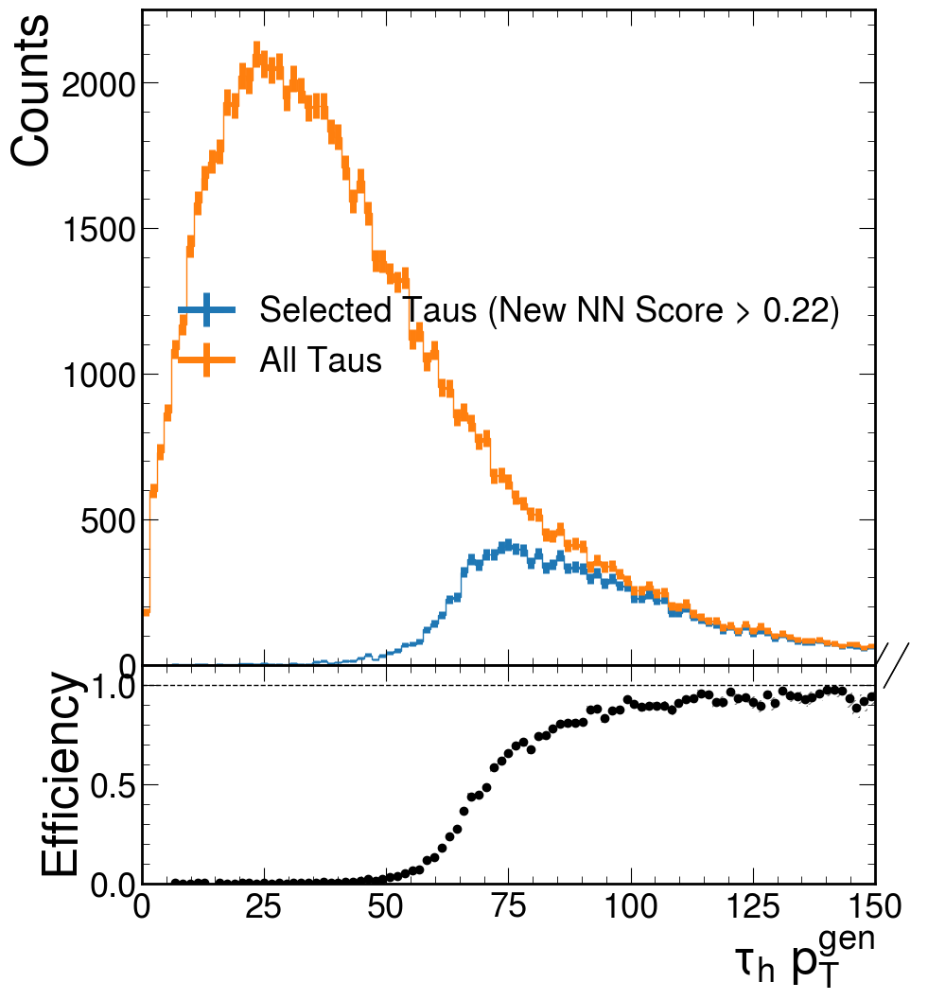

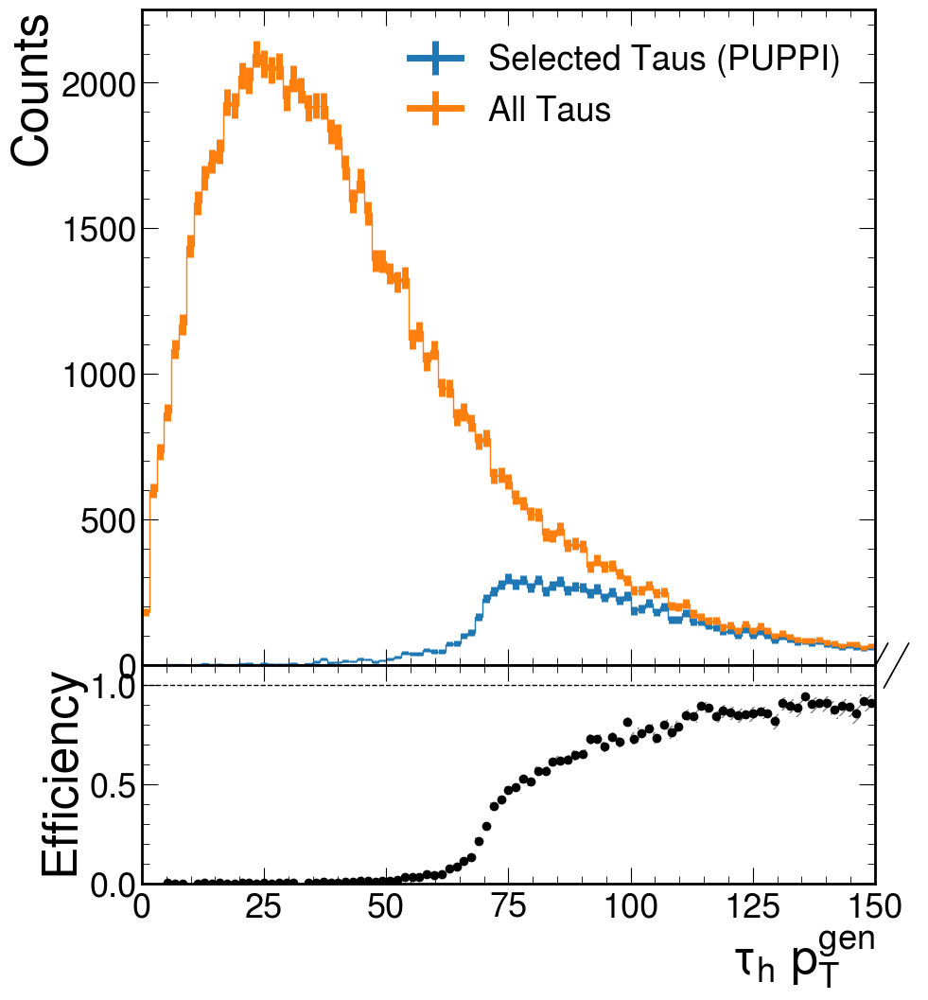

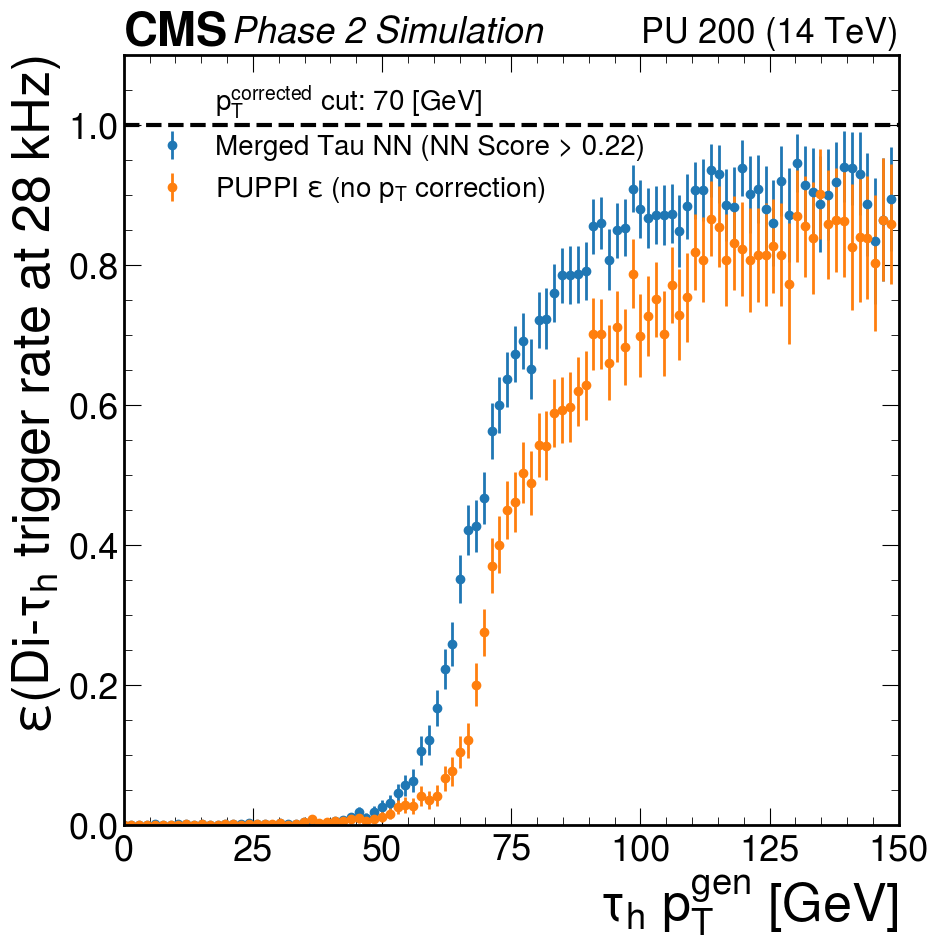

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 9.14792147e-02 1.43264125e-02 1.34244642e-03 2.33864301e-03
 3.38506113e-03 0.00000000e+00 1.14151015e-03 2.22054818e-04
 1.98857958e-04 2.07987924e-03 1.86888092e-03 5.88308610e-04
 2.80172033e-03 5.39886934e-04 9.88635694e-04 1.25227314e-04
 2.50904534e-03 4.75520874e-04 4.87497642e-04 4.69722307e-03
 6.32669063e-03 1.94291733e-03 3.49085092e-03 6.68747347e-03
 7.68433362e-03 1.24612056e-02 2.09873469e-02 1.15235266e-02
 2.06036525e-02 2.96732383e-02 3.55775224e-02 5.05298907e-02
 6.23361369e-02 7.09338232e-02 1.19622930e-01 1.32469406e-01
 1.85700364e-01 2.45680146e-01 2.87741680e-01 3.87906375e-01
 4.58621452e-01 4.74219438e-01 5.03392840e-01 6.06187622e-01
 6.48667954e-01 6.88890138e-01 7.21290992e-01 7.50016782e-01
 7.12166761e-01 7.84515030e-01 7.90633587e-01 8.03202535e-01
 8.46590484e-01 8.37680547e-01 8.59022955e-01 8.49057914e-01
 8.95391493e-01 9.04594713e-01 8.48914494e-01 9.14710233e-01
 8.93629061e-01 9.436154

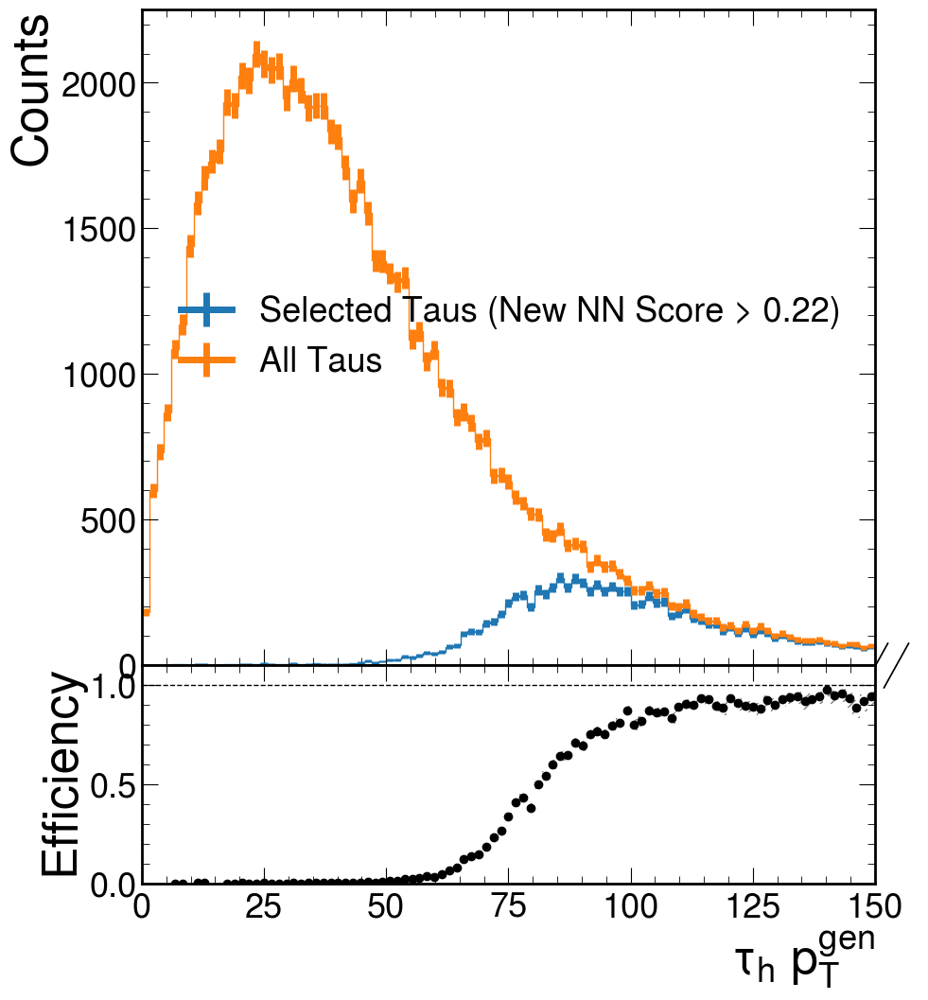

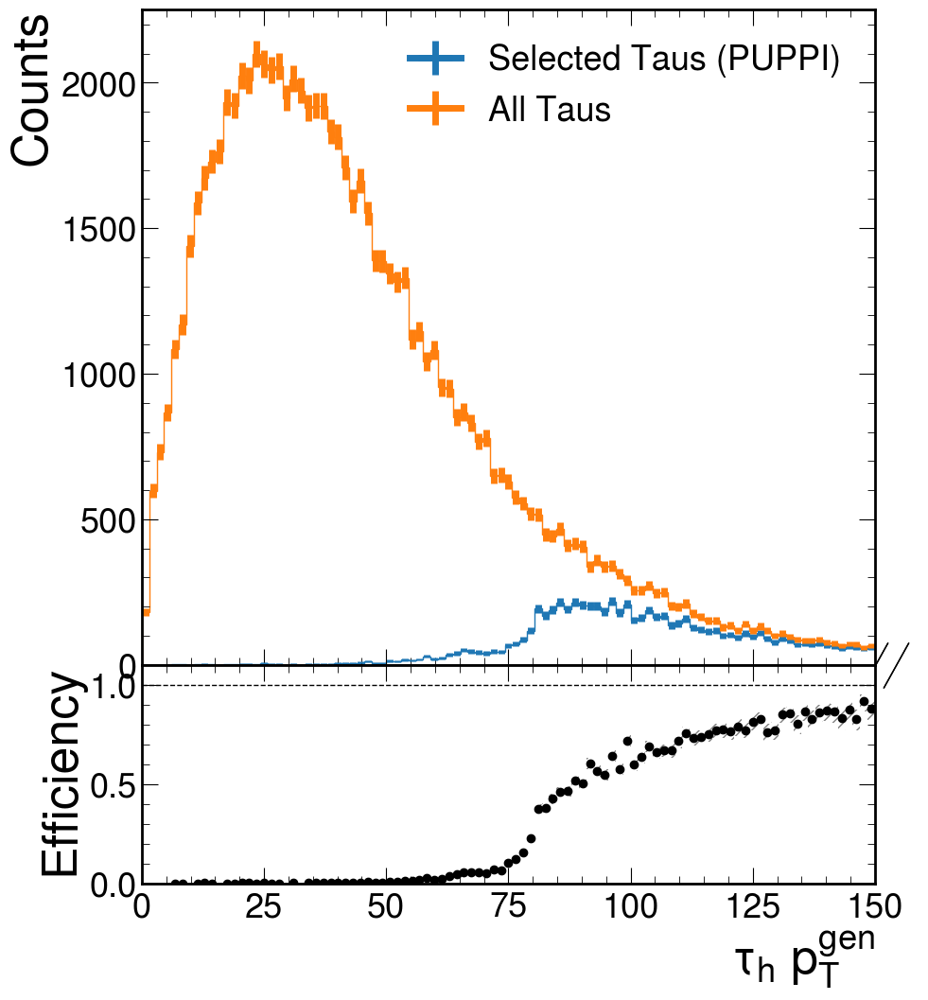

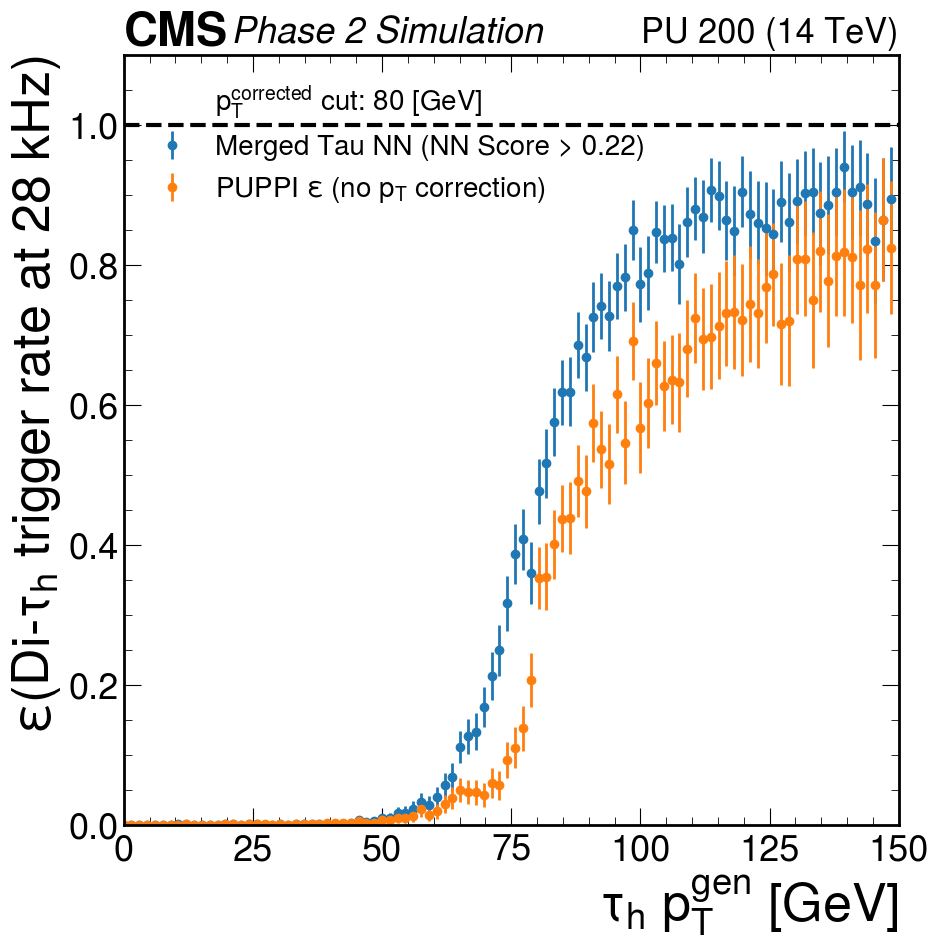

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.23105298e-02 1.43264125e-02 0.00000000e+00 2.33864301e-03
 3.38506113e-03 0.00000000e+00 0.00000000e+00 2.22054818e-04
 1.98857958e-04 1.36341014e-03 6.34479362e-04 1.43495298e-04
 2.19811463e-03 5.39886934e-04 1.24886764e-04 1.25227314e-04
 1.96849113e-03 1.15984246e-04 4.87497642e-04 1.42117633e-03
 4.74277981e-04 4.84320343e-04 9.12056329e-04 5.01287370e-04
 1.55460894e-03 3.17233184e-03 7.25716179e-03 3.68824635e-03
 6.48505638e-03 1.03111707e-02 1.11709680e-02 1.84373862e-02
 1.90255392e-02 2.59362003e-02 3.65581636e-02 3.14186110e-02
 4.38037461e-02 6.30770205e-02 7.61398998e-02 1.22640268e-01
 1.37777200e-01 1.47697914e-01 1.81461956e-01 2.29401257e-01
 2.69522512e-01 3.42930914e-01 4.14245837e-01 4.42876134e-01
 3.93521791e-01 5.17976963e-01 5.65214981e-01 6.08324500e-01
 6.66876300e-01 6.59509446e-01 7.48436562e-01 7.16124110e-01
 7.59449875e-01 7.79069898e-01 7.64620225e-01 8.28381635e-01
 8.19392125e-01 8.818528

In [9]:
# ============================================================ QUANTIZED, PRUNED, NN


results = plot_pt_eff_puppi(model_merged_quantized_pruned,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=0.,
                            cut_point = 0.22)
no_cut_x = np.asarray(results[0])
no_cut_y = np.asarray(results[1])


threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
gen_pT_list = []
for i in threshold_list:
    result = plot_pt_eff_puppi(model_merged_quantized_pruned,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=i,
                            cut_point = 0.22)
    cut_x = np.asarray(result[0])
    cut_y = np.asarray(result[1])
    y_norm = np.divide(cut_y, no_cut_y)
    print(y_norm)
    for i in range(10):
        if y_norm[i] == 1:
            y_norm[i] = 0
        else:
            break
    gen_pT_list.append(cut_x[y_norm > 0.95][0])
#gen_pT_list = [cut(i) for i in threshold_list]
gen_pT_list_quantized_pruned = gen_pT_list


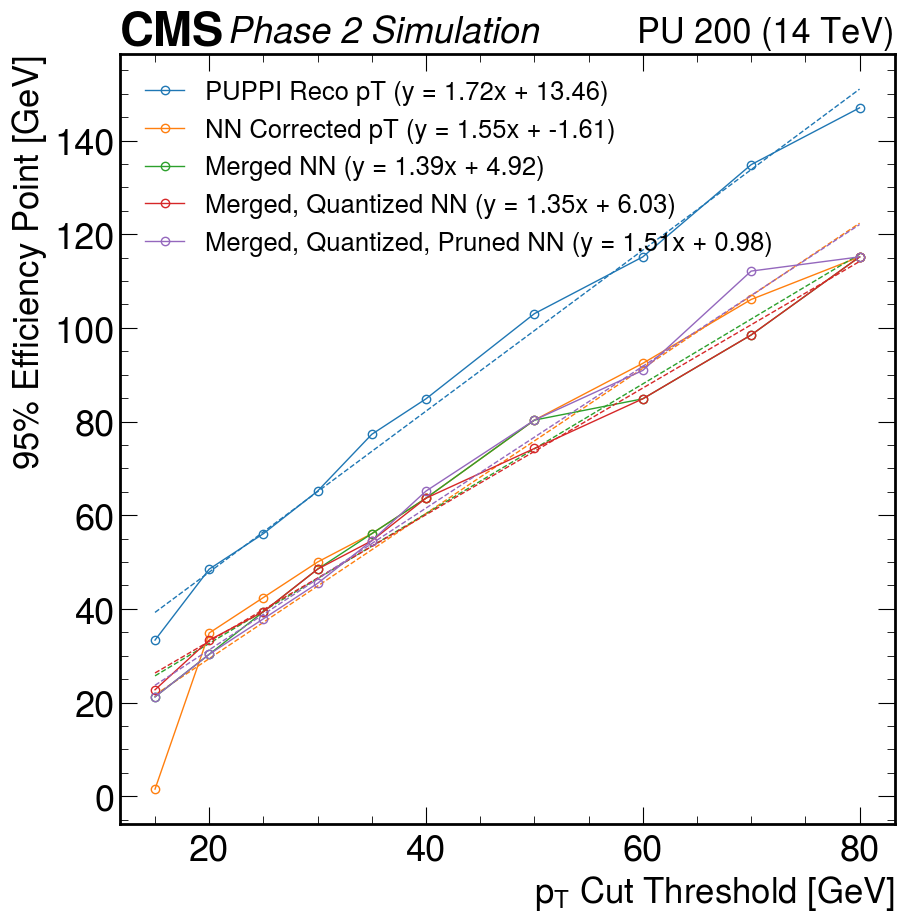

In [10]:
%matplotlib inline
threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
a, b = np.polyfit(threshold_list, gen_pT_list_merged, 1)
c, d = np.polyfit(threshold_list, gen_pT_list_no_nn, 1)
e, f = np.polyfit(threshold_list, gen_pT_list_quantized, 1)
g, h = np.polyfit(threshold_list, gen_pT_list_quantized_pruned, 1)
j, k = np.polyfit(threshold_list, gen_pT_list_nn_separate, 1)

fig = plt.figure()
plt.plot(threshold_list, [c*i + d for i in threshold_list], "--", linewidth = 1, color = "#1f77b4")
plt.plot(threshold_list, gen_pT_list_no_nn, "o-", fillstyle='none', linewidth = 1, label = "PUPPI Reco pT (y = " + str(round(c, 2)) + "x" + " + " + str(round(d, 2)) + ")", color = "#1f77b4")
plt.plot(threshold_list, [j*i + k for i in threshold_list], "--", linewidth = 1, color = "#ff7f0e")
plt.plot(threshold_list, gen_pT_list_nn_separate, "o-", fillstyle='none', linewidth = 1, label = "NN Corrected pT (y = " + str(round(j, 2)) + "x" + " + " + str(round(k, 2)) + ")", color = "#ff7f0e")
plt.plot(threshold_list, [a*i + b for i in threshold_list], "--", linewidth = 1, color = "#2ca02c")
plt.plot(threshold_list, gen_pT_list_merged, "o-", fillstyle='none', linewidth = 1, label = "Merged NN (y = " + str(round(a, 2)) + "x" + " + " + str(round(b, 2)) + ")", color = "#2ca02c")
plt.plot(threshold_list, [e*i + f for i in threshold_list], "--", linewidth = 1, color = "#d62728")
plt.plot(threshold_list, gen_pT_list_quantized, "o-", fillstyle='none', linewidth = 1, label = "Merged, Quantized NN (y = " + str(round(e, 2)) + "x" + " + " + str(round(f, 2)) + ")", color = "#d62728")
plt.plot(threshold_list, [g*i + h for i in threshold_list], "--", linewidth = 1, color = "#9467bd")
plt.plot(threshold_list, gen_pT_list_quantized_pruned, "o-", fillstyle='none', linewidth = 1, label = "Merged, Quantized, Pruned NN (y = " + str(round(g, 2)) + "x" + " + " + str(round(h, 2)) + ")", color = "#9467bd")

#plt.xlim([20,85])
#plt.xlim([20,85])
hep.cms.text("Phase 2 Simulation")
hep.cms.lumitext("PU 200 (14 TeV)")
plt.xlabel(r"$p_T$ Cut Threshold [GeV]", fontsize = 25)
plt.ylabel(r"$95\%$ Efficiency Point [GeV]", fontsize = 25)
plt.legend(loc = 'upper left', fontsize = 18.5)
#plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()
    